In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})

In [2]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [3]:
import visual_behavior.data_access.utilities as utilities
from visual_behavior.data_access import loading as loading

import visual_behavior.visualization.utils as utils
import visual_behavior.visualization.ophys.platform_paper_figures as ppf

from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

In [4]:
experience_levels = utils.get_new_experience_levels()
colors = utils.get_experience_level_colors()
cell_types = utils.get_cell_types()

### load experiments and cells tables

In [5]:
from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

platform_cache_dir = loading.get_platform_analysis_cache_dir()
cache = VisualBehaviorOphysProjectCache.from_s3_cache(cache_dir = platform_cache_dir)
experiments_table = cache.get_ophys_experiment_table()
print(len(experiments_table))

1936


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


In [6]:
# metadata tables
experiments_table = pd.read_csv(os.path.join(platform_cache_dir, 'all_ophys_experiments_table.csv'), index_col=0)
platform_experiments = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_experiments_table.csv'), index_col=0)
platform_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_cells_table.csv'), index_col=0)
matched_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_matched_ophys_cells_table.csv'), index_col=0)

# ### Define model version
# glm_version = '24_events_all_L2_optimize_by_session'
 
# # glm outputs
# run_params = pd.read_pickle(os.path.join(platform_cache_dir, 'glm_results', glm_version+'_run_params.pkl'))
# all_weights_df = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'weights_df.h5'), key='df')
# all_results = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'all_results.h5'), key='df')
# all_results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'results_pivoted.h5'), key='df')

# # # split out csid and oeid for results table
# # all_results['cell_specimen_id'] = [int(identifier.split('_')[1]) for identifier in all_results.identifier.values]
# # all_results['ophys_experiment_id'] = [int(identifier.split('_')[0]) for identifier in all_results.identifier.values]

# # # get results and weights just for platform paper experiments
# # results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'platform_results_pivoted.h5'), key='df')
# weights_df = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'platform_results_weights_df.h5'), key='df')
# results_pivoted = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'across_session_normalized_platform_results_pivoted.h5'), key='df')
# now drop ophys_experiment_id
# results_pivoted = results_pivoted.drop(columns=['ophys_experiment_id'])

# clustering results
# feature_matrix = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'clustering_feature_matrix.h5'), key='df')
# cluster_meta = pd.read_hdf(os.path.join(platform_cache_dir, 'glm_results', 'cluster_meta.h5'), key='df')

# get lists of matched cells and expts
matched_cells = matched_cells_table.cell_specimen_id.unique()
matched_experiments = matched_cells_table.ophys_experiment_id.unique()

# get cre_lines and cell types for plot labels
cre_lines = np.sort(platform_cells_table.cre_line.unique())
cell_types = utilities.get_cell_types_dict(cre_lines, platform_experiments)


In [7]:
print(len(experiments_table.mouse_id.unique()), 'mice')
print(len(experiments_table.ophys_container_id.unique()), 'containers')
print(len(experiments_table.index.unique()), 'experiments')

107 mice
326 containers
1936 experiments


In [8]:
print(len(platform_experiments.mouse_id.unique()), 'mice')
print(len(platform_experiments.ophys_container_id.unique()), 'containers')
print(len(platform_experiments.index.unique()), 'experiments')

66 mice
134 containers
402 experiments


### get useful info

In [9]:
palette = utilities.get_experience_level_colors()

In [10]:
save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final'

folder = 'figure_2'

## load multi_session_dfs 

In [11]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

inclusion_criteria = 'platform_experiment_table'

In [12]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

multi_session_df = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

# limit to changes, convert experience level and merge with cluster IDs
change_mdf = multi_session_df[multi_session_df.is_change==True]

# limit to non-changes, convert experience level and merge with cluster IDs
image_mdf = multi_session_df[(multi_session_df.is_change==False)]


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_platform_experiment_table.pkl


In [ ]:
multi_session_df.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [ ]:
# change_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in change_mdf.experience_level.values]

In [ ]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
400 experiments
14493 cells


In [ ]:
# limit to platform paper expts
image_mdf = image_mdf[image_mdf.ophys_experiment_id.isin(platform_experiments.index.values)]
change_mdf = change_mdf[change_mdf.ophys_experiment_id.isin(platform_experiments.index.values)]

In [ ]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
400 experiments
14493 cells


In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

omission_mdf = omission_mdf[omission_mdf.omitted==True]


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_omitted_platform_experiment_table.pkl


there are 1879 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


In [ ]:
print(len(omission_mdf.mouse_id.unique()), 'mice')
print(len(omission_mdf.ophys_container_id.unique()), 'containers')
print(len(omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
401 experiments
14494 cells


### per image mdf

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change', 'image_name']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

each_image_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_image_name_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_image_name_platform_experiment_table.pkl


there are 1885 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


## population averages & heatmaps of cell responses

### images

In [ ]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

# set inclusion criteria
# options: ['active_only', 'closest_familiar_and_novel', 'containers_with_all_levels']
# inclusion_criteria = 'platform_experiment_table'
inclusion_criteria = 'platform_experiment_table'

In [ ]:
folder = 'population_averages'

267


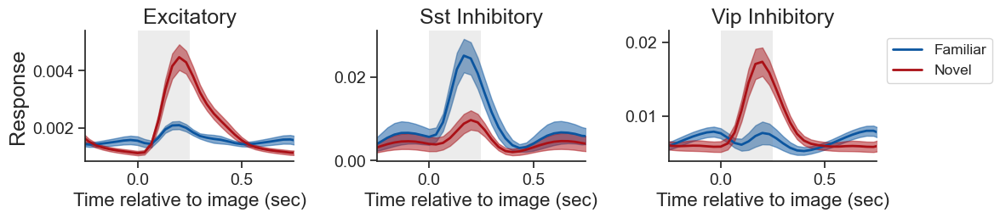

In [ ]:
df = image_mdf.copy()
# for just familiar & novel (no novel+)
df = df[df.ophys_experiment_id.isin(platform_experiments.index.values)]
df = df[df.experience_level.isin(['Familiar', 'Novel'])]
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images_F_N'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column, 
                                                        horizontal=True, xlabel='Time relative to image (sec)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


400


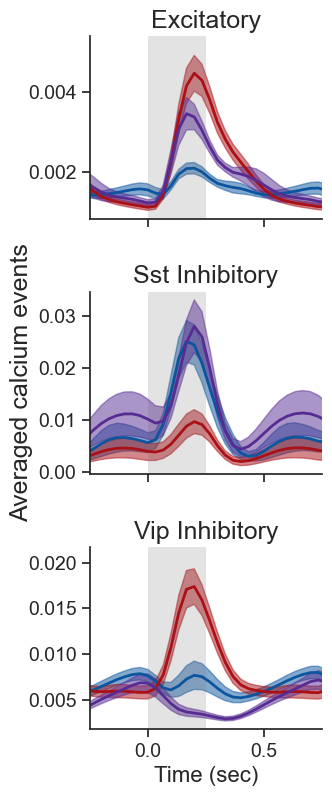

In [ ]:
# with Novel +
df = image_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-0.25, 0.75]

suffix = '_images'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'all', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time (sec)',
                                                    ylabel='Averaged calcium events', legend=False,
                                                    xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                    palette=palette, ax=None, title=None, suptitle=None,
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Sst Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Vip Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}, xlabel='Time relative to image onset (sec)'>,
       <Axes: title={'center': 'Novel +'}>], dtype=object)

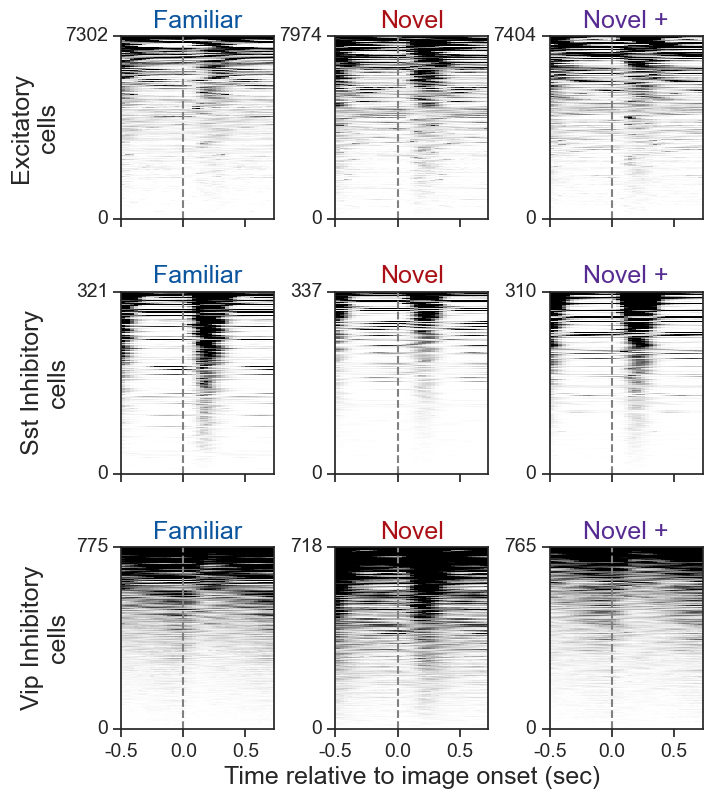

In [ ]:
df = image_mdf.copy()

xlim_seconds = [-0.5, 0.75]

event_type = 'all'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type, row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time relative to image onset (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Sst Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Vip Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}, xlabel='Time relative to image onset (sec)'>,
       <Axes: title={'center': 'Novel +'}>], dtype=object)

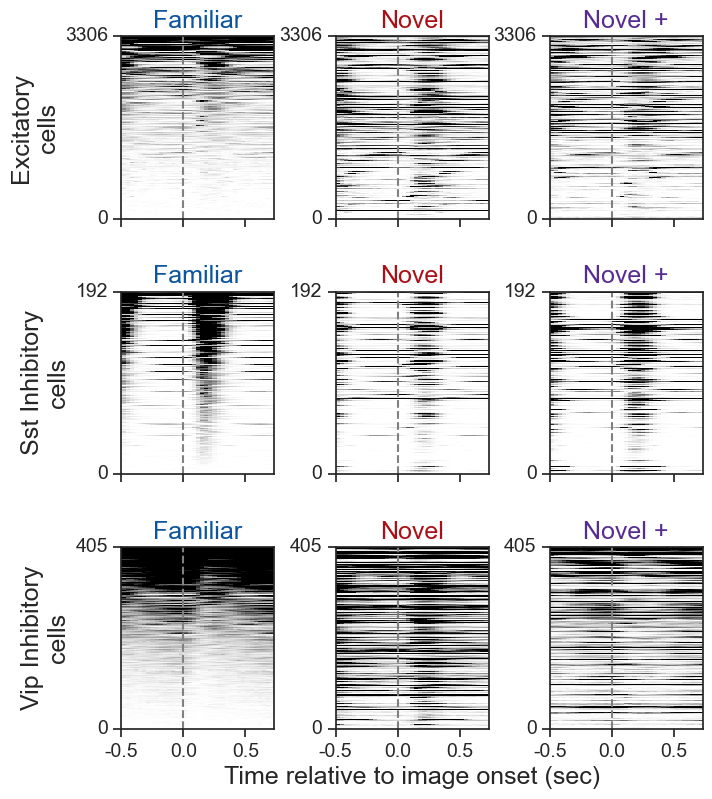

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-0.5, 0.75]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'all', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time relative to image onset (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


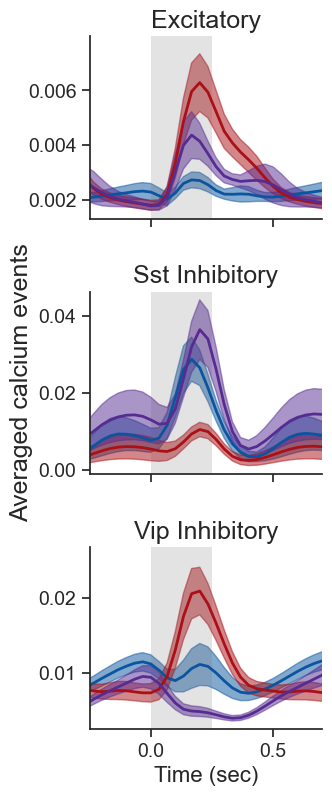

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(image_mdf)
xlim_seconds = [-0.25, 0.7]

suffix = '_images_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'all', axes_column, hue_column,
                                                    horizontal=False, xlabel='Time (sec)',
                                                    ylabel='Averaged calcium events', legend=False,
                                                    xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                    palette=palette, ax=None, title=None, suptitle=None,
                                                    save_dir=save_dir, folder=folder, suffix=suffix)


## changes

400


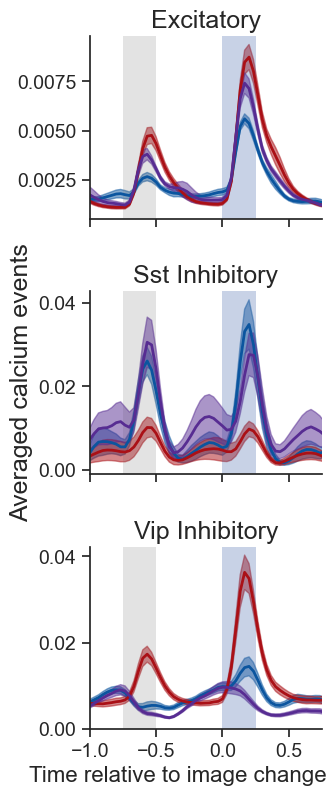

In [ ]:
# with Novel +
df = change_mdf.copy()
# for just familiar & novel (no novel+)
# df = df[df.experience_level.isin(['Familiar', 'Novel 1'])]
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-1, 0.75]

suffix = '_changes'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes', axes_column, hue_column, ylabel='Averaged calcium events',
                                                        horizontal=False, xlabel='Time relative to image change (sec)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5, legend=False,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Sst Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Vip Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}, xlabel='Time relative to change (sec)'>,
       <Axes: title={'center': 'Novel +'}>], dtype=object)

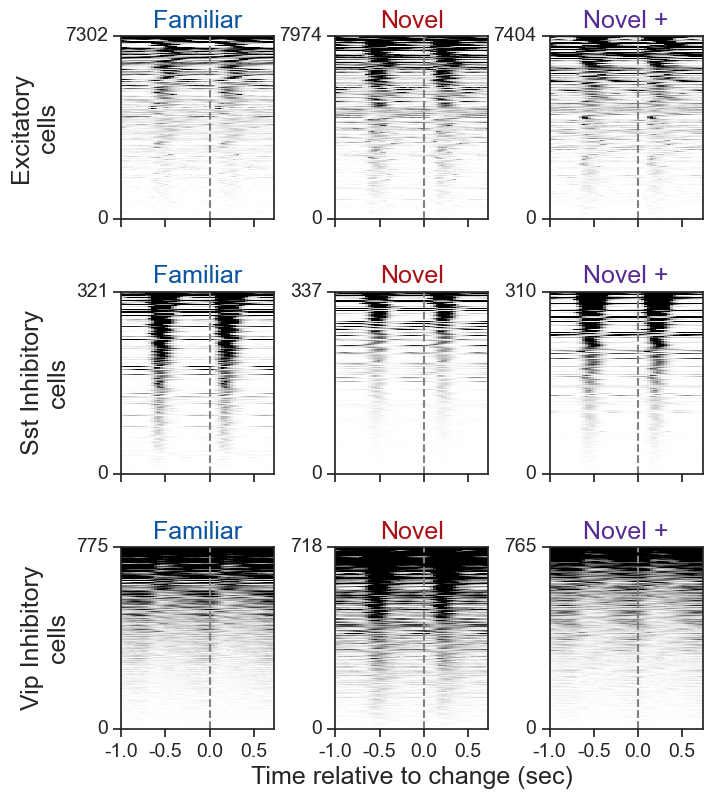

In [ ]:
df = image_mdf.copy()

xlim_seconds = [-1, 0.75]

event_type = 'all'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type, row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time relative to change (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)

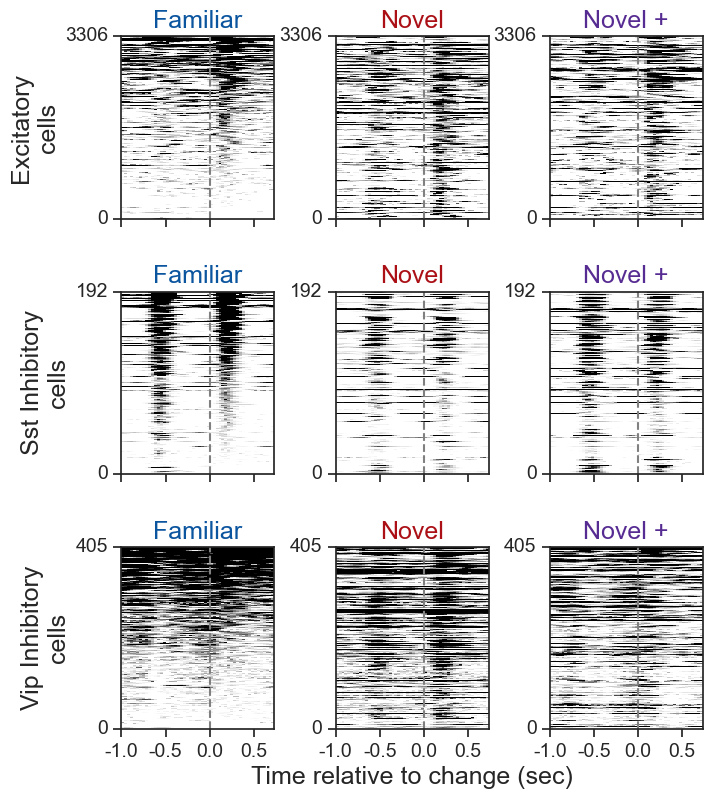

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)
xlim_seconds = [-1, 0.75]


ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'all', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time relative to change (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None);


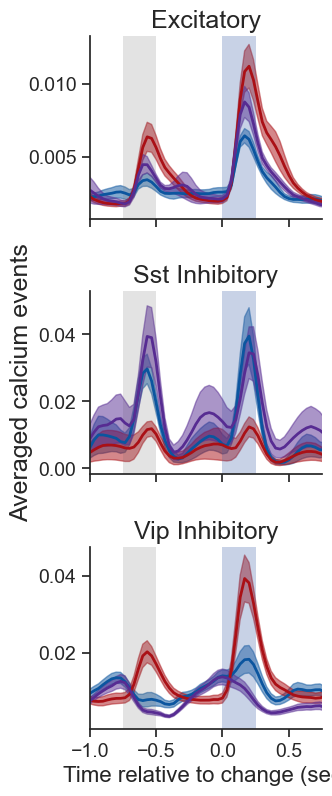

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)
xlim_seconds = [-1, 0.75]

suffix = '_changes_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'changes', axes_column, hue_column, 
                                                        ylabel='Averaged calcium events', legend=False,
                                                        horizontal=False, xlabel='Time relative to change (sec)',
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


### omissions

401


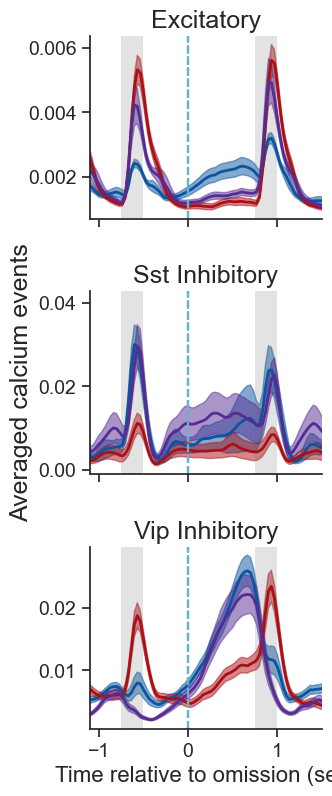

In [ ]:

df = omission_mdf.copy()
print(len(df.ophys_experiment_id.unique()))

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.1, 1.5]

suffix = '_omissions'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions', axes_column, hue_column, 
                                                ylabel='Averaged calcium events', legend=False,
                                                horizontal=False, xlabel='Time relative to omission (sec)',
                                                xlim_seconds=xlim_seconds, interval_sec=1,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=save_dir, folder=folder, suffix=suffix)


array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Sst Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Vip Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}, xlabel='Time relative to omission (sec)'>,
       <Axes: title={'center': 'Novel +'}>], dtype=object)

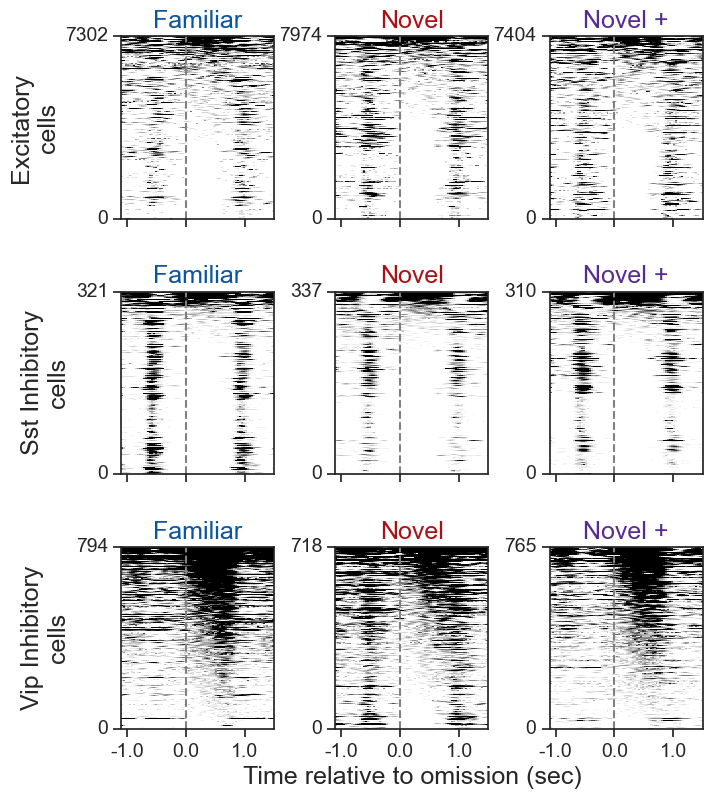

In [ ]:
df = omission_mdf.copy()

xlim_seconds = [-1.1, 1.5]

timestamps = df.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=cols_to_sort_by, suptitle='', xlabel='Time relative to omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


# ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
#                                           row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
#                                           microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
#                                           save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<Axes: title={'center': 'Familiar'}, ylabel='Excitatory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Sst Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}>,
       <Axes: title={'center': 'Novel +'}>,
       <Axes: title={'center': 'Familiar'}, ylabel='Vip Inhibitory\ncells'>,
       <Axes: title={'center': 'Novel'}, xlabel='Time relative to omission (sec)'>,
       <Axes: title={'center': 'Novel +'}>], dtype=object)

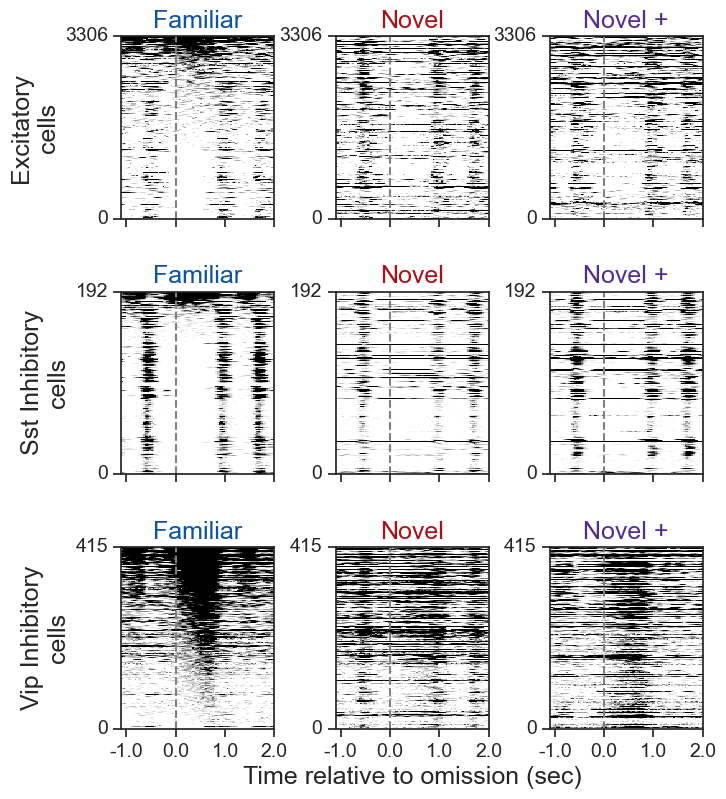

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds = [-1.1, 2]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time relative to omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


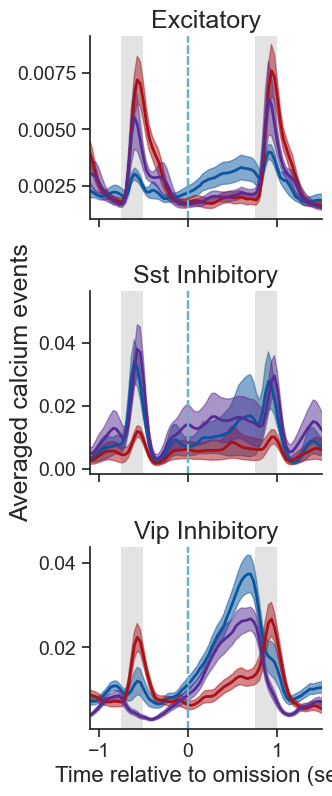

In [ ]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds = [-1.1, 1.5]
suffix = '_omissions_matched'

ax = ppf.plot_population_averages_for_conditions(matched, data_type, 'omissions', axes_column, hue_column, 
                                                horizontal=False, xlabel='Time relative to omission (sec)',
                                                ylabel='Averaged calcium events', legend=False,
                                                xlim_seconds=xlim_seconds, interval_sec=1,
                                                palette=palette, ax=None, title=None, suptitle=None,
                                                save_dir=save_dir, folder=folder, suffix=suffix)


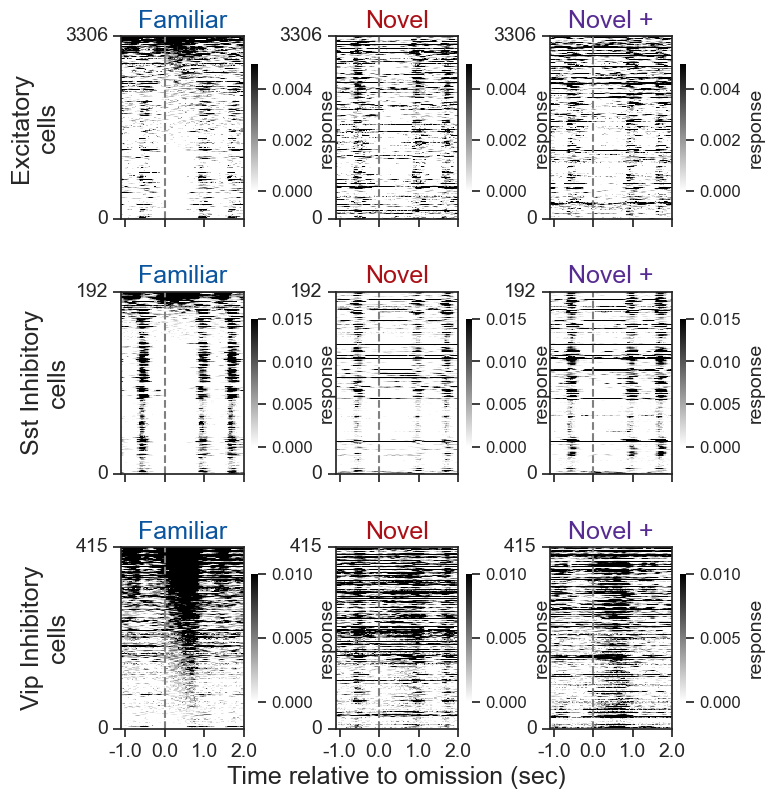

In [ ]:
timestamps = omission_mdf.trace_timestamps.values[0]
timestamps = np.asarray([np.round(time,3) for time in timestamps])

matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)
xlim_seconds = [-1.1, 2]

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'omissions', row_condition, col_condition, 
                                          cols_to_sort_by=None, suptitle='', xlabel='Time relative to omission (sec)',
                                          microscope=None, vmax=None, xlim_seconds=xlim_seconds, match_cells=True, cbar=True,
                                          save_dir=save_dir, folder=folder, suffix='_cbar', ax=None);


### clustering timeseries

In [ ]:
# from scipy.stats import zscore as zscore
# from sklearn.cluster import KMeans
# from visual_behavior.dimensionality_reduction import clustering as vba_clust


# matrix = np.vstack(mdf.mean_trace.values)
# timestamps = mdf.trace_timestamps.values[0]

# df = pd.DataFrame(data=matrix, index=mdf.cell_specimen_id.unique(), columns=timestamps)

# zdf = pd.DataFrame(data=zscore(df.values, axis=1), index=mdf.cell_specimen_id.unique(), columns=timestamps)


# # X = df.copy()
# X = zdf.copy()

# # fig, ax = plt.subplots(2, 1, figsize=(6, 10))
# # vba_clust.get_elbow_plots(X, n_clusters=np.arange(2, 15), ax=ax)
# # fig.tight_layout()

# kmeans = KMeans(n_clusters=3, random_state=0).fit(X)

# labels = kmeans.labels_
# sort_order = np.argsort(labels)
# sorted_labels = labels[sort_order]

# cluster_zdf = zdf.copy()
# cluster_zdf['cluster_id'] = labels

# cluster_df = df.copy()
# cluster_df['cluster_id'] = labels


# fig, ax = plt.subplots(figsize=(5,8))
# ax = sns.heatmap(zdf.iloc[sort_order], cmap='RdBu_r', ax=ax, center=0,
#                  robust=True, cbar_kws={"drawedges": False, "shrink": 0.7, "label": 'z-score'})
# ax.set_ylabel('cells')
# ax.set_xlabel('features')
# # ax.set_title('sorted dropout scores')
# ax.set_ylim(0, zdf.shape[0])
# ax.set_xlim(0, zdf.shape[1])
# ax.set_xticks(np.arange(0, zdf.shape[1], 13));
# ax.set_xticklabels(zdf.keys()[::13], rotation=90)
# # ax.set_xticklabels([key[1]+' - '+key[0] for key in list(df.keys())], rotation=90);
# # ax.set_xticklabels([key[0]+' - '+key[1] for key in list(df.keys())], rotation=90);
# ax.set_yticks([0, len(zdf)])
# ax.set_yticklabels([0, len(zdf)])
# # ax.set_xlabel('')

# cluster_divisions = np.where(np.diff(sorted_labels)==1)[0]
# for y in cluster_divisions:
#     ax.hlines(y, xmin=0, xmax=zdf.shape[1], color='w')
    
# # ax.set_yticks(np.hstack([np.asarray(0), cluster_divisions])+5);
# # ax.set_yticklabels(np.sort(cluster_df.cluster_id.unique()));
# # ax.set_ylabel('cluster ID')

### fraction responsive cells 

In [ ]:
folder = 'response_metrics'

In [ ]:
image_mdf

,cell_specimen_id,is_change,mean_response,sem_response,mean_trace,sem_trace,trace_timestamps,mean_responses,mean_baseline,sem_baseline,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
0,1120089909,False,0.003238,0.000252,"[0.001224124315155142, 0.0011185118091320441, ...","[0.00035678355796525305, 0.0003291239414641699...","[-2.0, -1.9666666666665171, -1.933333333333332...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.001027,0.000144,...,lower,VISp_lower,20210202,False,-2.0,False,True,False,False,Familiar 0
2,1120089920,False,0.086154,0.004198,"[0.0949257668825331, 0.08465407240123858, 0.06...","[0.007915679231332295, 0.006987736729198617, 0...","[-2.0, -1.9666666666665171, -1.933333333333332...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.038311,0.002033,...,lower,VISp_lower,20210202,False,-2.0,False,True,False,False,Familiar 0
4,1120089959,False,0.003329,0.000249,"[0.0048204292234915735, 0.004372458692421905, ...","[0.0007276530344694337, 0.0006438954680307884,...","[-2.0, -1.9666666666665171, -1.933333333333332...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.001914,0.000173,...,lower,VISp_lower,20210202,False,-2.0,False,True,False,False,Familiar 0
6,1120089971,False,0.014905,0.000902,"[0.0037666612558046346, 0.0030909977579257264,...","[0.0009218739410338407, 0.0007635210665505919,...","[-2.0, -1.9666666666665171, -1.933333333333332...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.001699,0.000189,...,lower,VISp_lower,20210202,False,-2.0,False,True,False,False,Familiar 0
8,1120089993,False,0.011433,0.000635,"[0.010858433172648804, 0.009878727719097051, 0...","[0.0014456121443382581, 0.0013125787974424127,...","[-2.0, -1.9666666666665171, -1.933333333333332...","[0.0, 0.0, 0.0, 0.18142783762650475, 0.0, 0.0,...",0.004307,0.000335,...,lower,VISp_lower,20210202,False,-2.0,False,True,False,False,Familiar 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51802,1086615671,False,0.000192,0.000025,"[0.0002826975558153454, 0.00033674182454242007...","[0.0001433165507540449, 0.0001317719023507154,...","[-2.0, -1.9666666666665198, -1.933333333333328...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000231,0.000030,...,upper,VISp_upper,20201005,False,2.0,False,False,False,True,Novel 2
51804,1086615718,False,0.000131,0.000029,"[3.433584231514172e-05, 5.4504106776233316e-06...","[3.433203800043054e-05, 5.449806787457246e-06,...","[-2.0, -1.9666666666665198, -1.933333333333328...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000124,0.000026,...,upper,VISp_upper,20201005,False,2.0,False,False,False,True,Novel 2
51806,1086615796,False,0.000047,0.000014,"[0.0, 2.0911718940378676e-05, 6.95971667067923...","[0.0, 2.0909401980766513e-05, 5.53832022892580...","[-2.0, -1.9666666666665198, -1.933333333333328...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000053,0.000015,...,upper,VISp_upper,20201005,False,2.0,False,False,False,True,Novel 2
51808,1086616022,False,0.000170,0.000028,"[0.0001269949161509224, 0.0003052493701459811,...","[0.00012698084547156454, 0.0001649222616407976...","[-2.0, -1.9666666666665198, -1.933333333333328...","[0.0, 0.0, 0.0, 0.0, 0.009483784439179454, 0.0...",0.000315,0.000042,...,upper,VISp_upper,20201005,False,2.0,False,False,False,True,Novel 2


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='fraction image responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

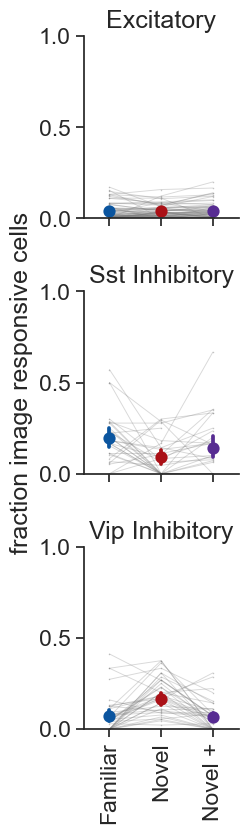

In [ ]:
ppf.plot_fraction_responsive_cells(image_mdf, responsiveness_threshold=0.1, ylim=(0,1), ylabel='fraction image responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_images', horizontal=False, ax=None)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='fraction change responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

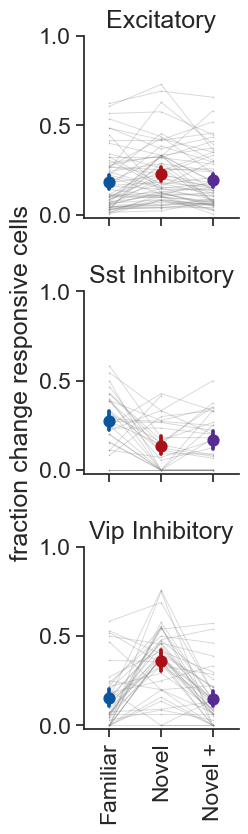

In [ ]:
ppf.plot_fraction_responsive_cells(change_mdf, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='fraction change responsive cells',
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='fraction omission responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

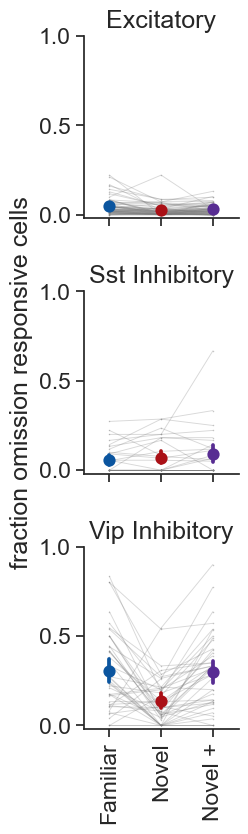

In [ ]:
ppf.plot_fraction_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='fraction omission responsive cells',
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)


### get cell response metrics table

In [ ]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm
import visual_behavior.dimensionality_reduction.clustering.processing as processing


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


In [ ]:
data_type = 'filtered_events'

session_subset = 'full_session'
    
inclusion_criteria = 'platform_experiment_table'

filtered_events_metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type=data_type, session_subset=session_subset,
                                                inclusion_criteria=inclusion_criteria, save_dir=os.path.join(save_dir, folder))

# original_metrics_table = metrics_table.copy()


filepath: \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final\response_metrics\merged_model_free_metrics_table_filtered_events_platform_experiment_table.csv


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_images_all_images_full_session_filtered_events.h5


  0%|          | 2/402 [00:00<01:57,  3.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_images_all_images_full_session_filtered_events.h5


  1%|          | 4/402 [00:00<01:19,  4.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_images_all_images_full_session_filtered_events.h5


  1%|          | 5/402 [00:01<01:10,  5.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_images_all_images_full_session_filtered_events.h5


  2%|▏         | 7/402 [00:01<01:40,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_images_all_images_full_session_filtered_events.h5


  2%|▏         | 9/402 [00:02<01:43,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_images_all_images_full_session_filtered_events.h5


  3%|▎         | 11/402 [00:02<01:22,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_images_all_images_full_session_filtered_events.h5


  3%|▎         | 12/402 [00:02<01:19,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_images_all_images_full_session_filtered_events.h5


  3%|▎         | 13/402 [00:03<01:41,  3.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_images_all_images_full_session_filtered_events.h5


  4%|▎         | 15/402 [00:03<01:37,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_images_all_images_full_session_filtered_events.h5


  4%|▍         | 17/402 [00:04<01:54,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_images_all_images_full_session_filtered_events.h5


  4%|▍         | 18/402 [00:05<02:49,  2.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_images_all_images_full_session_filtered_events.h5


  5%|▍         | 20/402 [00:05<02:10,  2.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_images_all_images_full_session_filtered_events.h5


  5%|▌         | 22/402 [00:06<01:35,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_images_all_images_full_session_filtered_events.h5


  6%|▌         | 23/402 [00:06<01:25,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_images_all_images_full_session_filtered_events.h5


  6%|▌         | 24/402 [00:06<01:32,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_images_all_images_full_session_filtered_events.h5


  6%|▌         | 25/402 [00:06<01:35,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_images_all_images_full_session_filtered_events.h5


  6%|▋         | 26/402 [00:07<02:26,  2.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_images_all_images_full_session_filtered_events.h5


  7%|▋         | 27/402 [00:07<02:08,  2.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_images_all_images_full_session_filtered_events.h5


  7%|▋         | 29/402 [00:08<01:40,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_images_all_images_full_session_filtered_events.h5


  8%|▊         | 31/402 [00:08<01:25,  4.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_images_all_images_full_session_filtered_events.h5


  8%|▊         | 32/402 [00:08<01:20,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_images_all_images_full_session_filtered_events.h5


  8%|▊         | 34/402 [00:09<01:01,  5.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_images_all_images_full_session_filtered_events.h5


  9%|▉         | 36/402 [00:09<00:56,  6.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_images_all_images_full_session_filtered_events.h5


  9%|▉         | 38/402 [00:09<01:06,  5.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_images_all_images_full_session_filtered_events.h5


 10%|▉         | 39/402 [00:10<01:43,  3.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_images_all_images_full_session_filtered_events.h5


 10%|█         | 41/402 [00:10<01:33,  3.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_images_all_images_full_session_filtered_events.h5


 11%|█         | 43/402 [00:11<01:42,  3.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_images_all_images_full_session_filtered_events.h5


 11%|█         | 44/402 [00:11<01:26,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_images_all_images_full_session_filtered_events.h5


 11%|█▏        | 46/402 [00:12<01:28,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_images_all_images_full_session_filtered_events.h5


 12%|█▏        | 48/402 [00:12<01:08,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_images_all_images_full_session_filtered_events.h5


 12%|█▏        | 50/402 [00:12<01:15,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_images_all_images_full_session_filtered_events.h5


 13%|█▎        | 52/402 [00:13<00:55,  6.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_images_all_images_full_session_filtered_events.h5


 13%|█▎        | 53/402 [00:13<00:59,  5.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_images_all_images_full_session_filtered_events.h5


 13%|█▎        | 54/402 [00:13<01:07,  5.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_images_all_images_full_session_filtered_events.h5


 14%|█▍        | 56/402 [00:13<01:05,  5.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_images_all_images_full_session_filtered_events.h5


 14%|█▍        | 58/402 [00:14<01:17,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_images_all_images_full_session_filtered_events.h5


 15%|█▍        | 60/402 [00:15<01:15,  4.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_images_all_images_full_session_filtered_events.h5


 15%|█▌        | 62/402 [00:15<01:01,  5.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_images_all_images_full_session_filtered_events.h5


 16%|█▌        | 63/402 [00:15<01:00,  5.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_images_all_images_full_session_filtered_events.h5


 16%|█▌        | 65/402 [00:15<01:01,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_images_all_images_full_session_filtered_events.h5


 17%|█▋        | 67/402 [00:16<00:57,  5.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_images_all_images_full_session_filtered_events.h5


 17%|█▋        | 68/402 [00:16<00:51,  6.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_images_all_images_full_session_filtered_events.h5


 17%|█▋        | 70/402 [00:16<00:52,  6.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_images_all_images_full_session_filtered_events.h5


 18%|█▊        | 72/402 [00:16<00:46,  7.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_images_all_images_full_session_filtered_events.h5


 18%|█▊        | 74/402 [00:17<01:20,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_images_all_images_full_session_filtered_events.h5


 19%|█▉        | 76/402 [00:18<01:16,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_images_all_images_full_session_filtered_events.h5


 19%|█▉        | 78/402 [00:18<01:01,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_images_all_images_full_session_filtered_events.h5


 20%|█▉        | 80/402 [00:18<01:00,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_images_all_images_full_session_filtered_events.h5


 20%|██        | 82/402 [00:19<00:55,  5.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_images_all_images_full_session_filtered_events.h5


 21%|██        | 83/402 [00:19<00:56,  5.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_images_all_images_full_session_filtered_events.h5


 21%|██        | 84/402 [00:19<00:55,  5.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_images_all_images_full_session_filtered_events.h5


 21%|██▏       | 86/402 [00:20<01:09,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_images_all_images_full_session_filtered_events.h5


 22%|██▏       | 87/402 [00:20<01:00,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_images_all_images_full_session_filtered_events.h5


 22%|██▏       | 88/402 [00:20<01:15,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_images_all_images_full_session_filtered_events.h5


 22%|██▏       | 90/402 [00:21<01:22,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_images_all_images_full_session_filtered_events.h5


 23%|██▎       | 91/402 [00:21<01:29,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_images_all_images_full_session_filtered_events.h5


 23%|██▎       | 92/402 [00:21<01:27,  3.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_images_all_images_full_session_filtered_events.h5


 23%|██▎       | 93/402 [00:22<01:35,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_images_all_images_full_session_filtered_events.h5


 24%|██▎       | 95/402 [00:22<01:37,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_images_all_images_full_session_filtered_events.h5


 24%|██▍       | 96/402 [00:23<01:19,  3.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_images_all_images_full_session_filtered_events.h5


 24%|██▍       | 98/402 [00:23<01:04,  4.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_images_all_images_full_session_filtered_events.h5


 25%|██▍       | 100/402 [00:23<00:58,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_images_all_images_full_session_filtered_events.h5


 25%|██▌       | 101/402 [00:23<00:54,  5.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_images_all_images_full_session_filtered_events.h5


 25%|██▌       | 102/402 [00:24<00:53,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_images_all_images_full_session_filtered_events.h5


 26%|██▌       | 104/402 [00:24<01:03,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_images_all_images_full_session_filtered_events.h5


 26%|██▋       | 106/402 [00:24<00:57,  5.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_images_all_images_full_session_filtered_events.h5


 27%|██▋       | 107/402 [00:25<00:52,  5.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_images_all_images_full_session_filtered_events.h5


 27%|██▋       | 110/402 [00:25<00:57,  5.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_images_all_images_full_session_filtered_events.h5


 28%|██▊       | 112/402 [00:26<00:52,  5.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_images_all_images_full_session_filtered_events.h5


 28%|██▊       | 114/402 [00:26<00:51,  5.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_images_all_images_full_session_filtered_events.h5


 29%|██▉       | 116/402 [00:26<00:59,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_images_all_images_full_session_filtered_events.h5


 29%|██▉       | 117/402 [00:27<00:55,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_images_all_images_full_session_filtered_events.h5


 30%|██▉       | 119/402 [00:27<00:58,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_images_all_images_full_session_filtered_events.h5


 30%|███       | 121/402 [00:27<00:55,  5.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_images_all_images_full_session_filtered_events.h5


 30%|███       | 122/402 [00:28<00:52,  5.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_images_all_images_full_session_filtered_events.h5


 31%|███       | 124/402 [00:28<00:59,  4.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_images_all_images_full_session_filtered_events.h5


 31%|███▏      | 126/402 [00:28<00:46,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_images_all_images_full_session_filtered_events.h5


 32%|███▏      | 128/402 [00:29<00:49,  5.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_images_all_images_full_session_filtered_events.h5


 32%|███▏      | 130/402 [00:29<01:02,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_images_all_images_full_session_filtered_events.h5


 33%|███▎      | 132/402 [00:30<00:57,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_images_all_images_full_session_filtered_events.h5


 33%|███▎      | 133/402 [00:30<00:58,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_images_all_images_full_session_filtered_events.h5


 34%|███▎      | 135/402 [00:31<00:59,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_images_all_images_full_session_filtered_events.h5


 34%|███▍      | 137/402 [00:31<00:48,  5.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_images_all_images_full_session_filtered_events.h5


 35%|███▍      | 139/402 [00:31<00:49,  5.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_images_all_images_full_session_filtered_events.h5


 35%|███▌      | 141/402 [00:31<00:41,  6.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_images_all_images_full_session_filtered_events.h5


 35%|███▌      | 142/402 [00:32<00:47,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_images_all_images_full_session_filtered_events.h5


 36%|███▌      | 144/402 [00:33<01:14,  3.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_images_all_images_full_session_filtered_events.h5


 36%|███▌      | 145/402 [00:33<01:21,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_images_all_images_full_session_filtered_events.h5


 37%|███▋      | 147/402 [00:34<01:18,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_images_all_images_full_session_filtered_events.h5


 37%|███▋      | 149/402 [00:34<00:58,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_images_all_images_full_session_filtered_events.h5


 38%|███▊      | 151/402 [00:35<01:10,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_images_all_images_full_session_filtered_events.h5


 38%|███▊      | 152/402 [00:35<01:42,  2.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_images_all_images_full_session_filtered_events.h5


 38%|███▊      | 154/402 [00:36<01:19,  3.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_images_all_images_full_session_filtered_events.h5


 39%|███▊      | 155/402 [00:36<01:29,  2.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_images_all_images_full_session_filtered_events.h5


 39%|███▉      | 156/402 [00:37<01:28,  2.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_images_all_images_full_session_filtered_events.h5


 39%|███▉      | 157/402 [00:37<01:24,  2.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_images_all_images_full_session_filtered_events.h5


 39%|███▉      | 158/402 [00:37<01:20,  3.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_images_all_images_full_session_filtered_events.h5


 40%|███▉      | 159/402 [00:38<01:55,  2.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_images_all_images_full_session_filtered_events.h5


 40%|████      | 161/402 [00:39<01:24,  2.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_images_all_images_full_session_filtered_events.h5


 40%|████      | 162/402 [00:39<01:08,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_images_all_images_full_session_filtered_events.h5


 41%|████      | 164/402 [00:39<00:53,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_images_all_images_full_session_filtered_events.h5


 41%|████▏     | 166/402 [00:39<00:50,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_images_all_images_full_session_filtered_events.h5


 42%|████▏     | 167/402 [00:40<01:27,  2.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_images_all_images_full_session_filtered_events.h5


 42%|████▏     | 169/402 [00:41<01:09,  3.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_images_all_images_full_session_filtered_events.h5


 43%|████▎     | 171/402 [00:41<00:48,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_images_all_images_full_session_filtered_events.h5


 43%|████▎     | 172/402 [00:41<00:46,  4.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_images_all_images_full_session_filtered_events.h5


 43%|████▎     | 174/402 [00:42<00:48,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_images_all_images_full_session_filtered_events.h5


 44%|████▎     | 175/402 [00:42<00:45,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_images_all_images_full_session_filtered_events.h5


 44%|████▍     | 177/402 [00:42<00:37,  5.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_images_all_images_full_session_filtered_events.h5


 45%|████▍     | 179/402 [00:42<00:36,  6.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_images_all_images_full_session_filtered_events.h5


 45%|████▍     | 180/402 [00:43<00:37,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_images_all_images_full_session_filtered_events.h5


 45%|████▌     | 181/402 [00:43<00:45,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_images_all_images_full_session_filtered_events.h5


 46%|████▌     | 183/402 [00:43<00:55,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_images_all_images_full_session_filtered_events.h5


 46%|████▌     | 185/402 [00:44<00:46,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_images_all_images_full_session_filtered_events.h5


 47%|████▋     | 187/402 [00:44<00:42,  5.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_images_all_images_full_session_filtered_events.h5


 47%|████▋     | 188/402 [00:45<00:59,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_images_all_images_full_session_filtered_events.h5


 47%|████▋     | 190/402 [00:45<00:47,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_images_all_images_full_session_filtered_events.h5


 48%|████▊     | 191/402 [00:45<00:48,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_images_all_images_full_session_filtered_events.h5


 48%|████▊     | 192/402 [00:45<00:46,  4.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_images_all_images_full_session_filtered_events.h5


 48%|████▊     | 194/402 [00:46<00:48,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_images_all_images_full_session_filtered_events.h5


 49%|████▊     | 195/402 [00:46<00:40,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_images_all_images_full_session_filtered_events.h5


 49%|████▉     | 197/402 [00:47<00:49,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_images_all_images_full_session_filtered_events.h5


 50%|████▉     | 199/402 [00:47<00:53,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_images_all_images_full_session_filtered_events.h5


 50%|█████     | 201/402 [00:48<00:46,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_images_all_images_full_session_filtered_events.h5


 50%|█████     | 203/402 [00:48<00:39,  5.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_images_all_images_full_session_filtered_events.h5


 51%|█████     | 205/402 [00:48<00:36,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_images_all_images_full_session_filtered_events.h5


 51%|█████▏    | 207/402 [00:49<00:37,  5.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_images_all_images_full_session_filtered_events.h5


 52%|█████▏    | 209/402 [00:49<00:38,  5.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_images_all_images_full_session_filtered_events.h5


 52%|█████▏    | 211/402 [00:50<00:38,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_images_all_images_full_session_filtered_events.h5


 53%|█████▎    | 212/402 [00:50<00:37,  5.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_images_all_images_full_session_filtered_events.h5


 53%|█████▎    | 213/402 [00:50<00:56,  3.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_images_all_images_full_session_filtered_events.h5


 53%|█████▎    | 215/402 [00:51<00:53,  3.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_images_all_images_full_session_filtered_events.h5


 54%|█████▍    | 217/402 [00:51<00:47,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_images_all_images_full_session_filtered_events.h5


 54%|█████▍    | 219/402 [00:52<00:39,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_images_all_images_full_session_filtered_events.h5


 55%|█████▍    | 221/402 [00:52<00:38,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_images_all_images_full_session_filtered_events.h5


 55%|█████▌    | 223/402 [00:53<00:40,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_images_all_images_full_session_filtered_events.h5


 56%|█████▌    | 224/402 [00:53<00:37,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_images_all_images_full_session_filtered_events.h5


 56%|█████▌    | 226/402 [00:53<00:35,  4.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_images_all_images_full_session_filtered_events.h5


 56%|█████▋    | 227/402 [00:54<00:39,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_images_all_images_full_session_filtered_events.h5


 57%|█████▋    | 229/402 [00:54<00:34,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_images_all_images_full_session_filtered_events.h5


 57%|█████▋    | 231/402 [00:54<00:33,  5.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_images_all_images_full_session_filtered_events.h5


 58%|█████▊    | 233/402 [00:55<00:30,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_images_all_images_full_session_filtered_events.h5


 58%|█████▊    | 234/402 [00:55<00:28,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_images_all_images_full_session_filtered_events.h5


 59%|█████▊    | 236/402 [00:55<00:35,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_images_all_images_full_session_filtered_events.h5


 59%|█████▉    | 238/402 [00:56<00:28,  5.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_images_all_images_full_session_filtered_events.h5


 60%|█████▉    | 240/402 [00:56<00:32,  4.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_images_all_images_full_session_filtered_events.h5


 60%|█████▉    | 241/402 [00:56<00:33,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_images_all_images_full_session_filtered_events.h5


 60%|██████    | 243/402 [00:57<00:30,  5.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_images_all_images_full_session_filtered_events.h5


 61%|██████    | 244/402 [00:57<00:30,  5.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_images_all_images_full_session_filtered_events.h5


 61%|██████    | 246/402 [00:58<00:36,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_images_all_images_full_session_filtered_events.h5


 61%|██████▏   | 247/402 [00:58<00:35,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_images_all_images_full_session_filtered_events.h5


 62%|██████▏   | 249/402 [00:58<00:29,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_images_all_images_full_session_filtered_events.h5


 62%|██████▏   | 251/402 [00:58<00:28,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_images_all_images_full_session_filtered_events.h5


 63%|██████▎   | 252/402 [00:59<00:28,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_images_all_images_full_session_filtered_events.h5


 63%|██████▎   | 253/402 [00:59<00:26,  5.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_images_all_images_full_session_filtered_events.h5


 63%|██████▎   | 255/402 [00:59<00:30,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_images_all_images_full_session_filtered_events.h5


 64%|██████▍   | 257/402 [01:00<00:26,  5.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_images_all_images_full_session_filtered_events.h5


 64%|██████▍   | 259/402 [01:00<00:25,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_images_all_images_full_session_filtered_events.h5


 65%|██████▍   | 260/402 [01:00<00:24,  5.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_images_all_images_full_session_filtered_events.h5


 65%|██████▍   | 261/402 [01:00<00:23,  6.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_images_all_images_full_session_filtered_events.h5


 65%|██████▌   | 262/402 [01:01<00:27,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_images_all_images_full_session_filtered_events.h5


 65%|██████▌   | 263/402 [01:01<00:33,  4.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_images_all_images_full_session_filtered_events.h5


 66%|██████▌   | 264/402 [01:01<00:33,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_images_all_images_full_session_filtered_events.h5


 66%|██████▌   | 265/402 [01:01<00:32,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_images_all_images_full_session_filtered_events.h5


 66%|██████▌   | 266/402 [01:02<00:31,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_images_all_images_full_session_filtered_events.h5


 67%|██████▋   | 268/402 [01:02<00:37,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_images_all_images_full_session_filtered_events.h5


 67%|██████▋   | 269/402 [01:03<00:38,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_images_all_images_full_session_filtered_events.h5


 67%|██████▋   | 271/402 [01:03<00:35,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_images_all_images_full_session_filtered_events.h5


 68%|██████▊   | 272/402 [01:03<00:31,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_images_all_images_full_session_filtered_events.h5


 68%|██████▊   | 273/402 [01:04<00:37,  3.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_images_all_images_full_session_filtered_events.h5


 68%|██████▊   | 274/402 [01:04<00:35,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_images_all_images_full_session_filtered_events.h5


 68%|██████▊   | 275/402 [01:04<00:39,  3.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_images_all_images_full_session_filtered_events.h5
cant load saved table, generating metrics table for 960410028 filtered_events


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


file exists:
loading response df from file for 960410028 filtered_events all
sdf loaded
annotating stim presentations
adding reward rate
adding epochs
finished annotating
stim response df loaded, generating cell metrics
generating cell metrics for 960410028


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\n

metrics generated for filtered_events images all_images full_session interpolate: True
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_images_all_images_full_session_filtered_events.h5


 69%|██████▉   | 278/402 [02:08<19:41,  9.52s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_images_all_images_full_session_filtered_events.h5


 70%|██████▉   | 280/402 [02:09<09:40,  4.76s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_images_all_images_full_session_filtered_events.h5


 70%|███████   | 282/402 [02:09<04:49,  2.41s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_images_all_images_full_session_filtered_events.h5


 71%|███████   | 284/402 [02:09<02:35,  1.32s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_images_all_images_full_session_filtered_events.h5


 71%|███████   | 285/402 [02:10<01:53,  1.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_images_all_images_full_session_filtered_events.h5


 71%|███████▏  | 287/402 [02:10<01:08,  1.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_images_all_images_full_session_filtered_events.h5


 72%|███████▏  | 289/402 [02:10<00:44,  2.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_images_all_images_full_session_filtered_events.h5


 72%|███████▏  | 290/402 [02:11<00:37,  2.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_images_all_images_full_session_filtered_events.h5


 73%|███████▎  | 292/402 [02:11<00:30,  3.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_images_all_images_full_session_filtered_events.h5


 73%|███████▎  | 293/402 [02:11<00:27,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_images_all_images_full_session_filtered_events.h5


 73%|███████▎  | 294/402 [02:12<00:27,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_images_all_images_full_session_filtered_events.h5


 74%|███████▎  | 296/402 [02:12<00:24,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_images_all_images_full_session_filtered_events.h5


 74%|███████▍  | 297/402 [02:12<00:22,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_images_all_images_full_session_filtered_events.h5


 74%|███████▍  | 299/402 [02:13<00:19,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_images_all_images_full_session_filtered_events.h5


 75%|███████▍  | 300/402 [02:13<00:17,  5.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_images_all_images_full_session_filtered_events.h5


 75%|███████▌  | 303/402 [02:13<00:17,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_images_all_images_full_session_filtered_events.h5


 76%|███████▌  | 305/402 [02:14<00:20,  4.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_images_all_images_full_session_filtered_events.h5


 76%|███████▌  | 306/402 [02:14<00:25,  3.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_images_all_images_full_session_filtered_events.h5


 77%|███████▋  | 308/402 [02:15<00:22,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_images_all_images_full_session_filtered_events.h5


 77%|███████▋  | 310/402 [02:15<00:26,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_images_all_images_full_session_filtered_events.h5


 77%|███████▋  | 311/402 [02:16<00:24,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_images_all_images_full_session_filtered_events.h5


 78%|███████▊  | 313/402 [02:17<00:32,  2.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_images_all_images_full_session_filtered_events.h5


 78%|███████▊  | 314/402 [02:17<00:27,  3.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_images_all_images_full_session_filtered_events.h5


 79%|███████▊  | 316/402 [02:17<00:22,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_images_all_images_full_session_filtered_events.h5


 79%|███████▉  | 317/402 [02:18<00:25,  3.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_images_all_images_full_session_filtered_events.h5


 79%|███████▉  | 319/402 [02:18<00:20,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_images_all_images_full_session_filtered_events.h5


 80%|███████▉  | 320/402 [02:18<00:18,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_images_all_images_full_session_filtered_events.h5


 80%|███████▉  | 321/402 [02:18<00:18,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_images_all_images_full_session_filtered_events.h5


 80%|████████  | 322/402 [02:19<00:16,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_images_all_images_full_session_filtered_events.h5


 81%|████████  | 324/402 [02:19<00:14,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_images_all_images_full_session_filtered_events.h5


 81%|████████  | 325/402 [02:19<00:13,  5.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_images_all_images_full_session_filtered_events.h5


 81%|████████▏ | 327/402 [02:19<00:13,  5.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_images_all_images_full_session_filtered_events.h5


 82%|████████▏ | 328/402 [02:20<00:15,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_images_all_images_full_session_filtered_events.h5


 82%|████████▏ | 330/402 [02:20<00:16,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_images_all_images_full_session_filtered_events.h5


 82%|████████▏ | 331/402 [02:20<00:16,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_images_all_images_full_session_filtered_events.h5


 83%|████████▎ | 332/402 [02:21<00:25,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_images_all_images_full_session_filtered_events.h5


 83%|████████▎ | 334/402 [02:22<00:21,  3.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_images_all_images_full_session_filtered_events.h5


 84%|████████▎ | 336/402 [02:22<00:17,  3.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_images_all_images_full_session_filtered_events.h5


 84%|████████▍ | 338/402 [02:23<00:14,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_images_all_images_full_session_filtered_events.h5


 84%|████████▍ | 339/402 [02:23<00:12,  4.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_images_all_images_full_session_filtered_events.h5


 85%|████████▍ | 341/402 [02:23<00:15,  4.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_images_all_images_full_session_filtered_events.h5


 85%|████████▌ | 342/402 [02:24<00:14,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_images_all_images_full_session_filtered_events.h5


 86%|████████▌ | 345/402 [02:24<00:10,  5.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_images_all_images_full_session_filtered_events.h5


 86%|████████▋ | 347/402 [02:25<00:13,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_images_all_images_full_session_filtered_events.h5


 87%|████████▋ | 349/402 [02:25<00:12,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_images_all_images_full_session_filtered_events.h5


 87%|████████▋ | 350/402 [02:25<00:11,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_images_all_images_full_session_filtered_events.h5


 88%|████████▊ | 352/402 [02:26<00:08,  5.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_images_all_images_full_session_filtered_events.h5


 88%|████████▊ | 354/402 [02:26<00:08,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_images_all_images_full_session_filtered_events.h5


 89%|████████▊ | 356/402 [02:26<00:09,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_images_all_images_full_session_filtered_events.h5


 89%|████████▉ | 358/402 [02:27<00:08,  5.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_images_all_images_full_session_filtered_events.h5


 89%|████████▉ | 359/402 [02:27<00:09,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_images_all_images_full_session_filtered_events.h5


 90%|████████▉ | 360/402 [02:28<00:14,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_images_all_images_full_session_filtered_events.h5


 90%|█████████ | 362/402 [02:28<00:12,  3.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_images_all_images_full_session_filtered_events.h5


 91%|█████████ | 364/402 [02:29<00:08,  4.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_images_all_images_full_session_filtered_events.h5


 91%|█████████ | 365/402 [02:30<00:15,  2.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_images_all_images_full_session_filtered_events.h5


 91%|█████████▏| 367/402 [02:30<00:12,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_images_all_images_full_session_filtered_events.h5


 92%|█████████▏| 369/402 [02:31<00:08,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_images_all_images_full_session_filtered_events.h5


 92%|█████████▏| 371/402 [02:31<00:07,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_images_all_images_full_session_filtered_events.h5


 93%|█████████▎| 373/402 [02:31<00:05,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_images_all_images_full_session_filtered_events.h5


 93%|█████████▎| 374/402 [02:31<00:05,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_images_all_images_full_session_filtered_events.h5


 93%|█████████▎| 375/402 [02:32<00:05,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_images_all_images_full_session_filtered_events.h5


 94%|█████████▍| 377/402 [02:32<00:04,  5.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_images_all_images_full_session_filtered_events.h5


 94%|█████████▍| 378/402 [02:33<00:06,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_images_all_images_full_session_filtered_events.h5


 94%|█████████▍| 379/402 [02:33<00:05,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_images_all_images_full_session_filtered_events.h5


 95%|█████████▍| 380/402 [02:33<00:06,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_images_all_images_full_session_filtered_events.h5


 95%|█████████▌| 383/402 [02:34<00:04,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_images_all_images_full_session_filtered_events.h5


 96%|█████████▌| 385/402 [02:34<00:03,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_images_all_images_full_session_filtered_events.h5


 96%|█████████▌| 386/402 [02:34<00:02,  5.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_images_all_images_full_session_filtered_events.h5


 97%|█████████▋| 388/402 [02:35<00:03,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_images_all_images_full_session_filtered_events.h5


 97%|█████████▋| 389/402 [02:35<00:02,  4.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_images_all_images_full_session_filtered_events.h5


 97%|█████████▋| 391/402 [02:36<00:02,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_images_all_images_full_session_filtered_events.h5


 98%|█████████▊| 392/402 [02:36<00:02,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_images_all_images_full_session_filtered_events.h5


 98%|█████████▊| 394/402 [02:36<00:01,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_images_all_images_full_session_filtered_events.h5


 99%|█████████▊| 396/402 [02:37<00:01,  4.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_images_all_images_full_session_filtered_events.h5


 99%|█████████▉| 397/402 [02:37<00:00,  5.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_images_all_images_full_session_filtered_events.h5


 99%|█████████▉| 399/402 [02:37<00:00,  5.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_images_all_images_full_session_filtered_events.h5


100%|█████████▉| 401/402 [02:37<00:00,  7.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_images_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_images_all_images_full_session_filtered_events.h5


100%|██████████| 402/402 [02:37<00:00,  2.55it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_images_pref_image_full_session_filtered_events.h5


  0%|          | 1/402 [00:00<02:05,  3.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_images_pref_image_full_session_filtered_events.h5


  0%|          | 2/402 [00:00<01:20,  4.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_images_pref_image_full_session_filtered_events.h5


  1%|          | 4/402 [00:00<01:03,  6.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_images_pref_image_full_session_filtered_events.h5


  1%|▏         | 6/402 [00:01<01:25,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_images_pref_image_full_session_filtered_events.h5


  2%|▏         | 8/402 [00:01<01:14,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_images_pref_image_full_session_filtered_events.h5


  2%|▏         | 9/402 [00:02<01:55,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_images_pref_image_full_session_filtered_events.h5


  2%|▏         | 10/402 [00:02<01:47,  3.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_images_pref_image_full_session_filtered_events.h5


  3%|▎         | 11/402 [00:02<01:58,  3.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_images_pref_image_full_session_filtered_events.h5


  3%|▎         | 13/402 [00:03<01:35,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_images_pref_image_full_session_filtered_events.h5


  4%|▎         | 15/402 [00:03<01:43,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_images_pref_image_full_session_filtered_events.h5


  4%|▍         | 16/402 [00:04<01:42,  3.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_images_pref_image_full_session_filtered_events.h5


  4%|▍         | 18/402 [00:04<01:38,  3.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_images_pref_image_full_session_filtered_events.h5


  5%|▍         | 20/402 [00:04<01:18,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_images_pref_image_full_session_filtered_events.h5


  5%|▌         | 22/402 [00:05<01:30,  4.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_images_pref_image_full_session_filtered_events.h5


  6%|▌         | 23/402 [00:05<01:34,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_images_pref_image_full_session_filtered_events.h5


  6%|▌         | 24/402 [00:05<01:29,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_images_pref_image_full_session_filtered_events.h5


  6%|▋         | 26/402 [00:06<01:20,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_images_pref_image_full_session_filtered_events.h5


  7%|▋         | 27/402 [00:06<01:14,  5.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_images_pref_image_full_session_filtered_events.h5


  7%|▋         | 28/402 [00:06<01:14,  5.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_images_pref_image_full_session_filtered_events.h5


  7%|▋         | 29/402 [00:06<01:18,  4.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_images_pref_image_full_session_filtered_events.h5


  7%|▋         | 30/402 [00:07<01:24,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_images_pref_image_full_session_filtered_events.h5


  8%|▊         | 32/402 [00:07<01:32,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_images_pref_image_full_session_filtered_events.h5


  8%|▊         | 34/402 [00:08<01:23,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_images_pref_image_full_session_filtered_events.h5


  9%|▊         | 35/402 [00:08<01:54,  3.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_images_pref_image_full_session_filtered_events.h5


  9%|▉         | 36/402 [00:09<02:06,  2.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_images_pref_image_full_session_filtered_events.h5


  9%|▉         | 38/402 [00:09<01:32,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_images_pref_image_full_session_filtered_events.h5


 10%|▉         | 40/402 [00:09<01:15,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_images_pref_image_full_session_filtered_events.h5


 10%|█         | 42/402 [00:10<01:10,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_images_pref_image_full_session_filtered_events.h5


 11%|█         | 44/402 [00:10<00:59,  6.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_images_pref_image_full_session_filtered_events.h5


 11%|█▏        | 46/402 [00:10<00:51,  6.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_images_pref_image_full_session_filtered_events.h5


 12%|█▏        | 48/402 [00:10<00:44,  8.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_images_pref_image_full_session_filtered_events.h5


 12%|█▏        | 49/402 [00:11<00:42,  8.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_images_pref_image_full_session_filtered_events.h5


 13%|█▎        | 51/402 [00:11<00:56,  6.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_images_pref_image_full_session_filtered_events.h5


 13%|█▎        | 52/402 [00:11<01:27,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_images_pref_image_full_session_filtered_events.h5


 13%|█▎        | 54/402 [00:12<01:09,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_images_pref_image_full_session_filtered_events.h5


 14%|█▍        | 56/402 [00:12<01:01,  5.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_images_pref_image_full_session_filtered_events.h5


 14%|█▍        | 58/402 [00:12<00:59,  5.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_images_pref_image_full_session_filtered_events.h5


 15%|█▍        | 59/402 [00:13<01:00,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_images_pref_image_full_session_filtered_events.h5


 15%|█▍        | 60/402 [00:13<01:28,  3.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_images_pref_image_full_session_filtered_events.h5


 15%|█▌        | 61/402 [00:14<01:49,  3.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_images_pref_image_full_session_filtered_events.h5


 16%|█▌        | 63/402 [00:14<01:26,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_images_pref_image_full_session_filtered_events.h5


 16%|█▌        | 64/402 [00:14<01:12,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_images_pref_image_full_session_filtered_events.h5


 16%|█▌        | 65/402 [00:14<01:12,  4.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_images_pref_image_full_session_filtered_events.h5


 17%|█▋        | 67/402 [00:15<01:20,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_images_pref_image_full_session_filtered_events.h5


 17%|█▋        | 69/402 [00:16<01:34,  3.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_images_pref_image_full_session_filtered_events.h5


 18%|█▊        | 71/402 [00:16<01:08,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_images_pref_image_full_session_filtered_events.h5


 18%|█▊        | 72/402 [00:16<01:36,  3.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_images_pref_image_full_session_filtered_events.h5


 18%|█▊        | 73/402 [00:17<01:36,  3.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_images_pref_image_full_session_filtered_events.h5


 19%|█▊        | 75/402 [00:17<01:29,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_images_pref_image_full_session_filtered_events.h5


 19%|█▉        | 77/402 [00:18<01:15,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_images_pref_image_full_session_filtered_events.h5


 20%|█▉        | 79/402 [00:18<00:58,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_images_pref_image_full_session_filtered_events.h5


 20%|█▉        | 80/402 [00:18<00:52,  6.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_images_pref_image_full_session_filtered_events.h5


 20%|██        | 82/402 [00:19<01:08,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_images_pref_image_full_session_filtered_events.h5


 21%|██        | 83/402 [00:19<01:02,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_images_pref_image_full_session_filtered_events.h5


 21%|██        | 85/402 [00:19<01:03,  5.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_images_pref_image_full_session_filtered_events.h5


 21%|██▏       | 86/402 [00:19<00:58,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_images_pref_image_full_session_filtered_events.h5


 22%|██▏       | 87/402 [00:19<00:57,  5.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_images_pref_image_full_session_filtered_events.h5


 22%|██▏       | 89/402 [00:20<00:56,  5.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_images_pref_image_full_session_filtered_events.h5


 23%|██▎       | 91/402 [00:20<00:52,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_images_pref_image_full_session_filtered_events.h5


 23%|██▎       | 92/402 [00:20<00:52,  5.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_images_pref_image_full_session_filtered_events.h5


 23%|██▎       | 94/402 [00:21<00:57,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_images_pref_image_full_session_filtered_events.h5


 24%|██▍       | 96/402 [00:21<01:11,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_images_pref_image_full_session_filtered_events.h5


 24%|██▍       | 98/402 [00:22<00:53,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_images_pref_image_full_session_filtered_events.h5


 25%|██▍       | 99/402 [00:22<00:48,  6.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_images_pref_image_full_session_filtered_events.h5


 25%|██▍       | 100/402 [00:22<00:55,  5.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_images_pref_image_full_session_filtered_events.h5


 25%|██▌       | 102/402 [00:22<01:02,  4.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_images_pref_image_full_session_filtered_events.h5


 26%|██▌       | 103/402 [00:23<01:02,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_images_pref_image_full_session_filtered_events.h5


 26%|██▌       | 104/402 [00:23<00:53,  5.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_images_pref_image_full_session_filtered_events.h5


 26%|██▌       | 105/402 [00:23<01:05,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_images_pref_image_full_session_filtered_events.h5


 26%|██▋       | 106/402 [00:23<01:03,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_images_pref_image_full_session_filtered_events.h5


 27%|██▋       | 108/402 [00:24<01:08,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_images_pref_image_full_session_filtered_events.h5


 27%|██▋       | 109/402 [00:24<01:07,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_images_pref_image_full_session_filtered_events.h5


 27%|██▋       | 110/402 [00:24<01:03,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_images_pref_image_full_session_filtered_events.h5


 28%|██▊       | 111/402 [00:24<01:07,  4.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_images_pref_image_full_session_filtered_events.h5


 28%|██▊       | 114/402 [00:25<00:51,  5.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_images_pref_image_full_session_filtered_events.h5


 29%|██▉       | 116/402 [00:26<01:05,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_images_pref_image_full_session_filtered_events.h5


 29%|██▉       | 117/402 [00:26<01:41,  2.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_images_pref_image_full_session_filtered_events.h5


 30%|██▉       | 119/402 [00:27<01:21,  3.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_images_pref_image_full_session_filtered_events.h5


 30%|██▉       | 120/402 [00:27<01:37,  2.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_images_pref_image_full_session_filtered_events.h5


 30%|███       | 122/402 [00:28<01:24,  3.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_images_pref_image_full_session_filtered_events.h5


 31%|███       | 123/402 [00:28<01:17,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_images_pref_image_full_session_filtered_events.h5


 31%|███       | 125/402 [00:29<01:18,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_images_pref_image_full_session_filtered_events.h5


 32%|███▏      | 127/402 [00:29<01:01,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_images_pref_image_full_session_filtered_events.h5


 32%|███▏      | 128/402 [00:29<00:55,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_images_pref_image_full_session_filtered_events.h5


 32%|███▏      | 130/402 [00:29<00:50,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_images_pref_image_full_session_filtered_events.h5


 33%|███▎      | 132/402 [00:30<00:44,  6.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_images_pref_image_full_session_filtered_events.h5


 33%|███▎      | 133/402 [00:30<01:05,  4.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_images_pref_image_full_session_filtered_events.h5


 33%|███▎      | 134/402 [00:31<01:25,  3.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_images_pref_image_full_session_filtered_events.h5


 34%|███▎      | 135/402 [00:31<01:34,  2.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_images_pref_image_full_session_filtered_events.h5


 34%|███▍      | 137/402 [00:32<01:28,  3.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_images_pref_image_full_session_filtered_events.h5


 34%|███▍      | 138/402 [00:32<02:02,  2.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_images_pref_image_full_session_filtered_events.h5


 35%|███▍      | 139/402 [00:33<01:51,  2.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_images_pref_image_full_session_filtered_events.h5


 35%|███▌      | 141/402 [00:33<01:25,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_images_pref_image_full_session_filtered_events.h5


 36%|███▌      | 143/402 [00:34<01:32,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_images_pref_image_full_session_filtered_events.h5


 36%|███▌      | 145/402 [00:35<01:08,  3.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_images_pref_image_full_session_filtered_events.h5


 36%|███▋      | 146/402 [00:35<01:01,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_images_pref_image_full_session_filtered_events.h5


 37%|███▋      | 147/402 [00:35<00:54,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_images_pref_image_full_session_filtered_events.h5


 37%|███▋      | 149/402 [00:35<00:54,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_images_pref_image_full_session_filtered_events.h5


 37%|███▋      | 150/402 [00:36<00:52,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_images_pref_image_full_session_filtered_events.h5


 38%|███▊      | 151/402 [00:36<01:06,  3.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_images_pref_image_full_session_filtered_events.h5


 38%|███▊      | 153/402 [00:37<01:08,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_images_pref_image_full_session_filtered_events.h5


 38%|███▊      | 154/402 [00:37<00:59,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_images_pref_image_full_session_filtered_events.h5


 39%|███▊      | 155/402 [00:37<01:10,  3.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_images_pref_image_full_session_filtered_events.h5


 39%|███▉      | 157/402 [00:37<00:53,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_images_pref_image_full_session_filtered_events.h5


 40%|███▉      | 159/402 [00:38<00:52,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_images_pref_image_full_session_filtered_events.h5


 40%|████      | 161/402 [00:38<00:59,  4.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_images_pref_image_full_session_filtered_events.h5


 41%|████      | 163/402 [00:39<00:47,  5.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_images_pref_image_full_session_filtered_events.h5


 41%|████      | 165/402 [00:39<00:42,  5.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_images_pref_image_full_session_filtered_events.h5


 42%|████▏     | 167/402 [00:39<00:39,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_images_pref_image_full_session_filtered_events.h5


 42%|████▏     | 168/402 [00:40<01:04,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_images_pref_image_full_session_filtered_events.h5


 43%|████▎     | 171/402 [00:40<00:45,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_images_pref_image_full_session_filtered_events.h5


 43%|████▎     | 173/402 [00:41<00:57,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_images_pref_image_full_session_filtered_events.h5


 43%|████▎     | 174/402 [00:41<00:50,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_images_pref_image_full_session_filtered_events.h5


 44%|████▍     | 176/402 [00:42<00:56,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_images_pref_image_full_session_filtered_events.h5


 44%|████▍     | 178/402 [00:42<00:43,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_images_pref_image_full_session_filtered_events.h5


 45%|████▍     | 180/402 [00:43<00:43,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_images_pref_image_full_session_filtered_events.h5


 45%|████▌     | 181/402 [00:43<01:07,  3.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_images_pref_image_full_session_filtered_events.h5


 46%|████▌     | 183/402 [00:44<00:54,  4.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_images_pref_image_full_session_filtered_events.h5


 46%|████▌     | 184/402 [00:44<01:08,  3.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_images_pref_image_full_session_filtered_events.h5


 46%|████▋     | 186/402 [00:44<00:54,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_images_pref_image_full_session_filtered_events.h5


 47%|████▋     | 188/402 [00:45<01:16,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_images_pref_image_full_session_filtered_events.h5


 47%|████▋     | 190/402 [00:46<00:52,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_images_pref_image_full_session_filtered_events.h5


 48%|████▊     | 192/402 [00:46<00:39,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_images_pref_image_full_session_filtered_events.h5


 48%|████▊     | 193/402 [00:46<00:42,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_images_pref_image_full_session_filtered_events.h5


 48%|████▊     | 194/402 [00:46<00:45,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_images_pref_image_full_session_filtered_events.h5


 49%|████▉     | 196/402 [00:47<00:42,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_images_pref_image_full_session_filtered_events.h5


 49%|████▉     | 197/402 [00:47<00:36,  5.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_images_pref_image_full_session_filtered_events.h5


 50%|████▉     | 199/402 [00:47<00:32,  6.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_images_pref_image_full_session_filtered_events.h5


 50%|█████     | 201/402 [00:48<00:34,  5.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_images_pref_image_full_session_filtered_events.h5


 50%|█████     | 203/402 [00:48<00:32,  6.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_images_pref_image_full_session_filtered_events.h5


 51%|█████     | 204/402 [00:48<00:42,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_images_pref_image_full_session_filtered_events.h5


 51%|█████     | 206/402 [00:49<00:40,  4.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_images_pref_image_full_session_filtered_events.h5


 51%|█████▏    | 207/402 [00:49<00:44,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_images_pref_image_full_session_filtered_events.h5


 52%|█████▏    | 208/402 [00:49<00:52,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_images_pref_image_full_session_filtered_events.h5


 52%|█████▏    | 210/402 [00:50<00:52,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_images_pref_image_full_session_filtered_events.h5


 52%|█████▏    | 211/402 [00:50<00:59,  3.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_images_pref_image_full_session_filtered_events.h5


 53%|█████▎    | 213/402 [00:51<01:09,  2.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_images_pref_image_full_session_filtered_events.h5


 53%|█████▎    | 214/402 [00:51<00:54,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_images_pref_image_full_session_filtered_events.h5


 54%|█████▎    | 216/402 [00:52<00:42,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_images_pref_image_full_session_filtered_events.h5


 54%|█████▍    | 217/402 [00:52<00:35,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_images_pref_image_full_session_filtered_events.h5


 54%|█████▍    | 219/402 [00:52<00:39,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_images_pref_image_full_session_filtered_events.h5


 55%|█████▍    | 220/402 [00:53<00:37,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_images_pref_image_full_session_filtered_events.h5


 55%|█████▌    | 222/402 [00:53<00:40,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_images_pref_image_full_session_filtered_events.h5


 56%|█████▌    | 224/402 [00:53<00:31,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_images_pref_image_full_session_filtered_events.h5


 56%|█████▌    | 226/402 [00:54<00:29,  6.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_images_pref_image_full_session_filtered_events.h5


 57%|█████▋    | 228/402 [00:54<00:43,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_images_pref_image_full_session_filtered_events.h5


 57%|█████▋    | 229/402 [00:54<00:35,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_images_pref_image_full_session_filtered_events.h5


 57%|█████▋    | 230/402 [00:55<01:06,  2.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_images_pref_image_full_session_filtered_events.h5


 58%|█████▊    | 232/402 [00:56<00:56,  3.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_images_pref_image_full_session_filtered_events.h5


 58%|█████▊    | 233/402 [00:56<00:46,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_images_pref_image_full_session_filtered_events.h5


 58%|█████▊    | 234/402 [00:56<00:38,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_images_pref_image_full_session_filtered_events.h5


 59%|█████▊    | 236/402 [00:56<00:31,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_images_pref_image_full_session_filtered_events.h5


 59%|█████▉    | 237/402 [00:57<00:43,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_images_pref_image_full_session_filtered_events.h5


 59%|█████▉    | 239/402 [00:57<00:35,  4.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_images_pref_image_full_session_filtered_events.h5


 60%|█████▉    | 240/402 [00:57<00:30,  5.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_images_pref_image_full_session_filtered_events.h5


 60%|█████▉    | 241/402 [00:58<00:45,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_images_pref_image_full_session_filtered_events.h5


 60%|██████    | 243/402 [00:58<00:40,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_images_pref_image_full_session_filtered_events.h5


 61%|██████    | 245/402 [00:59<00:37,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_images_pref_image_full_session_filtered_events.h5


 61%|██████▏   | 247/402 [00:59<00:35,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_images_pref_image_full_session_filtered_events.h5


 62%|██████▏   | 249/402 [01:00<00:42,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_images_pref_image_full_session_filtered_events.h5


 62%|██████▏   | 251/402 [01:00<00:34,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_images_pref_image_full_session_filtered_events.h5


 63%|██████▎   | 252/402 [01:01<00:33,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_images_pref_image_full_session_filtered_events.h5


 63%|██████▎   | 253/402 [01:01<00:32,  4.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_images_pref_image_full_session_filtered_events.h5


 63%|██████▎   | 254/402 [01:01<00:39,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_images_pref_image_full_session_filtered_events.h5


 64%|██████▎   | 256/402 [01:02<00:51,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_images_pref_image_full_session_filtered_events.h5


 64%|██████▍   | 258/402 [01:02<00:38,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_images_pref_image_full_session_filtered_events.h5


 64%|██████▍   | 259/402 [01:03<00:44,  3.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_images_pref_image_full_session_filtered_events.h5


 65%|██████▍   | 260/402 [01:03<00:53,  2.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_images_pref_image_full_session_filtered_events.h5


 65%|██████▍   | 261/402 [01:04<00:47,  3.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_images_pref_image_full_session_filtered_events.h5


 65%|██████▌   | 263/402 [01:05<00:50,  2.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_images_pref_image_full_session_filtered_events.h5


 66%|██████▌   | 264/402 [01:05<00:48,  2.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_images_pref_image_full_session_filtered_events.h5


 66%|██████▌   | 266/402 [01:06<00:58,  2.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_images_pref_image_full_session_filtered_events.h5


 67%|██████▋   | 268/402 [01:06<00:40,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_images_pref_image_full_session_filtered_events.h5


 67%|██████▋   | 269/402 [01:07<00:39,  3.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_images_pref_image_full_session_filtered_events.h5


 67%|██████▋   | 270/402 [01:07<00:47,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_images_pref_image_full_session_filtered_events.h5


 68%|██████▊   | 272/402 [01:08<00:37,  3.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_images_pref_image_full_session_filtered_events.h5


 68%|██████▊   | 273/402 [01:08<00:30,  4.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_images_pref_image_full_session_filtered_events.h5


 68%|██████▊   | 274/402 [01:08<00:32,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_images_pref_image_full_session_filtered_events.h5


 68%|██████▊   | 275/402 [01:08<00:38,  3.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_images_pref_image_full_session_filtered_events.h5
cant load saved table, generating metrics table for 960410028 filtered_events


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


file exists:
loading response df from file for 960410028 filtered_events all
sdf loaded
annotating stim presentations
adding reward rate
adding epochs
finished annotating
stim response df loaded, generating cell metrics
generating cell metrics for 960410028


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\n

metrics generated for filtered_events images pref_image full_session interpolate: True
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_images_pref_image_full_session_filtered_events.h5


 69%|██████▉   | 277/402 [01:43<15:25,  7.40s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_images_pref_image_full_session_filtered_events.h5


 69%|██████▉   | 278/402 [01:43<11:01,  5.34s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_images_pref_image_full_session_filtered_events.h5


 70%|██████▉   | 280/402 [01:44<05:32,  2.72s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_images_pref_image_full_session_filtered_events.h5


 70%|██████▉   | 281/402 [01:44<04:01,  1.99s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_images_pref_image_full_session_filtered_events.h5


 70%|███████   | 282/402 [01:44<02:57,  1.48s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_images_pref_image_full_session_filtered_events.h5


 71%|███████   | 284/402 [01:45<01:49,  1.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_images_pref_image_full_session_filtered_events.h5


 71%|███████   | 286/402 [01:45<01:13,  1.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_images_pref_image_full_session_filtered_events.h5


 71%|███████▏  | 287/402 [01:46<01:07,  1.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_images_pref_image_full_session_filtered_events.h5


 72%|███████▏  | 289/402 [01:47<00:50,  2.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_images_pref_image_full_session_filtered_events.h5


 72%|███████▏  | 291/402 [01:47<00:34,  3.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_images_pref_image_full_session_filtered_events.h5


 73%|███████▎  | 292/402 [01:47<00:30,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_images_pref_image_full_session_filtered_events.h5


 73%|███████▎  | 293/402 [01:47<00:29,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_images_pref_image_full_session_filtered_events.h5


 73%|███████▎  | 294/402 [01:48<00:27,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_images_pref_image_full_session_filtered_events.h5


 74%|███████▎  | 296/402 [01:48<00:21,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_images_pref_image_full_session_filtered_events.h5


 74%|███████▍  | 298/402 [01:48<00:22,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_images_pref_image_full_session_filtered_events.h5


 75%|███████▍  | 300/402 [01:49<00:29,  3.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_images_pref_image_full_session_filtered_events.h5


 75%|███████▌  | 302/402 [01:50<00:27,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_images_pref_image_full_session_filtered_events.h5


 75%|███████▌  | 303/402 [01:50<00:22,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_images_pref_image_full_session_filtered_events.h5


 76%|███████▌  | 305/402 [01:50<00:22,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_images_pref_image_full_session_filtered_events.h5


 76%|███████▋  | 307/402 [01:51<00:19,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_images_pref_image_full_session_filtered_events.h5


 77%|███████▋  | 309/402 [01:51<00:19,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_images_pref_image_full_session_filtered_events.h5


 77%|███████▋  | 310/402 [01:51<00:16,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_images_pref_image_full_session_filtered_events.h5


 78%|███████▊  | 312/402 [01:52<00:21,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_images_pref_image_full_session_filtered_events.h5


 78%|███████▊  | 313/402 [01:52<00:20,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_images_pref_image_full_session_filtered_events.h5


 78%|███████▊  | 315/402 [01:53<00:19,  4.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_images_pref_image_full_session_filtered_events.h5


 79%|███████▊  | 316/402 [01:53<00:17,  4.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_images_pref_image_full_session_filtered_events.h5


 79%|███████▉  | 318/402 [01:53<00:15,  5.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_images_pref_image_full_session_filtered_events.h5


 80%|███████▉  | 320/402 [01:53<00:13,  6.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_images_pref_image_full_session_filtered_events.h5


 80%|███████▉  | 321/402 [01:54<00:14,  5.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_images_pref_image_full_session_filtered_events.h5


 80%|████████  | 322/402 [01:55<00:33,  2.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_images_pref_image_full_session_filtered_events.h5


 81%|████████  | 324/402 [01:55<00:26,  2.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_images_pref_image_full_session_filtered_events.h5


 81%|████████  | 325/402 [01:55<00:21,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_images_pref_image_full_session_filtered_events.h5


 81%|████████▏ | 327/402 [01:56<00:17,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_images_pref_image_full_session_filtered_events.h5


 82%|████████▏ | 328/402 [01:56<00:20,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_images_pref_image_full_session_filtered_events.h5


 82%|████████▏ | 329/402 [01:56<00:21,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_images_pref_image_full_session_filtered_events.h5


 82%|████████▏ | 330/402 [01:57<00:19,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_images_pref_image_full_session_filtered_events.h5


 82%|████████▏ | 331/402 [01:57<00:18,  3.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_images_pref_image_full_session_filtered_events.h5


 83%|████████▎ | 333/402 [01:57<00:16,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_images_pref_image_full_session_filtered_events.h5


 83%|████████▎ | 335/402 [01:58<00:14,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_images_pref_image_full_session_filtered_events.h5


 84%|████████▎ | 336/402 [01:58<00:14,  4.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_images_pref_image_full_session_filtered_events.h5


 84%|████████▍ | 338/402 [01:58<00:13,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_images_pref_image_full_session_filtered_events.h5


 84%|████████▍ | 339/402 [01:59<00:16,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_images_pref_image_full_session_filtered_events.h5


 85%|████████▍ | 340/402 [01:59<00:22,  2.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_images_pref_image_full_session_filtered_events.h5


 85%|████████▍ | 341/402 [02:00<00:22,  2.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_images_pref_image_full_session_filtered_events.h5


 85%|████████▌ | 342/402 [02:00<00:21,  2.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_images_pref_image_full_session_filtered_events.h5


 85%|████████▌ | 343/402 [02:01<00:24,  2.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_images_pref_image_full_session_filtered_events.h5


 86%|████████▌ | 344/402 [02:01<00:21,  2.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_images_pref_image_full_session_filtered_events.h5


 86%|████████▌ | 346/402 [02:01<00:17,  3.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_images_pref_image_full_session_filtered_events.h5


 86%|████████▋ | 347/402 [02:02<00:14,  3.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_images_pref_image_full_session_filtered_events.h5


 87%|████████▋ | 348/402 [02:02<00:13,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_images_pref_image_full_session_filtered_events.h5


 87%|████████▋ | 350/402 [02:02<00:12,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_images_pref_image_full_session_filtered_events.h5


 87%|████████▋ | 351/402 [02:03<00:13,  3.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_images_pref_image_full_session_filtered_events.h5


 88%|████████▊ | 353/402 [02:03<00:13,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_images_pref_image_full_session_filtered_events.h5


 88%|████████▊ | 355/402 [02:04<00:10,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_images_pref_image_full_session_filtered_events.h5


 89%|████████▊ | 356/402 [02:04<00:10,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_images_pref_image_full_session_filtered_events.h5


 89%|████████▉ | 357/402 [02:04<00:10,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_images_pref_image_full_session_filtered_events.h5


 89%|████████▉ | 359/402 [02:05<00:10,  4.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_images_pref_image_full_session_filtered_events.h5


 90%|████████▉ | 361/402 [02:05<00:08,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_images_pref_image_full_session_filtered_events.h5


 90%|█████████ | 362/402 [02:06<00:17,  2.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_images_pref_image_full_session_filtered_events.h5


 91%|█████████ | 364/402 [02:06<00:12,  3.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_images_pref_image_full_session_filtered_events.h5


 91%|█████████ | 366/402 [02:07<00:10,  3.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_images_pref_image_full_session_filtered_events.h5


 91%|█████████▏| 367/402 [02:07<00:08,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_images_pref_image_full_session_filtered_events.h5


 92%|█████████▏| 368/402 [02:07<00:08,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_images_pref_image_full_session_filtered_events.h5


 92%|█████████▏| 369/402 [02:08<00:07,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_images_pref_image_full_session_filtered_events.h5


 92%|█████████▏| 370/402 [02:08<00:07,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_images_pref_image_full_session_filtered_events.h5


 92%|█████████▏| 371/402 [02:09<00:11,  2.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_images_pref_image_full_session_filtered_events.h5


 93%|█████████▎| 373/402 [02:09<00:07,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_images_pref_image_full_session_filtered_events.h5


 93%|█████████▎| 375/402 [02:09<00:06,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_images_pref_image_full_session_filtered_events.h5


 94%|█████████▍| 377/402 [02:10<00:06,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_images_pref_image_full_session_filtered_events.h5


 94%|█████████▍| 378/402 [02:10<00:05,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_images_pref_image_full_session_filtered_events.h5


 94%|█████████▍| 379/402 [02:10<00:05,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_images_pref_image_full_session_filtered_events.h5


 95%|█████████▍| 381/402 [02:11<00:04,  4.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_images_pref_image_full_session_filtered_events.h5


 95%|█████████▌| 383/402 [02:11<00:03,  5.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_images_pref_image_full_session_filtered_events.h5


 96%|█████████▌| 384/402 [02:12<00:04,  3.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_images_pref_image_full_session_filtered_events.h5


 96%|█████████▌| 386/402 [02:12<00:03,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_images_pref_image_full_session_filtered_events.h5


 97%|█████████▋| 388/402 [02:12<00:03,  4.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_images_pref_image_full_session_filtered_events.h5


 97%|█████████▋| 390/402 [02:13<00:02,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_images_pref_image_full_session_filtered_events.h5


 97%|█████████▋| 391/402 [02:13<00:02,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_images_pref_image_full_session_filtered_events.h5


 98%|█████████▊| 393/402 [02:13<00:01,  4.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_images_pref_image_full_session_filtered_events.h5


 98%|█████████▊| 395/402 [02:14<00:01,  5.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_images_pref_image_full_session_filtered_events.h5


 99%|█████████▉| 397/402 [02:14<00:00,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_images_pref_image_full_session_filtered_events.h5


 99%|█████████▉| 399/402 [02:14<00:00,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_images_pref_image_full_session_filtered_events.h5


100%|█████████▉| 400/402 [02:15<00:00,  6.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_images_pref_image_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_images_pref_image_full_session_filtered_events.h5


100%|█████████▉| 401/402 [02:15<00:00,  4.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_images_pref_image_full_session_filtered_events.h5


100%|██████████| 402/402 [02:15<00:00,  2.96it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_omissions_all_images_full_session_filtered_events.h5


  0%|          | 1/402 [00:00<02:22,  2.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_omissions_all_images_full_session_filtered_events.h5


  0%|          | 2/402 [00:00<02:12,  3.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_omissions_all_images_full_session_filtered_events.h5


  1%|          | 4/402 [00:01<01:34,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_omissions_all_images_full_session_filtered_events.h5


  1%|▏         | 6/402 [00:01<01:06,  5.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_omissions_all_images_full_session_filtered_events.h5


  2%|▏         | 7/402 [00:01<01:04,  6.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_omissions_all_images_full_session_filtered_events.h5


  2%|▏         | 9/402 [00:01<01:17,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_omissions_all_images_full_session_filtered_events.h5


  3%|▎         | 11/402 [00:02<01:12,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_omissions_all_images_full_session_filtered_events.h5


  3%|▎         | 13/402 [00:03<01:42,  3.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_omissions_all_images_full_session_filtered_events.h5


  3%|▎         | 14/402 [00:03<01:41,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_omissions_all_images_full_session_filtered_events.h5


  4%|▎         | 15/402 [00:03<01:35,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_omissions_all_images_full_session_filtered_events.h5


  4%|▍         | 16/402 [00:03<01:31,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_omissions_all_images_full_session_filtered_events.h5


  4%|▍         | 18/402 [00:04<01:45,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_omissions_all_images_full_session_filtered_events.h5


  5%|▍         | 20/402 [00:05<01:47,  3.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_omissions_all_images_full_session_filtered_events.h5


  5%|▌         | 21/402 [00:05<01:45,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_omissions_all_images_full_session_filtered_events.h5


  5%|▌         | 22/402 [00:05<01:57,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_omissions_all_images_full_session_filtered_events.h5


  6%|▌         | 23/402 [00:06<02:04,  3.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_omissions_all_images_full_session_filtered_events.h5


  6%|▌         | 25/402 [00:06<01:44,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_omissions_all_images_full_session_filtered_events.h5


  6%|▋         | 26/402 [00:06<01:41,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_omissions_all_images_full_session_filtered_events.h5


  7%|▋         | 28/402 [00:07<01:31,  4.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_omissions_all_images_full_session_filtered_events.h5


  7%|▋         | 29/402 [00:07<01:34,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_omissions_all_images_full_session_filtered_events.h5


  8%|▊         | 32/402 [00:07<01:00,  6.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_omissions_all_images_full_session_filtered_events.h5


  8%|▊         | 33/402 [00:08<01:02,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_omissions_all_images_full_session_filtered_events.h5


  9%|▊         | 35/402 [00:08<01:04,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_omissions_all_images_full_session_filtered_events.h5


  9%|▉         | 37/402 [00:08<00:57,  6.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_omissions_all_images_full_session_filtered_events.h5


 10%|▉         | 39/402 [00:09<01:04,  5.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_omissions_all_images_full_session_filtered_events.h5


 10%|▉         | 40/402 [00:09<01:15,  4.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_omissions_all_images_full_session_filtered_events.h5


 10%|█         | 41/402 [00:09<01:41,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_omissions_all_images_full_session_filtered_events.h5


 10%|█         | 42/402 [00:10<02:08,  2.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_omissions_all_images_full_session_filtered_events.h5


 11%|█         | 43/402 [00:10<02:05,  2.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_omissions_all_images_full_session_filtered_events.h5


 11%|█         | 44/402 [00:11<02:02,  2.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_omissions_all_images_full_session_filtered_events.h5


 11%|█         | 45/402 [00:11<01:49,  3.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_omissions_all_images_full_session_filtered_events.h5


 11%|█▏        | 46/402 [00:11<01:55,  3.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_omissions_all_images_full_session_filtered_events.h5


 12%|█▏        | 47/402 [00:11<01:44,  3.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_omissions_all_images_full_session_filtered_events.h5


 12%|█▏        | 48/402 [00:12<01:55,  3.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_omissions_all_images_full_session_filtered_events.h5


 12%|█▏        | 50/402 [00:12<01:29,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_omissions_all_images_full_session_filtered_events.h5


 13%|█▎        | 51/402 [00:12<01:24,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_omissions_all_images_full_session_filtered_events.h5


 13%|█▎        | 53/402 [00:13<01:25,  4.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_omissions_all_images_full_session_filtered_events.h5


 14%|█▎        | 55/402 [00:13<01:11,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_omissions_all_images_full_session_filtered_events.h5


 14%|█▍        | 57/402 [00:14<01:01,  5.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_omissions_all_images_full_session_filtered_events.h5


 14%|█▍        | 58/402 [00:14<01:37,  3.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_omissions_all_images_full_session_filtered_events.h5


 15%|█▍        | 60/402 [00:15<01:16,  4.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_omissions_all_images_full_session_filtered_events.h5


 15%|█▌        | 61/402 [00:15<01:24,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_omissions_all_images_full_session_filtered_events.h5


 16%|█▌        | 63/402 [00:15<01:09,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_omissions_all_images_full_session_filtered_events.h5


 16%|█▌        | 65/402 [00:16<01:21,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_omissions_all_images_full_session_filtered_events.h5


 16%|█▋        | 66/402 [00:16<01:34,  3.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_omissions_all_images_full_session_filtered_events.h5


 17%|█▋        | 67/402 [00:17<01:56,  2.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_omissions_all_images_full_session_filtered_events.h5


 17%|█▋        | 68/402 [00:18<03:26,  1.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_omissions_all_images_full_session_filtered_events.h5


 17%|█▋        | 69/402 [00:18<03:03,  1.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_omissions_all_images_full_session_filtered_events.h5


 18%|█▊        | 71/402 [00:19<02:16,  2.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_omissions_all_images_full_session_filtered_events.h5


 18%|█▊        | 73/402 [00:19<01:29,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_omissions_all_images_full_session_filtered_events.h5


 19%|█▊        | 75/402 [00:20<01:08,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_omissions_all_images_full_session_filtered_events.h5


 19%|█▉        | 77/402 [00:20<00:57,  5.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_omissions_all_images_full_session_filtered_events.h5


 20%|█▉        | 80/402 [00:20<00:52,  6.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_omissions_all_images_full_session_filtered_events.h5


 20%|██        | 81/402 [00:20<00:51,  6.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_omissions_all_images_full_session_filtered_events.h5


 21%|██        | 83/402 [00:21<00:51,  6.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_omissions_all_images_full_session_filtered_events.h5


 21%|██        | 85/402 [00:21<01:01,  5.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_omissions_all_images_full_session_filtered_events.h5


 21%|██▏       | 86/402 [00:22<01:08,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_omissions_all_images_full_session_filtered_events.h5


 22%|██▏       | 87/402 [00:22<01:46,  2.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_omissions_all_images_full_session_filtered_events.h5


 22%|██▏       | 89/402 [00:23<01:30,  3.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_omissions_all_images_full_session_filtered_events.h5


 23%|██▎       | 91/402 [00:23<01:11,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_omissions_all_images_full_session_filtered_events.h5


 23%|██▎       | 92/402 [00:23<01:00,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_omissions_all_images_full_session_filtered_events.h5


 23%|██▎       | 94/402 [00:23<00:55,  5.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_omissions_all_images_full_session_filtered_events.h5


 24%|██▍       | 96/402 [00:24<00:53,  5.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_omissions_all_images_full_session_filtered_events.h5


 24%|██▍       | 98/402 [00:24<01:05,  4.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_omissions_all_images_full_session_filtered_events.h5


 25%|██▍       | 99/402 [00:25<01:10,  4.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_omissions_all_images_full_session_filtered_events.h5


 25%|██▍       | 100/402 [00:25<01:22,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_omissions_all_images_full_session_filtered_events.h5


 25%|██▌       | 101/402 [00:25<01:25,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_omissions_all_images_full_session_filtered_events.h5


 26%|██▌       | 103/402 [00:26<01:09,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_omissions_all_images_full_session_filtered_events.h5


 26%|██▌       | 104/402 [00:26<01:27,  3.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_omissions_all_images_full_session_filtered_events.h5


 26%|██▋       | 106/402 [00:27<01:15,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_omissions_all_images_full_session_filtered_events.h5


 27%|██▋       | 108/402 [00:27<01:15,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_omissions_all_images_full_session_filtered_events.h5


 27%|██▋       | 109/402 [00:27<01:08,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_omissions_all_images_full_session_filtered_events.h5


 28%|██▊       | 111/402 [00:28<01:26,  3.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_omissions_all_images_full_session_filtered_events.h5


 28%|██▊       | 113/402 [00:28<00:59,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_omissions_all_images_full_session_filtered_events.h5


 29%|██▊       | 115/402 [00:29<01:07,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_omissions_all_images_full_session_filtered_events.h5


 29%|██▉       | 116/402 [00:29<00:57,  5.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_omissions_all_images_full_session_filtered_events.h5


 29%|██▉       | 118/402 [00:29<00:57,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_omissions_all_images_full_session_filtered_events.h5


 30%|██▉       | 119/402 [00:30<00:52,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_omissions_all_images_full_session_filtered_events.h5


 30%|██▉       | 120/402 [00:30<01:04,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_omissions_all_images_full_session_filtered_events.h5


 30%|███       | 122/402 [00:31<01:13,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_omissions_all_images_full_session_filtered_events.h5


 31%|███       | 123/402 [00:31<01:06,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_omissions_all_images_full_session_filtered_events.h5


 31%|███       | 124/402 [00:31<01:03,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_omissions_all_images_full_session_filtered_events.h5


 31%|███       | 125/402 [00:31<00:55,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_omissions_all_images_full_session_filtered_events.h5


 32%|███▏      | 127/402 [00:32<00:57,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_omissions_all_images_full_session_filtered_events.h5


 32%|███▏      | 128/402 [00:32<00:48,  5.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_omissions_all_images_full_session_filtered_events.h5


 32%|███▏      | 130/402 [00:32<00:41,  6.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_omissions_all_images_full_session_filtered_events.h5


 33%|███▎      | 131/402 [00:32<01:02,  4.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_omissions_all_images_full_session_filtered_events.h5


 33%|███▎      | 132/402 [00:33<01:13,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_omissions_all_images_full_session_filtered_events.h5


 33%|███▎      | 134/402 [00:33<01:00,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_omissions_all_images_full_session_filtered_events.h5


 34%|███▍      | 136/402 [00:34<01:02,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_omissions_all_images_full_session_filtered_events.h5


 34%|███▍      | 137/402 [00:34<00:54,  4.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_omissions_all_images_full_session_filtered_events.h5


 35%|███▍      | 139/402 [00:34<00:59,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_omissions_all_images_full_session_filtered_events.h5


 35%|███▌      | 141/402 [00:35<00:49,  5.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_omissions_all_images_full_session_filtered_events.h5


 36%|███▌      | 143/402 [00:35<00:39,  6.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_omissions_all_images_full_session_filtered_events.h5


 36%|███▌      | 144/402 [00:35<00:39,  6.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_omissions_all_images_full_session_filtered_events.h5


 36%|███▋      | 146/402 [00:36<00:53,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_omissions_all_images_full_session_filtered_events.h5


 37%|███▋      | 147/402 [00:36<00:52,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_omissions_all_images_full_session_filtered_events.h5


 37%|███▋      | 150/402 [00:36<00:50,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_omissions_all_images_full_session_filtered_events.h5


 38%|███▊      | 152/402 [00:37<00:43,  5.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_omissions_all_images_full_session_filtered_events.h5


 38%|███▊      | 153/402 [00:37<00:40,  6.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_omissions_all_images_full_session_filtered_events.h5


 38%|███▊      | 154/402 [00:37<00:43,  5.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_omissions_all_images_full_session_filtered_events.h5


 39%|███▊      | 155/402 [00:37<00:55,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_omissions_all_images_full_session_filtered_events.h5


 39%|███▉      | 158/402 [00:38<00:57,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_omissions_all_images_full_session_filtered_events.h5


 40%|███▉      | 160/402 [00:38<00:50,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_omissions_all_images_full_session_filtered_events.h5


 40%|████      | 161/402 [00:39<00:50,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_omissions_all_images_full_session_filtered_events.h5


 41%|████      | 163/402 [00:39<00:58,  4.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_omissions_all_images_full_session_filtered_events.h5


 41%|████▏     | 166/402 [00:40<00:56,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_omissions_all_images_full_session_filtered_events.h5


 42%|████▏     | 167/402 [00:40<00:56,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_omissions_all_images_full_session_filtered_events.h5


 42%|████▏     | 168/402 [00:41<01:08,  3.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_omissions_all_images_full_session_filtered_events.h5


 42%|████▏     | 170/402 [00:41<01:01,  3.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_omissions_all_images_full_session_filtered_events.h5


 43%|████▎     | 172/402 [00:41<00:47,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_omissions_all_images_full_session_filtered_events.h5


 43%|████▎     | 174/402 [00:42<00:49,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_omissions_all_images_full_session_filtered_events.h5


 44%|████▍     | 176/402 [00:43<01:07,  3.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_omissions_all_images_full_session_filtered_events.h5


 44%|████▍     | 178/402 [00:43<00:48,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_omissions_all_images_full_session_filtered_events.h5


 45%|████▍     | 179/402 [00:43<00:42,  5.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_omissions_all_images_full_session_filtered_events.h5


 45%|████▍     | 180/402 [00:44<01:10,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_omissions_all_images_full_session_filtered_events.h5


 45%|████▌     | 182/402 [00:44<01:03,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_omissions_all_images_full_session_filtered_events.h5


 46%|████▌     | 184/402 [00:45<00:46,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_omissions_all_images_full_session_filtered_events.h5


 46%|████▌     | 185/402 [00:45<00:40,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_omissions_all_images_full_session_filtered_events.h5


 47%|████▋     | 187/402 [00:45<00:36,  5.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_omissions_all_images_full_session_filtered_events.h5


 47%|████▋     | 189/402 [00:46<00:46,  4.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_omissions_all_images_full_session_filtered_events.h5


 47%|████▋     | 190/402 [00:46<00:46,  4.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_omissions_all_images_full_session_filtered_events.h5


 48%|████▊     | 192/402 [00:46<00:40,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_omissions_all_images_full_session_filtered_events.h5


 48%|████▊     | 194/402 [00:46<00:36,  5.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_omissions_all_images_full_session_filtered_events.h5


 49%|████▉     | 196/402 [00:47<00:33,  6.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_omissions_all_images_full_session_filtered_events.h5


 49%|████▉     | 198/402 [00:47<00:37,  5.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_omissions_all_images_full_session_filtered_events.h5


 50%|████▉     | 199/402 [00:47<00:33,  6.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_omissions_all_images_full_session_filtered_events.h5


 50%|█████     | 201/402 [00:48<00:28,  7.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_omissions_all_images_full_session_filtered_events.h5


 50%|█████     | 202/402 [00:48<00:49,  4.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_omissions_all_images_full_session_filtered_events.h5


 51%|█████     | 204/402 [00:49<00:59,  3.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_omissions_all_images_full_session_filtered_events.h5


 51%|█████     | 206/402 [00:49<00:42,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_omissions_all_images_full_session_filtered_events.h5


 52%|█████▏    | 208/402 [00:49<00:34,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_omissions_all_images_full_session_filtered_events.h5


 52%|█████▏    | 210/402 [00:50<00:37,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_omissions_all_images_full_session_filtered_events.h5


 52%|█████▏    | 211/402 [00:50<00:48,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_omissions_all_images_full_session_filtered_events.h5


 53%|█████▎    | 212/402 [00:51<01:04,  2.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_omissions_all_images_full_session_filtered_events.h5


 53%|█████▎    | 213/402 [00:51<01:02,  3.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_omissions_all_images_full_session_filtered_events.h5


 53%|█████▎    | 214/402 [00:51<01:04,  2.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_omissions_all_images_full_session_filtered_events.h5


 54%|█████▎    | 216/402 [00:52<00:47,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_omissions_all_images_full_session_filtered_events.h5


 54%|█████▍    | 217/402 [00:52<01:04,  2.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_omissions_all_images_full_session_filtered_events.h5


 54%|█████▍    | 219/402 [00:53<01:02,  2.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_omissions_all_images_full_session_filtered_events.h5


 55%|█████▍    | 221/402 [00:53<00:41,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_omissions_all_images_full_session_filtered_events.h5


 55%|█████▌    | 223/402 [00:54<00:38,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_omissions_all_images_full_session_filtered_events.h5


 56%|█████▌    | 225/402 [00:54<00:38,  4.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_omissions_all_images_full_session_filtered_events.h5


 56%|█████▌    | 226/402 [00:54<00:38,  4.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_omissions_all_images_full_session_filtered_events.h5


 57%|█████▋    | 228/402 [00:55<00:39,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_omissions_all_images_full_session_filtered_events.h5


 57%|█████▋    | 230/402 [00:55<00:29,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_omissions_all_images_full_session_filtered_events.h5


 58%|█████▊    | 233/402 [00:56<00:22,  7.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_omissions_all_images_full_session_filtered_events.h5


 58%|█████▊    | 234/402 [00:56<00:22,  7.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_omissions_all_images_full_session_filtered_events.h5


 58%|█████▊    | 235/402 [00:56<00:29,  5.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_omissions_all_images_full_session_filtered_events.h5


 59%|█████▊    | 236/402 [00:56<00:36,  4.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_omissions_all_images_full_session_filtered_events.h5


 59%|█████▉    | 238/402 [00:57<00:42,  3.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_omissions_all_images_full_session_filtered_events.h5


 59%|█████▉    | 239/402 [00:57<00:55,  2.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_omissions_all_images_full_session_filtered_events.h5


 60%|█████▉    | 241/402 [00:58<00:50,  3.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_omissions_all_images_full_session_filtered_events.h5


 60%|██████    | 243/402 [00:59<00:46,  3.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_omissions_all_images_full_session_filtered_events.h5


 61%|██████    | 245/402 [00:59<00:43,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_omissions_all_images_full_session_filtered_events.h5


 61%|██████▏   | 247/402 [01:00<00:30,  5.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_omissions_all_images_full_session_filtered_events.h5


 62%|██████▏   | 248/402 [01:00<00:33,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_omissions_all_images_full_session_filtered_events.h5


 62%|██████▏   | 249/402 [01:00<00:36,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_omissions_all_images_full_session_filtered_events.h5


 62%|██████▏   | 251/402 [01:01<00:37,  4.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_omissions_all_images_full_session_filtered_events.h5


 63%|██████▎   | 252/402 [01:01<00:35,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_omissions_all_images_full_session_filtered_events.h5


 63%|██████▎   | 254/402 [01:02<00:41,  3.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_omissions_all_images_full_session_filtered_events.h5


 64%|██████▎   | 256/402 [01:02<00:27,  5.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_omissions_all_images_full_session_filtered_events.h5


 64%|██████▍   | 257/402 [01:02<00:36,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_omissions_all_images_full_session_filtered_events.h5


 64%|██████▍   | 258/402 [01:02<00:36,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_omissions_all_images_full_session_filtered_events.h5


 64%|██████▍   | 259/402 [01:03<00:38,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_omissions_all_images_full_session_filtered_events.h5


 65%|██████▍   | 261/402 [01:03<00:40,  3.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_omissions_all_images_full_session_filtered_events.h5


 65%|██████▌   | 262/402 [01:04<00:43,  3.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_omissions_all_images_full_session_filtered_events.h5


 66%|██████▌   | 264/402 [01:04<00:33,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_omissions_all_images_full_session_filtered_events.h5


 66%|██████▌   | 266/402 [01:04<00:26,  5.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_omissions_all_images_full_session_filtered_events.h5


 67%|██████▋   | 268/402 [01:05<00:21,  6.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_omissions_all_images_full_session_filtered_events.h5


 67%|██████▋   | 270/402 [01:05<00:21,  6.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_omissions_all_images_full_session_filtered_events.h5


 67%|██████▋   | 271/402 [01:05<00:28,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_omissions_all_images_full_session_filtered_events.h5


 68%|██████▊   | 273/402 [01:06<00:24,  5.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_omissions_all_images_full_session_filtered_events.h5


 68%|██████▊   | 274/402 [01:06<00:21,  5.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_omissions_all_images_full_session_filtered_events.h5


 68%|██████▊   | 275/402 [01:07<00:55,  2.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_omissions_all_images_full_session_filtered_events.h5
cant load saved table, generating metrics table for 960410028 filtered_events


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


file exists:
loading response df from file for 960410028 filtered_events all
sdf loaded
annotating stim presentations
adding reward rate
adding epochs
finished annotating
stim response df loaded, generating cell metrics
generating cell metrics for 960410028


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\n

metrics generated for filtered_events omissions all_images full_session interpolate: True
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_omissions_all_images_full_session_filtered_events.h5


 69%|██████▉   | 278/402 [01:38<09:59,  4.83s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_omissions_all_images_full_session_filtered_events.h5


 69%|██████▉   | 279/402 [01:38<07:10,  3.50s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_omissions_all_images_full_session_filtered_events.h5


 70%|██████▉   | 280/402 [01:39<05:11,  2.56s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_omissions_all_images_full_session_filtered_events.h5


 70%|███████   | 282/402 [01:39<02:46,  1.39s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_omissions_all_images_full_session_filtered_events.h5


 70%|███████   | 283/402 [01:39<01:59,  1.01s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_omissions_all_images_full_session_filtered_events.h5


 71%|███████   | 285/402 [01:40<01:07,  1.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_omissions_all_images_full_session_filtered_events.h5


 71%|███████▏  | 287/402 [01:40<00:40,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_omissions_all_images_full_session_filtered_events.h5


 72%|███████▏  | 289/402 [01:41<00:31,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_omissions_all_images_full_session_filtered_events.h5


 72%|███████▏  | 290/402 [01:41<00:28,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_omissions_all_images_full_session_filtered_events.h5


 73%|███████▎  | 292/402 [01:41<00:23,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_omissions_all_images_full_session_filtered_events.h5


 73%|███████▎  | 293/402 [01:41<00:20,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_omissions_all_images_full_session_filtered_events.h5


 73%|███████▎  | 294/402 [01:42<00:27,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_omissions_all_images_full_session_filtered_events.h5


 74%|███████▎  | 296/402 [01:42<00:27,  3.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_omissions_all_images_full_session_filtered_events.h5


 74%|███████▍  | 298/402 [01:43<00:23,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_omissions_all_images_full_session_filtered_events.h5


 75%|███████▍  | 300/402 [01:43<00:20,  4.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_omissions_all_images_full_session_filtered_events.h5


 75%|███████▍  | 301/402 [01:43<00:19,  5.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_omissions_all_images_full_session_filtered_events.h5


 75%|███████▌  | 302/402 [01:43<00:19,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_omissions_all_images_full_session_filtered_events.h5


 75%|███████▌  | 303/402 [01:44<00:27,  3.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_omissions_all_images_full_session_filtered_events.h5


 76%|███████▌  | 304/402 [01:44<00:30,  3.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_omissions_all_images_full_session_filtered_events.h5


 76%|███████▌  | 305/402 [01:44<00:27,  3.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_omissions_all_images_full_session_filtered_events.h5


 76%|███████▌  | 306/402 [01:45<00:30,  3.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_omissions_all_images_full_session_filtered_events.h5


 76%|███████▋  | 307/402 [01:45<00:36,  2.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_omissions_all_images_full_session_filtered_events.h5


 77%|███████▋  | 309/402 [01:46<00:31,  2.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_omissions_all_images_full_session_filtered_events.h5


 77%|███████▋  | 310/402 [01:46<00:25,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_omissions_all_images_full_session_filtered_events.h5


 77%|███████▋  | 311/402 [01:47<00:27,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_omissions_all_images_full_session_filtered_events.h5


 78%|███████▊  | 313/402 [01:47<00:21,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_omissions_all_images_full_session_filtered_events.h5


 78%|███████▊  | 314/402 [01:48<00:29,  2.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_omissions_all_images_full_session_filtered_events.h5


 79%|███████▊  | 316/402 [01:48<00:34,  2.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_omissions_all_images_full_session_filtered_events.h5


 79%|███████▉  | 317/402 [01:49<00:35,  2.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_omissions_all_images_full_session_filtered_events.h5


 79%|███████▉  | 318/402 [01:49<00:39,  2.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_omissions_all_images_full_session_filtered_events.h5


 80%|███████▉  | 320/402 [01:50<00:36,  2.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_omissions_all_images_full_session_filtered_events.h5


 80%|███████▉  | 321/402 [01:50<00:28,  2.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_omissions_all_images_full_session_filtered_events.h5


 80%|████████  | 323/402 [01:51<00:28,  2.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_omissions_all_images_full_session_filtered_events.h5


 81%|████████  | 325/402 [01:52<00:19,  3.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_omissions_all_images_full_session_filtered_events.h5


 81%|████████  | 326/402 [01:52<00:17,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_omissions_all_images_full_session_filtered_events.h5


 82%|████████▏ | 328/402 [01:52<00:17,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_omissions_all_images_full_session_filtered_events.h5


 82%|████████▏ | 330/402 [01:53<00:15,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_omissions_all_images_full_session_filtered_events.h5


 82%|████████▏ | 331/402 [01:53<00:17,  4.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_omissions_all_images_full_session_filtered_events.h5


 83%|████████▎ | 332/402 [01:53<00:18,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_omissions_all_images_full_session_filtered_events.h5


 83%|████████▎ | 333/402 [01:54<00:18,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_omissions_all_images_full_session_filtered_events.h5


 83%|████████▎ | 334/402 [01:54<00:19,  3.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_omissions_all_images_full_session_filtered_events.h5


 84%|████████▎ | 336/402 [01:54<00:15,  4.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_omissions_all_images_full_session_filtered_events.h5


 84%|████████▍ | 338/402 [01:55<00:14,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_omissions_all_images_full_session_filtered_events.h5


 84%|████████▍ | 339/402 [01:55<00:13,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_omissions_all_images_full_session_filtered_events.h5


 85%|████████▍ | 340/402 [01:55<00:14,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_omissions_all_images_full_session_filtered_events.h5


 85%|████████▍ | 341/402 [01:55<00:14,  4.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_omissions_all_images_full_session_filtered_events.h5


 85%|████████▌ | 342/402 [01:56<00:16,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_omissions_all_images_full_session_filtered_events.h5


 85%|████████▌ | 343/402 [01:56<00:20,  2.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_omissions_all_images_full_session_filtered_events.h5


 86%|████████▌ | 344/402 [01:57<00:19,  3.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_omissions_all_images_full_session_filtered_events.h5


 86%|████████▌ | 345/402 [01:57<00:22,  2.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_omissions_all_images_full_session_filtered_events.h5


 86%|████████▌ | 346/402 [01:57<00:18,  2.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_omissions_all_images_full_session_filtered_events.h5


 86%|████████▋ | 347/402 [01:58<00:19,  2.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_omissions_all_images_full_session_filtered_events.h5


 87%|████████▋ | 348/402 [01:58<00:17,  3.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_omissions_all_images_full_session_filtered_events.h5


 87%|████████▋ | 350/402 [01:59<00:15,  3.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_omissions_all_images_full_session_filtered_events.h5


 88%|████████▊ | 352/402 [01:59<00:11,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_omissions_all_images_full_session_filtered_events.h5


 88%|████████▊ | 353/402 [01:59<00:09,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_omissions_all_images_full_session_filtered_events.h5


 88%|████████▊ | 354/402 [01:59<00:09,  5.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_omissions_all_images_full_session_filtered_events.h5


 88%|████████▊ | 355/402 [02:00<00:10,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_omissions_all_images_full_session_filtered_events.h5


 89%|████████▉ | 357/402 [02:00<00:09,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_omissions_all_images_full_session_filtered_events.h5


 89%|████████▉ | 359/402 [02:00<00:07,  5.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_omissions_all_images_full_session_filtered_events.h5


 90%|████████▉ | 361/402 [02:01<00:06,  5.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_omissions_all_images_full_session_filtered_events.h5


 90%|█████████ | 363/402 [02:01<00:05,  6.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_omissions_all_images_full_session_filtered_events.h5


 91%|█████████ | 365/402 [02:01<00:06,  5.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_omissions_all_images_full_session_filtered_events.h5


 91%|█████████ | 366/402 [02:01<00:05,  6.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_omissions_all_images_full_session_filtered_events.h5


 92%|█████████▏| 368/402 [02:02<00:04,  6.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_omissions_all_images_full_session_filtered_events.h5


 92%|█████████▏| 369/402 [02:02<00:05,  6.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_omissions_all_images_full_session_filtered_events.h5


 92%|█████████▏| 371/402 [02:02<00:07,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_omissions_all_images_full_session_filtered_events.h5


 93%|█████████▎| 372/402 [02:03<00:09,  3.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_omissions_all_images_full_session_filtered_events.h5


 93%|█████████▎| 374/402 [02:04<00:09,  2.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_omissions_all_images_full_session_filtered_events.h5


 94%|█████████▎| 376/402 [02:04<00:08,  3.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_omissions_all_images_full_session_filtered_events.h5


 94%|█████████▍| 378/402 [02:05<00:06,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_omissions_all_images_full_session_filtered_events.h5


 95%|█████████▍| 380/402 [02:05<00:05,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_omissions_all_images_full_session_filtered_events.h5


 95%|█████████▍| 381/402 [02:06<00:04,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_omissions_all_images_full_session_filtered_events.h5


 95%|█████████▌| 383/402 [02:06<00:04,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_omissions_all_images_full_session_filtered_events.h5


 96%|█████████▌| 385/402 [02:07<00:03,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_omissions_all_images_full_session_filtered_events.h5


 96%|█████████▌| 386/402 [02:07<00:03,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_omissions_all_images_full_session_filtered_events.h5


 96%|█████████▋| 387/402 [02:07<00:03,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_omissions_all_images_full_session_filtered_events.h5


 97%|█████████▋| 388/402 [02:08<00:04,  3.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_omissions_all_images_full_session_filtered_events.h5


 97%|█████████▋| 389/402 [02:08<00:04,  2.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_omissions_all_images_full_session_filtered_events.h5


 97%|█████████▋| 390/402 [02:09<00:05,  2.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_omissions_all_images_full_session_filtered_events.h5


 97%|█████████▋| 391/402 [02:09<00:04,  2.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_omissions_all_images_full_session_filtered_events.h5


 98%|█████████▊| 392/402 [02:09<00:03,  2.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_omissions_all_images_full_session_filtered_events.h5


 98%|█████████▊| 394/402 [02:10<00:02,  3.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_omissions_all_images_full_session_filtered_events.h5


 99%|█████████▊| 396/402 [02:10<00:01,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_omissions_all_images_full_session_filtered_events.h5


 99%|█████████▉| 398/402 [02:10<00:00,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_omissions_all_images_full_session_filtered_events.h5


100%|█████████▉| 400/402 [02:11<00:00,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_omissions_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_omissions_all_images_full_session_filtered_events.h5


100%|█████████▉| 401/402 [02:11<00:00,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_omissions_all_images_full_session_filtered_events.h5


100%|██████████| 402/402 [02:11<00:00,  3.05it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_changes_all_images_full_session_filtered_events.h5


  0%|          | 2/402 [00:00<01:36,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_changes_all_images_full_session_filtered_events.h5


  1%|          | 3/402 [00:01<03:07,  2.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_changes_all_images_full_session_filtered_events.h5


  1%|          | 4/402 [00:01<02:26,  2.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_changes_all_images_full_session_filtered_events.h5


  1%|▏         | 6/402 [00:01<01:52,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_changes_all_images_full_session_filtered_events.h5


  2%|▏         | 8/402 [00:02<01:21,  4.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_changes_all_images_full_session_filtered_events.h5


  2%|▏         | 10/402 [00:03<02:27,  2.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_changes_all_images_full_session_filtered_events.h5


  3%|▎         | 11/402 [00:03<02:31,  2.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_changes_all_images_full_session_filtered_events.h5


  3%|▎         | 13/402 [00:04<02:19,  2.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_changes_all_images_full_session_filtered_events.h5


  4%|▎         | 15/402 [00:04<01:34,  4.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_changes_all_images_full_session_filtered_events.h5


  4%|▍         | 17/402 [00:05<01:10,  5.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_changes_all_images_full_session_filtered_events.h5


  5%|▍         | 19/402 [00:05<01:03,  6.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_changes_all_images_full_session_filtered_events.h5


  5%|▍         | 20/402 [00:05<00:56,  6.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_changes_all_images_full_session_filtered_events.h5


  5%|▌         | 22/402 [00:05<01:08,  5.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_changes_all_images_full_session_filtered_events.h5


  6%|▌         | 23/402 [00:06<01:02,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_changes_all_images_full_session_filtered_events.h5


  6%|▌         | 25/402 [00:06<01:21,  4.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_changes_all_images_full_session_filtered_events.h5


  6%|▋         | 26/402 [00:07<02:11,  2.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_changes_all_images_full_session_filtered_events.h5


  7%|▋         | 28/402 [00:08<02:05,  2.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_changes_all_images_full_session_filtered_events.h5


  7%|▋         | 29/402 [00:08<01:44,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_changes_all_images_full_session_filtered_events.h5


  7%|▋         | 30/402 [00:08<01:49,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_changes_all_images_full_session_filtered_events.h5


  8%|▊         | 31/402 [00:08<01:45,  3.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_changes_all_images_full_session_filtered_events.h5


  8%|▊         | 33/402 [00:09<01:29,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_changes_all_images_full_session_filtered_events.h5


  9%|▉         | 36/402 [00:09<00:55,  6.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_changes_all_images_full_session_filtered_events.h5


  9%|▉         | 38/402 [00:09<00:52,  6.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_changes_all_images_full_session_filtered_events.h5


 10%|▉         | 40/402 [00:09<00:40,  8.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_changes_all_images_full_session_filtered_events.h5


 10%|█         | 41/402 [00:10<00:42,  8.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_changes_all_images_full_session_filtered_events.h5


 11%|█         | 44/402 [00:10<01:06,  5.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_changes_all_images_full_session_filtered_events.h5


 11%|█         | 45/402 [00:11<01:34,  3.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_changes_all_images_full_session_filtered_events.h5


 12%|█▏        | 47/402 [00:11<01:34,  3.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_changes_all_images_full_session_filtered_events.h5


 12%|█▏        | 48/402 [00:11<01:20,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_changes_all_images_full_session_filtered_events.h5


 13%|█▎        | 51/402 [00:12<00:53,  6.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_changes_all_images_full_session_filtered_events.h5


 13%|█▎        | 53/402 [00:12<01:10,  4.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_changes_all_images_full_session_filtered_events.h5


 13%|█▎        | 54/402 [00:12<00:59,  5.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_changes_all_images_full_session_filtered_events.h5


 14%|█▎        | 55/402 [00:13<01:03,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_changes_all_images_full_session_filtered_events.h5


 14%|█▍        | 58/402 [00:14<01:23,  4.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_changes_all_images_full_session_filtered_events.h5


 15%|█▍        | 59/402 [00:14<01:16,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_changes_all_images_full_session_filtered_events.h5


 15%|█▌        | 61/402 [00:14<01:26,  3.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_changes_all_images_full_session_filtered_events.h5


 16%|█▌        | 63/402 [00:15<01:40,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_changes_all_images_full_session_filtered_events.h5


 16%|█▌        | 64/402 [00:15<01:22,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_changes_all_images_full_session_filtered_events.h5


 16%|█▋        | 66/402 [00:15<01:03,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_changes_all_images_full_session_filtered_events.h5


 17%|█▋        | 68/402 [00:16<00:59,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_changes_all_images_full_session_filtered_events.h5


 18%|█▊        | 71/402 [00:16<00:45,  7.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_changes_all_images_full_session_filtered_events.h5


 18%|█▊        | 72/402 [00:16<00:43,  7.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_changes_all_images_full_session_filtered_events.h5


 18%|█▊        | 74/402 [00:17<00:57,  5.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_changes_all_images_full_session_filtered_events.h5


 19%|█▉        | 76/402 [00:17<01:06,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_changes_all_images_full_session_filtered_events.h5


 19%|█▉        | 78/402 [00:18<01:09,  4.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_changes_all_images_full_session_filtered_events.h5


 20%|█▉        | 79/402 [00:18<01:32,  3.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_changes_all_images_full_session_filtered_events.h5


 20%|██        | 81/402 [00:19<01:22,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_changes_all_images_full_session_filtered_events.h5


 20%|██        | 82/402 [00:19<01:16,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_changes_all_images_full_session_filtered_events.h5


 21%|██        | 84/402 [00:19<01:21,  3.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_changes_all_images_full_session_filtered_events.h5


 21%|██        | 85/402 [00:20<01:13,  4.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_changes_all_images_full_session_filtered_events.h5


 22%|██▏       | 87/402 [00:20<01:33,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_changes_all_images_full_session_filtered_events.h5


 22%|██▏       | 89/402 [00:21<01:05,  4.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_changes_all_images_full_session_filtered_events.h5


 23%|██▎       | 91/402 [00:21<00:54,  5.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_changes_all_images_full_session_filtered_events.h5


 23%|██▎       | 93/402 [00:21<00:54,  5.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_changes_all_images_full_session_filtered_events.h5


 23%|██▎       | 94/402 [00:22<01:31,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_changes_all_images_full_session_filtered_events.h5


 24%|██▍       | 96/402 [00:23<01:34,  3.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_changes_all_images_full_session_filtered_events.h5


 24%|██▍       | 97/402 [00:23<01:16,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_changes_all_images_full_session_filtered_events.h5


 25%|██▍       | 99/402 [00:24<01:29,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_changes_all_images_full_session_filtered_events.h5


 25%|██▌       | 101/402 [00:24<01:09,  4.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_changes_all_images_full_session_filtered_events.h5


 25%|██▌       | 102/402 [00:24<01:02,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_changes_all_images_full_session_filtered_events.h5


 26%|██▌       | 103/402 [00:25<01:26,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_changes_all_images_full_session_filtered_events.h5


 26%|██▌       | 105/402 [00:25<01:32,  3.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_changes_all_images_full_session_filtered_events.h5


 26%|██▋       | 106/402 [00:25<01:21,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_changes_all_images_full_session_filtered_events.h5


 27%|██▋       | 108/402 [00:26<01:11,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_changes_all_images_full_session_filtered_events.h5


 27%|██▋       | 109/402 [00:26<01:08,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_changes_all_images_full_session_filtered_events.h5


 27%|██▋       | 110/402 [00:27<01:37,  2.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_changes_all_images_full_session_filtered_events.h5


 28%|██▊       | 112/402 [00:27<01:11,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_changes_all_images_full_session_filtered_events.h5


 28%|██▊       | 113/402 [00:27<01:01,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_changes_all_images_full_session_filtered_events.h5


 28%|██▊       | 114/402 [00:28<01:55,  2.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_changes_all_images_full_session_filtered_events.h5


 29%|██▊       | 115/402 [00:28<02:01,  2.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_changes_all_images_full_session_filtered_events.h5


 29%|██▉       | 116/402 [00:29<01:48,  2.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_changes_all_images_full_session_filtered_events.h5


 29%|██▉       | 118/402 [00:29<01:43,  2.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_changes_all_images_full_session_filtered_events.h5


 30%|██▉       | 119/402 [00:30<01:25,  3.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_changes_all_images_full_session_filtered_events.h5


 30%|██▉       | 120/402 [00:30<01:30,  3.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_changes_all_images_full_session_filtered_events.h5


 30%|███       | 122/402 [00:31<01:25,  3.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_changes_all_images_full_session_filtered_events.h5


 31%|███       | 123/402 [00:31<01:49,  2.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_changes_all_images_full_session_filtered_events.h5


 31%|███       | 125/402 [00:32<01:51,  2.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_changes_all_images_full_session_filtered_events.h5


 31%|███▏      | 126/402 [00:32<01:32,  3.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_changes_all_images_full_session_filtered_events.h5


 32%|███▏      | 127/402 [00:33<01:25,  3.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_changes_all_images_full_session_filtered_events.h5


 32%|███▏      | 128/402 [00:33<01:22,  3.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_changes_all_images_full_session_filtered_events.h5


 32%|███▏      | 129/402 [00:33<01:33,  2.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_changes_all_images_full_session_filtered_events.h5


 32%|███▏      | 130/402 [00:34<01:58,  2.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_changes_all_images_full_session_filtered_events.h5


 33%|███▎      | 132/402 [00:34<01:27,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_changes_all_images_full_session_filtered_events.h5


 33%|███▎      | 133/402 [00:35<01:10,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_changes_all_images_full_session_filtered_events.h5


 33%|███▎      | 134/402 [00:35<01:44,  2.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_changes_all_images_full_session_filtered_events.h5


 34%|███▍      | 136/402 [00:36<01:18,  3.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_changes_all_images_full_session_filtered_events.h5


 34%|███▍      | 137/402 [00:36<01:05,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_changes_all_images_full_session_filtered_events.h5


 35%|███▍      | 140/402 [00:36<00:47,  5.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_changes_all_images_full_session_filtered_events.h5


 35%|███▌      | 142/402 [00:36<00:39,  6.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_changes_all_images_full_session_filtered_events.h5


 36%|███▌      | 144/402 [00:37<00:41,  6.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_changes_all_images_full_session_filtered_events.h5


 36%|███▋      | 146/402 [00:37<00:53,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_changes_all_images_full_session_filtered_events.h5


 37%|███▋      | 148/402 [00:38<00:49,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_changes_all_images_full_session_filtered_events.h5


 37%|███▋      | 149/402 [00:38<00:49,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_changes_all_images_full_session_filtered_events.h5


 38%|███▊      | 151/402 [00:38<00:46,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_changes_all_images_full_session_filtered_events.h5


 38%|███▊      | 152/402 [00:39<00:50,  4.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_changes_all_images_full_session_filtered_events.h5


 38%|███▊      | 154/402 [00:39<00:46,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_changes_all_images_full_session_filtered_events.h5


 39%|███▉      | 157/402 [00:39<00:33,  7.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_changes_all_images_full_session_filtered_events.h5


 40%|███▉      | 159/402 [00:39<00:28,  8.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_changes_all_images_full_session_filtered_events.h5


 40%|████      | 161/402 [00:40<00:33,  7.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_changes_all_images_full_session_filtered_events.h5


 41%|████      | 163/402 [00:41<01:08,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_changes_all_images_full_session_filtered_events.h5


 41%|████      | 164/402 [00:41<00:56,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_changes_all_images_full_session_filtered_events.h5


 41%|████      | 165/402 [00:41<01:07,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_changes_all_images_full_session_filtered_events.h5


 42%|████▏     | 167/402 [00:42<00:59,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_changes_all_images_full_session_filtered_events.h5


 42%|████▏     | 169/402 [00:42<00:47,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_changes_all_images_full_session_filtered_events.h5


 42%|████▏     | 170/402 [00:43<01:10,  3.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_changes_all_images_full_session_filtered_events.h5


 43%|████▎     | 172/402 [00:43<01:14,  3.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_changes_all_images_full_session_filtered_events.h5


 43%|████▎     | 173/402 [00:44<00:59,  3.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_changes_all_images_full_session_filtered_events.h5


 43%|████▎     | 174/402 [00:44<00:51,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_changes_all_images_full_session_filtered_events.h5


 44%|████▍     | 176/402 [00:44<00:42,  5.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_changes_all_images_full_session_filtered_events.h5


 44%|████▍     | 178/402 [00:44<00:36,  6.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_changes_all_images_full_session_filtered_events.h5


 45%|████▍     | 180/402 [00:45<00:45,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_changes_all_images_full_session_filtered_events.h5


 45%|████▌     | 182/402 [00:45<00:36,  6.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_changes_all_images_full_session_filtered_events.h5


 46%|████▌     | 184/402 [00:45<00:31,  6.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_changes_all_images_full_session_filtered_events.h5


 46%|████▌     | 185/402 [00:46<00:54,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_changes_all_images_full_session_filtered_events.h5


 46%|████▋     | 186/402 [00:46<01:04,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_changes_all_images_full_session_filtered_events.h5


 47%|████▋     | 188/402 [00:47<00:57,  3.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_changes_all_images_full_session_filtered_events.h5


 47%|████▋     | 189/402 [00:47<00:46,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_changes_all_images_full_session_filtered_events.h5


 48%|████▊     | 191/402 [00:47<00:40,  5.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_changes_all_images_full_session_filtered_events.h5


 48%|████▊     | 193/402 [00:48<00:41,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_changes_all_images_full_session_filtered_events.h5


 49%|████▊     | 195/402 [00:48<00:35,  5.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_changes_all_images_full_session_filtered_events.h5


 49%|████▉     | 197/402 [00:48<00:39,  5.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_changes_all_images_full_session_filtered_events.h5


 50%|████▉     | 199/402 [00:49<00:35,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_changes_all_images_full_session_filtered_events.h5


 50%|████▉     | 200/402 [00:49<00:33,  6.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_changes_all_images_full_session_filtered_events.h5


 50%|█████     | 202/402 [00:49<00:36,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_changes_all_images_full_session_filtered_events.h5


 51%|█████     | 204/402 [00:50<00:32,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_changes_all_images_full_session_filtered_events.h5


 51%|█████     | 205/402 [00:50<00:39,  5.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_changes_all_images_full_session_filtered_events.h5


 51%|█████     | 206/402 [00:50<00:46,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_changes_all_images_full_session_filtered_events.h5


 51%|█████▏    | 207/402 [00:51<01:10,  2.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_changes_all_images_full_session_filtered_events.h5


 52%|█████▏    | 209/402 [00:51<00:52,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_changes_all_images_full_session_filtered_events.h5


 52%|█████▏    | 211/402 [00:52<00:48,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_changes_all_images_full_session_filtered_events.h5


 53%|█████▎    | 213/402 [00:52<00:42,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_changes_all_images_full_session_filtered_events.h5


 53%|█████▎    | 215/402 [00:52<00:33,  5.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_changes_all_images_full_session_filtered_events.h5


 54%|█████▍    | 217/402 [00:53<00:33,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_changes_all_images_full_session_filtered_events.h5


 54%|█████▍    | 219/402 [00:53<00:36,  5.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_changes_all_images_full_session_filtered_events.h5


 55%|█████▍    | 220/402 [00:54<00:57,  3.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_changes_all_images_full_session_filtered_events.h5


 55%|█████▌    | 223/402 [00:54<00:41,  4.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_changes_all_images_full_session_filtered_events.h5


 56%|█████▌    | 225/402 [00:55<00:31,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_changes_all_images_full_session_filtered_events.h5


 56%|█████▋    | 227/402 [00:55<00:27,  6.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_changes_all_images_full_session_filtered_events.h5


 57%|█████▋    | 228/402 [00:55<00:46,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_changes_all_images_full_session_filtered_events.h5


 57%|█████▋    | 230/402 [00:56<00:52,  3.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_changes_all_images_full_session_filtered_events.h5


 58%|█████▊    | 232/402 [00:57<00:45,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_changes_all_images_full_session_filtered_events.h5


 58%|█████▊    | 233/402 [00:57<00:40,  4.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_changes_all_images_full_session_filtered_events.h5


 58%|█████▊    | 235/402 [00:58<00:51,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_changes_all_images_full_session_filtered_events.h5


 59%|█████▉    | 237/402 [00:58<00:35,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_changes_all_images_full_session_filtered_events.h5


 59%|█████▉    | 239/402 [00:58<00:27,  6.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_changes_all_images_full_session_filtered_events.h5


 60%|█████▉    | 241/402 [00:59<00:26,  6.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_changes_all_images_full_session_filtered_events.h5


 60%|██████    | 243/402 [00:59<00:22,  6.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_changes_all_images_full_session_filtered_events.h5


 61%|██████    | 244/402 [00:59<00:22,  6.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_changes_all_images_full_session_filtered_events.h5


 61%|██████    | 245/402 [00:59<00:35,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_changes_all_images_full_session_filtered_events.h5


 61%|██████▏   | 247/402 [01:00<00:26,  5.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_changes_all_images_full_session_filtered_events.h5


 62%|██████▏   | 249/402 [01:00<00:26,  5.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_changes_all_images_full_session_filtered_events.h5


 62%|██████▏   | 251/402 [01:00<00:25,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_changes_all_images_full_session_filtered_events.h5


 63%|██████▎   | 253/402 [01:01<00:21,  6.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_changes_all_images_full_session_filtered_events.h5


 63%|██████▎   | 255/402 [01:01<00:21,  7.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_changes_all_images_full_session_filtered_events.h5


 64%|██████▍   | 257/402 [01:01<00:21,  6.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_changes_all_images_full_session_filtered_events.h5


 64%|██████▍   | 258/402 [01:01<00:21,  6.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_changes_all_images_full_session_filtered_events.h5


 65%|██████▍   | 260/402 [01:02<00:20,  6.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_changes_all_images_full_session_filtered_events.h5


 65%|██████▌   | 262/402 [01:02<00:19,  7.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_changes_all_images_full_session_filtered_events.h5


 66%|██████▌   | 264/402 [01:03<00:35,  3.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_changes_all_images_full_session_filtered_events.h5


 66%|██████▌   | 266/402 [01:03<00:38,  3.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_changes_all_images_full_session_filtered_events.h5


 66%|██████▋   | 267/402 [01:03<00:34,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_changes_all_images_full_session_filtered_events.h5


 67%|██████▋   | 268/402 [01:04<00:33,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_changes_all_images_full_session_filtered_events.h5


 67%|██████▋   | 269/402 [01:04<00:44,  2.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_changes_all_images_full_session_filtered_events.h5


 67%|██████▋   | 271/402 [01:05<00:32,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_changes_all_images_full_session_filtered_events.h5


 68%|██████▊   | 272/402 [01:05<00:37,  3.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_changes_all_images_full_session_filtered_events.h5


 68%|██████▊   | 274/402 [01:05<00:35,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_changes_all_images_full_session_filtered_events.h5


 68%|██████▊   | 275/402 [01:06<00:29,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_changes_all_images_full_session_filtered_events.h5
cant load saved table, generating metrics table for 960410028 filtered_events


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


file exists:
loading response df from file for 960410028 filtered_events all
sdf loaded
annotating stim presentations
adding reward rate
adding epochs
finished annotating
stim response df loaded, generating cell metrics
generating cell metrics for 960410028


c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\numpy\lib\function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk_new\lib\site-packages\n

metrics generated for filtered_events changes all_images full_session interpolate: True
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_changes_all_images_full_session_filtered_events.h5


 69%|██████▉   | 278/402 [01:37<09:41,  4.69s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_changes_all_images_full_session_filtered_events.h5


 70%|██████▉   | 280/402 [01:38<05:03,  2.49s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_changes_all_images_full_session_filtered_events.h5


 70%|███████   | 282/402 [01:38<02:34,  1.29s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_changes_all_images_full_session_filtered_events.h5


 71%|███████   | 284/402 [01:39<01:28,  1.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_changes_all_images_full_session_filtered_events.h5


 71%|███████   | 285/402 [01:39<01:13,  1.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_changes_all_images_full_session_filtered_events.h5


 71%|███████▏  | 287/402 [01:40<00:52,  2.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_changes_all_images_full_session_filtered_events.h5


 72%|███████▏  | 288/402 [01:40<00:45,  2.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_changes_all_images_full_session_filtered_events.h5


 72%|███████▏  | 290/402 [01:40<00:31,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_changes_all_images_full_session_filtered_events.h5


 72%|███████▏  | 291/402 [01:41<00:39,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_changes_all_images_full_session_filtered_events.h5


 73%|███████▎  | 293/402 [01:42<00:39,  2.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_changes_all_images_full_session_filtered_events.h5


 73%|███████▎  | 295/402 [01:42<00:29,  3.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_changes_all_images_full_session_filtered_events.h5


 74%|███████▎  | 296/402 [01:43<00:38,  2.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_changes_all_images_full_session_filtered_events.h5


 74%|███████▍  | 298/402 [01:43<00:28,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_changes_all_images_full_session_filtered_events.h5


 74%|███████▍  | 299/402 [01:43<00:32,  3.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_changes_all_images_full_session_filtered_events.h5


 75%|███████▍  | 301/402 [01:44<00:25,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_changes_all_images_full_session_filtered_events.h5


 75%|███████▌  | 302/402 [01:44<00:21,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_changes_all_images_full_session_filtered_events.h5


 75%|███████▌  | 303/402 [01:44<00:25,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_changes_all_images_full_session_filtered_events.h5


 76%|███████▌  | 305/402 [01:45<00:21,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_changes_all_images_full_session_filtered_events.h5


 76%|███████▌  | 306/402 [01:45<00:23,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_changes_all_images_full_session_filtered_events.h5


 77%|███████▋  | 308/402 [01:46<00:29,  3.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_changes_all_images_full_session_filtered_events.h5


 77%|███████▋  | 310/402 [01:46<00:23,  3.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_changes_all_images_full_session_filtered_events.h5


 77%|███████▋  | 311/402 [01:47<00:27,  3.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_changes_all_images_full_session_filtered_events.h5


 78%|███████▊  | 313/402 [01:47<00:26,  3.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_changes_all_images_full_session_filtered_events.h5


 78%|███████▊  | 315/402 [01:48<00:27,  3.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_changes_all_images_full_session_filtered_events.h5


 79%|███████▉  | 317/402 [01:49<00:24,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_changes_all_images_full_session_filtered_events.h5


 80%|███████▉  | 320/402 [01:49<00:17,  4.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_changes_all_images_full_session_filtered_events.h5


 80%|███████▉  | 321/402 [01:49<00:15,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_changes_all_images_full_session_filtered_events.h5


 80%|████████  | 323/402 [01:49<00:13,  5.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_changes_all_images_full_session_filtered_events.h5


 81%|████████  | 325/402 [01:50<00:12,  6.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_changes_all_images_full_session_filtered_events.h5


 81%|████████▏ | 327/402 [01:50<00:12,  6.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_changes_all_images_full_session_filtered_events.h5


 82%|████████▏ | 328/402 [01:50<00:11,  6.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_changes_all_images_full_session_filtered_events.h5


 82%|████████▏ | 330/402 [01:50<00:09,  7.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_changes_all_images_full_session_filtered_events.h5


 83%|████████▎ | 332/402 [01:51<00:10,  6.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_changes_all_images_full_session_filtered_events.h5


 83%|████████▎ | 334/402 [01:51<00:10,  6.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_changes_all_images_full_session_filtered_events.h5


 83%|████████▎ | 335/402 [01:51<00:10,  6.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_changes_all_images_full_session_filtered_events.h5


 84%|████████▍ | 337/402 [01:52<00:14,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_changes_all_images_full_session_filtered_events.h5


 84%|████████▍ | 338/402 [01:53<00:27,  2.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_changes_all_images_full_session_filtered_events.h5


 84%|████████▍ | 339/402 [01:53<00:24,  2.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_changes_all_images_full_session_filtered_events.h5


 85%|████████▍ | 340/402 [01:54<00:25,  2.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_changes_all_images_full_session_filtered_events.h5


 85%|████████▌ | 342/402 [01:54<00:16,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_changes_all_images_full_session_filtered_events.h5


 86%|████████▌ | 344/402 [01:54<00:16,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_changes_all_images_full_session_filtered_events.h5


 86%|████████▌ | 346/402 [01:55<00:12,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_changes_all_images_full_session_filtered_events.h5


 87%|████████▋ | 348/402 [01:55<00:09,  5.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_changes_all_images_full_session_filtered_events.h5


 87%|████████▋ | 349/402 [01:55<00:08,  5.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_changes_all_images_full_session_filtered_events.h5


 87%|████████▋ | 351/402 [01:56<00:09,  5.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_changes_all_images_full_session_filtered_events.h5


 88%|████████▊ | 353/402 [01:56<00:09,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_changes_all_images_full_session_filtered_events.h5


 88%|████████▊ | 355/402 [01:56<00:08,  5.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_changes_all_images_full_session_filtered_events.h5


 89%|████████▊ | 356/402 [01:56<00:07,  5.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_changes_all_images_full_session_filtered_events.h5


 89%|████████▉ | 358/402 [01:57<00:06,  6.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_changes_all_images_full_session_filtered_events.h5


 89%|████████▉ | 359/402 [01:57<00:12,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_changes_all_images_full_session_filtered_events.h5


 90%|████████▉ | 360/402 [01:58<00:14,  2.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_changes_all_images_full_session_filtered_events.h5


 90%|█████████ | 362/402 [01:58<00:11,  3.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_changes_all_images_full_session_filtered_events.h5


 91%|█████████ | 364/402 [01:59<00:13,  2.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_changes_all_images_full_session_filtered_events.h5


 91%|█████████ | 366/402 [02:00<00:13,  2.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_changes_all_images_full_session_filtered_events.h5


 92%|█████████▏| 368/402 [02:01<00:09,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_changes_all_images_full_session_filtered_events.h5


 92%|█████████▏| 370/402 [02:01<00:07,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_changes_all_images_full_session_filtered_events.h5


 93%|█████████▎| 372/402 [02:01<00:06,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_changes_all_images_full_session_filtered_events.h5


 93%|█████████▎| 373/402 [02:02<00:08,  3.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_changes_all_images_full_session_filtered_events.h5


 93%|█████████▎| 375/402 [02:02<00:07,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_changes_all_images_full_session_filtered_events.h5


 94%|█████████▎| 376/402 [02:03<00:09,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_changes_all_images_full_session_filtered_events.h5


 94%|█████████▍| 377/402 [02:03<00:09,  2.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_changes_all_images_full_session_filtered_events.h5


 94%|█████████▍| 379/402 [02:04<00:06,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_changes_all_images_full_session_filtered_events.h5


 95%|█████████▍| 381/402 [02:04<00:05,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_changes_all_images_full_session_filtered_events.h5


 95%|█████████▌| 382/402 [02:04<00:04,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_changes_all_images_full_session_filtered_events.h5


 95%|█████████▌| 383/402 [02:05<00:03,  4.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_changes_all_images_full_session_filtered_events.h5


 96%|█████████▌| 385/402 [02:05<00:04,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_changes_all_images_full_session_filtered_events.h5


 96%|█████████▋| 387/402 [02:06<00:02,  5.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_changes_all_images_full_session_filtered_events.h5


 97%|█████████▋| 389/402 [02:06<00:02,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_changes_all_images_full_session_filtered_events.h5


 97%|█████████▋| 391/402 [02:07<00:02,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_changes_all_images_full_session_filtered_events.h5


 98%|█████████▊| 392/402 [02:07<00:02,  3.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_changes_all_images_full_session_filtered_events.h5


 98%|█████████▊| 393/402 [02:07<00:02,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_changes_all_images_full_session_filtered_events.h5


 98%|█████████▊| 395/402 [02:08<00:01,  3.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_changes_all_images_full_session_filtered_events.h5


 99%|█████████▉| 397/402 [02:08<00:01,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_changes_all_images_full_session_filtered_events.h5


 99%|█████████▉| 399/402 [02:08<00:00,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_changes_all_images_full_session_filtered_events.h5


100%|█████████▉| 401/402 [02:09<00:00,  6.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_changes_all_images_full_session_filtered_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_changes_all_images_full_session_filtered_events.h5


100%|██████████| 402/402 [02:09<00:00,  3.11it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments
14495 cells in merged response metrics table
response metrics table saved


In [ ]:
data_type = 'events'

session_subset = 'full_session'
    
inclusion_criteria = None

events_metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type=data_type, session_subset=session_subset,
                                                inclusion_criteria=inclusion_criteria, save_dir=os.path.join(save_dir, folder))

# original_metrics_table = metrics_table.copy()
# change_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

filepath: \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final\response_metrics\merged_model_free_metrics_table_events_platform_experiment_table.csv


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_images_all_images_full_session_events.h5


  0%|          | 2/402 [00:00<01:20,  4.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_images_all_images_full_session_events.h5


  1%|          | 4/402 [00:00<00:59,  6.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_images_all_images_full_session_events.h5


  1%|▏         | 6/402 [00:01<01:06,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_images_all_images_full_session_events.h5


  2%|▏         | 8/402 [00:01<01:21,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_images_all_images_full_session_events.h5


  2%|▏         | 10/402 [00:01<01:18,  5.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_images_all_images_full_session_events.h5


  3%|▎         | 12/402 [00:02<01:06,  5.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_images_all_images_full_session_events.h5


  3%|▎         | 13/402 [00:02<01:43,  3.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_images_all_images_full_session_events.h5


  3%|▎         | 14/402 [00:02<01:41,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_images_all_images_full_session_events.h5


  4%|▎         | 15/402 [00:03<02:14,  2.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_images_all_images_full_session_events.h5


  4%|▍         | 16/402 [00:04<02:29,  2.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_images_all_images_full_session_events.h5


  4%|▍         | 17/402 [00:04<02:08,  2.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_images_all_images_full_session_events.h5


  4%|▍         | 18/402 [00:04<02:25,  2.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_images_all_images_full_session_events.h5


  5%|▍         | 20/402 [00:05<01:50,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_images_all_images_full_session_events.h5


  5%|▌         | 22/402 [00:05<01:18,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_images_all_images_full_session_events.h5


  6%|▌         | 24/402 [00:05<01:07,  5.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_images_all_images_full_session_events.h5


  6%|▋         | 26/402 [00:06<01:18,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_images_all_images_full_session_events.h5


  7%|▋         | 27/402 [00:06<01:09,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_images_all_images_full_session_events.h5


  7%|▋         | 29/402 [00:06<01:03,  5.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_images_all_images_full_session_events.h5


  7%|▋         | 30/402 [00:06<00:58,  6.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_images_all_images_full_session_events.h5


  8%|▊         | 32/402 [00:07<01:08,  5.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_images_all_images_full_session_events.h5


  8%|▊         | 33/402 [00:07<01:03,  5.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_images_all_images_full_session_events.h5


  9%|▊         | 35/402 [00:07<01:01,  5.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_images_all_images_full_session_events.h5


  9%|▉         | 37/402 [00:08<01:01,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_images_all_images_full_session_events.h5


  9%|▉         | 38/402 [00:08<00:58,  6.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_images_all_images_full_session_events.h5


 10%|▉         | 40/402 [00:08<01:00,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_images_all_images_full_session_events.h5


 10%|█         | 41/402 [00:08<01:00,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_images_all_images_full_session_events.h5


 11%|█         | 44/402 [00:09<01:25,  4.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_images_all_images_full_session_events.h5


 11%|█▏        | 46/402 [00:10<01:25,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_images_all_images_full_session_events.h5


 12%|█▏        | 47/402 [00:10<01:19,  4.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_images_all_images_full_session_events.h5


 12%|█▏        | 49/402 [00:10<01:28,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_images_all_images_full_session_events.h5


 13%|█▎        | 51/402 [00:11<01:59,  2.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_images_all_images_full_session_events.h5


 13%|█▎        | 52/402 [00:12<02:02,  2.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_images_all_images_full_session_events.h5


 13%|█▎        | 54/402 [00:12<01:34,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_images_all_images_full_session_events.h5


 14%|█▍        | 56/402 [00:13<01:23,  4.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_images_all_images_full_session_events.h5


 14%|█▍        | 58/402 [00:13<01:32,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_images_all_images_full_session_events.h5


 15%|█▍        | 59/402 [00:14<01:37,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_images_all_images_full_session_events.h5


 15%|█▍        | 60/402 [00:14<01:51,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_images_all_images_full_session_events.h5


 15%|█▌        | 61/402 [00:14<01:40,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_images_all_images_full_session_events.h5


 16%|█▌        | 63/402 [00:15<01:37,  3.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_images_all_images_full_session_events.h5


 16%|█▌        | 64/402 [00:15<01:25,  3.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_images_all_images_full_session_events.h5


 16%|█▌        | 65/402 [00:15<01:10,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_images_all_images_full_session_events.h5


 17%|█▋        | 67/402 [00:15<01:07,  4.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_images_all_images_full_session_events.h5


 17%|█▋        | 69/402 [00:16<01:01,  5.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_images_all_images_full_session_events.h5


 18%|█▊        | 71/402 [00:16<00:59,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_images_all_images_full_session_events.h5


 18%|█▊        | 72/402 [00:16<00:57,  5.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_images_all_images_full_session_events.h5


 18%|█▊        | 74/402 [00:17<01:49,  3.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_images_all_images_full_session_events.h5


 19%|█▉        | 76/402 [00:18<01:15,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_images_all_images_full_session_events.h5


 19%|█▉        | 78/402 [00:18<00:57,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_images_all_images_full_session_events.h5


 20%|█▉        | 80/402 [00:18<00:55,  5.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_images_all_images_full_session_events.h5


 20%|██        | 81/402 [00:18<00:54,  5.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_images_all_images_full_session_events.h5


 21%|██        | 83/402 [00:19<00:48,  6.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_images_all_images_full_session_events.h5


 21%|██        | 85/402 [00:19<01:02,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_images_all_images_full_session_events.h5


 22%|██▏       | 87/402 [00:20<01:18,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_images_all_images_full_session_events.h5


 22%|██▏       | 89/402 [00:20<01:09,  4.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_images_all_images_full_session_events.h5


 22%|██▏       | 90/402 [00:20<00:59,  5.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_images_all_images_full_session_events.h5


 23%|██▎       | 92/402 [00:21<01:10,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_images_all_images_full_session_events.h5


 23%|██▎       | 93/402 [00:21<01:05,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_images_all_images_full_session_events.h5


 24%|██▎       | 95/402 [00:22<01:09,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_images_all_images_full_session_events.h5


 24%|██▍       | 96/402 [00:22<01:21,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_images_all_images_full_session_events.h5


 24%|██▍       | 97/402 [00:23<02:55,  1.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_images_all_images_full_session_events.h5


 24%|██▍       | 98/402 [00:24<02:25,  2.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_images_all_images_full_session_events.h5


 25%|██▌       | 101/402 [00:24<01:16,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_images_all_images_full_session_events.h5


 25%|██▌       | 102/402 [00:24<01:05,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_images_all_images_full_session_events.h5


 26%|██▌       | 104/402 [00:25<00:51,  5.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_images_all_images_full_session_events.h5


 26%|██▌       | 105/402 [00:25<00:47,  6.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_images_all_images_full_session_events.h5


 26%|██▋       | 106/402 [00:25<01:23,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_images_all_images_full_session_events.h5


 27%|██▋       | 107/402 [00:26<01:47,  2.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_images_all_images_full_session_events.h5


 27%|██▋       | 108/402 [00:27<02:20,  2.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_images_all_images_full_session_events.h5


 27%|██▋       | 110/402 [00:27<01:45,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_images_all_images_full_session_events.h5


 28%|██▊       | 111/402 [00:27<01:46,  2.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_images_all_images_full_session_events.h5


 28%|██▊       | 113/402 [00:28<01:35,  3.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_images_all_images_full_session_events.h5


 29%|██▉       | 116/402 [00:28<00:56,  5.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_images_all_images_full_session_events.h5


 29%|██▉       | 118/402 [00:29<01:04,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_images_all_images_full_session_events.h5


 30%|██▉       | 120/402 [00:29<01:00,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_images_all_images_full_session_events.h5


 30%|███       | 122/402 [00:30<00:56,  4.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_images_all_images_full_session_events.h5


 31%|███       | 123/402 [00:30<01:01,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_images_all_images_full_session_events.h5


 31%|███       | 124/402 [00:30<01:19,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_images_all_images_full_session_events.h5


 32%|███▏      | 127/402 [00:31<00:57,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_images_all_images_full_session_events.h5


 32%|███▏      | 129/402 [00:31<00:53,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_images_all_images_full_session_events.h5


 32%|███▏      | 130/402 [00:32<00:50,  5.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_images_all_images_full_session_events.h5


 33%|███▎      | 132/402 [00:32<00:58,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_images_all_images_full_session_events.h5


 34%|███▍      | 136/402 [00:33<00:43,  6.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_images_all_images_full_session_events.h5


 34%|███▍      | 138/402 [00:33<01:00,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_images_all_images_full_session_events.h5


 35%|███▍      | 139/402 [00:34<00:53,  4.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_images_all_images_full_session_events.h5


 35%|███▍      | 140/402 [00:34<00:58,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_images_all_images_full_session_events.h5


 35%|███▌      | 141/402 [00:34<01:16,  3.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_images_all_images_full_session_events.h5


 35%|███▌      | 142/402 [00:35<01:57,  2.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_images_all_images_full_session_events.h5


 36%|███▌      | 144/402 [00:35<01:17,  3.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_images_all_images_full_session_events.h5


 36%|███▋      | 146/402 [00:36<01:06,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_images_all_images_full_session_events.h5


 37%|███▋      | 149/402 [00:36<00:42,  6.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_images_all_images_full_session_events.h5


 37%|███▋      | 150/402 [00:36<00:41,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_images_all_images_full_session_events.h5


 38%|███▊      | 151/402 [00:37<01:19,  3.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_images_all_images_full_session_events.h5


 38%|███▊      | 153/402 [00:37<01:05,  3.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_images_all_images_full_session_events.h5


 38%|███▊      | 154/402 [00:38<00:53,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_images_all_images_full_session_events.h5


 39%|███▊      | 155/402 [00:38<00:52,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_images_all_images_full_session_events.h5


 39%|███▉      | 157/402 [00:38<00:54,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_images_all_images_full_session_events.h5


 40%|███▉      | 160/402 [00:39<00:37,  6.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_images_all_images_full_session_events.h5


 40%|████      | 161/402 [00:39<00:45,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_images_all_images_full_session_events.h5


 40%|████      | 162/402 [00:39<00:52,  4.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_images_all_images_full_session_events.h5


 41%|████      | 163/402 [00:40<01:14,  3.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_images_all_images_full_session_events.h5


 41%|████      | 165/402 [00:40<00:59,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_images_all_images_full_session_events.h5


 41%|████▏     | 166/402 [00:40<00:54,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_images_all_images_full_session_events.h5


 42%|████▏     | 168/402 [00:41<01:00,  3.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_images_all_images_full_session_events.h5


 42%|████▏     | 169/402 [00:41<00:52,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_images_all_images_full_session_events.h5


 43%|████▎     | 171/402 [00:42<00:51,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_images_all_images_full_session_events.h5


 43%|████▎     | 172/402 [00:42<00:54,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_images_all_images_full_session_events.h5


 43%|████▎     | 174/402 [00:42<00:53,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_images_all_images_full_session_events.h5


 44%|████▎     | 175/402 [00:43<00:51,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_images_all_images_full_session_events.h5


 44%|████▍     | 177/402 [00:43<00:50,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_images_all_images_full_session_events.h5


 44%|████▍     | 178/402 [00:43<00:43,  5.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_images_all_images_full_session_events.h5


 45%|████▍     | 180/402 [00:43<00:42,  5.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_images_all_images_full_session_events.h5


 45%|████▌     | 181/402 [00:44<00:42,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_images_all_images_full_session_events.h5


 46%|████▌     | 183/402 [00:44<00:39,  5.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_images_all_images_full_session_events.h5


 46%|████▌     | 184/402 [00:44<00:41,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_images_all_images_full_session_events.h5


 46%|████▌     | 185/402 [00:44<00:37,  5.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_images_all_images_full_session_events.h5


 46%|████▋     | 186/402 [00:45<00:42,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_images_all_images_full_session_events.h5


 47%|████▋     | 187/402 [00:45<00:54,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_images_all_images_full_session_events.h5


 47%|████▋     | 189/402 [00:45<00:44,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_images_all_images_full_session_events.h5


 47%|████▋     | 190/402 [00:46<00:59,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_images_all_images_full_session_events.h5


 48%|████▊     | 192/402 [00:47<01:04,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_images_all_images_full_session_events.h5


 48%|████▊     | 194/402 [00:47<01:02,  3.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_images_all_images_full_session_events.h5


 49%|████▉     | 196/402 [00:47<00:46,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_images_all_images_full_session_events.h5


 50%|████▉     | 199/402 [00:48<00:30,  6.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_images_all_images_full_session_events.h5


 50%|████▉     | 200/402 [00:48<00:31,  6.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_images_all_images_full_session_events.h5


 50%|█████     | 201/402 [00:48<00:29,  6.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_images_all_images_full_session_events.h5


 50%|█████     | 203/402 [00:49<00:46,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_images_all_images_full_session_events.h5


 51%|█████     | 205/402 [00:49<00:40,  4.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_images_all_images_full_session_events.h5


 51%|█████▏    | 207/402 [00:50<00:43,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_images_all_images_full_session_events.h5


 52%|█████▏    | 208/402 [00:50<00:59,  3.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_images_all_images_full_session_events.h5


 52%|█████▏    | 209/402 [00:50<00:58,  3.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_images_all_images_full_session_events.h5


 52%|█████▏    | 210/402 [00:51<01:06,  2.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_images_all_images_full_session_events.h5


 52%|█████▏    | 211/402 [00:51<01:02,  3.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_images_all_images_full_session_events.h5


 53%|█████▎    | 213/402 [00:52<00:52,  3.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_images_all_images_full_session_events.h5


 53%|█████▎    | 215/402 [00:52<00:56,  3.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_images_all_images_full_session_events.h5


 54%|█████▎    | 216/402 [00:53<00:52,  3.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_images_all_images_full_session_events.h5


 54%|█████▍    | 217/402 [00:53<01:16,  2.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_images_all_images_full_session_events.h5


 54%|█████▍    | 219/402 [00:54<00:55,  3.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_images_all_images_full_session_events.h5


 55%|█████▍    | 221/402 [00:54<00:48,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_images_all_images_full_session_events.h5


 55%|█████▌    | 222/402 [00:55<01:10,  2.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_images_all_images_full_session_events.h5


 56%|█████▌    | 224/402 [00:55<00:56,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_images_all_images_full_session_events.h5


 56%|█████▌    | 225/402 [00:56<01:08,  2.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_images_all_images_full_session_events.h5


 56%|█████▌    | 226/402 [00:57<01:22,  2.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_images_all_images_full_session_events.h5


 56%|█████▋    | 227/402 [00:57<01:42,  1.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_images_all_images_full_session_events.h5


 57%|█████▋    | 229/402 [00:58<01:11,  2.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_images_all_images_full_session_events.h5


 57%|█████▋    | 230/402 [00:58<00:55,  3.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_images_all_images_full_session_events.h5


 58%|█████▊    | 232/402 [00:59<00:44,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_images_all_images_full_session_events.h5


 58%|█████▊    | 234/402 [00:59<00:34,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_images_all_images_full_session_events.h5


 58%|█████▊    | 235/402 [00:59<00:37,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_images_all_images_full_session_events.h5


 59%|█████▊    | 236/402 [01:00<00:56,  2.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_images_all_images_full_session_events.h5


 59%|█████▉    | 238/402 [01:00<00:45,  3.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_images_all_images_full_session_events.h5


 60%|█████▉    | 240/402 [01:01<00:47,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_images_all_images_full_session_events.h5


 60%|██████    | 242/402 [01:01<00:42,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_images_all_images_full_session_events.h5


 61%|██████    | 245/402 [01:02<00:29,  5.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_images_all_images_full_session_events.h5


 61%|██████▏   | 247/402 [01:02<00:33,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_images_all_images_full_session_events.h5


 62%|██████▏   | 249/402 [01:03<00:29,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_images_all_images_full_session_events.h5


 62%|██████▏   | 251/402 [01:03<00:30,  5.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_images_all_images_full_session_events.h5


 63%|██████▎   | 254/402 [01:04<00:30,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_images_all_images_full_session_events.h5


 64%|██████▎   | 256/402 [01:04<00:25,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_images_all_images_full_session_events.h5


 64%|██████▍   | 257/402 [01:05<00:42,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_images_all_images_full_session_events.h5


 64%|██████▍   | 259/402 [01:05<00:35,  4.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_images_all_images_full_session_events.h5


 65%|██████▍   | 260/402 [01:05<00:32,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_images_all_images_full_session_events.h5


 65%|██████▌   | 262/402 [01:06<00:34,  4.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_images_all_images_full_session_events.h5


 66%|██████▌   | 264/402 [01:07<00:40,  3.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_images_all_images_full_session_events.h5


 66%|██████▌   | 266/402 [01:08<00:46,  2.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_images_all_images_full_session_events.h5


 67%|██████▋   | 268/402 [01:08<00:33,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_images_all_images_full_session_events.h5


 67%|██████▋   | 269/402 [01:08<00:29,  4.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_images_all_images_full_session_events.h5


 67%|██████▋   | 270/402 [01:08<00:29,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_images_all_images_full_session_events.h5


 68%|██████▊   | 272/402 [01:09<00:31,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_images_all_images_full_session_events.h5


 68%|██████▊   | 273/402 [01:09<00:28,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_images_all_images_full_session_events.h5


 68%|██████▊   | 274/402 [01:09<00:32,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_images_all_images_full_session_events.h5


 68%|██████▊   | 275/402 [01:10<00:38,  3.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_images_all_images_full_session_events.h5


 69%|██████▉   | 277/402 [01:10<00:35,  3.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_images_all_images_full_session_events.h5


 69%|██████▉   | 278/402 [01:11<00:34,  3.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_images_all_images_full_session_events.h5


 69%|██████▉   | 279/402 [01:11<00:43,  2.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_images_all_images_full_session_events.h5


 70%|██████▉   | 280/402 [01:12<00:48,  2.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_images_all_images_full_session_events.h5


 70%|██████▉   | 281/402 [01:12<00:54,  2.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_images_all_images_full_session_events.h5


 70%|███████   | 282/402 [01:12<00:45,  2.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_images_all_images_full_session_events.h5


 71%|███████   | 284/402 [01:13<00:33,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_images_all_images_full_session_events.h5


 71%|███████   | 285/402 [01:13<00:33,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_images_all_images_full_session_events.h5


 71%|███████▏  | 287/402 [01:14<00:36,  3.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_images_all_images_full_session_events.h5


 72%|███████▏  | 288/402 [01:14<00:29,  3.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_images_all_images_full_session_events.h5


 72%|███████▏  | 290/402 [01:14<00:23,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_images_all_images_full_session_events.h5


 73%|███████▎  | 292/402 [01:15<00:18,  5.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_images_all_images_full_session_events.h5


 73%|███████▎  | 293/402 [01:15<00:19,  5.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_images_all_images_full_session_events.h5


 73%|███████▎  | 294/402 [01:15<00:22,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_images_all_images_full_session_events.h5


 74%|███████▎  | 296/402 [01:16<00:28,  3.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_images_all_images_full_session_events.h5


 74%|███████▍  | 297/402 [01:16<00:27,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_images_all_images_full_session_events.h5


 74%|███████▍  | 299/402 [01:17<00:33,  3.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_images_all_images_full_session_events.h5


 75%|███████▍  | 300/402 [01:17<00:36,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_images_all_images_full_session_events.h5


 75%|███████▌  | 302/402 [01:18<00:30,  3.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_images_all_images_full_session_events.h5


 75%|███████▌  | 303/402 [01:18<00:33,  2.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_images_all_images_full_session_events.h5


 76%|███████▌  | 305/402 [01:19<00:26,  3.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_images_all_images_full_session_events.h5


 76%|███████▋  | 307/402 [01:19<00:22,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_images_all_images_full_session_events.h5


 77%|███████▋  | 309/402 [01:19<00:18,  4.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_images_all_images_full_session_events.h5


 77%|███████▋  | 310/402 [01:19<00:16,  5.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_images_all_images_full_session_events.h5


 78%|███████▊  | 312/402 [01:20<00:15,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_images_all_images_full_session_events.h5


 78%|███████▊  | 314/402 [01:20<00:13,  6.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_images_all_images_full_session_events.h5


 78%|███████▊  | 315/402 [01:20<00:17,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_images_all_images_full_session_events.h5


 79%|███████▉  | 317/402 [01:21<00:25,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_images_all_images_full_session_events.h5


 79%|███████▉  | 319/402 [01:22<00:17,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_images_all_images_full_session_events.h5


 80%|███████▉  | 321/402 [01:22<00:15,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_images_all_images_full_session_events.h5


 80%|████████  | 322/402 [01:22<00:13,  5.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_images_all_images_full_session_events.h5


 81%|████████  | 324/402 [01:22<00:14,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_images_all_images_full_session_events.h5


 81%|████████  | 325/402 [01:23<00:15,  4.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_images_all_images_full_session_events.h5


 81%|████████▏ | 327/402 [01:23<00:17,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_images_all_images_full_session_events.h5


 82%|████████▏ | 330/402 [01:24<00:13,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_images_all_images_full_session_events.h5


 83%|████████▎ | 332/402 [01:24<00:12,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_images_all_images_full_session_events.h5


 83%|████████▎ | 334/402 [01:25<00:14,  4.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_images_all_images_full_session_events.h5


 83%|████████▎ | 335/402 [01:25<00:13,  4.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_images_all_images_full_session_events.h5


 84%|████████▎ | 336/402 [01:25<00:13,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_images_all_images_full_session_events.h5


 84%|████████▍ | 338/402 [01:25<00:11,  5.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_images_all_images_full_session_events.h5


 85%|████████▍ | 340/402 [01:26<00:10,  6.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_images_all_images_full_session_events.h5


 85%|████████▌ | 342/402 [01:26<00:08,  7.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_images_all_images_full_session_events.h5


 86%|████████▌ | 344/402 [01:26<00:08,  6.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_images_all_images_full_session_events.h5


 86%|████████▌ | 346/402 [01:26<00:07,  7.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_images_all_images_full_session_events.h5


 86%|████████▋ | 347/402 [01:26<00:06,  8.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_images_all_images_full_session_events.h5


 87%|████████▋ | 349/402 [01:27<00:07,  6.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_images_all_images_full_session_events.h5


 87%|████████▋ | 350/402 [01:28<00:14,  3.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_images_all_images_full_session_events.h5


 87%|████████▋ | 351/402 [01:28<00:14,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_images_all_images_full_session_events.h5


 88%|████████▊ | 353/402 [01:28<00:13,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_images_all_images_full_session_events.h5


 88%|████████▊ | 354/402 [01:29<00:12,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_images_all_images_full_session_events.h5


 89%|████████▊ | 356/402 [01:29<00:12,  3.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_images_all_images_full_session_events.h5


 89%|████████▉ | 357/402 [01:30<00:14,  3.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_images_all_images_full_session_events.h5


 89%|████████▉ | 359/402 [01:30<00:13,  3.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_images_all_images_full_session_events.h5


 90%|████████▉ | 360/402 [01:31<00:18,  2.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_images_all_images_full_session_events.h5


 90%|█████████ | 362/402 [01:32<00:13,  2.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_images_all_images_full_session_events.h5


 91%|█████████ | 364/402 [01:32<00:09,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_images_all_images_full_session_events.h5


 91%|█████████ | 366/402 [01:32<00:06,  5.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_images_all_images_full_session_events.h5


 91%|█████████▏| 367/402 [01:32<00:06,  5.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_images_all_images_full_session_events.h5


 92%|█████████▏| 368/402 [01:33<00:07,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_images_all_images_full_session_events.h5


 92%|█████████▏| 370/402 [01:33<00:08,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_images_all_images_full_session_events.h5


 93%|█████████▎| 372/402 [01:34<00:06,  4.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_images_all_images_full_session_events.h5


 93%|█████████▎| 373/402 [01:34<00:07,  3.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_images_all_images_full_session_events.h5


 93%|█████████▎| 374/402 [01:34<00:07,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_images_all_images_full_session_events.h5


 94%|█████████▎| 376/402 [01:35<00:06,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_images_all_images_full_session_events.h5


 94%|█████████▍| 377/402 [01:35<00:05,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_images_all_images_full_session_events.h5


 94%|█████████▍| 378/402 [01:35<00:06,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_images_all_images_full_session_events.h5


 94%|█████████▍| 379/402 [01:36<00:06,  3.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_images_all_images_full_session_events.h5


 95%|█████████▍| 381/402 [01:37<00:07,  2.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_images_all_images_full_session_events.h5


 95%|█████████▌| 382/402 [01:37<00:07,  2.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_images_all_images_full_session_events.h5


 96%|█████████▌| 384/402 [01:38<00:08,  2.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_images_all_images_full_session_events.h5


 96%|█████████▌| 385/402 [01:39<00:06,  2.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_images_all_images_full_session_events.h5


 96%|█████████▋| 387/402 [01:39<00:05,  2.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_images_all_images_full_session_events.h5


 97%|█████████▋| 389/402 [01:39<00:03,  4.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_images_all_images_full_session_events.h5


 97%|█████████▋| 391/402 [01:40<00:03,  3.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_images_all_images_full_session_events.h5


 98%|█████████▊| 393/402 [01:41<00:02,  3.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_images_all_images_full_session_events.h5


 98%|█████████▊| 394/402 [01:41<00:02,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_images_all_images_full_session_events.h5


 99%|█████████▊| 396/402 [01:42<00:01,  3.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_images_all_images_full_session_events.h5


 99%|█████████▉| 398/402 [01:42<00:00,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_images_all_images_full_session_events.h5


 99%|█████████▉| 399/402 [01:43<00:00,  3.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_images_all_images_full_session_events.h5


100%|█████████▉| 401/402 [01:44<00:00,  2.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_images_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_images_all_images_full_session_events.h5


100%|██████████| 402/402 [01:44<00:00,  3.86it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 1/402 [00:00<00:51,  7.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_images_pref_image_full_session_events.h5


  1%|          | 3/402 [00:00<01:02,  6.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_images_pref_image_full_session_events.h5


  1%|          | 4/402 [00:00<00:53,  7.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_images_pref_image_full_session_events.h5


  1%|          | 5/402 [00:00<01:21,  4.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_images_pref_image_full_session_events.h5


  1%|▏         | 6/402 [00:01<01:26,  4.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_images_pref_image_full_session_events.h5


  2%|▏         | 8/402 [00:01<01:33,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_images_pref_image_full_session_events.h5


  2%|▏         | 9/402 [00:01<01:17,  5.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_images_pref_image_full_session_events.h5


  3%|▎         | 12/402 [00:02<01:43,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_images_pref_image_full_session_events.h5


  3%|▎         | 13/402 [00:02<01:29,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_images_pref_image_full_session_events.h5


  3%|▎         | 14/402 [00:03<01:27,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_images_pref_image_full_session_events.h5


  4%|▍         | 16/402 [00:03<01:46,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_images_pref_image_full_session_events.h5


  4%|▍         | 17/402 [00:04<01:34,  4.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_images_pref_image_full_session_events.h5


  4%|▍         | 18/402 [00:04<01:42,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_images_pref_image_full_session_events.h5


  5%|▍         | 20/402 [00:05<01:55,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_images_pref_image_full_session_events.h5


  5%|▌         | 21/402 [00:05<01:35,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_images_pref_image_full_session_events.h5


  6%|▌         | 23/402 [00:05<01:29,  4.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_images_pref_image_full_session_events.h5


  6%|▌         | 25/402 [00:05<01:08,  5.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_images_pref_image_full_session_events.h5


  6%|▋         | 26/402 [00:06<01:33,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_images_pref_image_full_session_events.h5


  7%|▋         | 28/402 [00:06<01:22,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_images_pref_image_full_session_events.h5


  7%|▋         | 30/402 [00:07<01:11,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_images_pref_image_full_session_events.h5


  8%|▊         | 31/402 [00:07<01:01,  6.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_images_pref_image_full_session_events.h5


  8%|▊         | 32/402 [00:07<01:00,  6.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_images_pref_image_full_session_events.h5


  8%|▊         | 34/402 [00:08<01:28,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_images_pref_image_full_session_events.h5


  9%|▉         | 36/402 [00:08<01:07,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_images_pref_image_full_session_events.h5


  9%|▉         | 38/402 [00:08<01:03,  5.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_images_pref_image_full_session_events.h5


 10%|▉         | 39/402 [00:09<01:22,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_images_pref_image_full_session_events.h5


 10%|█         | 41/402 [00:09<01:16,  4.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_images_pref_image_full_session_events.h5


 10%|█         | 42/402 [00:09<01:06,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_images_pref_image_full_session_events.h5


 11%|█         | 43/402 [00:10<02:10,  2.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_images_pref_image_full_session_events.h5


 11%|█         | 45/402 [00:11<02:02,  2.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_images_pref_image_full_session_events.h5


 11%|█▏        | 46/402 [00:11<01:41,  3.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_images_pref_image_full_session_events.h5


 12%|█▏        | 48/402 [00:11<01:50,  3.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_images_pref_image_full_session_events.h5


 12%|█▏        | 49/402 [00:12<01:52,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_images_pref_image_full_session_events.h5


 12%|█▏        | 50/402 [00:12<01:41,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_images_pref_image_full_session_events.h5


 13%|█▎        | 51/402 [00:12<01:40,  3.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_images_pref_image_full_session_events.h5


 13%|█▎        | 53/402 [00:13<01:19,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_images_pref_image_full_session_events.h5


 14%|█▎        | 55/402 [00:13<01:17,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_images_pref_image_full_session_events.h5


 14%|█▍        | 57/402 [00:14<01:11,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_images_pref_image_full_session_events.h5


 14%|█▍        | 58/402 [00:14<01:35,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_images_pref_image_full_session_events.h5


 15%|█▍        | 60/402 [00:14<01:25,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_images_pref_image_full_session_events.h5


 15%|█▌        | 62/402 [00:15<01:09,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_images_pref_image_full_session_events.h5


 16%|█▌        | 63/402 [00:15<01:29,  3.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_images_pref_image_full_session_events.h5


 16%|█▌        | 65/402 [00:16<01:14,  4.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_images_pref_image_full_session_events.h5


 17%|█▋        | 67/402 [00:16<01:02,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_images_pref_image_full_session_events.h5


 17%|█▋        | 69/402 [00:16<01:01,  5.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_images_pref_image_full_session_events.h5


 18%|█▊        | 71/402 [00:17<01:03,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_images_pref_image_full_session_events.h5


 18%|█▊        | 73/402 [00:17<01:13,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_images_pref_image_full_session_events.h5


 19%|█▊        | 75/402 [00:18<01:09,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_images_pref_image_full_session_events.h5


 19%|█▉        | 77/402 [00:18<01:10,  4.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_images_pref_image_full_session_events.h5


 19%|█▉        | 78/402 [00:18<00:59,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_images_pref_image_full_session_events.h5


 20%|█▉        | 79/402 [00:18<01:08,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_images_pref_image_full_session_events.h5


 20%|█▉        | 80/402 [00:19<01:31,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_images_pref_image_full_session_events.h5


 20%|██        | 81/402 [00:19<01:43,  3.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_images_pref_image_full_session_events.h5


 21%|██        | 83/402 [00:20<01:44,  3.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_images_pref_image_full_session_events.h5


 21%|██        | 84/402 [00:20<01:43,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_images_pref_image_full_session_events.h5


 21%|██        | 85/402 [00:21<01:43,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_images_pref_image_full_session_events.h5


 22%|██▏       | 87/402 [00:21<01:20,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_images_pref_image_full_session_events.h5


 22%|██▏       | 88/402 [00:21<01:23,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_images_pref_image_full_session_events.h5


 22%|██▏       | 89/402 [00:22<01:36,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_images_pref_image_full_session_events.h5


 23%|██▎       | 91/402 [00:22<01:31,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_images_pref_image_full_session_events.h5


 23%|██▎       | 92/402 [00:23<01:29,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_images_pref_image_full_session_events.h5


 23%|██▎       | 94/402 [00:23<01:16,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_images_pref_image_full_session_events.h5


 24%|██▎       | 95/402 [00:23<01:22,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_images_pref_image_full_session_events.h5


 24%|██▍       | 97/402 [00:24<01:11,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_images_pref_image_full_session_events.h5


 25%|██▍       | 99/402 [00:24<00:59,  5.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_images_pref_image_full_session_events.h5


 25%|██▍       | 100/402 [00:24<01:08,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_images_pref_image_full_session_events.h5


 25%|██▌       | 102/402 [00:25<01:06,  4.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_images_pref_image_full_session_events.h5


 26%|██▌       | 104/402 [00:25<01:08,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_images_pref_image_full_session_events.h5


 26%|██▋       | 106/402 [00:26<00:59,  4.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_images_pref_image_full_session_events.h5


 27%|██▋       | 107/402 [00:26<00:54,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_images_pref_image_full_session_events.h5


 27%|██▋       | 108/402 [00:26<00:50,  5.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_images_pref_image_full_session_events.h5


 27%|██▋       | 110/402 [00:27<01:16,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_images_pref_image_full_session_events.h5


 28%|██▊       | 112/402 [00:28<01:20,  3.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_images_pref_image_full_session_events.h5


 28%|██▊       | 114/402 [00:28<00:58,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_images_pref_image_full_session_events.h5


 29%|██▊       | 115/402 [00:28<01:08,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_images_pref_image_full_session_events.h5


 29%|██▉       | 117/402 [00:29<01:25,  3.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_images_pref_image_full_session_events.h5


 29%|██▉       | 118/402 [00:29<01:11,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_images_pref_image_full_session_events.h5


 30%|██▉       | 120/402 [00:29<01:01,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_images_pref_image_full_session_events.h5


 30%|███       | 122/402 [00:30<01:04,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_images_pref_image_full_session_events.h5


 31%|███       | 123/402 [00:30<00:57,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_images_pref_image_full_session_events.h5


 31%|███       | 124/402 [00:30<00:58,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_images_pref_image_full_session_events.h5


 31%|███▏      | 126/402 [00:31<01:12,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_images_pref_image_full_session_events.h5


 32%|███▏      | 128/402 [00:31<01:01,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_images_pref_image_full_session_events.h5


 32%|███▏      | 130/402 [00:32<00:51,  5.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_images_pref_image_full_session_events.h5


 33%|███▎      | 131/402 [00:32<00:49,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_images_pref_image_full_session_events.h5


 33%|███▎      | 132/402 [00:32<01:09,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_images_pref_image_full_session_events.h5


 33%|███▎      | 134/402 [00:33<01:03,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_images_pref_image_full_session_events.h5


 34%|███▎      | 135/402 [00:33<00:59,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_images_pref_image_full_session_events.h5


 34%|███▍      | 137/402 [00:33<00:53,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_images_pref_image_full_session_events.h5


 35%|███▍      | 139/402 [00:34<01:03,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_images_pref_image_full_session_events.h5


 35%|███▍      | 140/402 [00:34<00:59,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_images_pref_image_full_session_events.h5


 35%|███▌      | 141/402 [00:34<00:52,  4.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_images_pref_image_full_session_events.h5


 35%|███▌      | 142/402 [00:35<01:00,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_images_pref_image_full_session_events.h5


 36%|███▌      | 144/402 [00:35<00:53,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_images_pref_image_full_session_events.h5


 36%|███▋      | 146/402 [00:35<00:48,  5.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_images_pref_image_full_session_events.h5


 37%|███▋      | 148/402 [00:36<00:45,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_images_pref_image_full_session_events.h5


 37%|███▋      | 149/402 [00:36<00:40,  6.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_images_pref_image_full_session_events.h5


 38%|███▊      | 151/402 [00:36<00:50,  4.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_images_pref_image_full_session_events.h5


 38%|███▊      | 152/402 [00:36<00:51,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_images_pref_image_full_session_events.h5


 38%|███▊      | 154/402 [00:37<00:49,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_images_pref_image_full_session_events.h5


 39%|███▉      | 156/402 [00:37<00:57,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_images_pref_image_full_session_events.h5


 39%|███▉      | 157/402 [00:38<00:49,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_images_pref_image_full_session_events.h5


 40%|███▉      | 159/402 [00:38<00:50,  4.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_images_pref_image_full_session_events.h5


 40%|███▉      | 160/402 [00:38<00:48,  4.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_images_pref_image_full_session_events.h5


 40%|████      | 162/402 [00:39<01:15,  3.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_images_pref_image_full_session_events.h5


 41%|████      | 163/402 [00:39<01:00,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_images_pref_image_full_session_events.h5


 41%|████      | 165/402 [00:40<00:52,  4.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_images_pref_image_full_session_events.h5


 42%|████▏     | 167/402 [00:40<00:56,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_images_pref_image_full_session_events.h5


 42%|████▏     | 168/402 [00:40<00:49,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_images_pref_image_full_session_events.h5


 42%|████▏     | 170/402 [00:41<00:38,  5.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_images_pref_image_full_session_events.h5


 43%|████▎     | 172/402 [00:41<00:40,  5.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_images_pref_image_full_session_events.h5


 43%|████▎     | 174/402 [00:42<00:46,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_images_pref_image_full_session_events.h5


 44%|████▍     | 176/402 [00:42<00:45,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_images_pref_image_full_session_events.h5


 44%|████▍     | 177/402 [00:42<00:48,  4.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_images_pref_image_full_session_events.h5


 44%|████▍     | 178/402 [00:43<00:56,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_images_pref_image_full_session_events.h5


 45%|████▍     | 179/402 [00:43<01:08,  3.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_images_pref_image_full_session_events.h5


 45%|████▍     | 180/402 [00:43<01:09,  3.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_images_pref_image_full_session_events.h5


 46%|████▌     | 183/402 [00:44<00:45,  4.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_images_pref_image_full_session_events.h5


 46%|████▌     | 185/402 [00:44<00:43,  5.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_images_pref_image_full_session_events.h5


 46%|████▋     | 186/402 [00:44<00:39,  5.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_images_pref_image_full_session_events.h5


 47%|████▋     | 187/402 [00:45<01:06,  3.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_images_pref_image_full_session_events.h5


 47%|████▋     | 188/402 [00:45<01:09,  3.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_images_pref_image_full_session_events.h5


 47%|████▋     | 190/402 [00:46<00:58,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_images_pref_image_full_session_events.h5


 48%|████▊     | 192/402 [00:46<00:44,  4.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_images_pref_image_full_session_events.h5


 48%|████▊     | 194/402 [00:46<00:38,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_images_pref_image_full_session_events.h5


 49%|████▊     | 195/402 [00:47<00:37,  5.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_images_pref_image_full_session_events.h5


 49%|████▉     | 196/402 [00:47<01:05,  3.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_images_pref_image_full_session_events.h5


 49%|████▉     | 198/402 [00:48<01:01,  3.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_images_pref_image_full_session_events.h5


 50%|████▉     | 199/402 [00:48<00:54,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_images_pref_image_full_session_events.h5


 50%|████▉     | 200/402 [00:48<00:47,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_images_pref_image_full_session_events.h5


 50%|█████     | 202/402 [00:48<00:41,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_images_pref_image_full_session_events.h5


 51%|█████     | 204/402 [00:49<00:41,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_images_pref_image_full_session_events.h5


 51%|█████     | 206/402 [00:49<00:33,  5.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_images_pref_image_full_session_events.h5


 52%|█████▏    | 208/402 [00:50<00:44,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_images_pref_image_full_session_events.h5


 52%|█████▏    | 210/402 [00:50<00:35,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_images_pref_image_full_session_events.h5


 53%|█████▎    | 212/402 [00:51<00:42,  4.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_images_pref_image_full_session_events.h5


 53%|█████▎    | 214/402 [00:51<00:33,  5.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_images_pref_image_full_session_events.h5


 54%|█████▎    | 216/402 [00:51<00:30,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_images_pref_image_full_session_events.h5


 54%|█████▍    | 217/402 [00:52<00:35,  5.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_images_pref_image_full_session_events.h5


 54%|█████▍    | 219/402 [00:52<00:42,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_images_pref_image_full_session_events.h5


 55%|█████▍    | 221/402 [00:52<00:33,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_images_pref_image_full_session_events.h5


 55%|█████▌    | 222/402 [00:53<00:35,  5.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_images_pref_image_full_session_events.h5


 56%|█████▌    | 224/402 [00:53<00:47,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_images_pref_image_full_session_events.h5


 56%|█████▌    | 226/402 [00:54<00:45,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_images_pref_image_full_session_events.h5


 57%|█████▋    | 228/402 [00:54<00:39,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_images_pref_image_full_session_events.h5


 57%|█████▋    | 230/402 [00:55<00:36,  4.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_images_pref_image_full_session_events.h5


 58%|█████▊    | 232/402 [00:55<00:30,  5.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_images_pref_image_full_session_events.h5


 58%|█████▊    | 233/402 [00:55<00:30,  5.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_images_pref_image_full_session_events.h5


 58%|█████▊    | 235/402 [00:56<00:51,  3.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_images_pref_image_full_session_events.h5


 59%|█████▉    | 237/402 [00:57<00:43,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_images_pref_image_full_session_events.h5


 59%|█████▉    | 238/402 [00:57<00:44,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_images_pref_image_full_session_events.h5


 59%|█████▉    | 239/402 [00:57<00:42,  3.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_images_pref_image_full_session_events.h5


 60%|█████▉    | 241/402 [00:58<00:41,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_images_pref_image_full_session_events.h5


 60%|██████    | 242/402 [00:58<00:38,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_images_pref_image_full_session_events.h5


 61%|██████    | 244/402 [00:58<00:41,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_images_pref_image_full_session_events.h5


 61%|██████    | 245/402 [00:59<00:50,  3.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_images_pref_image_full_session_events.h5


 61%|██████▏   | 247/402 [00:59<00:41,  3.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_images_pref_image_full_session_events.h5


 62%|██████▏   | 249/402 [01:00<00:32,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_images_pref_image_full_session_events.h5


 62%|██████▏   | 250/402 [01:00<00:27,  5.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_images_pref_image_full_session_events.h5


 63%|██████▎   | 252/402 [01:00<00:25,  5.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_images_pref_image_full_session_events.h5


 63%|██████▎   | 253/402 [01:00<00:25,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_images_pref_image_full_session_events.h5


 63%|██████▎   | 255/402 [01:01<00:22,  6.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_images_pref_image_full_session_events.h5


 64%|██████▎   | 256/402 [01:01<00:37,  3.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_images_pref_image_full_session_events.h5


 64%|██████▍   | 257/402 [01:01<00:35,  4.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_images_pref_image_full_session_events.h5


 64%|██████▍   | 258/402 [01:02<00:36,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_images_pref_image_full_session_events.h5


 65%|██████▍   | 260/402 [01:02<00:30,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_images_pref_image_full_session_events.h5


 65%|██████▌   | 262/402 [01:02<00:25,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_images_pref_image_full_session_events.h5


 65%|██████▌   | 263/402 [01:03<00:34,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_images_pref_image_full_session_events.h5


 66%|██████▌   | 264/402 [01:03<00:44,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_images_pref_image_full_session_events.h5


 66%|██████▌   | 266/402 [01:04<00:45,  2.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_images_pref_image_full_session_events.h5


 66%|██████▋   | 267/402 [01:04<00:50,  2.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_images_pref_image_full_session_events.h5


 67%|██████▋   | 268/402 [01:05<00:52,  2.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_images_pref_image_full_session_events.h5


 67%|██████▋   | 269/402 [01:05<00:49,  2.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_images_pref_image_full_session_events.h5


 67%|██████▋   | 270/402 [01:06<00:46,  2.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_images_pref_image_full_session_events.h5


 68%|██████▊   | 272/402 [01:06<00:44,  2.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_images_pref_image_full_session_events.h5


 68%|██████▊   | 274/402 [01:07<00:30,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_images_pref_image_full_session_events.h5


 69%|██████▊   | 276/402 [01:07<00:23,  5.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_images_pref_image_full_session_events.h5


 69%|██████▉   | 277/402 [01:07<00:21,  5.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_images_pref_image_full_session_events.h5


 69%|██████▉   | 278/402 [01:07<00:30,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_images_pref_image_full_session_events.h5


 70%|██████▉   | 280/402 [01:08<00:28,  4.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_images_pref_image_full_session_events.h5


 70%|██████▉   | 281/402 [01:08<00:38,  3.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_images_pref_image_full_session_events.h5


 70%|███████   | 283/402 [01:09<00:29,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_images_pref_image_full_session_events.h5


 71%|███████   | 284/402 [01:09<00:26,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_images_pref_image_full_session_events.h5


 71%|███████   | 286/402 [01:09<00:26,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_images_pref_image_full_session_events.h5


 72%|███████▏  | 288/402 [01:10<00:24,  4.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_images_pref_image_full_session_events.h5


 72%|███████▏  | 289/402 [01:10<00:39,  2.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_images_pref_image_full_session_events.h5


 72%|███████▏  | 291/402 [01:11<00:30,  3.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_images_pref_image_full_session_events.h5


 73%|███████▎  | 292/402 [01:11<00:30,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_images_pref_image_full_session_events.h5


 73%|███████▎  | 294/402 [01:12<00:24,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_images_pref_image_full_session_events.h5


 73%|███████▎  | 295/402 [01:12<00:29,  3.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_images_pref_image_full_session_events.h5


 74%|███████▍  | 297/402 [01:12<00:26,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_images_pref_image_full_session_events.h5


 74%|███████▍  | 299/402 [01:13<00:20,  5.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_images_pref_image_full_session_events.h5


 75%|███████▍  | 301/402 [01:13<00:17,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_images_pref_image_full_session_events.h5


 75%|███████▌  | 303/402 [01:13<00:14,  6.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_images_pref_image_full_session_events.h5


 76%|███████▌  | 305/402 [01:14<00:16,  5.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_images_pref_image_full_session_events.h5


 77%|███████▋  | 308/402 [01:14<00:16,  5.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_images_pref_image_full_session_events.h5


 77%|███████▋  | 310/402 [01:15<00:20,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_images_pref_image_full_session_events.h5


 77%|███████▋  | 311/402 [01:15<00:29,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_images_pref_image_full_session_events.h5


 78%|███████▊  | 312/402 [01:16<00:29,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_images_pref_image_full_session_events.h5


 78%|███████▊  | 314/402 [01:16<00:23,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_images_pref_image_full_session_events.h5


 78%|███████▊  | 315/402 [01:16<00:19,  4.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_images_pref_image_full_session_events.h5


 79%|███████▉  | 318/402 [01:17<00:16,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_images_pref_image_full_session_events.h5


 79%|███████▉  | 319/402 [01:17<00:15,  5.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_images_pref_image_full_session_events.h5


 80%|███████▉  | 321/402 [01:17<00:12,  6.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_images_pref_image_full_session_events.h5


 80%|████████  | 323/402 [01:18<00:13,  5.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_images_pref_image_full_session_events.h5


 81%|████████  | 324/402 [01:18<00:12,  6.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_images_pref_image_full_session_events.h5


 81%|████████  | 326/402 [01:18<00:12,  6.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_images_pref_image_full_session_events.h5


 82%|████████▏ | 328/402 [01:18<00:10,  6.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_images_pref_image_full_session_events.h5


 82%|████████▏ | 330/402 [01:19<00:10,  6.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_images_pref_image_full_session_events.h5


 83%|████████▎ | 332/402 [01:19<00:09,  7.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_images_pref_image_full_session_events.h5


 83%|████████▎ | 334/402 [01:19<00:10,  6.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_images_pref_image_full_session_events.h5


 83%|████████▎ | 335/402 [01:19<00:10,  6.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_images_pref_image_full_session_events.h5


 84%|████████▍ | 337/402 [01:20<00:08,  7.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_images_pref_image_full_session_events.h5


 84%|████████▍ | 338/402 [01:20<00:08,  7.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_images_pref_image_full_session_events.h5


 84%|████████▍ | 339/402 [01:20<00:13,  4.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_images_pref_image_full_session_events.h5


 85%|████████▍ | 341/402 [01:21<00:13,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_images_pref_image_full_session_events.h5


 85%|████████▌ | 342/402 [01:21<00:18,  3.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_images_pref_image_full_session_events.h5


 86%|████████▌ | 344/402 [01:22<00:14,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_images_pref_image_full_session_events.h5


 86%|████████▌ | 346/402 [01:22<00:10,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_images_pref_image_full_session_events.h5


 87%|████████▋ | 348/402 [01:22<00:09,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_images_pref_image_full_session_events.h5


 87%|████████▋ | 350/402 [01:23<00:08,  5.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_images_pref_image_full_session_events.h5


 88%|████████▊ | 352/402 [01:23<00:07,  6.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_images_pref_image_full_session_events.h5


 88%|████████▊ | 354/402 [01:23<00:07,  6.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_images_pref_image_full_session_events.h5


 89%|████████▊ | 356/402 [01:23<00:06,  6.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_images_pref_image_full_session_events.h5


 89%|████████▉ | 357/402 [01:24<00:07,  6.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_images_pref_image_full_session_events.h5


 89%|████████▉ | 359/402 [01:24<00:10,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_images_pref_image_full_session_events.h5


 90%|████████▉ | 361/402 [01:25<00:09,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_images_pref_image_full_session_events.h5


 90%|█████████ | 363/402 [01:25<00:10,  3.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_images_pref_image_full_session_events.h5


 91%|█████████ | 364/402 [01:26<00:09,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_images_pref_image_full_session_events.h5


 91%|█████████ | 366/402 [01:26<00:08,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_images_pref_image_full_session_events.h5


 91%|█████████▏| 367/402 [01:26<00:07,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_images_pref_image_full_session_events.h5


 92%|█████████▏| 370/402 [01:27<00:05,  5.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_images_pref_image_full_session_events.h5


 93%|█████████▎| 372/402 [01:27<00:04,  6.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_images_pref_image_full_session_events.h5


 93%|█████████▎| 374/402 [01:27<00:04,  6.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_images_pref_image_full_session_events.h5


 94%|█████████▎| 376/402 [01:27<00:03,  6.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_images_pref_image_full_session_events.h5


 94%|█████████▍| 378/402 [01:28<00:03,  6.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_images_pref_image_full_session_events.h5


 94%|█████████▍| 379/402 [01:28<00:03,  6.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_images_pref_image_full_session_events.h5


 95%|█████████▍| 381/402 [01:28<00:04,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_images_pref_image_full_session_events.h5


 95%|█████████▌| 383/402 [01:29<00:03,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_images_pref_image_full_session_events.h5


 96%|█████████▌| 385/402 [01:29<00:02,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_images_pref_image_full_session_events.h5


 96%|█████████▋| 387/402 [01:29<00:02,  7.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_images_pref_image_full_session_events.h5


 97%|█████████▋| 390/402 [01:30<00:01,  7.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_images_pref_image_full_session_events.h5


 97%|█████████▋| 391/402 [01:30<00:01,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_images_pref_image_full_session_events.h5


 98%|█████████▊| 392/402 [01:30<00:01,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_images_pref_image_full_session_events.h5


 98%|█████████▊| 394/402 [01:31<00:01,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_images_pref_image_full_session_events.h5


 99%|█████████▊| 396/402 [01:31<00:01,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_images_pref_image_full_session_events.h5


 99%|█████████▉| 397/402 [01:32<00:01,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_images_pref_image_full_session_events.h5


 99%|█████████▉| 398/402 [01:32<00:01,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_images_pref_image_full_session_events.h5


100%|█████████▉| 400/402 [01:33<00:00,  3.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_images_pref_image_full_session_events.h5


100%|█████████▉| 401/402 [01:33<00:00,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_images_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_images_pref_image_full_session_events.h5


100%|██████████| 402/402 [01:33<00:00,  4.30it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 1/402 [00:00<00:40,  9.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_omissions_all_images_full_session_events.h5


  0%|          | 2/402 [00:00<01:04,  6.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_omissions_all_images_full_session_events.h5


  1%|          | 4/402 [00:00<01:05,  6.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_omissions_all_images_full_session_events.h5


  1%|          | 5/402 [00:00<00:57,  6.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_omissions_all_images_full_session_events.h5


  1%|▏         | 6/402 [00:01<01:17,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_omissions_all_images_full_session_events.h5


  2%|▏         | 8/402 [00:01<01:29,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_omissions_all_images_full_session_events.h5


  2%|▏         | 10/402 [00:01<01:07,  5.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_omissions_all_images_full_session_events.h5


  3%|▎         | 11/402 [00:01<01:00,  6.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_omissions_all_images_full_session_events.h5


  3%|▎         | 12/402 [00:02<01:35,  4.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_omissions_all_images_full_session_events.h5


  3%|▎         | 14/402 [00:03<02:02,  3.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_omissions_all_images_full_session_events.h5


  4%|▎         | 15/402 [00:03<02:00,  3.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_omissions_all_images_full_session_events.h5


  4%|▍         | 17/402 [00:03<01:32,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_omissions_all_images_full_session_events.h5


  4%|▍         | 18/402 [00:04<01:24,  4.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_omissions_all_images_full_session_events.h5


  5%|▍         | 20/402 [00:04<01:38,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_omissions_all_images_full_session_events.h5


  5%|▌         | 22/402 [00:05<01:31,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_omissions_all_images_full_session_events.h5


  6%|▌         | 24/402 [00:05<01:07,  5.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_omissions_all_images_full_session_events.h5


  6%|▋         | 26/402 [00:05<00:55,  6.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_omissions_all_images_full_session_events.h5


  7%|▋         | 28/402 [00:05<00:53,  6.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_omissions_all_images_full_session_events.h5


  7%|▋         | 30/402 [00:06<00:53,  6.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_omissions_all_images_full_session_events.h5


  8%|▊         | 32/402 [00:06<01:22,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_omissions_all_images_full_session_events.h5


  8%|▊         | 34/402 [00:07<01:23,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_omissions_all_images_full_session_events.h5


  9%|▉         | 36/402 [00:07<01:05,  5.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_omissions_all_images_full_session_events.h5


  9%|▉         | 38/402 [00:08<01:09,  5.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_omissions_all_images_full_session_events.h5


 10%|▉         | 40/402 [00:08<01:13,  4.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_omissions_all_images_full_session_events.h5


 10%|█         | 41/402 [00:08<01:04,  5.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_omissions_all_images_full_session_events.h5


 10%|█         | 42/402 [00:09<01:23,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_omissions_all_images_full_session_events.h5


 11%|█         | 43/402 [00:09<02:04,  2.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_omissions_all_images_full_session_events.h5


 11%|█         | 45/402 [00:10<01:41,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_omissions_all_images_full_session_events.h5


 11%|█▏        | 46/402 [00:10<02:11,  2.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_omissions_all_images_full_session_events.h5


 12%|█▏        | 47/402 [00:11<02:16,  2.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_omissions_all_images_full_session_events.h5


 12%|█▏        | 49/402 [00:11<01:40,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_omissions_all_images_full_session_events.h5


 12%|█▏        | 50/402 [00:11<01:24,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_omissions_all_images_full_session_events.h5


 13%|█▎        | 51/402 [00:12<01:39,  3.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_omissions_all_images_full_session_events.h5


 13%|█▎        | 52/402 [00:12<02:14,  2.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_omissions_all_images_full_session_events.h5


 13%|█▎        | 54/402 [00:12<01:31,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_omissions_all_images_full_session_events.h5


 14%|█▍        | 57/402 [00:13<01:13,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_omissions_all_images_full_session_events.h5


 15%|█▍        | 59/402 [00:14<01:21,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_omissions_all_images_full_session_events.h5


 15%|█▍        | 60/402 [00:14<01:23,  4.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_omissions_all_images_full_session_events.h5


 15%|█▌        | 62/402 [00:14<01:32,  3.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_omissions_all_images_full_session_events.h5


 16%|█▌        | 64/402 [00:15<01:15,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_omissions_all_images_full_session_events.h5


 16%|█▋        | 66/402 [00:15<01:14,  4.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_omissions_all_images_full_session_events.h5


 17%|█▋        | 68/402 [00:16<01:32,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_omissions_all_images_full_session_events.h5


 17%|█▋        | 69/402 [00:16<01:17,  4.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_omissions_all_images_full_session_events.h5


 18%|█▊        | 71/402 [00:16<01:01,  5.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_omissions_all_images_full_session_events.h5


 18%|█▊        | 74/402 [00:17<00:51,  6.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_omissions_all_images_full_session_events.h5


 19%|█▉        | 76/402 [00:17<00:49,  6.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_omissions_all_images_full_session_events.h5


 19%|█▉        | 78/402 [00:17<00:47,  6.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_omissions_all_images_full_session_events.h5


 20%|█▉        | 80/402 [00:18<00:40,  7.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_omissions_all_images_full_session_events.h5


 20%|██        | 82/402 [00:18<00:54,  5.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_omissions_all_images_full_session_events.h5


 21%|██        | 83/402 [00:18<00:48,  6.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_omissions_all_images_full_session_events.h5


 21%|██        | 85/402 [00:19<01:06,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_omissions_all_images_full_session_events.h5


 21%|██▏       | 86/402 [00:19<00:59,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_omissions_all_images_full_session_events.h5


 22%|██▏       | 88/402 [00:19<00:47,  6.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_omissions_all_images_full_session_events.h5


 22%|██▏       | 90/402 [00:20<00:55,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_omissions_all_images_full_session_events.h5


 23%|██▎       | 93/402 [00:20<00:53,  5.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_omissions_all_images_full_session_events.h5


 23%|██▎       | 94/402 [00:20<00:55,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_omissions_all_images_full_session_events.h5


 24%|██▎       | 95/402 [00:21<01:12,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_omissions_all_images_full_session_events.h5


 24%|██▍       | 97/402 [00:21<01:29,  3.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_omissions_all_images_full_session_events.h5


 25%|██▍       | 99/402 [00:22<01:07,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_omissions_all_images_full_session_events.h5


 25%|██▍       | 100/402 [00:22<01:13,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_omissions_all_images_full_session_events.h5


 25%|██▌       | 102/402 [00:23<01:22,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_omissions_all_images_full_session_events.h5


 26%|██▌       | 103/402 [00:23<01:09,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_omissions_all_images_full_session_events.h5


 26%|██▌       | 105/402 [00:23<01:08,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_omissions_all_images_full_session_events.h5


 26%|██▋       | 106/402 [00:23<01:00,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_omissions_all_images_full_session_events.h5


 27%|██▋       | 107/402 [00:24<01:01,  4.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_omissions_all_images_full_session_events.h5


 27%|██▋       | 109/402 [00:24<01:18,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_omissions_all_images_full_session_events.h5


 27%|██▋       | 110/402 [00:25<01:09,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_omissions_all_images_full_session_events.h5


 28%|██▊       | 111/402 [00:25<01:29,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_omissions_all_images_full_session_events.h5


 28%|██▊       | 113/402 [00:26<01:27,  3.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_omissions_all_images_full_session_events.h5


 29%|██▊       | 115/402 [00:26<01:27,  3.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_omissions_all_images_full_session_events.h5


 29%|██▉       | 117/402 [00:27<01:20,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_omissions_all_images_full_session_events.h5


 30%|██▉       | 119/402 [00:27<00:59,  4.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_omissions_all_images_full_session_events.h5


 30%|███       | 121/402 [00:28<00:46,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_omissions_all_images_full_session_events.h5


 30%|███       | 122/402 [00:28<00:44,  6.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_omissions_all_images_full_session_events.h5


 31%|███       | 124/402 [00:28<00:50,  5.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_omissions_all_images_full_session_events.h5


 31%|███       | 125/402 [00:28<00:46,  5.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_omissions_all_images_full_session_events.h5


 31%|███▏      | 126/402 [00:28<00:42,  6.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_omissions_all_images_full_session_events.h5


 32%|███▏      | 127/402 [00:29<00:57,  4.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_omissions_all_images_full_session_events.h5


 32%|███▏      | 129/402 [00:29<01:03,  4.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_omissions_all_images_full_session_events.h5


 33%|███▎      | 131/402 [00:29<00:47,  5.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_omissions_all_images_full_session_events.h5


 33%|███▎      | 133/402 [00:30<00:37,  7.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_omissions_all_images_full_session_events.h5


 33%|███▎      | 134/402 [00:30<00:52,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_omissions_all_images_full_session_events.h5


 34%|███▍      | 137/402 [00:30<00:47,  5.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_omissions_all_images_full_session_events.h5


 35%|███▍      | 139/402 [00:31<00:43,  6.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_omissions_all_images_full_session_events.h5


 35%|███▌      | 141/402 [00:31<00:38,  6.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_omissions_all_images_full_session_events.h5


 35%|███▌      | 142/402 [00:31<00:37,  6.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_omissions_all_images_full_session_events.h5


 36%|███▌      | 144/402 [00:32<01:00,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_omissions_all_images_full_session_events.h5


 36%|███▌      | 145/402 [00:32<01:01,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_omissions_all_images_full_session_events.h5


 36%|███▋      | 146/402 [00:32<01:05,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_omissions_all_images_full_session_events.h5


 37%|███▋      | 148/402 [00:33<01:04,  3.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_omissions_all_images_full_session_events.h5


 37%|███▋      | 150/402 [00:33<00:51,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_omissions_all_images_full_session_events.h5


 38%|███▊      | 151/402 [00:34<01:03,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_omissions_all_images_full_session_events.h5


 38%|███▊      | 152/402 [00:34<01:21,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_omissions_all_images_full_session_events.h5


 38%|███▊      | 154/402 [00:35<01:29,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_omissions_all_images_full_session_events.h5


 39%|███▊      | 155/402 [00:35<01:13,  3.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_omissions_all_images_full_session_events.h5


 39%|███▉      | 157/402 [00:36<01:07,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_omissions_all_images_full_session_events.h5


 39%|███▉      | 158/402 [00:36<01:03,  3.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_omissions_all_images_full_session_events.h5


 40%|███▉      | 159/402 [00:36<00:52,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_omissions_all_images_full_session_events.h5


 40%|███▉      | 160/402 [00:37<01:09,  3.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_omissions_all_images_full_session_events.h5


 40%|████      | 162/402 [00:37<00:57,  4.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_omissions_all_images_full_session_events.h5


 41%|████      | 164/402 [00:37<00:46,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_omissions_all_images_full_session_events.h5


 41%|████      | 165/402 [00:38<00:59,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_omissions_all_images_full_session_events.h5


 42%|████▏     | 167/402 [00:38<00:54,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_omissions_all_images_full_session_events.h5


 42%|████▏     | 168/402 [00:38<00:59,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_omissions_all_images_full_session_events.h5


 42%|████▏     | 169/402 [00:39<01:15,  3.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_omissions_all_images_full_session_events.h5


 43%|████▎     | 171/402 [00:39<01:06,  3.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_omissions_all_images_full_session_events.h5


 43%|████▎     | 173/402 [00:40<00:55,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_omissions_all_images_full_session_events.h5


 43%|████▎     | 174/402 [00:40<00:47,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_omissions_all_images_full_session_events.h5


 44%|████▎     | 175/402 [00:40<00:41,  5.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_omissions_all_images_full_session_events.h5


 44%|████▍     | 177/402 [00:40<00:37,  5.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_omissions_all_images_full_session_events.h5


 45%|████▍     | 179/402 [00:41<00:41,  5.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_omissions_all_images_full_session_events.h5


 45%|████▍     | 180/402 [00:41<00:39,  5.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_omissions_all_images_full_session_events.h5


 45%|████▌     | 181/402 [00:41<00:41,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_omissions_all_images_full_session_events.h5


 46%|████▌     | 183/402 [00:42<00:37,  5.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_omissions_all_images_full_session_events.h5


 46%|████▌     | 184/402 [00:42<00:51,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_omissions_all_images_full_session_events.h5


 46%|████▋     | 186/402 [00:42<00:42,  5.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_omissions_all_images_full_session_events.h5


 47%|████▋     | 188/402 [00:43<00:38,  5.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_omissions_all_images_full_session_events.h5


 47%|████▋     | 189/402 [00:43<00:35,  6.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_omissions_all_images_full_session_events.h5


 48%|████▊     | 191/402 [00:43<00:41,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_omissions_all_images_full_session_events.h5


 48%|████▊     | 192/402 [00:43<00:40,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_omissions_all_images_full_session_events.h5


 48%|████▊     | 193/402 [00:44<01:03,  3.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_omissions_all_images_full_session_events.h5


 48%|████▊     | 194/402 [00:45<01:23,  2.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_omissions_all_images_full_session_events.h5


 49%|████▉     | 197/402 [00:45<00:47,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_omissions_all_images_full_session_events.h5


 49%|████▉     | 198/402 [00:45<00:40,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_omissions_all_images_full_session_events.h5


 50%|████▉     | 200/402 [00:46<00:42,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_omissions_all_images_full_session_events.h5


 50%|█████     | 201/402 [00:46<00:40,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_omissions_all_images_full_session_events.h5


 50%|█████     | 203/402 [00:46<00:47,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_omissions_all_images_full_session_events.h5


 51%|█████     | 205/402 [00:47<00:36,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_omissions_all_images_full_session_events.h5


 51%|█████     | 206/402 [00:47<00:46,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_omissions_all_images_full_session_events.h5


 52%|█████▏    | 208/402 [00:48<00:51,  3.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_omissions_all_images_full_session_events.h5


 52%|█████▏    | 210/402 [00:48<00:40,  4.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_omissions_all_images_full_session_events.h5


 53%|█████▎    | 212/402 [00:48<00:38,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_omissions_all_images_full_session_events.h5


 53%|█████▎    | 213/402 [00:48<00:36,  5.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_omissions_all_images_full_session_events.h5


 53%|█████▎    | 215/402 [00:49<00:54,  3.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_omissions_all_images_full_session_events.h5


 54%|█████▎    | 216/402 [00:49<00:47,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_omissions_all_images_full_session_events.h5


 54%|█████▍    | 218/402 [00:50<00:38,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_omissions_all_images_full_session_events.h5


 54%|█████▍    | 219/402 [00:50<00:36,  5.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_omissions_all_images_full_session_events.h5


 55%|█████▍    | 221/402 [00:50<00:29,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_omissions_all_images_full_session_events.h5


 55%|█████▌    | 222/402 [00:50<00:30,  5.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_omissions_all_images_full_session_events.h5


 56%|█████▌    | 224/402 [00:51<00:35,  5.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_omissions_all_images_full_session_events.h5


 56%|█████▌    | 226/402 [00:51<00:27,  6.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_omissions_all_images_full_session_events.h5


 56%|█████▋    | 227/402 [00:51<00:27,  6.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_omissions_all_images_full_session_events.h5


 57%|█████▋    | 229/402 [00:51<00:23,  7.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_omissions_all_images_full_session_events.h5


 57%|█████▋    | 231/402 [00:52<00:30,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_omissions_all_images_full_session_events.h5


 58%|█████▊    | 233/402 [00:52<00:27,  6.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_omissions_all_images_full_session_events.h5


 58%|█████▊    | 234/402 [00:52<00:26,  6.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_omissions_all_images_full_session_events.h5


 59%|█████▊    | 236/402 [00:53<00:35,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_omissions_all_images_full_session_events.h5


 59%|█████▉    | 237/402 [00:53<00:42,  3.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_omissions_all_images_full_session_events.h5


 59%|█████▉    | 238/402 [00:54<00:48,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_omissions_all_images_full_session_events.h5


 60%|█████▉    | 240/402 [00:54<00:41,  3.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_omissions_all_images_full_session_events.h5


 60%|██████    | 242/402 [00:54<00:30,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_omissions_all_images_full_session_events.h5


 61%|██████    | 244/402 [00:55<00:39,  4.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_omissions_all_images_full_session_events.h5


 61%|██████    | 246/402 [00:55<00:32,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_omissions_all_images_full_session_events.h5


 62%|██████▏   | 248/402 [00:56<00:30,  5.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_omissions_all_images_full_session_events.h5


 62%|██████▏   | 250/402 [00:56<00:24,  6.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_omissions_all_images_full_session_events.h5


 62%|██████▏   | 251/402 [00:56<00:27,  5.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_omissions_all_images_full_session_events.h5


 63%|██████▎   | 253/402 [00:57<00:29,  5.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_omissions_all_images_full_session_events.h5


 63%|██████▎   | 254/402 [00:57<00:29,  5.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_omissions_all_images_full_session_events.h5


 63%|██████▎   | 255/402 [00:57<00:36,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_omissions_all_images_full_session_events.h5


 64%|██████▎   | 256/402 [00:58<00:43,  3.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_omissions_all_images_full_session_events.h5


 64%|██████▍   | 257/402 [00:58<00:42,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_omissions_all_images_full_session_events.h5


 64%|██████▍   | 258/402 [00:58<00:41,  3.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_omissions_all_images_full_session_events.h5


 64%|██████▍   | 259/402 [00:59<00:41,  3.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_omissions_all_images_full_session_events.h5


 65%|██████▍   | 260/402 [00:59<00:40,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_omissions_all_images_full_session_events.h5


 65%|██████▍   | 261/402 [00:59<00:39,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_omissions_all_images_full_session_events.h5


 65%|██████▌   | 262/402 [01:00<00:45,  3.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_omissions_all_images_full_session_events.h5


 66%|██████▌   | 264/402 [01:00<00:41,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_omissions_all_images_full_session_events.h5


 66%|██████▌   | 265/402 [01:00<00:34,  3.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_omissions_all_images_full_session_events.h5


 66%|██████▌   | 266/402 [01:01<00:38,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_omissions_all_images_full_session_events.h5


 67%|██████▋   | 268/402 [01:01<00:31,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_omissions_all_images_full_session_events.h5


 67%|██████▋   | 270/402 [01:01<00:24,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_omissions_all_images_full_session_events.h5


 68%|██████▊   | 272/402 [01:02<00:23,  5.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_omissions_all_images_full_session_events.h5


 68%|██████▊   | 273/402 [01:02<00:37,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_omissions_all_images_full_session_events.h5


 68%|██████▊   | 275/402 [01:03<00:36,  3.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_omissions_all_images_full_session_events.h5


 69%|██████▊   | 276/402 [01:03<00:35,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_omissions_all_images_full_session_events.h5


 69%|██████▉   | 278/402 [01:04<00:30,  4.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_omissions_all_images_full_session_events.h5


 70%|██████▉   | 280/402 [01:04<00:23,  5.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_omissions_all_images_full_session_events.h5


 70%|███████   | 282/402 [01:05<00:31,  3.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_omissions_all_images_full_session_events.h5


 71%|███████   | 284/402 [01:05<00:29,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_omissions_all_images_full_session_events.h5


 71%|███████   | 285/402 [01:05<00:26,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_omissions_all_images_full_session_events.h5


 71%|███████▏  | 287/402 [01:06<00:29,  3.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_omissions_all_images_full_session_events.h5


 72%|███████▏  | 289/402 [01:06<00:28,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_omissions_all_images_full_session_events.h5


 72%|███████▏  | 291/402 [01:07<00:25,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_omissions_all_images_full_session_events.h5


 73%|███████▎  | 292/402 [01:07<00:29,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_omissions_all_images_full_session_events.h5


 73%|███████▎  | 293/402 [01:08<00:36,  2.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_omissions_all_images_full_session_events.h5


 73%|███████▎  | 295/402 [01:08<00:26,  3.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_omissions_all_images_full_session_events.h5


 74%|███████▍  | 297/402 [01:08<00:22,  4.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_omissions_all_images_full_session_events.h5


 74%|███████▍  | 299/402 [01:09<00:18,  5.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_omissions_all_images_full_session_events.h5


 75%|███████▍  | 301/402 [01:09<00:18,  5.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_omissions_all_images_full_session_events.h5


 75%|███████▌  | 303/402 [01:09<00:17,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_omissions_all_images_full_session_events.h5


 76%|███████▌  | 304/402 [01:10<00:18,  5.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_omissions_all_images_full_session_events.h5


 76%|███████▌  | 305/402 [01:10<00:22,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_omissions_all_images_full_session_events.h5


 76%|███████▋  | 307/402 [01:11<00:27,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_omissions_all_images_full_session_events.h5


 77%|███████▋  | 309/402 [01:11<00:21,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_omissions_all_images_full_session_events.h5


 77%|███████▋  | 311/402 [01:11<00:20,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_omissions_all_images_full_session_events.h5


 78%|███████▊  | 313/402 [01:12<00:20,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_omissions_all_images_full_session_events.h5


 78%|███████▊  | 314/402 [01:12<00:18,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_omissions_all_images_full_session_events.h5


 79%|███████▊  | 316/402 [01:13<00:21,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_omissions_all_images_full_session_events.h5


 79%|███████▉  | 317/402 [01:13<00:22,  3.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_omissions_all_images_full_session_events.h5


 79%|███████▉  | 318/402 [01:13<00:21,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_omissions_all_images_full_session_events.h5


 80%|███████▉  | 320/402 [01:14<00:25,  3.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_omissions_all_images_full_session_events.h5


 80%|███████▉  | 321/402 [01:14<00:20,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_omissions_all_images_full_session_events.h5


 80%|████████  | 322/402 [01:15<00:27,  2.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_omissions_all_images_full_session_events.h5


 80%|████████  | 323/402 [01:15<00:33,  2.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_omissions_all_images_full_session_events.h5


 81%|████████  | 325/402 [01:16<00:23,  3.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_omissions_all_images_full_session_events.h5


 81%|████████▏ | 327/402 [01:16<00:21,  3.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_omissions_all_images_full_session_events.h5


 82%|████████▏ | 328/402 [01:17<00:18,  3.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_omissions_all_images_full_session_events.h5


 82%|████████▏ | 329/402 [01:17<00:15,  4.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_omissions_all_images_full_session_events.h5


 82%|████████▏ | 330/402 [01:17<00:21,  3.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_omissions_all_images_full_session_events.h5


 82%|████████▏ | 331/402 [01:18<00:24,  2.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_omissions_all_images_full_session_events.h5


 83%|████████▎ | 332/402 [01:18<00:25,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_omissions_all_images_full_session_events.h5


 83%|████████▎ | 334/402 [01:19<00:20,  3.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_omissions_all_images_full_session_events.h5


 83%|████████▎ | 335/402 [01:19<00:16,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_omissions_all_images_full_session_events.h5


 84%|████████▎ | 336/402 [01:19<00:21,  3.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_omissions_all_images_full_session_events.h5


 84%|████████▍ | 338/402 [01:20<00:18,  3.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_omissions_all_images_full_session_events.h5


 84%|████████▍ | 339/402 [01:20<00:17,  3.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_omissions_all_images_full_session_events.h5


 85%|████████▍ | 340/402 [01:21<00:21,  2.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_omissions_all_images_full_session_events.h5


 85%|████████▌ | 342/402 [01:21<00:18,  3.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_omissions_all_images_full_session_events.h5


 86%|████████▌ | 344/402 [01:21<00:12,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_omissions_all_images_full_session_events.h5


 86%|████████▌ | 346/402 [01:22<00:13,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_omissions_all_images_full_session_events.h5


 86%|████████▋ | 347/402 [01:22<00:11,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_omissions_all_images_full_session_events.h5


 87%|████████▋ | 349/402 [01:23<00:15,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_omissions_all_images_full_session_events.h5


 87%|████████▋ | 351/402 [01:23<00:10,  4.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_omissions_all_images_full_session_events.h5


 88%|████████▊ | 353/402 [01:23<00:09,  5.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_omissions_all_images_full_session_events.h5


 88%|████████▊ | 355/402 [01:24<00:08,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_omissions_all_images_full_session_events.h5


 89%|████████▊ | 356/402 [01:24<00:08,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_omissions_all_images_full_session_events.h5


 89%|████████▉ | 358/402 [01:24<00:07,  5.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_omissions_all_images_full_session_events.h5


 89%|████████▉ | 359/402 [01:25<00:07,  5.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_omissions_all_images_full_session_events.h5


 90%|████████▉ | 360/402 [01:25<00:11,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_omissions_all_images_full_session_events.h5


 90%|█████████ | 362/402 [01:26<00:10,  3.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_omissions_all_images_full_session_events.h5


 90%|█████████ | 363/402 [01:26<00:08,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_omissions_all_images_full_session_events.h5


 91%|█████████ | 364/402 [01:26<00:08,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_omissions_all_images_full_session_events.h5


 91%|█████████ | 365/402 [01:26<00:08,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_omissions_all_images_full_session_events.h5


 91%|█████████ | 366/402 [01:26<00:08,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_omissions_all_images_full_session_events.h5


 92%|█████████▏| 369/402 [01:27<00:06,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_omissions_all_images_full_session_events.h5


 92%|█████████▏| 371/402 [01:27<00:05,  5.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_omissions_all_images_full_session_events.h5


 93%|█████████▎| 372/402 [01:28<00:07,  4.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_omissions_all_images_full_session_events.h5


 93%|█████████▎| 373/402 [01:28<00:07,  3.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_omissions_all_images_full_session_events.h5


 93%|█████████▎| 375/402 [01:29<00:07,  3.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_omissions_all_images_full_session_events.h5


 94%|█████████▍| 377/402 [01:29<00:05,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_omissions_all_images_full_session_events.h5


 94%|█████████▍| 378/402 [01:29<00:05,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_omissions_all_images_full_session_events.h5


 94%|█████████▍| 379/402 [01:30<00:06,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_omissions_all_images_full_session_events.h5


 95%|█████████▍| 381/402 [01:30<00:05,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_omissions_all_images_full_session_events.h5


 95%|█████████▌| 383/402 [01:30<00:03,  5.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_omissions_all_images_full_session_events.h5


 96%|█████████▌| 385/402 [01:31<00:02,  6.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_omissions_all_images_full_session_events.h5


 96%|█████████▋| 387/402 [01:31<00:03,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_omissions_all_images_full_session_events.h5


 97%|█████████▋| 388/402 [01:31<00:02,  5.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_omissions_all_images_full_session_events.h5


 97%|█████████▋| 390/402 [01:32<00:02,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_omissions_all_images_full_session_events.h5


 98%|█████████▊| 392/402 [01:32<00:01,  5.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_omissions_all_images_full_session_events.h5


 98%|█████████▊| 394/402 [01:32<00:01,  6.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_omissions_all_images_full_session_events.h5


 99%|█████████▊| 396/402 [01:33<00:01,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_omissions_all_images_full_session_events.h5


 99%|█████████▉| 397/402 [01:33<00:00,  5.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_omissions_all_images_full_session_events.h5


 99%|█████████▉| 399/402 [01:33<00:00,  5.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_omissions_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_omissions_all_images_full_session_events.h5


100%|█████████▉| 400/402 [01:34<00:00,  5.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_omissions_all_images_full_session_events.h5


100%|██████████| 402/402 [01:34<00:00,  4.26it/s]


attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_omissions_all_images_full_session_events.h5
there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 0/402 [00:00<?, ?it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_changes_all_images_full_session_events.h5


  0%|          | 2/402 [00:00<01:10,  5.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_changes_all_images_full_session_events.h5


  1%|          | 4/402 [00:00<01:22,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_changes_all_images_full_session_events.h5


  1%|▏         | 6/402 [00:01<01:31,  4.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_changes_all_images_full_session_events.h5


  2%|▏         | 7/402 [00:01<01:27,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_changes_all_images_full_session_events.h5


  2%|▏         | 8/402 [00:01<01:46,  3.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_changes_all_images_full_session_events.h5


  2%|▏         | 10/402 [00:02<01:36,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_changes_all_images_full_session_events.h5


  3%|▎         | 12/402 [00:02<01:22,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_changes_all_images_full_session_events.h5


  3%|▎         | 13/402 [00:03<01:36,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_changes_all_images_full_session_events.h5


  4%|▎         | 15/402 [00:03<01:35,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_changes_all_images_full_session_events.h5


  4%|▍         | 17/402 [00:03<01:11,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_changes_all_images_full_session_events.h5


  4%|▍         | 18/402 [00:04<01:22,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_changes_all_images_full_session_events.h5


  5%|▍         | 20/402 [00:04<01:44,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_changes_all_images_full_session_events.h5


  5%|▌         | 22/402 [00:05<01:25,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_changes_all_images_full_session_events.h5


  6%|▌         | 24/402 [00:05<01:06,  5.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_changes_all_images_full_session_events.h5


  6%|▌         | 25/402 [00:05<01:12,  5.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_changes_all_images_full_session_events.h5


  7%|▋         | 27/402 [00:06<01:25,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_changes_all_images_full_session_events.h5


  7%|▋         | 28/402 [00:06<01:15,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_changes_all_images_full_session_events.h5


  7%|▋         | 30/402 [00:07<01:48,  3.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_changes_all_images_full_session_events.h5


  8%|▊         | 31/402 [00:08<02:35,  2.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_changes_all_images_full_session_events.h5


  8%|▊         | 33/402 [00:08<02:12,  2.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_changes_all_images_full_session_events.h5


  9%|▊         | 35/402 [00:09<01:33,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_changes_all_images_full_session_events.h5


  9%|▉         | 36/402 [00:09<01:56,  3.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_changes_all_images_full_session_events.h5


  9%|▉         | 37/402 [00:10<02:08,  2.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_changes_all_images_full_session_events.h5


 10%|▉         | 39/402 [00:10<01:40,  3.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_changes_all_images_full_session_events.h5


 10%|█         | 41/402 [00:10<01:30,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_changes_all_images_full_session_events.h5


 10%|█         | 42/402 [00:11<01:52,  3.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_changes_all_images_full_session_events.h5


 11%|█         | 44/402 [00:12<01:53,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_changes_all_images_full_session_events.h5


 11%|█         | 45/402 [00:12<01:41,  3.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_changes_all_images_full_session_events.h5


 12%|█▏        | 47/402 [00:12<01:33,  3.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_changes_all_images_full_session_events.h5


 12%|█▏        | 48/402 [00:12<01:19,  4.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_changes_all_images_full_session_events.h5


 12%|█▏        | 50/402 [00:13<01:19,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_changes_all_images_full_session_events.h5


 13%|█▎        | 52/402 [00:13<01:04,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_changes_all_images_full_session_events.h5


 13%|█▎        | 53/402 [00:14<01:28,  3.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_changes_all_images_full_session_events.h5


 13%|█▎        | 54/402 [00:14<02:30,  2.30it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_changes_all_images_full_session_events.h5


 14%|█▍        | 56/402 [00:15<01:50,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_changes_all_images_full_session_events.h5


 14%|█▍        | 58/402 [00:16<02:17,  2.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_changes_all_images_full_session_events.h5


 15%|█▍        | 59/402 [00:16<01:48,  3.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_changes_all_images_full_session_events.h5


 15%|█▌        | 61/402 [00:17<01:40,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_changes_all_images_full_session_events.h5


 16%|█▌        | 63/402 [00:17<01:14,  4.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_changes_all_images_full_session_events.h5


 16%|█▌        | 64/402 [00:17<01:03,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_changes_all_images_full_session_events.h5


 16%|█▌        | 65/402 [00:18<01:31,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_changes_all_images_full_session_events.h5


 16%|█▋        | 66/402 [00:19<02:40,  2.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_changes_all_images_full_session_events.h5


 17%|█▋        | 67/402 [00:19<02:58,  1.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_changes_all_images_full_session_events.h5


 17%|█▋        | 68/402 [00:20<02:31,  2.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_changes_all_images_full_session_events.h5


 17%|█▋        | 69/402 [00:20<03:10,  1.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_changes_all_images_full_session_events.h5


 17%|█▋        | 70/402 [00:21<02:52,  1.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_changes_all_images_full_session_events.h5


 18%|█▊        | 72/402 [00:21<01:56,  2.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_changes_all_images_full_session_events.h5


 18%|█▊        | 74/402 [00:21<01:16,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_changes_all_images_full_session_events.h5


 19%|█▉        | 76/402 [00:22<01:46,  3.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_changes_all_images_full_session_events.h5


 19%|█▉        | 77/402 [00:23<01:35,  3.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_changes_all_images_full_session_events.h5


 20%|█▉        | 79/402 [00:23<01:28,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_changes_all_images_full_session_events.h5


 20%|██        | 81/402 [00:23<01:09,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_changes_all_images_full_session_events.h5


 20%|██        | 82/402 [00:24<01:01,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_changes_all_images_full_session_events.h5


 21%|██        | 83/402 [00:24<01:08,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_changes_all_images_full_session_events.h5


 21%|██        | 85/402 [00:24<01:08,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_changes_all_images_full_session_events.h5


 21%|██▏       | 86/402 [00:24<00:58,  5.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_changes_all_images_full_session_events.h5


 22%|██▏       | 87/402 [00:25<01:09,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_changes_all_images_full_session_events.h5


 22%|██▏       | 88/402 [00:25<01:13,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_changes_all_images_full_session_events.h5


 22%|██▏       | 90/402 [00:25<01:07,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_changes_all_images_full_session_events.h5


 23%|██▎       | 91/402 [00:26<01:03,  4.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_changes_all_images_full_session_events.h5


 23%|██▎       | 92/402 [00:26<01:44,  2.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_changes_all_images_full_session_events.h5


 23%|██▎       | 94/402 [00:27<01:35,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_changes_all_images_full_session_events.h5


 24%|██▍       | 96/402 [00:27<01:15,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_changes_all_images_full_session_events.h5


 24%|██▍       | 97/402 [00:27<01:06,  4.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_changes_all_images_full_session_events.h5


 24%|██▍       | 98/402 [00:28<01:06,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_changes_all_images_full_session_events.h5


 25%|██▍       | 99/402 [00:28<01:39,  3.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_changes_all_images_full_session_events.h5


 25%|██▌       | 101/402 [00:29<01:22,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_changes_all_images_full_session_events.h5


 25%|██▌       | 102/402 [00:29<01:49,  2.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_changes_all_images_full_session_events.h5


 26%|██▌       | 104/402 [00:30<01:28,  3.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_changes_all_images_full_session_events.h5


 26%|██▌       | 105/402 [00:30<01:12,  4.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_changes_all_images_full_session_events.h5


 26%|██▋       | 106/402 [00:30<01:13,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_changes_all_images_full_session_events.h5


 27%|██▋       | 108/402 [00:30<00:59,  4.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_changes_all_images_full_session_events.h5


 27%|██▋       | 110/402 [00:31<01:17,  3.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_changes_all_images_full_session_events.h5


 28%|██▊       | 112/402 [00:32<01:11,  4.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_changes_all_images_full_session_events.h5


 28%|██▊       | 114/402 [00:32<00:51,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_changes_all_images_full_session_events.h5


 29%|██▊       | 115/402 [00:32<00:49,  5.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_changes_all_images_full_session_events.h5


 29%|██▉       | 117/402 [00:33<01:04,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_changes_all_images_full_session_events.h5


 29%|██▉       | 118/402 [00:33<00:58,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_changes_all_images_full_session_events.h5


 30%|██▉       | 119/402 [00:33<01:22,  3.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_changes_all_images_full_session_events.h5


 30%|██▉       | 120/402 [00:34<01:37,  2.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_changes_all_images_full_session_events.h5


 30%|███       | 121/402 [00:34<01:26,  3.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_changes_all_images_full_session_events.h5


 31%|███       | 123/402 [00:35<01:15,  3.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_changes_all_images_full_session_events.h5


 31%|███       | 124/402 [00:35<01:05,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_changes_all_images_full_session_events.h5


 31%|███▏      | 126/402 [00:35<00:52,  5.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_changes_all_images_full_session_events.h5


 32%|███▏      | 127/402 [00:35<01:10,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_changes_all_images_full_session_events.h5


 32%|███▏      | 129/402 [00:36<01:05,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_changes_all_images_full_session_events.h5


 33%|███▎      | 131/402 [00:36<00:55,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_changes_all_images_full_session_events.h5


 33%|███▎      | 133/402 [00:36<00:41,  6.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_changes_all_images_full_session_events.h5


 34%|███▎      | 135/402 [00:37<00:44,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_changes_all_images_full_session_events.h5


 34%|███▍      | 137/402 [00:37<00:49,  5.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_changes_all_images_full_session_events.h5


 35%|███▍      | 139/402 [00:38<01:00,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_changes_all_images_full_session_events.h5


 35%|███▍      | 140/402 [00:38<01:05,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_changes_all_images_full_session_events.h5


 35%|███▌      | 142/402 [00:39<01:04,  4.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_changes_all_images_full_session_events.h5


 36%|███▌      | 143/402 [00:39<00:59,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_changes_all_images_full_session_events.h5


 36%|███▌      | 144/402 [00:39<01:03,  4.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_changes_all_images_full_session_events.h5


 36%|███▌      | 145/402 [00:40<01:47,  2.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_changes_all_images_full_session_events.h5


 36%|███▋      | 146/402 [00:40<01:41,  2.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_changes_all_images_full_session_events.h5


 37%|███▋      | 147/402 [00:41<01:36,  2.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_changes_all_images_full_session_events.h5


 37%|███▋      | 149/402 [00:41<01:14,  3.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_changes_all_images_full_session_events.h5


 38%|███▊      | 151/402 [00:41<00:59,  4.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_changes_all_images_full_session_events.h5


 38%|███▊      | 154/402 [00:42<00:43,  5.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_changes_all_images_full_session_events.h5


 39%|███▊      | 155/402 [00:42<00:56,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_changes_all_images_full_session_events.h5


 39%|███▉      | 157/402 [00:43<00:57,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_changes_all_images_full_session_events.h5


 39%|███▉      | 158/402 [00:43<00:52,  4.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_changes_all_images_full_session_events.h5


 40%|███▉      | 160/402 [00:43<00:46,  5.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_changes_all_images_full_session_events.h5


 40%|████      | 162/402 [00:44<00:40,  5.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_changes_all_images_full_session_events.h5


 41%|████      | 163/402 [00:44<00:39,  6.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_changes_all_images_full_session_events.h5


 41%|████      | 165/402 [00:44<00:44,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_changes_all_images_full_session_events.h5


 41%|████▏     | 166/402 [00:45<01:04,  3.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_changes_all_images_full_session_events.h5


 42%|████▏     | 167/402 [00:45<01:07,  3.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_changes_all_images_full_session_events.h5


 42%|████▏     | 169/402 [00:45<00:54,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_changes_all_images_full_session_events.h5


 43%|████▎     | 171/402 [00:46<00:44,  5.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_changes_all_images_full_session_events.h5


 43%|████▎     | 173/402 [00:46<00:53,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_changes_all_images_full_session_events.h5


 44%|████▎     | 175/402 [00:47<00:44,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_changes_all_images_full_session_events.h5


 44%|████▍     | 176/402 [00:47<00:37,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_changes_all_images_full_session_events.h5


 44%|████▍     | 177/402 [00:47<00:35,  6.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_changes_all_images_full_session_events.h5


 45%|████▍     | 179/402 [00:47<00:40,  5.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_changes_all_images_full_session_events.h5


 45%|████▍     | 180/402 [00:48<00:45,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_changes_all_images_full_session_events.h5


 45%|████▌     | 182/402 [00:48<00:40,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_changes_all_images_full_session_events.h5


 46%|████▌     | 184/402 [00:48<00:42,  5.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_changes_all_images_full_session_events.h5


 46%|████▋     | 186/402 [00:49<00:51,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_changes_all_images_full_session_events.h5


 47%|████▋     | 187/402 [00:49<01:00,  3.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_changes_all_images_full_session_events.h5


 47%|████▋     | 189/402 [00:50<00:50,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_changes_all_images_full_session_events.h5


 47%|████▋     | 190/402 [00:50<00:57,  3.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_changes_all_images_full_session_events.h5


 48%|████▊     | 191/402 [00:51<01:17,  2.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_changes_all_images_full_session_events.h5


 48%|████▊     | 193/402 [00:52<01:17,  2.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_changes_all_images_full_session_events.h5


 48%|████▊     | 194/402 [00:52<01:03,  3.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_changes_all_images_full_session_events.h5


 49%|████▉     | 196/402 [00:52<00:49,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_changes_all_images_full_session_events.h5


 49%|████▉     | 198/402 [00:52<00:41,  4.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_changes_all_images_full_session_events.h5


 50%|████▉     | 199/402 [00:52<00:37,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_changes_all_images_full_session_events.h5


 50%|█████     | 201/402 [00:53<00:37,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_changes_all_images_full_session_events.h5


 50%|█████     | 203/402 [00:53<00:31,  6.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_changes_all_images_full_session_events.h5


 51%|█████     | 205/402 [00:53<00:30,  6.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_changes_all_images_full_session_events.h5


 51%|█████▏    | 207/402 [00:54<00:30,  6.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_changes_all_images_full_session_events.h5


 52%|█████▏    | 209/402 [00:54<00:43,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_changes_all_images_full_session_events.h5


 52%|█████▏    | 211/402 [00:55<00:32,  5.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_changes_all_images_full_session_events.h5


 53%|█████▎    | 212/402 [00:55<00:49,  3.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_changes_all_images_full_session_events.h5


 53%|█████▎    | 213/402 [00:56<01:02,  3.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_changes_all_images_full_session_events.h5


 53%|█████▎    | 215/402 [00:56<00:57,  3.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_changes_all_images_full_session_events.h5


 54%|█████▍    | 217/402 [00:57<00:47,  3.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_changes_all_images_full_session_events.h5


 54%|█████▍    | 218/402 [00:57<00:45,  4.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_changes_all_images_full_session_events.h5


 54%|█████▍    | 219/402 [00:57<00:43,  4.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_changes_all_images_full_session_events.h5


 55%|█████▍    | 221/402 [00:58<00:49,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_changes_all_images_full_session_events.h5


 55%|█████▌    | 222/402 [00:58<00:41,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_changes_all_images_full_session_events.h5


 56%|█████▌    | 224/402 [00:59<00:44,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_changes_all_images_full_session_events.h5


 56%|█████▌    | 225/402 [00:59<00:47,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_changes_all_images_full_session_events.h5


 56%|█████▋    | 227/402 [00:59<00:41,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_changes_all_images_full_session_events.h5


 57%|█████▋    | 228/402 [00:59<00:35,  4.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_changes_all_images_full_session_events.h5


 57%|█████▋    | 230/402 [01:00<00:33,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_changes_all_images_full_session_events.h5


 57%|█████▋    | 231/402 [01:00<00:40,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_changes_all_images_full_session_events.h5


 58%|█████▊    | 233/402 [01:01<00:36,  4.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_changes_all_images_full_session_events.h5


 58%|█████▊    | 235/402 [01:01<00:29,  5.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_changes_all_images_full_session_events.h5


 59%|█████▉    | 237/402 [01:01<00:28,  5.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_changes_all_images_full_session_events.h5


 59%|█████▉    | 239/402 [01:01<00:24,  6.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_changes_all_images_full_session_events.h5


 60%|█████▉    | 240/402 [01:02<00:25,  6.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_changes_all_images_full_session_events.h5


 60%|█████▉    | 241/402 [01:02<00:45,  3.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_changes_all_images_full_session_events.h5


 60%|██████    | 243/402 [01:03<00:39,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_changes_all_images_full_session_events.h5


 61%|██████    | 244/402 [01:03<00:40,  3.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_changes_all_images_full_session_events.h5


 61%|██████    | 245/402 [01:03<00:43,  3.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_changes_all_images_full_session_events.h5


 61%|██████    | 246/402 [01:04<00:58,  2.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_changes_all_images_full_session_events.h5


 61%|██████▏   | 247/402 [01:05<01:16,  2.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_changes_all_images_full_session_events.h5


 62%|██████▏   | 250/402 [01:05<00:41,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_changes_all_images_full_session_events.h5


 62%|██████▏   | 251/402 [01:05<00:43,  3.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_changes_all_images_full_session_events.h5


 63%|██████▎   | 252/402 [01:06<00:47,  3.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_changes_all_images_full_session_events.h5


 63%|██████▎   | 254/402 [01:06<00:35,  4.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_changes_all_images_full_session_events.h5


 63%|██████▎   | 255/402 [01:06<00:30,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_changes_all_images_full_session_events.h5


 64%|██████▎   | 256/402 [01:06<00:31,  4.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_changes_all_images_full_session_events.h5


 64%|██████▍   | 258/402 [01:07<00:34,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_changes_all_images_full_session_events.h5


 65%|██████▍   | 260/402 [01:08<00:31,  4.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_changes_all_images_full_session_events.h5


 65%|██████▌   | 262/402 [01:08<00:26,  5.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_changes_all_images_full_session_events.h5


 66%|██████▌   | 264/402 [01:08<00:25,  5.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_changes_all_images_full_session_events.h5


 66%|██████▌   | 265/402 [01:09<00:34,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_changes_all_images_full_session_events.h5


 66%|██████▋   | 267/402 [01:09<00:34,  3.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_changes_all_images_full_session_events.h5


 67%|██████▋   | 269/402 [01:10<00:29,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_changes_all_images_full_session_events.h5


 67%|██████▋   | 271/402 [01:10<00:25,  5.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_changes_all_images_full_session_events.h5


 68%|██████▊   | 272/402 [01:10<00:23,  5.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_changes_all_images_full_session_events.h5


 68%|██████▊   | 273/402 [01:10<00:31,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_changes_all_images_full_session_events.h5


 68%|██████▊   | 275/402 [01:11<00:31,  4.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_changes_all_images_full_session_events.h5


 69%|██████▉   | 277/402 [01:11<00:27,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_changes_all_images_full_session_events.h5


 69%|██████▉   | 278/402 [01:12<00:28,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_changes_all_images_full_session_events.h5


 70%|██████▉   | 280/402 [01:12<00:27,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_changes_all_images_full_session_events.h5


 70%|███████   | 282/402 [01:12<00:23,  5.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_changes_all_images_full_session_events.h5


 70%|███████   | 283/402 [01:13<00:24,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_changes_all_images_full_session_events.h5


 71%|███████   | 284/402 [01:13<00:23,  5.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_changes_all_images_full_session_events.h5


 71%|███████   | 285/402 [01:13<00:20,  5.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_changes_all_images_full_session_events.h5


 71%|███████▏  | 287/402 [01:13<00:25,  4.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_changes_all_images_full_session_events.h5


 72%|███████▏  | 288/402 [01:14<00:22,  5.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_changes_all_images_full_session_events.h5


 72%|███████▏  | 290/402 [01:14<00:21,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_changes_all_images_full_session_events.h5


 72%|███████▏  | 291/402 [01:14<00:19,  5.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_changes_all_images_full_session_events.h5


 73%|███████▎  | 293/402 [01:15<00:22,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_changes_all_images_full_session_events.h5


 73%|███████▎  | 294/402 [01:15<00:20,  5.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_changes_all_images_full_session_events.h5


 74%|███████▎  | 296/402 [01:15<00:18,  5.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_changes_all_images_full_session_events.h5


 74%|███████▍  | 298/402 [01:16<00:19,  5.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_changes_all_images_full_session_events.h5


 75%|███████▍  | 300/402 [01:16<00:20,  4.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_changes_all_images_full_session_events.h5


 75%|███████▌  | 302/402 [01:16<00:18,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_changes_all_images_full_session_events.h5


 76%|███████▌  | 304/402 [01:17<00:18,  5.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_changes_all_images_full_session_events.h5


 76%|███████▌  | 306/402 [01:17<00:16,  5.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_changes_all_images_full_session_events.h5


 76%|███████▋  | 307/402 [01:17<00:17,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_changes_all_images_full_session_events.h5


 77%|███████▋  | 308/402 [01:18<00:23,  3.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_changes_all_images_full_session_events.h5


 77%|███████▋  | 309/402 [01:18<00:24,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_changes_all_images_full_session_events.h5


 77%|███████▋  | 310/402 [01:18<00:25,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_changes_all_images_full_session_events.h5


 78%|███████▊  | 312/402 [01:19<00:21,  4.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_changes_all_images_full_session_events.h5


 78%|███████▊  | 314/402 [01:19<00:17,  4.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_changes_all_images_full_session_events.h5


 78%|███████▊  | 315/402 [01:19<00:17,  4.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_changes_all_images_full_session_events.h5


 79%|███████▉  | 317/402 [01:20<00:17,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_changes_all_images_full_session_events.h5


 79%|███████▉  | 319/402 [01:20<00:14,  5.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_changes_all_images_full_session_events.h5


 80%|███████▉  | 321/402 [01:20<00:12,  6.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_changes_all_images_full_session_events.h5


 80%|████████  | 323/402 [01:20<00:11,  7.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_changes_all_images_full_session_events.h5


 81%|████████  | 324/402 [01:21<00:16,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_changes_all_images_full_session_events.h5


 81%|████████  | 325/402 [01:21<00:17,  4.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_changes_all_images_full_session_events.h5


 81%|████████▏ | 327/402 [01:22<00:16,  4.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_changes_all_images_full_session_events.h5


 82%|████████▏ | 329/402 [01:22<00:16,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_changes_all_images_full_session_events.h5


 82%|████████▏ | 331/402 [01:22<00:13,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_changes_all_images_full_session_events.h5


 83%|████████▎ | 333/402 [01:23<00:10,  6.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_changes_all_images_full_session_events.h5


 83%|████████▎ | 334/402 [01:23<00:10,  6.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_changes_all_images_full_session_events.h5


 83%|████████▎ | 335/402 [01:23<00:12,  5.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_changes_all_images_full_session_events.h5


 84%|████████▍ | 337/402 [01:24<00:13,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_changes_all_images_full_session_events.h5


 84%|████████▍ | 339/402 [01:24<00:09,  6.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_changes_all_images_full_session_events.h5


 85%|████████▍ | 340/402 [01:24<00:08,  6.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_changes_all_images_full_session_events.h5


 85%|████████▌ | 342/402 [01:24<00:12,  4.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_changes_all_images_full_session_events.h5


 86%|████████▌ | 344/402 [01:25<00:11,  4.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_changes_all_images_full_session_events.h5


 86%|████████▌ | 346/402 [01:25<00:09,  5.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_changes_all_images_full_session_events.h5


 87%|████████▋ | 348/402 [01:26<00:10,  5.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_changes_all_images_full_session_events.h5


 87%|████████▋ | 350/402 [01:26<00:09,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_changes_all_images_full_session_events.h5


 88%|████████▊ | 352/402 [01:26<00:10,  4.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_changes_all_images_full_session_events.h5


 88%|████████▊ | 354/402 [01:27<00:08,  5.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_changes_all_images_full_session_events.h5


 89%|████████▊ | 356/402 [01:27<00:10,  4.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_changes_all_images_full_session_events.h5


 89%|████████▉ | 357/402 [01:28<00:09,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_changes_all_images_full_session_events.h5


 89%|████████▉ | 358/402 [01:28<00:10,  4.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_changes_all_images_full_session_events.h5


 90%|████████▉ | 360/402 [01:28<00:08,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_changes_all_images_full_session_events.h5


 90%|█████████ | 362/402 [01:29<00:07,  5.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_changes_all_images_full_session_events.h5


 91%|█████████ | 364/402 [01:29<00:06,  5.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_changes_all_images_full_session_events.h5


 91%|█████████ | 366/402 [01:30<00:08,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_changes_all_images_full_session_events.h5


 92%|█████████▏| 368/402 [01:30<00:06,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_changes_all_images_full_session_events.h5


 92%|█████████▏| 370/402 [01:30<00:05,  5.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_changes_all_images_full_session_events.h5


 93%|█████████▎| 372/402 [01:30<00:04,  6.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_changes_all_images_full_session_events.h5


 93%|█████████▎| 373/402 [01:31<00:04,  6.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_changes_all_images_full_session_events.h5


 93%|█████████▎| 374/402 [01:31<00:07,  3.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_changes_all_images_full_session_events.h5


 94%|█████████▎| 376/402 [01:32<00:06,  3.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_changes_all_images_full_session_events.h5


 94%|█████████▍| 378/402 [01:32<00:04,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_changes_all_images_full_session_events.h5


 94%|█████████▍| 379/402 [01:32<00:04,  5.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_changes_all_images_full_session_events.h5


 95%|█████████▍| 381/402 [01:32<00:03,  5.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_changes_all_images_full_session_events.h5


 95%|█████████▌| 382/402 [01:32<00:03,  6.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_changes_all_images_full_session_events.h5


 96%|█████████▌| 384/402 [01:33<00:02,  6.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_changes_all_images_full_session_events.h5


 96%|█████████▌| 385/402 [01:33<00:03,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_changes_all_images_full_session_events.h5


 96%|█████████▋| 387/402 [01:33<00:02,  5.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_changes_all_images_full_session_events.h5


 97%|█████████▋| 389/402 [01:34<00:02,  5.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_changes_all_images_full_session_events.h5


 97%|█████████▋| 391/402 [01:35<00:03,  3.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_changes_all_images_full_session_events.h5


 98%|█████████▊| 392/402 [01:35<00:02,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_changes_all_images_full_session_events.h5


 98%|█████████▊| 394/402 [01:35<00:01,  4.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_changes_all_images_full_session_events.h5


 98%|█████████▊| 395/402 [01:35<00:01,  4.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_changes_all_images_full_session_events.h5


 99%|█████████▉| 397/402 [01:36<00:00,  5.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_changes_all_images_full_session_events.h5


 99%|█████████▉| 398/402 [01:36<00:00,  6.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_changes_all_images_full_session_events.h5


100%|█████████▉| 400/402 [01:36<00:00,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_changes_all_images_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_changes_all_images_full_session_events.h5


100%|█████████▉| 401/402 [01:37<00:00,  3.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_changes_all_images_full_session_events.h5


100%|██████████| 402/402 [01:37<00:00,  4.12it/s]


there are 402 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments
14495 cells in merged response metrics table
response metrics table saved


In [ ]:
len(events_metrics_table.ophys_experiment_id.unique())

402

#### compare events and filtered events

In [ ]:
tmp = events_metrics_table.merge(filtered_events_metrics_table, on=['cell_specimen_id', 'experience_level'], 
                                 suffixes=['_events', '_filtered_events'])
tmp.columns

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id_events',
       'mean_response_pref_image_events', 'reliability_pref_image_events',
       'fraction_significant_p_value_gray_screen_pref_image_events',
       'fano_factor_pref_image_events', 'running_modulation_pref_image_events',
       'mean_response_all_images_events', 'lifetime_sparseness_images_events',
       'reliability_all_images_events',
       'fraction_significant_p_value_gray_screen_all_images_events',
       'fano_factor_all_images_events', 'running_modulation_all_images_events',
       'mean_response_omissions_events', 'reliability_omissions_events',
       'fraction_significant_p_value_gray_screen_omissions_events',
       'fano_factor_omissions_events', 'running_modulation_omissions_events',
       'omission_modulation_index_events', 'mean_response_changes_events',
       'mean_response_pre_change_events', 'lifetime_sparseness_changes_events',
       'reliability_changes_events',
       'fraction_sig

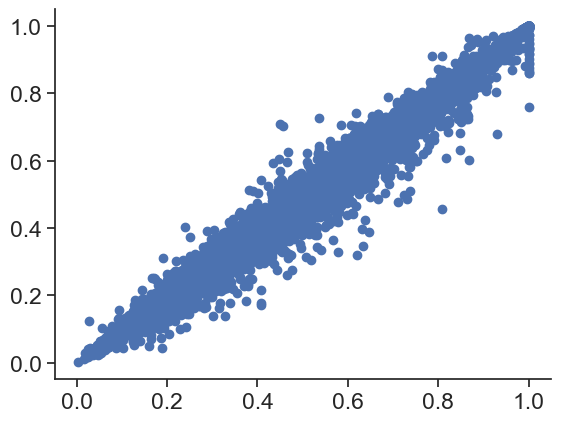

In [ ]:
metric = 'lifetime_sparseness_images'
plt.scatter(x=tmp[metric+'_events'], y=tmp[metric+'_filtered_events'])

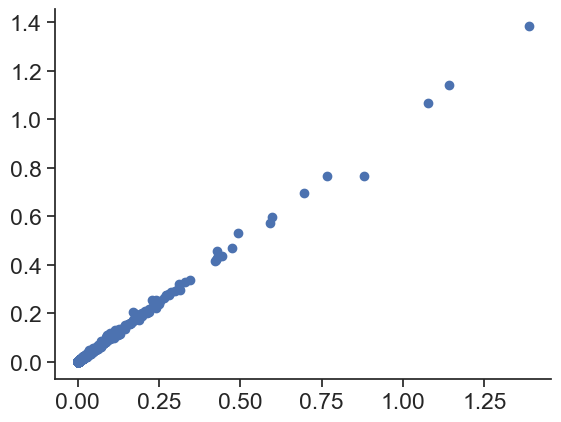

In [ ]:
metric = 'mean_response_changes'
plt.scatter(x=tmp[metric+'_events'], y=tmp[metric+'_filtered_events'])

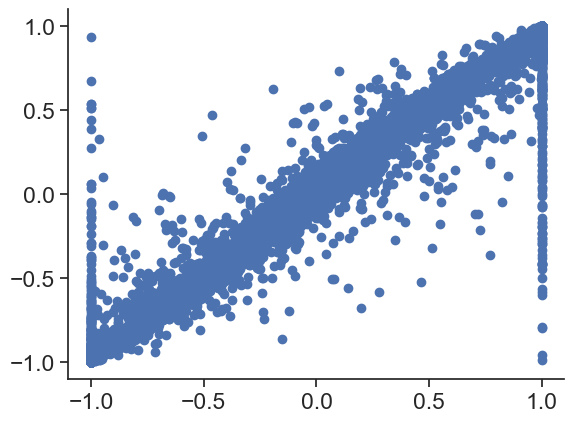

In [ ]:
metric = 'running_modulation_omissions'
plt.scatter(x=tmp[metric+'_events'], y=tmp[metric+'_filtered_events'])

#### get metrics table to use for plots

In [ ]:
data_type = 'events'

session_subset = 'full_session'
    
inclusion_criteria = 'platform_experiment_table'

metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type=data_type, session_subset=session_subset,
                                                inclusion_criteria=inclusion_criteria, save_dir=os.path.join(save_dir, folder))

original_metrics_table = metrics_table.copy()
# change_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

filepath: \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_figures_final\response_metrics\merged_model_free_metrics_table_events_platform_experiment_table.csv
loading model free metrics table


### generate metrics plots

In [ ]:
metrics_table = original_metrics_table.copy()

In [ ]:
metrics_table.keys()

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index'],
  

In [ ]:
# add other metadata
if 'Novel +' not in platform_cells_table.experience_level.unique():
    platform_cells_table['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in platform_cells_table.experience_level.values]
metrics_table = metrics_table.merge(platform_cells_table, on=['cell_specimen_id', 'experience_level', 'ophys_experiment_id'])
len(metrics_table)

25935

In [ ]:
len(metrics_table.ophys_experiment_id.unique())

402

#### responsiveness

In [ ]:
metrics_table.head()

,cell_specimen_id,experience_level,ophys_experiment_id,mean_response_pref_image,reliability_pref_image,fraction_significant_p_value_gray_screen_pref_image,fano_factor_pref_image,running_modulation_pref_image,mean_response_all_images,lifetime_sparseness_images,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
0,1086490480,Familiar,795073741,0.000131,0.105487,0.011364,0.011842,1.0,0.000068,0.352154,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
1,1086493550,Familiar,795073741,0.000060,0.324532,0.000000,0.006714,1.0,0.000031,0.367697,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
2,1086490397,Familiar,795073741,0.000903,0.202482,0.000000,0.024019,1.0,0.000370,0.449151,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
3,1086490510,Familiar,795073741,0.004168,0.001980,0.139665,0.045886,1.0,0.000979,0.660652,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
4,1086490565,Familiar,795073741,0.000204,-0.025882,0.001862,0.012950,1.0,0.000085,0.317306,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3


In [ ]:
# # changes
# condition = 'changes'
# stimuli = 'pref_image'
# data_type = 'events'
# change_response_metrics = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 1/402 [00:00<00:55,  7.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_changes_pref_image_full_session_events.h5


  1%|          | 3/402 [00:00<00:55,  7.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_changes_pref_image_full_session_events.h5


  1%|          | 4/402 [00:00<01:01,  6.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_changes_pref_image_full_session_events.h5


  1%|          | 5/402 [00:00<01:14,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_changes_pref_image_full_session_events.h5


  1%|▏         | 6/402 [00:01<01:38,  4.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_changes_pref_image_full_session_events.h5


  2%|▏         | 8/402 [00:01<01:30,  4.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_changes_pref_image_full_session_events.h5


  2%|▏         | 9/402 [00:02<01:53,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_changes_pref_image_full_session_events.h5


  3%|▎         | 11/402 [00:02<01:37,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_changes_pref_image_full_session_events.h5


  3%|▎         | 13/402 [00:02<01:13,  5.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_changes_pref_image_full_session_events.h5


  3%|▎         | 14/402 [00:03<01:25,  4.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_changes_pref_image_full_session_events.h5


  4%|▍         | 16/402 [00:03<01:32,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_changes_pref_image_full_session_events.h5


  4%|▍         | 18/402 [00:04<01:26,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_changes_pref_image_full_session_events.h5


  5%|▍         | 19/402 [00:04<01:19,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_changes_pref_image_full_session_events.h5


  5%|▍         | 20/402 [00:04<01:35,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_changes_pref_image_full_session_events.h5


  5%|▌         | 22/402 [00:05<01:30,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_changes_pref_image_full_session_events.h5


  6%|▌         | 24/402 [00:05<01:40,  3.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_changes_pref_image_full_session_events.h5


  6%|▋         | 26/402 [00:06<01:20,  4.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_changes_pref_image_full_session_events.h5


  7%|▋         | 28/402 [00:06<01:12,  5.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_changes_pref_image_full_session_events.h5


  7%|▋         | 30/402 [00:06<01:12,  5.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_changes_pref_image_full_session_events.h5


  8%|▊         | 31/402 [00:07<01:18,  4.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_changes_pref_image_full_session_events.h5


  8%|▊         | 33/402 [00:07<01:09,  5.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_changes_pref_image_full_session_events.h5


  9%|▊         | 35/402 [00:07<01:00,  6.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_changes_pref_image_full_session_events.h5


  9%|▉         | 36/402 [00:08<01:27,  4.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_changes_pref_image_full_session_events.h5


  9%|▉         | 38/402 [00:08<01:20,  4.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_changes_pref_image_full_session_events.h5


 10%|▉         | 39/402 [00:08<01:16,  4.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_changes_pref_image_full_session_events.h5


 10%|█         | 41/402 [00:09<01:28,  4.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_changes_pref_image_full_session_events.h5


 10%|█         | 42/402 [00:09<01:17,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_changes_pref_image_full_session_events.h5


 11%|█         | 44/402 [00:09<01:06,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_changes_pref_image_full_session_events.h5


 11%|█▏        | 46/402 [00:10<01:01,  5.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_changes_pref_image_full_session_events.h5


 12%|█▏        | 47/402 [00:10<01:13,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_changes_pref_image_full_session_events.h5


 12%|█▏        | 49/402 [00:10<01:21,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_changes_pref_image_full_session_events.h5


 13%|█▎        | 51/402 [00:11<01:05,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_changes_pref_image_full_session_events.h5


 13%|█▎        | 52/402 [00:11<01:04,  5.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_changes_pref_image_full_session_events.h5


 13%|█▎        | 54/402 [00:11<01:00,  5.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_changes_pref_image_full_session_events.h5


 14%|█▍        | 56/402 [00:11<00:55,  6.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_changes_pref_image_full_session_events.h5


 14%|█▍        | 57/402 [00:12<00:56,  6.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_changes_pref_image_full_session_events.h5


 15%|█▍        | 59/402 [00:12<01:14,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_changes_pref_image_full_session_events.h5


 15%|█▌        | 61/402 [00:13<01:46,  3.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_changes_pref_image_full_session_events.h5


 15%|█▌        | 62/402 [00:13<01:27,  3.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_changes_pref_image_full_session_events.h5


 16%|█▌        | 64/402 [00:14<01:19,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_changes_pref_image_full_session_events.h5


 16%|█▋        | 66/402 [00:14<01:06,  5.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_changes_pref_image_full_session_events.h5


 17%|█▋        | 68/402 [00:14<00:59,  5.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_changes_pref_image_full_session_events.h5


 17%|█▋        | 70/402 [00:15<01:02,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_changes_pref_image_full_session_events.h5


 18%|█▊        | 71/402 [00:15<00:58,  5.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_changes_pref_image_full_session_events.h5


 18%|█▊        | 72/402 [00:15<01:06,  4.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_changes_pref_image_full_session_events.h5


 18%|█▊        | 73/402 [00:15<01:07,  4.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_changes_pref_image_full_session_events.h5


 18%|█▊        | 74/402 [00:16<01:10,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_changes_pref_image_full_session_events.h5


 19%|█▊        | 75/402 [00:16<01:13,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_changes_pref_image_full_session_events.h5


 19%|█▉        | 76/402 [00:16<01:29,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_changes_pref_image_full_session_events.h5


 19%|█▉        | 78/402 [00:17<01:37,  3.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_changes_pref_image_full_session_events.h5


 20%|█▉        | 80/402 [00:17<01:15,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_changes_pref_image_full_session_events.h5


 20%|██        | 82/402 [00:18<00:56,  5.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_changes_pref_image_full_session_events.h5


 21%|██        | 84/402 [00:18<01:02,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_changes_pref_image_full_session_events.h5


 21%|██        | 85/402 [00:18<00:58,  5.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_changes_pref_image_full_session_events.h5


 22%|██▏       | 87/402 [00:19<01:05,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_changes_pref_image_full_session_events.h5


 22%|██▏       | 88/402 [00:19<00:59,  5.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_changes_pref_image_full_session_events.h5


 22%|██▏       | 90/402 [00:19<01:01,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_changes_pref_image_full_session_events.h5


 23%|██▎       | 91/402 [00:20<00:59,  5.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_changes_pref_image_full_session_events.h5


 23%|██▎       | 93/402 [00:20<01:06,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_changes_pref_image_full_session_events.h5


 23%|██▎       | 94/402 [00:20<01:22,  3.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_changes_pref_image_full_session_events.h5


 24%|██▎       | 95/402 [00:21<01:31,  3.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_changes_pref_image_full_session_events.h5


 24%|██▍       | 96/402 [00:21<01:37,  3.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_changes_pref_image_full_session_events.h5


 24%|██▍       | 98/402 [00:22<01:21,  3.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_changes_pref_image_full_session_events.h5


 25%|██▍       | 100/402 [00:22<01:12,  4.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_changes_pref_image_full_session_events.h5


 25%|██▌       | 102/402 [00:22<01:07,  4.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_changes_pref_image_full_session_events.h5


 26%|██▌       | 103/402 [00:23<01:26,  3.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_changes_pref_image_full_session_events.h5


 26%|██▌       | 105/402 [00:23<01:07,  4.40it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_changes_pref_image_full_session_events.h5


 27%|██▋       | 107/402 [00:24<01:03,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_changes_pref_image_full_session_events.h5


 27%|██▋       | 109/402 [00:24<00:55,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_changes_pref_image_full_session_events.h5


 27%|██▋       | 110/402 [00:24<00:57,  5.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_changes_pref_image_full_session_events.h5


 28%|██▊       | 112/402 [00:25<00:56,  5.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_changes_pref_image_full_session_events.h5


 28%|██▊       | 114/402 [00:25<00:57,  5.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_changes_pref_image_full_session_events.h5


 29%|██▉       | 116/402 [00:25<00:51,  5.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_changes_pref_image_full_session_events.h5


 29%|██▉       | 117/402 [00:26<00:52,  5.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_changes_pref_image_full_session_events.h5


 30%|██▉       | 119/402 [00:26<01:01,  4.61it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_changes_pref_image_full_session_events.h5


 30%|███       | 121/402 [00:27<01:15,  3.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_changes_pref_image_full_session_events.h5


 30%|███       | 122/402 [00:27<01:06,  4.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_changes_pref_image_full_session_events.h5


 31%|███       | 124/402 [00:28<01:10,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_changes_pref_image_full_session_events.h5


 31%|███       | 125/402 [00:28<01:20,  3.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_changes_pref_image_full_session_events.h5


 32%|███▏      | 127/402 [00:28<01:07,  4.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_changes_pref_image_full_session_events.h5


 32%|███▏      | 129/402 [00:29<00:58,  4.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_changes_pref_image_full_session_events.h5


 33%|███▎      | 131/402 [00:29<00:47,  5.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_changes_pref_image_full_session_events.h5


 33%|███▎      | 133/402 [00:29<00:41,  6.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_changes_pref_image_full_session_events.h5


 34%|███▎      | 135/402 [00:30<01:01,  4.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_changes_pref_image_full_session_events.h5


 34%|███▍      | 137/402 [00:30<00:49,  5.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_changes_pref_image_full_session_events.h5


 35%|███▍      | 139/402 [00:31<01:03,  4.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_changes_pref_image_full_session_events.h5


 35%|███▌      | 141/402 [00:31<00:54,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_changes_pref_image_full_session_events.h5


 35%|███▌      | 142/402 [00:31<00:54,  4.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_changes_pref_image_full_session_events.h5


 36%|███▌      | 143/402 [00:32<01:23,  3.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_changes_pref_image_full_session_events.h5


 36%|███▌      | 144/402 [00:33<01:43,  2.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_changes_pref_image_full_session_events.h5


 36%|███▋      | 146/402 [00:33<01:27,  2.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_changes_pref_image_full_session_events.h5


 37%|███▋      | 147/402 [00:34<01:30,  2.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_changes_pref_image_full_session_events.h5


 37%|███▋      | 148/402 [00:34<01:30,  2.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_changes_pref_image_full_session_events.h5


 37%|███▋      | 149/402 [00:34<01:41,  2.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_changes_pref_image_full_session_events.h5


 37%|███▋      | 150/402 [00:35<01:36,  2.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_changes_pref_image_full_session_events.h5


 38%|███▊      | 152/402 [00:35<01:22,  3.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_changes_pref_image_full_session_events.h5


 38%|███▊      | 153/402 [00:36<01:11,  3.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_changes_pref_image_full_session_events.h5


 39%|███▊      | 155/402 [00:36<00:56,  4.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_changes_pref_image_full_session_events.h5


 39%|███▉      | 157/402 [00:36<00:47,  5.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_changes_pref_image_full_session_events.h5


 39%|███▉      | 158/402 [00:37<00:54,  4.49it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_changes_pref_image_full_session_events.h5


 40%|███▉      | 159/402 [00:37<01:04,  3.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_changes_pref_image_full_session_events.h5


 40%|███▉      | 160/402 [00:37<01:03,  3.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_changes_pref_image_full_session_events.h5


 40%|████      | 161/402 [00:37<01:02,  3.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_changes_pref_image_full_session_events.h5


 40%|████      | 162/402 [00:38<01:09,  3.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_changes_pref_image_full_session_events.h5


 41%|████      | 164/402 [00:38<00:56,  4.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_changes_pref_image_full_session_events.h5


 41%|████▏     | 166/402 [00:39<00:49,  4.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_changes_pref_image_full_session_events.h5


 42%|████▏     | 168/402 [00:39<00:40,  5.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_changes_pref_image_full_session_events.h5


 42%|████▏     | 170/402 [00:39<00:38,  6.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_changes_pref_image_full_session_events.h5


 43%|████▎     | 172/402 [00:39<00:32,  7.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_changes_pref_image_full_session_events.h5


 43%|████▎     | 174/402 [00:40<00:36,  6.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_changes_pref_image_full_session_events.h5


 44%|████▍     | 176/402 [00:40<00:41,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_changes_pref_image_full_session_events.h5


 44%|████▍     | 177/402 [00:40<00:40,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_changes_pref_image_full_session_events.h5


 45%|████▍     | 179/402 [00:41<00:37,  5.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_changes_pref_image_full_session_events.h5


 45%|████▌     | 181/402 [00:41<00:36,  6.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_changes_pref_image_full_session_events.h5


 45%|████▌     | 182/402 [00:41<00:50,  4.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_changes_pref_image_full_session_events.h5


 46%|████▌     | 184/402 [00:42<00:49,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_changes_pref_image_full_session_events.h5


 46%|████▋     | 186/402 [00:42<00:51,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_changes_pref_image_full_session_events.h5


 47%|████▋     | 188/402 [00:43<00:43,  4.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_changes_pref_image_full_session_events.h5


 47%|████▋     | 189/402 [00:43<00:49,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_changes_pref_image_full_session_events.h5


 48%|████▊     | 191/402 [00:44<00:58,  3.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_changes_pref_image_full_session_events.h5


 48%|████▊     | 192/402 [00:44<00:52,  4.03it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_changes_pref_image_full_session_events.h5


 48%|████▊     | 193/402 [00:44<00:48,  4.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_changes_pref_image_full_session_events.h5


 48%|████▊     | 194/402 [00:44<00:43,  4.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_changes_pref_image_full_session_events.h5


 49%|████▉     | 196/402 [00:45<00:33,  6.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_changes_pref_image_full_session_events.h5


 49%|████▉     | 198/402 [00:45<00:40,  5.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_changes_pref_image_full_session_events.h5


 50%|████▉     | 199/402 [00:45<00:37,  5.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_changes_pref_image_full_session_events.h5


 50%|█████     | 201/402 [00:46<00:39,  5.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_changes_pref_image_full_session_events.h5


 50%|█████     | 203/402 [00:46<00:33,  6.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_changes_pref_image_full_session_events.h5


 51%|█████     | 204/402 [00:46<00:32,  6.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_changes_pref_image_full_session_events.h5


 51%|█████     | 205/402 [00:46<00:42,  4.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_changes_pref_image_full_session_events.h5


 51%|█████▏    | 207/402 [00:47<00:43,  4.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_changes_pref_image_full_session_events.h5


 52%|█████▏    | 209/402 [00:47<00:34,  5.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_changes_pref_image_full_session_events.h5


 52%|█████▏    | 211/402 [00:48<00:43,  4.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_changes_pref_image_full_session_events.h5


 53%|█████▎    | 213/402 [00:48<00:43,  4.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_changes_pref_image_full_session_events.h5


 53%|█████▎    | 215/402 [00:49<00:39,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_changes_pref_image_full_session_events.h5


 54%|█████▍    | 217/402 [00:49<00:34,  5.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_changes_pref_image_full_session_events.h5


 54%|█████▍    | 219/402 [00:49<00:28,  6.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_changes_pref_image_full_session_events.h5


 55%|█████▍    | 221/402 [00:50<00:31,  5.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_changes_pref_image_full_session_events.h5


 55%|█████▌    | 222/402 [00:50<00:28,  6.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_changes_pref_image_full_session_events.h5


 56%|█████▌    | 224/402 [00:50<00:29,  6.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_changes_pref_image_full_session_events.h5


 56%|█████▌    | 226/402 [00:51<00:39,  4.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_changes_pref_image_full_session_events.h5


 56%|█████▋    | 227/402 [00:51<00:34,  5.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_changes_pref_image_full_session_events.h5


 57%|█████▋    | 228/402 [00:51<00:37,  4.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_changes_pref_image_full_session_events.h5


 57%|█████▋    | 229/402 [00:51<00:44,  3.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_changes_pref_image_full_session_events.h5


 57%|█████▋    | 231/402 [00:52<00:42,  4.00it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_changes_pref_image_full_session_events.h5


 58%|█████▊    | 232/402 [00:52<00:46,  3.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_changes_pref_image_full_session_events.h5


 58%|█████▊    | 234/402 [00:53<00:39,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_changes_pref_image_full_session_events.h5


 58%|█████▊    | 235/402 [00:53<00:37,  4.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_changes_pref_image_full_session_events.h5


 59%|█████▊    | 236/402 [00:53<00:46,  3.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_changes_pref_image_full_session_events.h5


 59%|█████▉    | 238/402 [00:54<00:49,  3.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_changes_pref_image_full_session_events.h5


 59%|█████▉    | 239/402 [00:54<00:40,  4.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_changes_pref_image_full_session_events.h5


 60%|█████▉    | 240/402 [00:54<00:33,  4.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_changes_pref_image_full_session_events.h5


 60%|█████▉    | 241/402 [00:55<00:37,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_changes_pref_image_full_session_events.h5


 60%|██████    | 242/402 [00:55<00:40,  3.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_changes_pref_image_full_session_events.h5


 61%|██████    | 244/402 [00:55<00:42,  3.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_changes_pref_image_full_session_events.h5


 61%|██████    | 245/402 [00:56<00:35,  4.44it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_changes_pref_image_full_session_events.h5


 61%|██████    | 246/402 [00:56<00:50,  3.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_changes_pref_image_full_session_events.h5


 61%|██████▏   | 247/402 [00:56<00:46,  3.36it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_changes_pref_image_full_session_events.h5


 62%|██████▏   | 249/402 [00:57<00:50,  3.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_changes_pref_image_full_session_events.h5


 62%|██████▏   | 250/402 [00:57<00:41,  3.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_changes_pref_image_full_session_events.h5


 63%|██████▎   | 252/402 [00:58<00:32,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_changes_pref_image_full_session_events.h5


 63%|██████▎   | 254/402 [00:58<00:25,  5.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_changes_pref_image_full_session_events.h5


 64%|██████▎   | 256/402 [00:58<00:25,  5.66it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_changes_pref_image_full_session_events.h5


 64%|██████▍   | 258/402 [00:59<00:27,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_changes_pref_image_full_session_events.h5


 64%|██████▍   | 259/402 [00:59<00:24,  5.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_changes_pref_image_full_session_events.h5


 65%|██████▍   | 261/402 [00:59<00:33,  4.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_changes_pref_image_full_session_events.h5


 65%|██████▌   | 263/402 [01:00<00:25,  5.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_changes_pref_image_full_session_events.h5


 66%|██████▌   | 264/402 [01:00<00:22,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_changes_pref_image_full_session_events.h5


 66%|██████▌   | 266/402 [01:00<00:22,  5.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_changes_pref_image_full_session_events.h5


 67%|██████▋   | 268/402 [01:00<00:20,  6.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_changes_pref_image_full_session_events.h5


 67%|██████▋   | 270/402 [01:01<00:19,  6.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_changes_pref_image_full_session_events.h5


 68%|██████▊   | 272/402 [01:01<00:18,  7.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_changes_pref_image_full_session_events.h5


 68%|██████▊   | 274/402 [01:01<00:24,  5.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_changes_pref_image_full_session_events.h5


 68%|██████▊   | 275/402 [01:02<00:23,  5.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_changes_pref_image_full_session_events.h5
cant load saved table, generating metrics table for 960410028 events


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


file exists:
loading response df from file for 960410028 events all
sdf loaded
annotating stim presentations
adding reward rate
adding epochs
finished annotating
stim response df loaded, generating cell metrics
generating cell metrics for 960410028


 69%|██████▉   | 277/402 [01:36<15:18,  7.35s/it]

metrics generated for events changes pref_image full_session interpolate: True
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_changes_pref_image_full_session_events.h5


 69%|██████▉   | 279/402 [01:37<07:36,  3.71s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_changes_pref_image_full_session_events.h5


 70%|██████▉   | 280/402 [01:37<05:27,  2.69s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_changes_pref_image_full_session_events.h5


 70%|██████▉   | 281/402 [01:37<03:56,  1.95s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_changes_pref_image_full_session_events.h5


 70%|███████   | 283/402 [01:38<02:07,  1.07s/it]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_changes_pref_image_full_session_events.h5


 71%|███████   | 284/402 [01:38<01:38,  1.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_changes_pref_image_full_session_events.h5


 71%|███████   | 285/402 [01:38<01:16,  1.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_changes_pref_image_full_session_events.h5


 72%|███████▏  | 288/402 [01:39<00:41,  2.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_changes_pref_image_full_session_events.h5


 72%|███████▏  | 289/402 [01:39<00:36,  3.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_changes_pref_image_full_session_events.h5


 72%|███████▏  | 290/402 [01:39<00:31,  3.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_changes_pref_image_full_session_events.h5


 73%|███████▎  | 292/402 [01:39<00:28,  3.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_changes_pref_image_full_session_events.h5


 73%|███████▎  | 293/402 [01:40<00:24,  4.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_changes_pref_image_full_session_events.h5


 73%|███████▎  | 295/402 [01:40<00:19,  5.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_changes_pref_image_full_session_events.h5


 74%|███████▍  | 297/402 [01:40<00:17,  5.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_changes_pref_image_full_session_events.h5


 74%|███████▍  | 299/402 [01:41<00:17,  5.96it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_changes_pref_image_full_session_events.h5


 75%|███████▍  | 301/402 [01:41<00:15,  6.34it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_changes_pref_image_full_session_events.h5


 75%|███████▌  | 302/402 [01:41<00:15,  6.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_changes_pref_image_full_session_events.h5


 76%|███████▌  | 304/402 [01:41<00:17,  5.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_changes_pref_image_full_session_events.h5


 76%|███████▌  | 305/402 [01:42<00:16,  5.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_changes_pref_image_full_session_events.h5


 76%|███████▌  | 306/402 [01:42<00:18,  5.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_changes_pref_image_full_session_events.h5


 76%|███████▋  | 307/402 [01:42<00:18,  5.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_changes_pref_image_full_session_events.h5


 77%|███████▋  | 309/402 [01:42<00:19,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_changes_pref_image_full_session_events.h5


 77%|███████▋  | 310/402 [01:43<00:17,  5.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_changes_pref_image_full_session_events.h5


 78%|███████▊  | 313/402 [01:43<00:15,  5.79it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_changes_pref_image_full_session_events.h5


 78%|███████▊  | 314/402 [01:43<00:14,  6.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_changes_pref_image_full_session_events.h5


 79%|███████▊  | 316/402 [01:44<00:14,  6.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_changes_pref_image_full_session_events.h5


 79%|███████▉  | 318/402 [01:44<00:12,  6.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_changes_pref_image_full_session_events.h5


 80%|███████▉  | 320/402 [01:44<00:13,  6.11it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_changes_pref_image_full_session_events.h5


 80%|███████▉  | 321/402 [01:44<00:12,  6.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_changes_pref_image_full_session_events.h5


 80%|████████  | 323/402 [01:45<00:14,  5.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_changes_pref_image_full_session_events.h5


 81%|████████  | 324/402 [01:45<00:16,  4.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_changes_pref_image_full_session_events.h5


 81%|████████  | 326/402 [01:46<00:15,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_changes_pref_image_full_session_events.h5


 81%|████████▏ | 327/402 [01:46<00:14,  5.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_changes_pref_image_full_session_events.h5


 82%|████████▏ | 329/402 [01:46<00:15,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_changes_pref_image_full_session_events.h5


 82%|████████▏ | 330/402 [01:46<00:13,  5.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_changes_pref_image_full_session_events.h5


 83%|████████▎ | 332/402 [01:47<00:12,  5.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_changes_pref_image_full_session_events.h5


 83%|████████▎ | 333/402 [01:47<00:11,  6.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_changes_pref_image_full_session_events.h5


 83%|████████▎ | 334/402 [01:47<00:13,  5.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_changes_pref_image_full_session_events.h5


 84%|████████▎ | 336/402 [01:48<00:14,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_changes_pref_image_full_session_events.h5


 84%|████████▍ | 338/402 [01:48<00:12,  5.29it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_changes_pref_image_full_session_events.h5


 85%|████████▍ | 340/402 [01:48<00:09,  6.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_changes_pref_image_full_session_events.h5


 85%|████████▌ | 342/402 [01:49<00:10,  5.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_changes_pref_image_full_session_events.h5


 85%|████████▌ | 343/402 [01:49<00:10,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_changes_pref_image_full_session_events.h5


 86%|████████▌ | 345/402 [01:49<00:10,  5.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_changes_pref_image_full_session_events.h5


 86%|████████▋ | 347/402 [01:50<00:10,  5.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_changes_pref_image_full_session_events.h5


 87%|████████▋ | 348/402 [01:50<00:09,  5.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_changes_pref_image_full_session_events.h5


 87%|████████▋ | 350/402 [01:50<00:09,  5.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_changes_pref_image_full_session_events.h5


 88%|████████▊ | 352/402 [01:50<00:09,  5.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_changes_pref_image_full_session_events.h5


 88%|████████▊ | 353/402 [01:51<00:09,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_changes_pref_image_full_session_events.h5


 88%|████████▊ | 355/402 [01:51<00:09,  4.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_changes_pref_image_full_session_events.h5


 89%|████████▉ | 357/402 [01:52<00:09,  4.72it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_changes_pref_image_full_session_events.h5


 89%|████████▉ | 358/402 [01:52<00:08,  5.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_changes_pref_image_full_session_events.h5


 90%|████████▉ | 360/402 [01:52<00:06,  6.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_changes_pref_image_full_session_events.h5


 90%|█████████ | 362/402 [01:52<00:05,  6.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_changes_pref_image_full_session_events.h5


 91%|█████████ | 364/402 [01:53<00:06,  5.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_changes_pref_image_full_session_events.h5


 91%|█████████ | 365/402 [01:53<00:06,  6.17it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_changes_pref_image_full_session_events.h5


 91%|█████████▏| 367/402 [01:53<00:04,  7.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_changes_pref_image_full_session_events.h5


 92%|█████████▏| 369/402 [01:53<00:04,  7.53it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_changes_pref_image_full_session_events.h5


 92%|█████████▏| 371/402 [01:54<00:04,  7.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_changes_pref_image_full_session_events.h5


 93%|█████████▎| 372/402 [01:54<00:03,  8.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_changes_pref_image_full_session_events.h5


 93%|█████████▎| 375/402 [01:54<00:03,  8.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_changes_pref_image_full_session_events.h5


 94%|█████████▍| 377/402 [01:54<00:03,  7.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_changes_pref_image_full_session_events.h5


 94%|█████████▍| 378/402 [01:54<00:03,  7.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_changes_pref_image_full_session_events.h5


 94%|█████████▍| 379/402 [01:55<00:03,  5.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_changes_pref_image_full_session_events.h5


 95%|█████████▍| 381/402 [01:55<00:04,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_changes_pref_image_full_session_events.h5


 95%|█████████▌| 382/402 [01:55<00:03,  5.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_changes_pref_image_full_session_events.h5


 95%|█████████▌| 383/402 [01:55<00:03,  5.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_changes_pref_image_full_session_events.h5


 96%|█████████▌| 384/402 [01:56<00:03,  4.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_changes_pref_image_full_session_events.h5


 96%|█████████▌| 385/402 [01:56<00:04,  3.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_changes_pref_image_full_session_events.h5


 96%|█████████▋| 387/402 [01:57<00:03,  4.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_changes_pref_image_full_session_events.h5


 97%|█████████▋| 389/402 [01:57<00:02,  5.71it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_changes_pref_image_full_session_events.h5


 97%|█████████▋| 391/402 [01:57<00:01,  6.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_changes_pref_image_full_session_events.h5


 98%|█████████▊| 393/402 [01:57<00:01,  7.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_changes_pref_image_full_session_events.h5


 98%|█████████▊| 394/402 [01:58<00:01,  6.37it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_changes_pref_image_full_session_events.h5


 99%|█████████▊| 396/402 [01:58<00:01,  5.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_changes_pref_image_full_session_events.h5


 99%|█████████▉| 398/402 [01:58<00:00,  5.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_changes_pref_image_full_session_events.h5


100%|█████████▉| 400/402 [01:59<00:00,  5.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_changes_pref_image_full_session_events.h5


100%|██████████| 402/402 [01:59<00:00,  3.37it/s]


attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_changes_pref_image_full_session_events.h5
there are 399 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


In [ ]:
change_response_metrics.head()

,cell_specimen_id,pref_image,non_pref_image,image_selectivity_index,image_selectivity_index_one_vs_all,lifetime_sparseness,mean_response,fraction_significant_p_value_gray_screen,fano_factor,reliability,...,layer,area_layer,date,first_novel,n_relative_to_first_novel,last_familiar,last_familiar_active,second_novel,second_novel_active,experience_exposure
0,1086490480,im063,im061,1.0,0.569088,0.715372,0.000865,0.071429,0.011243,NaN,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
1,1086493550,im063,im061,1.0,1.000000,1.000000,0.000659,0.000000,0.008570,NaN,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
2,1086490441,im062,im065,1.0,0.687094,0.656961,0.012387,0.250000,0.040508,-0.195328,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
3,1086490597,im066,im061,1.0,0.837839,0.870303,0.006628,0.307692,0.019283,0.103095,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3
4,1086490897,im062,im061,1.0,0.696759,0.703598,0.002041,0.166667,0.012171,-0.103918,...,upper,VISp_upper,20181213,False,-1.0,True,True,False,False,Familiar 3


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Fraction change responsive cells - preferred image'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

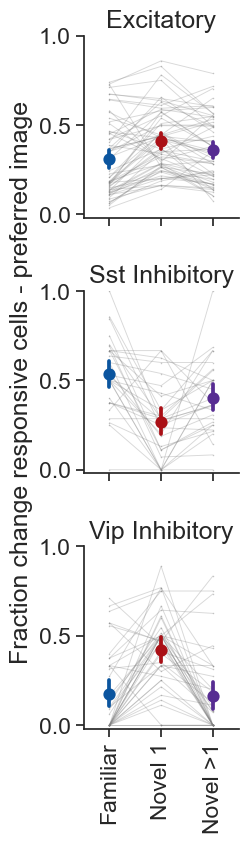

In [ ]:
tmp = change_response_metrics.copy()
# tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_pref_image

ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.2, ylim=(-0.02, 1), ylabel='Fraction change responsive cells - preferred image',
                                    save_dir=save_dir, folder=folder, suffix='_pref_stim_changes', horizontal=False, ax=None)


In [ ]:
# tmp = change_response_metrics.copy()

# ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.2, ylim=(-0.02, 1), ylabel='Fraction change responsive cells',
#                                     save_dir=save_dir, folder=folder, suffix='_pref_stim_changes', horizontal=False, ax=None)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Fraction responsive cells - preferred image'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

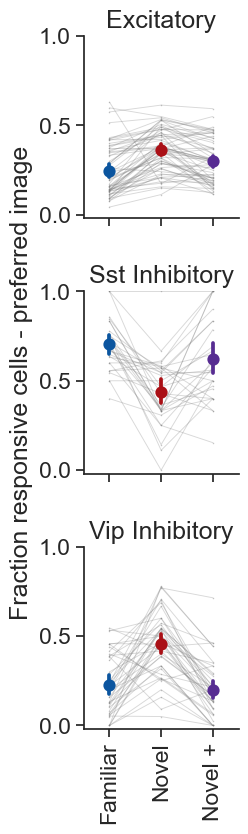

In [ ]:
tmp = metrics_table.copy()
tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_pref_image

ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Fraction responsive cells - preferred image',
                                    save_dir=save_dir, folder=folder, suffix='_pref_stim_images', horizontal=False, ax=None)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Fraction change responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

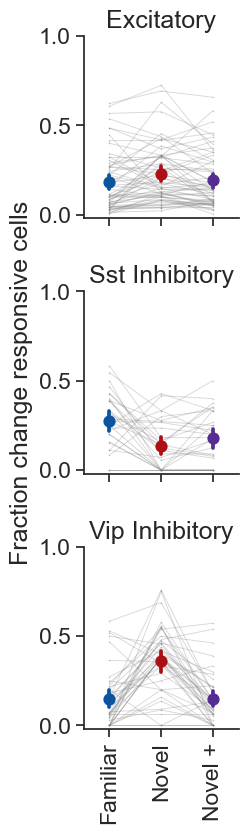

In [ ]:
tmp = metrics_table.copy()
tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_changes

ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Fraction change responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_changes', horizontal=False, ax=None)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0.

  ax[i] = sns.pointplot(data=data[data.ophys_container_id == ophys_container_id], x='experience_level', y='fraction_responsive',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:527: FutureWarning: 

The `errwidth` parameter is deprecated. And will be remove

array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Fraction omission responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

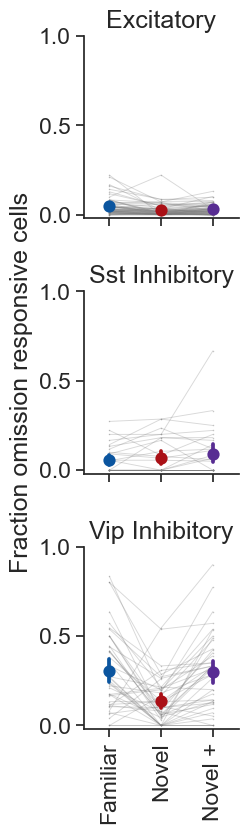

In [ ]:
tmp = metrics_table.copy()
tmp['fraction_significant_p_value_gray_screen'] = tmp.fraction_significant_p_value_gray_screen_omissions

ppf.plot_fraction_responsive_cells(tmp, responsiveness_threshold=0.1, ylim=(-0.02, 1), ylabel='Fraction omission responsive cells',
                                    save_dir=save_dir, folder=folder, suffix='_omissions', horizontal=False, ax=None)


#### Images

400 experiments in metric_data after merging with cells_table


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavi

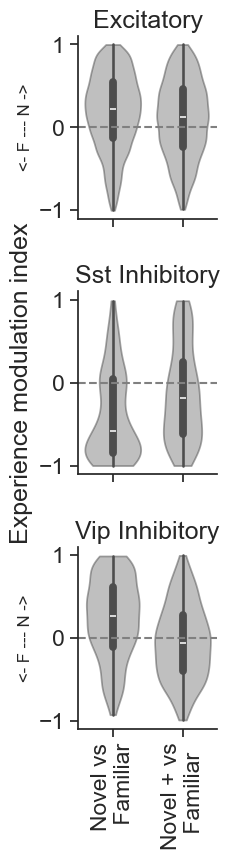

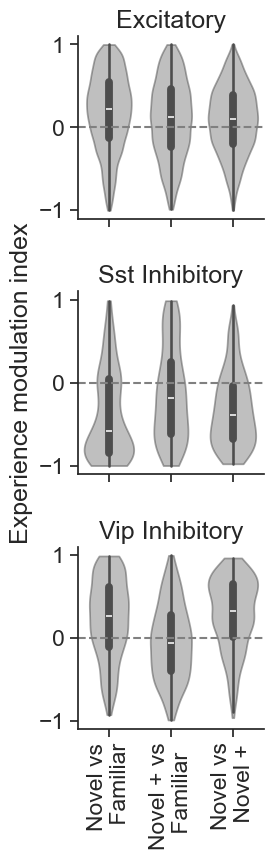

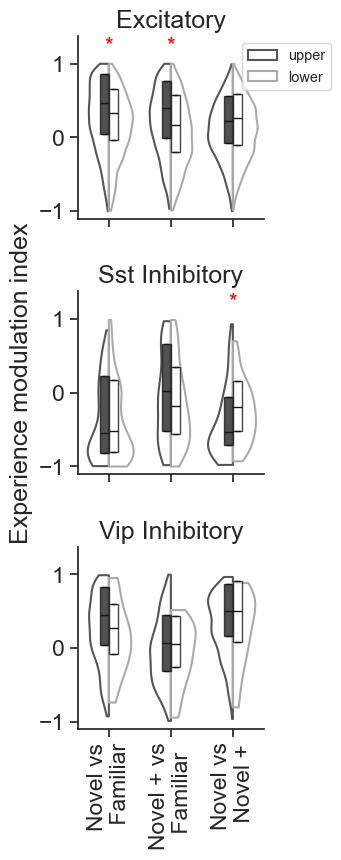

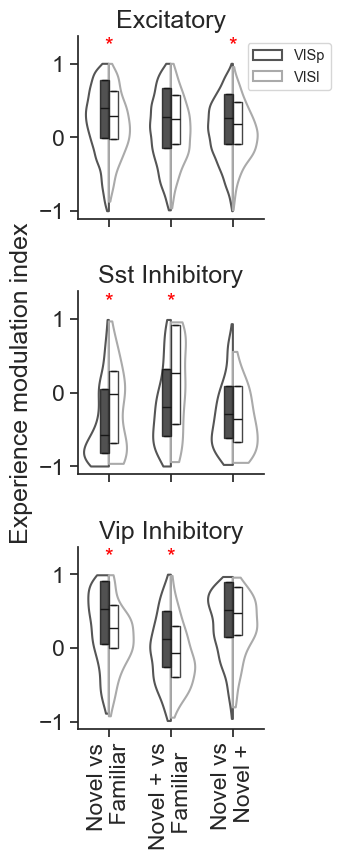

In [ ]:
metric = 'mean_response'
event_type = 'images'

exp_mod = cm.compute_experience_modulation_index(image_mdf, metric, platform_cells_table)
exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


#### Changes

In [ ]:
print(len(metrics_table.cell_specimen_id.unique()))

14495


In [ ]:
print(len(change_mdf.cell_specimen_id.unique()))

14493


400 experiments in metric_data after merging with cells_table


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavi

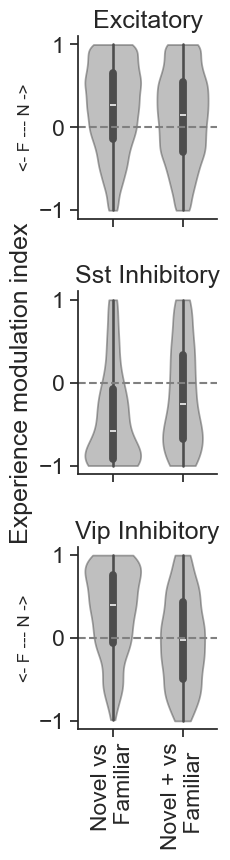

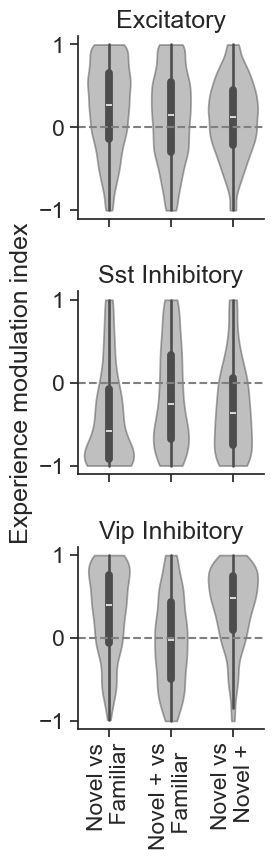

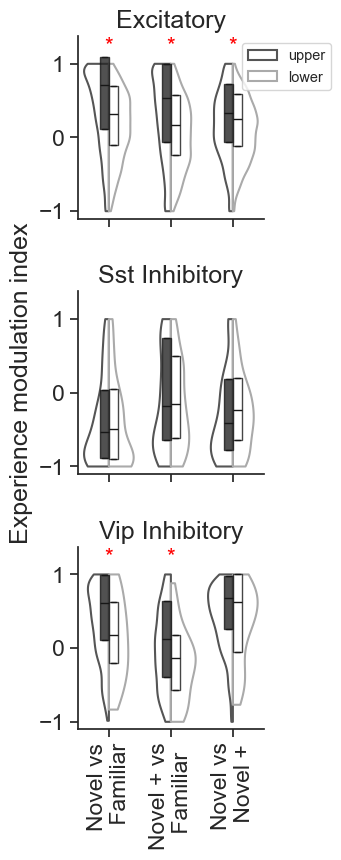

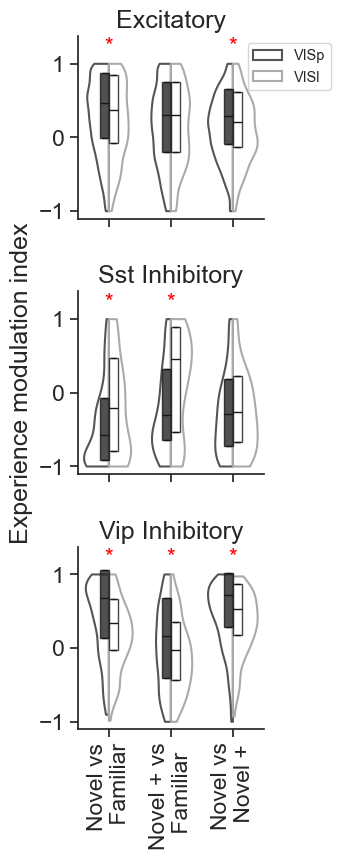

In [ ]:
metric = 'mean_response'
event_type = 'changes'

exp_mod = cm.compute_experience_modulation_index(change_mdf, metric, platform_cells_table)
exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='pointplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


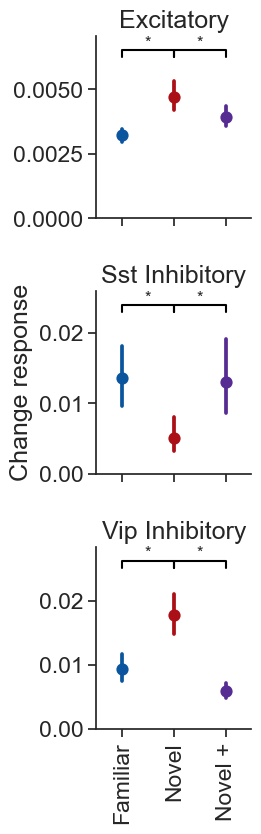

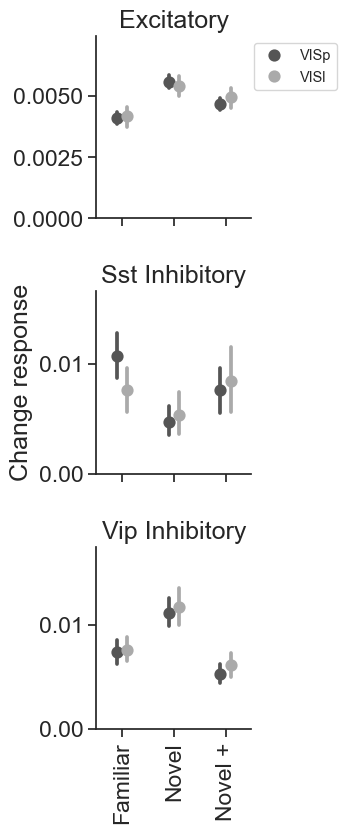

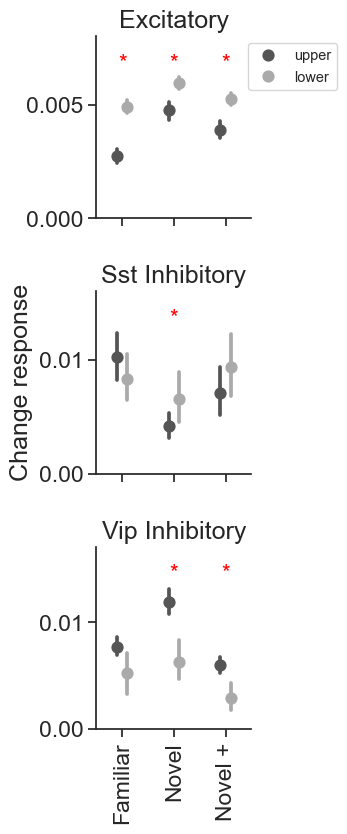

In [ ]:
metric = 'mean_response'
ylabel = 'Change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_all_conditions(change_mdf, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Change response'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

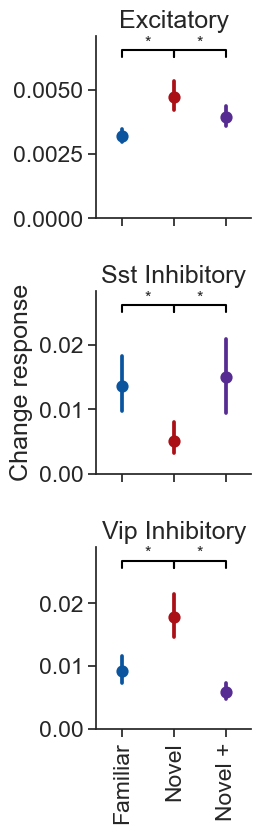

In [ ]:
metric = 'mean_response_changes'
ylabel = 'Change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Pre-change response'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

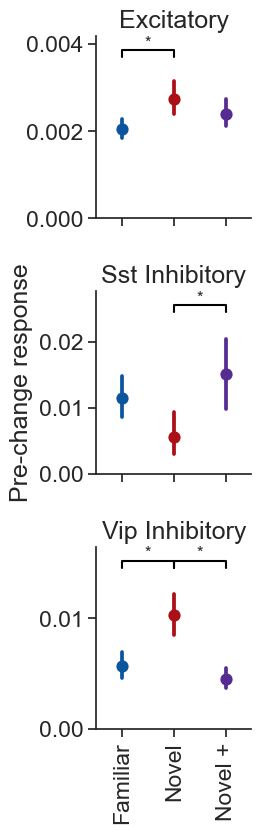

In [ ]:
metric = 'mean_response_pre_change'
ylabel = 'Pre-change response'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


##### Change response for reversed image sets

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


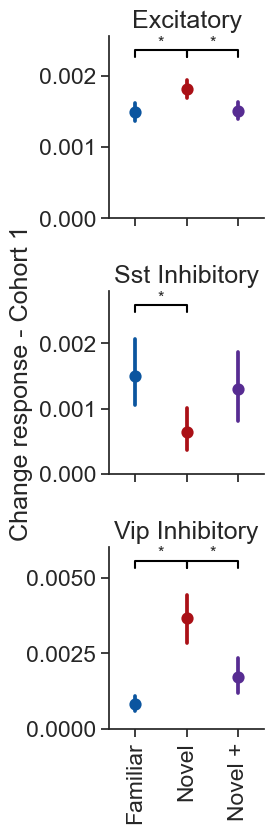

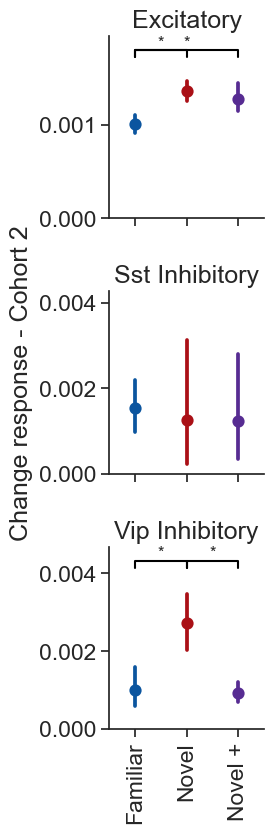

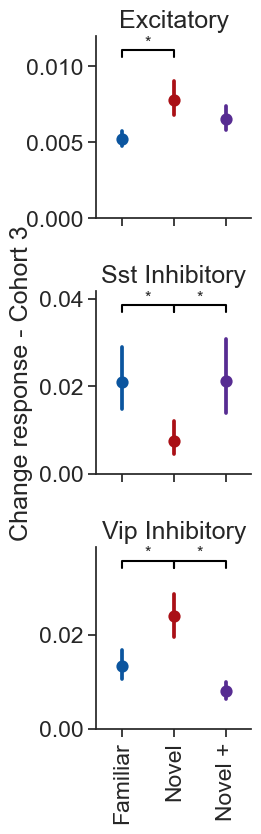

In [ ]:
metric = 'mean_response'
event_type = 'changes'

ylims = None #(-0.001, 0.025)

for i, project_code in enumerate(['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']):
    project_data = change_mdf[change_mdf.project_code==project_code].copy()
    ylabel = 'Change response - Cohort '+str(i+1)

    ppf.plot_metric_distribution_by_experience(project_data, metric, plot_type='pointplot',
                                            add_zero_line=False, event_type=event_type, data_type=data_type,
                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, suffix='_'+project_code, ax=None)

##### Change modulation

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Change modulation index'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

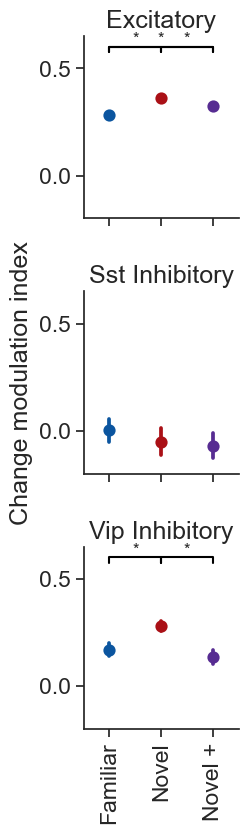

In [ ]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'

ylims = (-0.2, 0.5)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience_level',  order=order, color='white',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience_level',  order=order, color='white',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


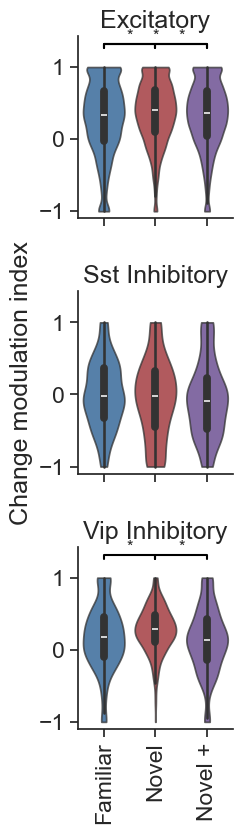

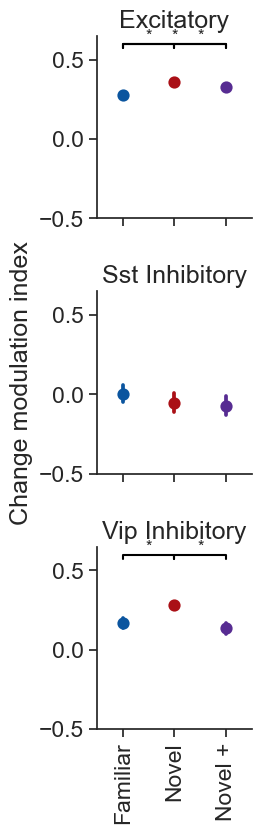

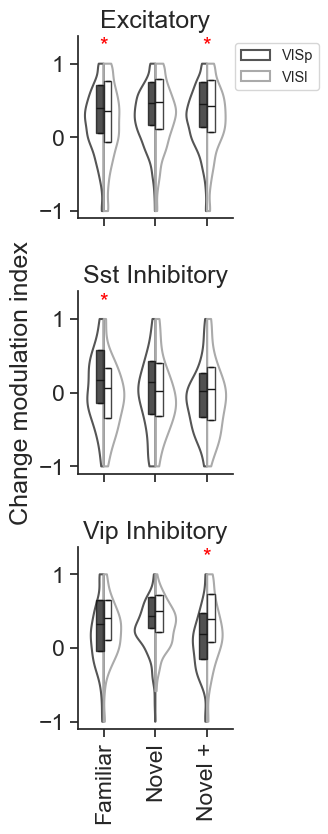

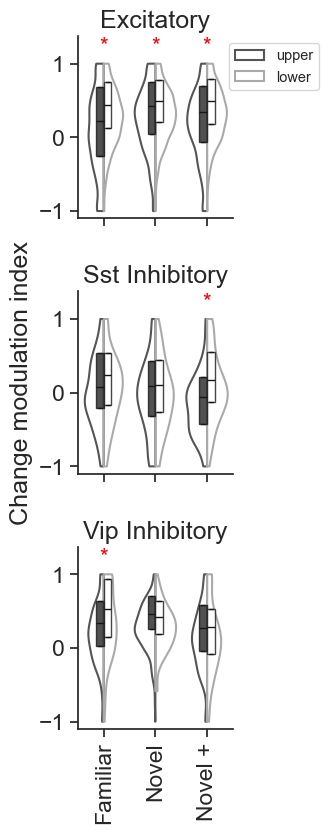

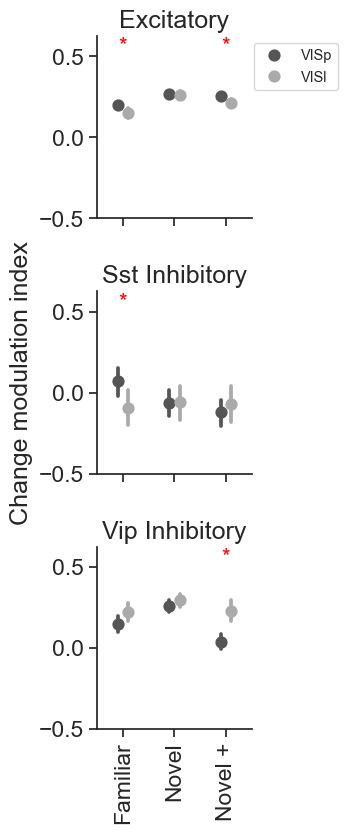

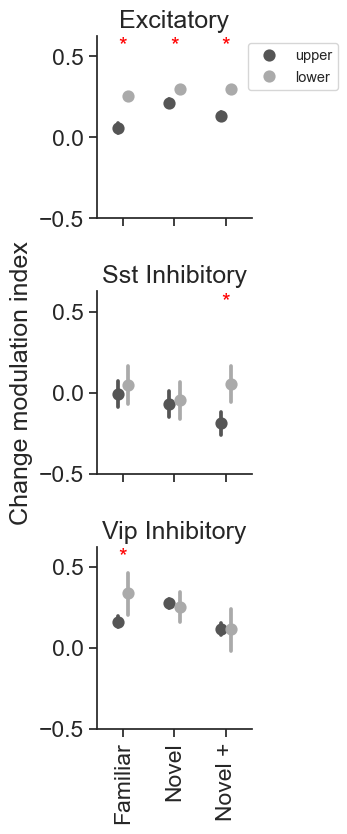

In [ ]:
metric = 'change_modulation_index'
ylabel = 'Change modulation index'

event_type = 'changes'

ylims = None #(-0.5, 0.5) #None #(-0.001, 0.025)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot', 
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience_level',  order=order, color='white',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience_level',  order=order, color='white',
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1029: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:white'` for the same effect.

  ax2 = sns.boxplot(data=ct_data, hue=hue, y=metric, x='experience

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


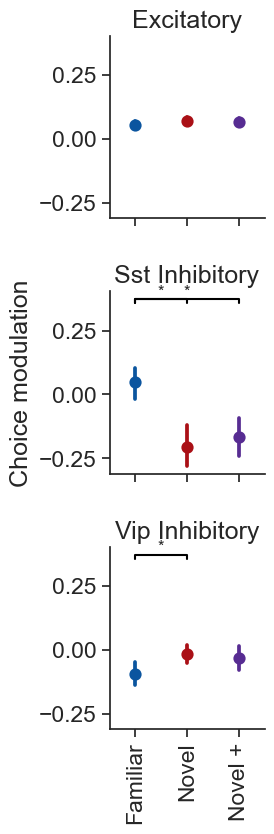

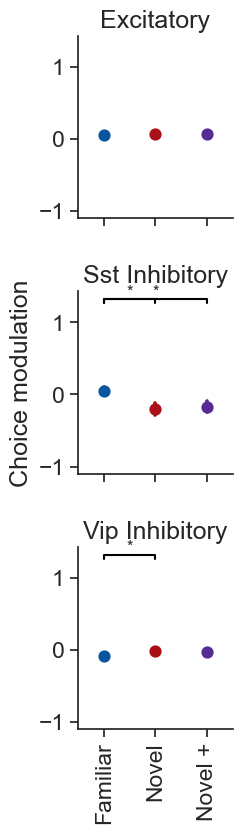

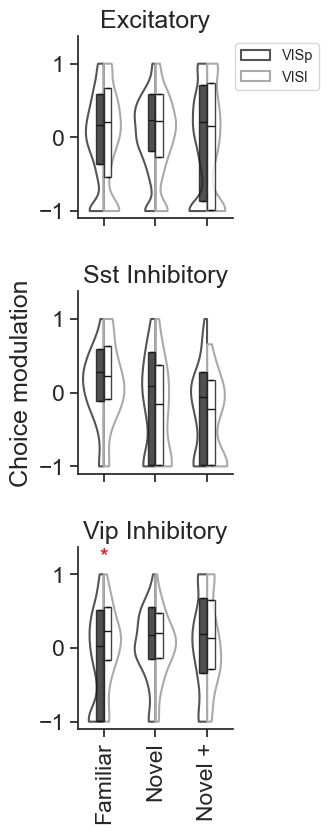

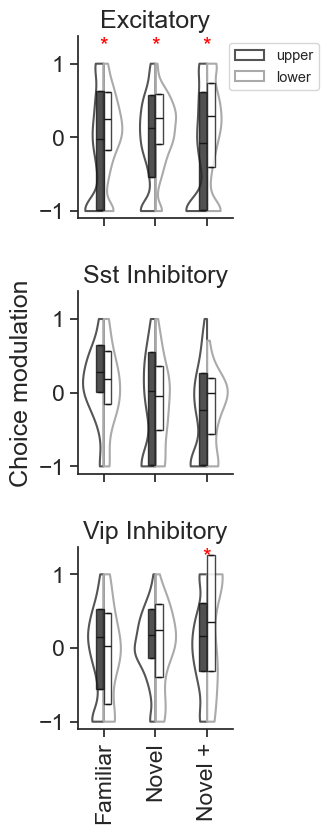

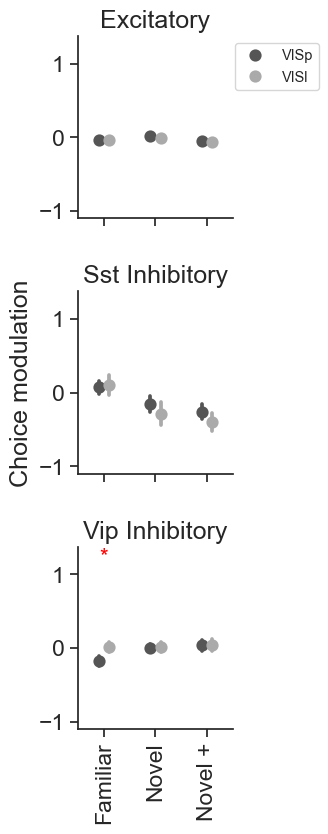

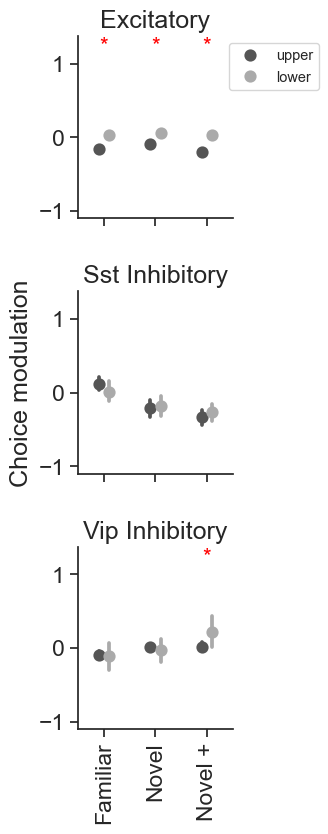

In [ ]:
metric = 'hit_miss_index'
ylabel = 'Choice modulation'

event_type = 'changes'

ylims = [-1.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(-0.31, 0.31), save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

### Image selectivity 

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Image selectivity - all cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

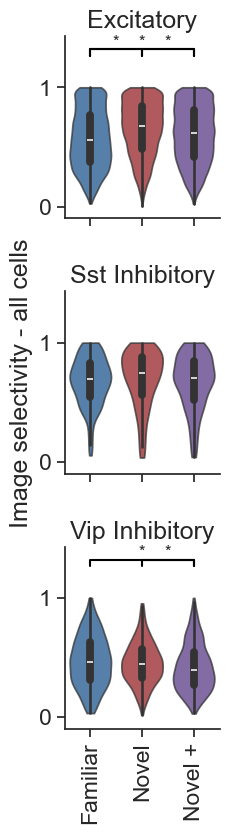

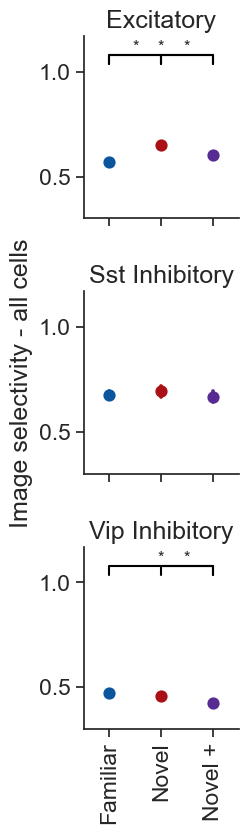

In [ ]:
# all cells 

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - all cells'

event_type = 'images'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Image selectivity - responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

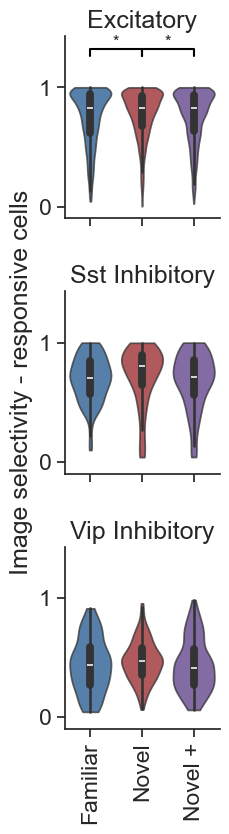

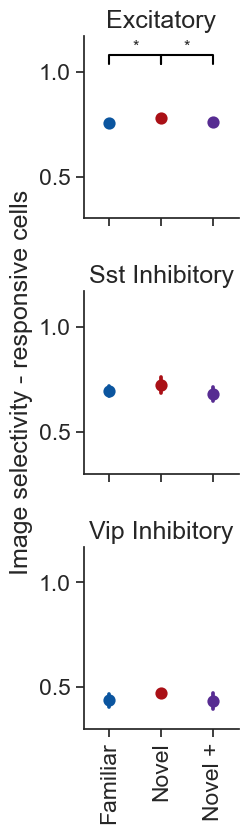

In [ ]:
# responsive cells 

metric = 'lifetime_sparseness_images'
ylabel = 'Image selectivity - responsive cells'

event_type = 'images'

ylims = [-0.1, 1.1]

tmp = metrics_table[metrics_table.fraction_significant_p_value_gray_screen_pref_image>0.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(tmp, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Image selectivity - changes, all cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

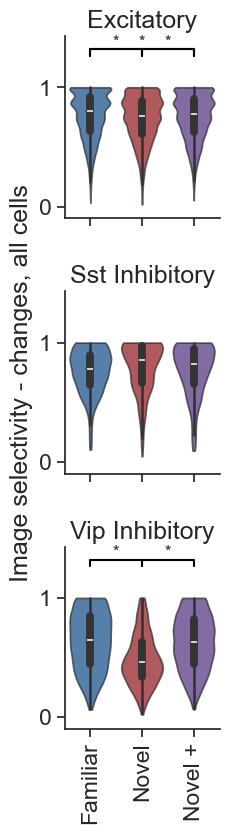

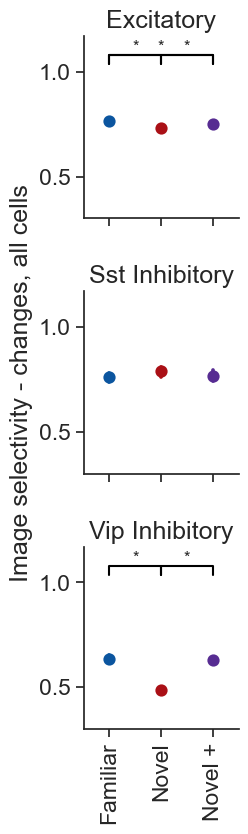

In [ ]:
# all cells 

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, all cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Image selectivity - changes, responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

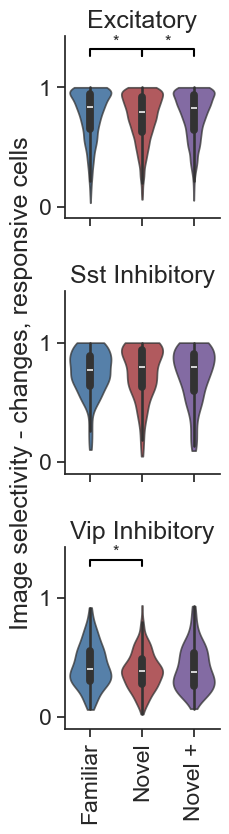

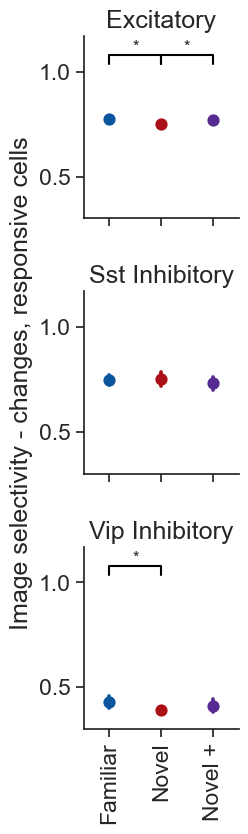

In [ ]:

# responsive cells 

metric = 'lifetime_sparseness_changes'
ylabel = 'Image selectivity - changes, responsive cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

tmpt = metrics_table[metrics_table.fraction_significant_p_value_gray_screen_changes>0.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(tmp, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

#### filter by responsiveness to preferred image for changes

In [ ]:
# # changes
# condition = 'changes'
# stimuli = 'pref_image'
# data_type = 'events'
# change_response_metrics = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)



C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


  0%|          | 2/402 [00:00<00:29, 13.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795073741_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795953296_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796308505_changes_pref_image_full_session_events.h5


  1%|          | 4/402 [00:00<00:30, 13.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807752719_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808619543_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\813083478_changes_pref_image_full_session_events.h5


  2%|▏         | 8/402 [00:00<00:39,  9.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\807753334_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\808621034_changes_pref_image_full_session_events.h5


  2%|▏         | 10/402 [00:00<00:40,  9.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\809501118_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\794381992_changes_pref_image_full_session_events.h5


  3%|▎         | 12/402 [00:01<00:40,  9.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\795076128_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\796105304_changes_pref_image_full_session_events.h5


  3%|▎         | 13/402 [00:01<00:40,  9.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\826587940_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\830093338_changes_pref_image_full_session_events.h5


  4%|▎         | 15/402 [00:01<00:43,  8.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\832115263_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\833629926_changes_pref_image_full_session_events.h5


  4%|▍         | 17/402 [00:01<00:44,  8.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\834279496_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\835006071_changes_pref_image_full_session_events.h5


  5%|▍         | 19/402 [00:01<00:37, 10.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\842973730_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848694639_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847125577_changes_pref_image_full_session_events.h5


  5%|▌         | 21/402 [00:02<00:38,  9.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850489605_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851056106_changes_pref_image_full_session_events.h5


  6%|▌         | 25/402 [00:02<00:34, 10.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962969_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850479305_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851060467_changes_pref_image_full_session_events.h5


  7%|▋         | 27/402 [00:02<00:35, 10.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\852691524_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853328115_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853962951_changes_pref_image_full_session_events.h5


  7%|▋         | 29/402 [00:02<00:36, 10.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\855577488_changes_pref_image_full_session_events.h5


  8%|▊         | 31/402 [00:03<00:48,  7.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\878363088_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\879331157_changes_pref_image_full_session_events.h5


  8%|▊         | 33/402 [00:03<00:50,  7.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\880961028_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891994418_changes_pref_image_full_session_events.h5


  8%|▊         | 34/402 [00:03<00:49,  7.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892799212_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894727297_changes_pref_image_full_session_events.h5


  9%|▉         | 36/402 [00:03<00:47,  7.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\901559828_changes_pref_image_full_session_events.h5


  9%|▉         | 38/402 [00:04<01:02,  5.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\903405627_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908350502_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\891996193_changes_pref_image_full_session_events.h5


 10%|▉         | 40/402 [00:04<00:52,  6.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\892805315_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\894726001_changes_pref_image_full_session_events.h5


 11%|█         | 44/402 [00:05<00:41,  8.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914062456_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\914536934_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\915150256_changes_pref_image_full_session_events.h5


 11%|█         | 45/402 [00:05<00:47,  7.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920976741_changes_pref_image_full_session_events.h5


 12%|█▏        | 48/402 [00:05<00:54,  6.51it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\923100531_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924798932_changes_pref_image_full_session_events.h5


 12%|█▏        | 49/402 [00:05<00:52,  6.77it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948507789_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\950833329_changes_pref_image_full_session_events.h5


 13%|█▎        | 52/402 [00:06<00:48,  7.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\953443028_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852658_changes_pref_image_full_session_events.h5


 13%|█▎        | 54/402 [00:06<00:41,  8.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\942043482_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\944366183_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\936494970_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940352367_changes_pref_image_full_session_events.h5


 14%|█▍        | 56/402 [00:06<00:51,  6.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\940852112_changes_pref_image_full_session_events.h5


 14%|█▍        | 57/402 [00:07<01:32,  3.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\959337328_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471847_changes_pref_image_full_session_events.h5


 15%|█▍        | 60/402 [00:08<01:27,  3.89it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\963397268_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962471831_changes_pref_image_full_session_events.h5


 16%|█▌        | 63/402 [00:08<00:57,  5.86it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965228792_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967005387_changes_pref_image_full_session_events.h5


 16%|█▌        | 64/402 [00:09<01:10,  4.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965218519_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967008471_changes_pref_image_full_session_events.h5


 16%|█▋        | 66/402 [00:09<01:07,  5.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651957_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965231035_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967007328_changes_pref_image_full_session_events.h5


 17%|█▋        | 70/402 [00:09<00:44,  7.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\969807132_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\967876201_changes_pref_image_full_session_events.h5


 18%|█▊        | 71/402 [00:10<00:41,  7.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\968651977_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\971280274_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\962473308_changes_pref_image_full_session_events.h5


 18%|█▊        | 74/402 [00:10<00:37,  8.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\964440177_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\965928394_changes_pref_image_full_session_events.h5


 19%|█▉        | 76/402 [00:10<00:37,  8.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\979668410_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\982183920_changes_pref_image_full_session_events.h5


 20%|█▉        | 79/402 [00:10<00:31, 10.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986415685_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\986402309_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\988542529_changes_pref_image_full_session_events.h5


 20%|██        | 81/402 [00:11<00:29, 10.87it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989191384_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\992870927_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993344860_changes_pref_image_full_session_events.h5


 21%|██        | 85/402 [00:11<00:26, 12.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993864050_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994056251_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994278291_changes_pref_image_full_session_events.h5


 22%|██▏       | 87/402 [00:11<00:35,  8.93it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790553_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993341877_changes_pref_image_full_session_events.h5


 22%|██▏       | 89/402 [00:11<00:34,  9.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993862120_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994791582_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994790561_changes_pref_image_full_session_events.h5


 23%|██▎       | 93/402 [00:12<00:29, 10.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994955425_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\995280513_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1003771765_changes_pref_image_full_session_events.h5


 24%|██▎       | 95/402 [00:12<00:31,  9.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004403369_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004890922_changes_pref_image_full_session_events.h5


 24%|██▍       | 97/402 [00:12<00:30,  9.90it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1004889552_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005123568_changes_pref_image_full_session_events.h5


 25%|██▍       | 99/402 [00:12<00:31,  9.60it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1005299957_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1007372463_changes_pref_image_full_session_events.h5


 25%|██▍       | 100/402 [00:13<00:32,  9.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1008318518_changes_pref_image_full_session_events.h5


 25%|██▌       | 102/402 [00:13<00:43,  6.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1009114207_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970527_changes_pref_image_full_session_events.h5


 26%|██▌       | 104/402 [00:13<00:48,  6.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669817_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057344_changes_pref_image_full_session_events.h5


 26%|██▋       | 106/402 [00:14<01:03,  4.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970521_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669811_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057336_changes_pref_image_full_session_events.h5


 27%|██▋       | 108/402 [00:14<01:00,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970525_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669815_changes_pref_image_full_session_events.h5


 28%|██▊       | 111/402 [00:16<01:36,  3.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057341_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970535_changes_pref_image_full_session_events.h5


 28%|██▊       | 114/402 [00:16<01:07,  4.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669826_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057357_changes_pref_image_full_session_events.h5


 29%|██▉       | 116/402 [00:16<00:52,  5.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970531_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669822_changes_pref_image_full_session_events.h5


 29%|██▉       | 118/402 [00:16<00:40,  7.09it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057351_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970529_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669819_changes_pref_image_full_session_events.h5


 30%|██▉       | 120/402 [00:17<00:36,  7.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057349_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\873970533_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877669824_changes_pref_image_full_session_events.h5


 31%|███       | 124/402 [00:17<00:36,  7.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\877057354_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955204_changes_pref_image_full_session_events.h5


 31%|███▏      | 126/402 [00:17<00:32,  8.39it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910612_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381652_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955209_changes_pref_image_full_session_events.h5


 32%|███▏      | 128/402 [00:17<00:29,  9.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910616_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381656_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955219_changes_pref_image_full_session_events.h5


 33%|███▎      | 132/402 [00:18<00:24, 10.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910627_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381668_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\905955213_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\906910621_changes_pref_image_full_session_events.h5


 33%|███▎      | 134/402 [00:18<00:24, 11.10it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\908381660_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369857_changes_pref_image_full_session_events.h5


 34%|███▍      | 136/402 [00:18<00:25, 10.23it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891842_changes_pref_image_full_session_events.h5


 35%|███▍      | 139/402 [00:19<00:31,  8.27it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082671_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369859_changes_pref_image_full_session_events.h5


 35%|███▍      | 140/402 [00:19<00:31,  8.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891844_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082674_changes_pref_image_full_session_events.h5


 35%|███▌      | 142/402 [00:19<00:36,  7.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369860_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891845_changes_pref_image_full_session_events.h5


 36%|███▌      | 145/402 [00:19<00:28,  9.15it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082676_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369858_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891843_changes_pref_image_full_session_events.h5


 37%|███▋      | 147/402 [00:20<00:24, 10.21it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082673_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369861_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891846_changes_pref_image_full_session_events.h5


 37%|███▋      | 149/402 [00:20<00:25, 10.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082677_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369863_changes_pref_image_full_session_events.h5


 38%|███▊      | 151/402 [00:20<00:26,  9.56it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891849_changes_pref_image_full_session_events.h5


 38%|███▊      | 153/402 [00:20<00:33,  7.32it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082680_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993369864_changes_pref_image_full_session_events.h5


 39%|███▉      | 156/402 [00:21<00:29,  8.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\993891850_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\994082683_changes_pref_image_full_session_events.h5


 39%|███▉      | 158/402 [00:21<00:25,  9.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433386_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358967_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994093_changes_pref_image_full_session_events.h5


 40%|████      | 161/402 [00:21<00:23, 10.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433390_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358971_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994097_changes_pref_image_full_session_events.h5


 41%|████      | 163/402 [00:21<00:25,  9.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433392_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358973_changes_pref_image_full_session_events.h5


 41%|████      | 165/402 [00:22<00:33,  7.04it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994099_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433388_changes_pref_image_full_session_events.h5


 42%|████▏     | 168/402 [00:22<00:41,  5.69it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358969_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994095_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433395_changes_pref_image_full_session_events.h5


 42%|████▏     | 169/402 [00:23<00:50,  4.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358975_changes_pref_image_full_session_events.h5


 43%|████▎     | 172/402 [00:23<00:38,  5.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994101_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433399_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358979_changes_pref_image_full_session_events.h5


 43%|████▎     | 174/402 [00:23<00:31,  7.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994107_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433401_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358981_changes_pref_image_full_session_events.h5


 44%|████▍     | 176/402 [00:24<00:25,  8.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994109_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974433397_changes_pref_image_full_session_events.h5


 45%|████▍     | 179/402 [00:24<00:26,  8.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974358977_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\974994105_changes_pref_image_full_session_events.h5


 45%|████▌     | 182/402 [00:24<00:24,  8.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267622_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233396_changes_pref_image_full_session_events.h5


 46%|████▌     | 184/402 [00:24<00:22,  9.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085100_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\847267616_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233390_changes_pref_image_full_session_events.h5


 46%|████▋     | 186/402 [00:25<00:22,  9.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085092_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760990_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233404_changes_pref_image_full_session_events.h5


 47%|████▋     | 189/402 [00:26<00:39,  5.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085109_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760985_changes_pref_image_full_session_events.h5


 47%|████▋     | 190/402 [00:26<00:36,  5.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233400_changes_pref_image_full_session_events.h5


 48%|████▊     | 192/402 [00:26<00:36,  5.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085105_changes_pref_image_full_session_events.h5


 48%|████▊     | 193/402 [00:26<00:38,  5.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760983_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233398_changes_pref_image_full_session_events.h5


 48%|████▊     | 194/402 [00:26<00:38,  5.38it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085103_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\848760988_changes_pref_image_full_session_events.h5


 49%|████▉     | 198/402 [00:27<00:29,  7.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\849233402_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\851085107_changes_pref_image_full_session_events.h5


 50%|████▉     | 199/402 [00:27<00:27,  7.41it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\904363928_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\907694952_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\909177759_changes_pref_image_full_session_events.h5


 50%|█████     | 202/402 [00:28<00:32,  6.25it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213060_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400778_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852002_changes_pref_image_full_session_events.h5


 51%|█████     | 206/402 [00:28<00:25,  7.83it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213058_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400775_changes_pref_image_full_session_events.h5


 52%|█████▏    | 208/402 [00:28<00:21,  8.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852000_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213059_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400777_changes_pref_image_full_session_events.h5


 52%|█████▏    | 210/402 [00:29<00:24,  7.99it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852001_changes_pref_image_full_session_events.h5


 52%|█████▏    | 211/402 [00:29<00:23,  8.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213061_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400779_changes_pref_image_full_session_events.h5


 53%|█████▎    | 213/402 [00:29<00:22,  8.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852003_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213064_changes_pref_image_full_session_events.h5


 54%|█████▎    | 216/402 [00:29<00:19,  9.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400782_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852006_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213062_changes_pref_image_full_session_events.h5


 54%|█████▍    | 218/402 [00:29<00:21,  8.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400780_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852004_changes_pref_image_full_session_events.h5


 55%|█████▍    | 220/402 [00:30<00:18,  9.68it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213063_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400781_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852005_changes_pref_image_full_session_events.h5


 55%|█████▌    | 223/402 [00:30<00:26,  6.85it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\989213065_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\990400783_changes_pref_image_full_session_events.h5


 56%|█████▌    | 225/402 [00:30<00:22,  7.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\991852008_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517350_changes_pref_image_full_session_events.h5


 56%|█████▌    | 226/402 [00:30<00:21,  8.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363747_changes_pref_image_full_session_events.h5


 57%|█████▋    | 228/402 [00:31<00:40,  4.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759898_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517346_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363743_changes_pref_image_full_session_events.h5


 58%|█████▊    | 232/402 [00:31<00:22,  7.54it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759894_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517344_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363739_changes_pref_image_full_session_events.h5


 58%|█████▊    | 233/402 [00:32<00:24,  7.02it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759890_changes_pref_image_full_session_events.h5


 58%|█████▊    | 235/402 [00:32<00:25,  6.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517348_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363745_changes_pref_image_full_session_events.h5


 59%|█████▉    | 237/402 [00:32<00:22,  7.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759896_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517354_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363751_changes_pref_image_full_session_events.h5


 59%|█████▉    | 239/402 [00:32<00:20,  8.14it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759903_changes_pref_image_full_session_events.h5


 60%|█████▉    | 241/402 [00:33<00:27,  5.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\850517352_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\853363749_changes_pref_image_full_session_events.h5


 60%|██████    | 242/402 [00:33<00:30,  5.33it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\854759900_changes_pref_image_full_session_events.h5


 61%|██████    | 244/402 [00:34<00:37,  4.20it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288849_changes_pref_image_full_session_events.h5


 61%|██████    | 245/402 [00:34<00:34,  4.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024193_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198889_changes_pref_image_full_session_events.h5


 61%|██████▏   | 247/402 [00:34<00:33,  4.57it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288845_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024189_changes_pref_image_full_session_events.h5


 62%|██████▏   | 249/402 [00:35<00:26,  5.70it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198885_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288843_changes_pref_image_full_session_events.h5


 62%|██████▏   | 251/402 [00:35<00:21,  7.06it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024187_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198883_changes_pref_image_full_session_events.h5


 63%|██████▎   | 252/402 [00:35<00:31,  4.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288851_changes_pref_image_full_session_events.h5


 63%|██████▎   | 254/402 [00:36<00:28,  5.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024195_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198891_changes_pref_image_full_session_events.h5


 64%|██████▎   | 256/402 [00:36<00:22,  6.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\920288855_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\921024201_changes_pref_image_full_session_events.h5


 64%|██████▍   | 258/402 [00:36<00:20,  7.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\924198895_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978321_changes_pref_image_full_session_events.h5


 65%|██████▍   | 260/402 [00:36<00:19,  7.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296102_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178529_changes_pref_image_full_session_events.h5


 65%|██████▍   | 261/402 [00:37<00:23,  5.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978323_changes_pref_image_full_session_events.h5


 65%|██████▌   | 263/402 [00:37<00:25,  5.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296104_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178532_changes_pref_image_full_session_events.h5


 66%|██████▌   | 266/402 [00:37<00:18,  7.18it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978319_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296100_changes_pref_image_full_session_events.h5


 66%|██████▋   | 267/402 [00:38<00:18,  7.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178526_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978331_changes_pref_image_full_session_events.h5


 67%|██████▋   | 270/402 [00:38<00:16,  8.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296114_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178542_changes_pref_image_full_session_events.h5


 67%|██████▋   | 271/402 [00:38<00:17,  7.64it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\977978327_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\978296110_changes_pref_image_full_session_events.h5


 68%|██████▊   | 273/402 [00:38<00:16,  7.91it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\981178537_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\956941846_changes_pref_image_full_session_events.h5


 68%|██████▊   | 275/402 [00:39<00:15,  8.05it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\957759566_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\960410028_changes_pref_image_full_session_events.h5


 69%|██████▉   | 277/402 [00:39<00:19,  6.43it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551939_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968568_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146243_changes_pref_image_full_session_events.h5


 70%|██████▉   | 281/402 [00:39<00:13,  8.65it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551935_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968564_changes_pref_image_full_session_events.h5


 70%|███████   | 282/402 [00:40<00:13,  8.73it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146239_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551933_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968562_changes_pref_image_full_session_events.h5


 71%|███████   | 285/402 [00:40<00:13,  8.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146237_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551937_changes_pref_image_full_session_events.h5


 71%|███████▏  | 287/402 [00:40<00:14,  8.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968566_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\886587164_changes_pref_image_full_session_events.h5


 72%|███████▏  | 289/402 [00:41<00:22,  4.98it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882551947_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\882968574_changes_pref_image_full_session_events.h5


 72%|███████▏  | 291/402 [00:41<00:17,  6.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\885146249_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586425_changes_pref_image_full_session_events.h5


 73%|███████▎  | 292/402 [00:41<00:16,  6.75it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689192_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213203_changes_pref_image_full_session_events.h5


 73%|███████▎  | 295/402 [00:41<00:14,  7.52it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586429_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689196_changes_pref_image_full_session_events.h5


 74%|███████▍  | 298/402 [00:42<00:11,  8.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213207_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586431_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689198_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213209_changes_pref_image_full_session_events.h5


 75%|███████▍  | 301/402 [00:42<00:12,  8.12it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586438_changes_pref_image_full_session_events.h5


 75%|███████▌  | 302/402 [00:42<00:14,  6.92it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689205_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213215_changes_pref_image_full_session_events.h5


 75%|███████▌  | 303/402 [00:43<00:25,  3.82it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\945586440_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\948689207_changes_pref_image_full_session_events.h5


 76%|███████▌  | 306/402 [00:44<00:29,  3.24it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\951213217_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038171965_changes_pref_image_full_session_events.h5


 77%|███████▋  | 308/402 [00:44<00:22,  4.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1038360130_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1039360017_changes_pref_image_full_session_events.h5


 77%|███████▋  | 311/402 [00:45<00:14,  6.46it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043831389_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044095203_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1044678595_changes_pref_image_full_session_events.h5


 78%|███████▊  | 314/402 [00:45<00:10,  8.35it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042639858_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1042895986_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1043834889_changes_pref_image_full_session_events.h5


 79%|███████▉  | 317/402 [00:45<00:08,  9.50it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1047824550_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1048044013_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050730726_changes_pref_image_full_session_events.h5


 79%|███████▉  | 319/402 [00:45<00:07, 10.48it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485649_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762969_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249026_changes_pref_image_full_session_events.h5


 80%|████████  | 323/402 [00:46<00:07, 10.19it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485652_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762972_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249029_changes_pref_image_full_session_events.h5


 81%|████████  | 325/402 [00:46<00:08,  9.28it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050485654_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1050762974_changes_pref_image_full_session_events.h5


 81%|████████▏ | 327/402 [00:46<00:08,  8.67it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051249031_changes_pref_image_full_session_events.h5


 82%|████████▏ | 328/402 [00:47<00:13,  5.55it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051217227_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1051423446_changes_pref_image_full_session_events.h5


 82%|████████▏ | 331/402 [00:47<00:10,  7.07it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1052391266_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053605418_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1053997501_changes_pref_image_full_session_events.h5


 83%|████████▎ | 333/402 [00:47<00:10,  6.59it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1054813047_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1056561863_changes_pref_image_full_session_events.h5


 83%|████████▎ | 335/402 [00:48<00:09,  6.94it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1057706462_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1058275574_changes_pref_image_full_session_events.h5


 84%|████████▎ | 336/402 [00:48<00:13,  4.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060184782_changes_pref_image_full_session_events.h5


 84%|████████▍ | 338/402 [00:49<00:15,  4.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1060759278_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1061787719_changes_pref_image_full_session_events.h5


 84%|████████▍ | 339/402 [00:49<00:13,  4.76it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133170_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067648397_changes_pref_image_full_session_events.h5


 85%|████████▌ | 342/402 [00:49<00:09,  6.13it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1069286452_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067133175_changes_pref_image_full_session_events.h5


 86%|████████▌ | 344/402 [00:49<00:07,  7.74it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1067647876_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1071070929_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076535966_changes_pref_image_full_session_events.h5


 86%|████████▌ | 346/402 [00:49<00:06,  8.81it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076776838_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078158453_changes_pref_image_full_session_events.h5


 87%|████████▋ | 350/402 [00:50<00:05, 10.16it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808560_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790925_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699504_changes_pref_image_full_session_events.h5


 88%|████████▊ | 352/402 [00:50<00:05,  9.84it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808556_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790921_changes_pref_image_full_session_events.h5


 88%|████████▊ | 354/402 [00:50<00:04,  9.62it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699501_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808559_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790923_changes_pref_image_full_session_events.h5


 89%|████████▉ | 358/402 [00:51<00:04, 10.58it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904668_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808562_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790928_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699506_changes_pref_image_full_session_events.h5


 90%|█████████ | 362/402 [00:51<00:03, 10.08it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808565_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790931_changes_pref_image_full_session_events.h5


 91%|█████████ | 364/402 [00:51<00:03,  9.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078904675_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808568_changes_pref_image_full_session_events.h5


 91%|█████████ | 365/402 [00:51<00:03,  9.45it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077790934_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1078699513_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076561311_changes_pref_image_full_session_events.h5


 91%|█████████▏| 367/402 [00:52<00:03, 10.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808542_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597074_changes_pref_image_full_session_events.h5


 92%|█████████▏| 369/402 [00:52<00:03,  9.88it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076261146_changes_pref_image_full_session_events.h5


 92%|█████████▏| 371/402 [00:52<00:04,  6.97it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1076808552_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1077597082_changes_pref_image_full_session_events.h5


 93%|█████████▎| 373/402 [00:52<00:03,  8.22it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945465_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870753_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841182_changes_pref_image_full_session_events.h5


 94%|█████████▍| 377/402 [00:53<00:02,  9.42it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1080945468_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1081870756_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082841185_changes_pref_image_full_session_events.h5


 94%|█████████▍| 379/402 [00:53<00:02, 10.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326128_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816954_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840413_changes_pref_image_full_session_events.h5


 95%|█████████▍| 381/402 [00:53<00:01, 10.63it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326131_changes_pref_image_full_session_events.h5


 95%|█████████▌| 383/402 [00:54<00:02,  7.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816958_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840416_changes_pref_image_full_session_events.h5


 96%|█████████▌| 385/402 [00:54<00:02,  8.26it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326132_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816959_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840417_changes_pref_image_full_session_events.h5


 96%|█████████▋| 387/402 [00:54<00:01,  8.80it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084326134_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084816961_changes_pref_image_full_session_events.h5


 97%|█████████▋| 391/402 [00:54<00:01,  9.31it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085840420_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1082818566_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1083070132_changes_pref_image_full_session_events.h5


 98%|█████████▊| 394/402 [00:55<00:00,  9.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084305603_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1084795752_changes_pref_image_full_session_events.h5


 99%|█████████▊| 396/402 [00:55<00:00,  9.78it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085000574_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1085816655_changes_pref_image_full_session_events.h5


 99%|█████████▉| 397/402 [00:55<00:00,  9.47it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707474_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910722_changes_pref_image_full_session_events.h5


 99%|█████████▉| 399/402 [00:55<00:00,  6.95it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825602_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086707480_changes_pref_image_full_session_events.h5


100%|█████████▉| 401/402 [00:56<00:00,  7.01it/s]

attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1086910729_changes_pref_image_full_session_events.h5
attempting to load \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\cell_metrics\interpolated_30Hz\1087825608_changes_pref_image_full_session_events.h5


100%|██████████| 402/402 [00:56<00:00,  7.14it/s]


there are 399 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the

removing 1 problematic experiments


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Image selectivity - changes, all cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

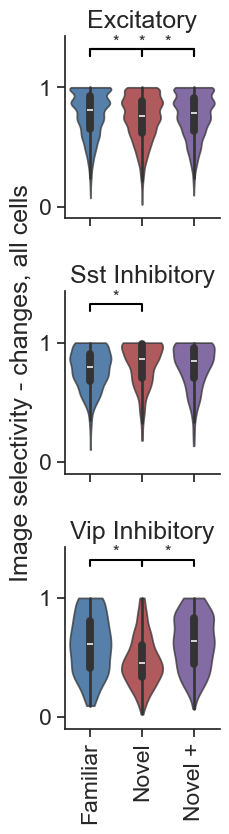

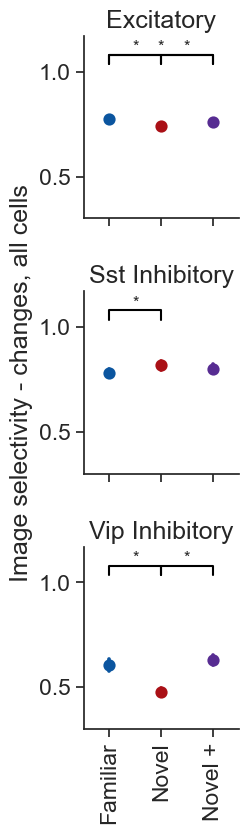

In [ ]:
# all cells

tmp = change_response_metrics.copy()

metric = 'lifetime_sparseness'
ylabel = 'Image selectivity - changes, all cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot(data=ct_data, y=metric, x='experience_level', order=order,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1063: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.violinplot

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


array([<Axes: title={'center': 'Excitatory'}>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='Image selectivity - changes, pref image responsive cells'>,
       <Axes: title={'center': 'Vip Inhibitory'}>], dtype=object)

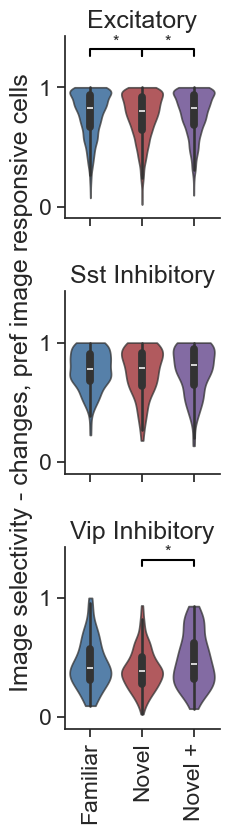

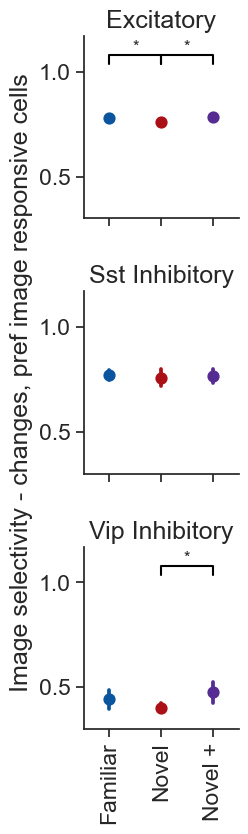

In [ ]:
# responsive cells

tmp = change_response_metrics.copy()
tmp = tmp[tmp.fraction_significant_p_value_gray_screen>0.2]

metric = 'lifetime_sparseness'
ylabel = 'Image selectivity - changes, pref image responsive cells'

event_type = 'changes'

ylims = [-0.1, 1.1]

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='violinplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_by_experience(tmp, metric, plot_type='pointplot',
                                           add_zero_line=False, event_type=event_type, data_type=data_type,
                                           ylabel=ylabel, ylims=(0.3, 0.9), save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)


#### tuning curve heatmaps

In [ ]:
# import visual_behavior.visualization.ophys.population_summary_figures as psf

# psf.plot_tuning_curve_heatmap(df, vmax=0.3, sup_title=None, title=None, ax=None, save_dir=None, folder=None, use_events=False,
#                               colorbar=True, include_omitted=False)

#### Omissions

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', order=order, dodge=dodge, join=False,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1015: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax[i] = sns.pointplot(data=ct_data, y=metric, x='experience_level', or

saving_stats


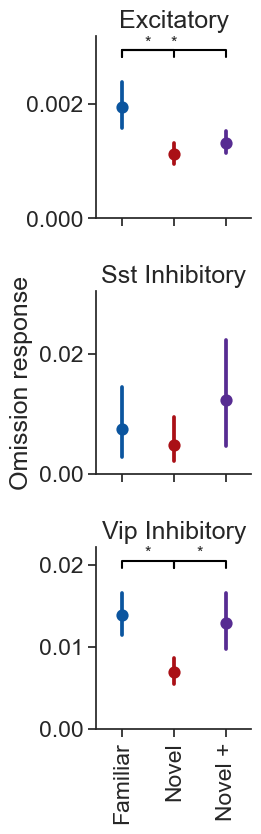

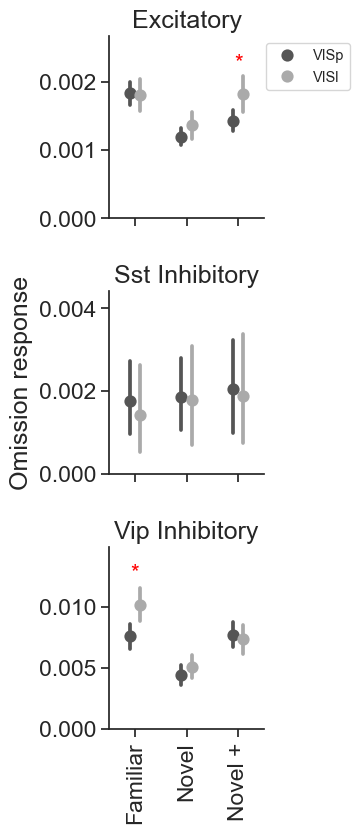

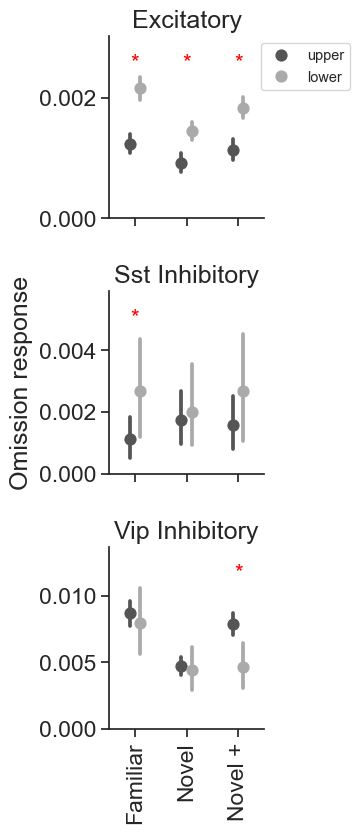

In [ ]:
metric = 'mean_response'
ylabel = 'Omission response'

event_type = 'omissions'

ylims = None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(omission_mdf, metric, plot_type='pointplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

ppf.plot_metric_distribution_all_conditions(omission_mdf, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, x='experience_level', y=metric,
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1119: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels(new_experience_levels, rotation=90,)  # ha='right')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1057: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[i] = sns.pointplot(data=ct_data, 

saving_stats


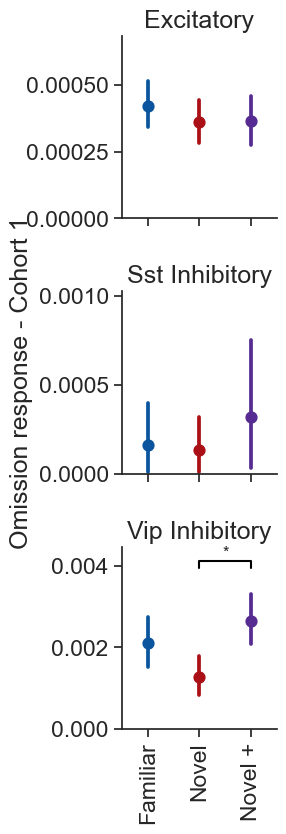

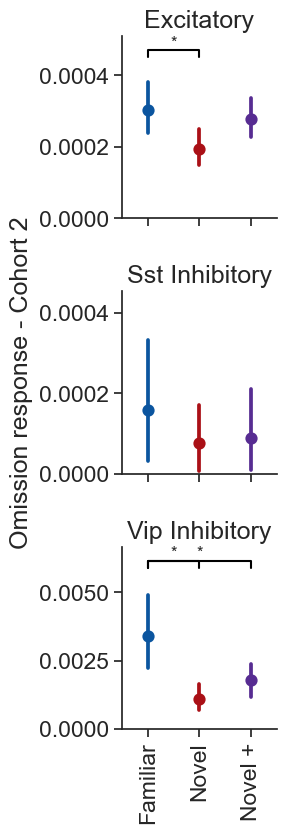

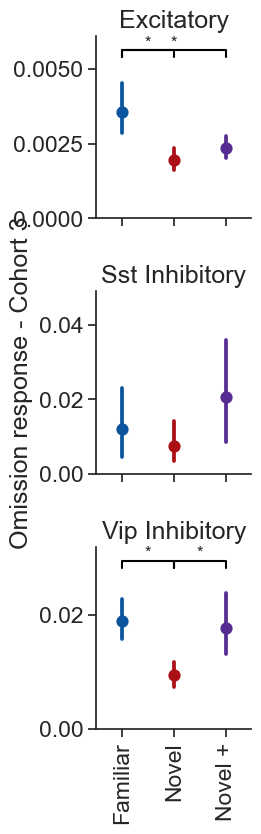

In [ ]:
metric = 'mean_response'
event_type = 'omissions'

ylims = None #(-0.001, 0.025)

for i, project_code in enumerate(['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']):
    project_data = omission_mdf[omission_mdf.project_code==project_code].copy()
    ylabel = 'Omission response - Cohort '+str(i+1)

    ppf.plot_metric_distribution_by_experience(project_data, metric, plot_type='pointplot',
                                            add_zero_line=False, event_type=event_type, data_type=data_type,
                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, suffix='_'+project_code, ax=None)

401 experiments in metric_data after merging with cells_table


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[i].set_xticklabels([x.split('.')[0] + '\n' + x.split('.')[1] for x in xorder], rotation=90, ha='center')
C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavi

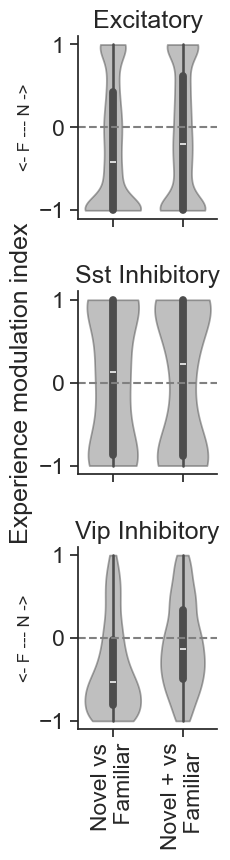

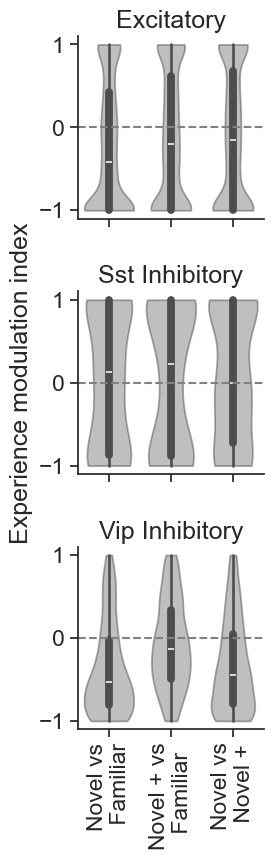

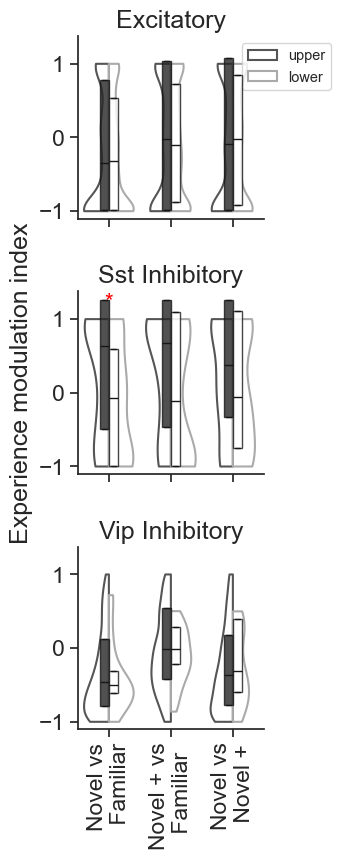

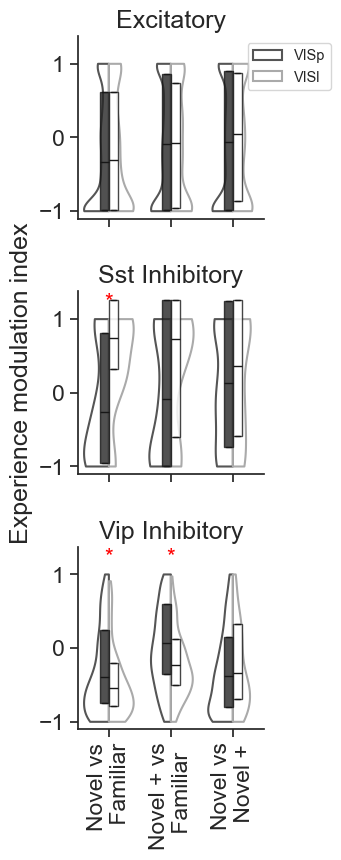

In [ ]:
metric = 'mean_response'
event_type = 'omissions'

exp_mod = cm.compute_experience_modulation_index(omission_mdf, metric, platform_cells_table)
exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


In [ ]:
# metric = 'mean_response_omissions'
# ylabel = 'Omission response'

# event_type = 'omissions'

# ylims = None #(-0.001, 0.025)

# ppf.plot_metric_distribution_by_experience(metrics_table, metric, plot_type='pointplot', 
#                                            add_zero_line=False, event_type=event_type, data_type=data_type,
#                                            ylabel=ylabel, ylims=ylims, save_dir=save_dir, ax=None)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [ ]:
# metric = 'mean_response_omissions'
# event_type = 'omissions'

# exp_mod = cm.compute_experience_modulation_index(metrics_table, metric, platform_cells_table)
# exp_mod = exp_mod.drop_duplicates(subset='cell_specimen_id')

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=False, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)

# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='layer', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)
# ppf.plot_experience_modulation_index(exp_mod, event_type, plot_type='violinplot', hue='targeted_structure', ylims=(-1.1, 1.1), include_all_comparisons=True, save_dir=save_dir)


In [ ]:
metrics_table.columns

Index(['cell_specimen_id', 'experience_level', 'ophys_experiment_id',
       'mean_response_pref_image', 'reliability_pref_image',
       'fraction_significant_p_value_gray_screen_pref_image',
       'fano_factor_pref_image', 'running_modulation_pref_image',
       'mean_response_all_images', 'lifetime_sparseness_images',
       'reliability_all_images',
       'fraction_significant_p_value_gray_screen_all_images',
       'fano_factor_all_images', 'running_modulation_all_images',
       'mean_response_omissions', 'reliability_omissions',
       'fraction_significant_p_value_gray_screen_omissions',
       'fano_factor_omissions', 'running_modulation_omissions',
       'omission_modulation_index', 'mean_response_changes',
       'mean_response_pre_change', 'lifetime_sparseness_changes',
       'reliability_changes',
       'fraction_significant_p_value_gray_screen_changes',
       'fano_factor_changes', 'running_modulation_changes',
       'change_modulation_index', 'hit_miss_index', 'be

## Within session changes

### Changes across epochs

In [ ]:
# params for stim response df creation
data_type = 'events'
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change', 'epoch']


suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

change_epoch_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=5)

change_epoch_mdf = change_epoch_mdf[change_epoch_mdf.is_change==True]

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_events_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache_new\multi_session_mean_response_dfs\interpolate_30Hz\mean_response_df_events_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl


there are 1885 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\brain_observatory\behavior\behavior_project_cache\behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,  0],
      dtype=int64)

In [ ]:
len(change_epoch_mdf.ophys_experiment_id.unique())

401

In [ ]:
change_epoch_mdf.epoch.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,  0],
      dtype=int64)

### Omissions across epochs

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted', 'epoch']


suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

epoch_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=5)
original_epoch_mdf = epoch_mdf.copy()

omission_epoch_mdf = epoch_mdf[epoch_mdf.omitted==True]
image_epoch_mdf = epoch_mdf[epoch_mdf.omitted==False]

In [ ]:
omission_epoch_mdf.epoch.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [ ]:
len(omission_epoch_mdf.ophys_experiment_id.unique())

401

In [ ]:
omission_epoch_mdf.experience_level.unique()

array(['Familiar', 'Novel', 'Novel +'], dtype=object)

In [ ]:
## remove truncated last epoch
# omission_epoch_mdf = omission_epoch_mdf[omission_epoch_mdf.epoch!=6]
# image_epoch_mdf = image_epoch_mdf[image_epoch_mdf.epoch!=6]

# omission_epoch_mdf['experience_epoch'] = [omission_epoch_mdf.iloc[row].experience_label + ' - ' + str(omission_epoch_mdf.iloc[row].epoch) for row in omission_epoch_mdf.index.values]
# image_epoch_mdf['experience_epoch'] = [image_epoch_mdf.iloc[row].experience_label + ' - ' + str(image_epoch_mdf.iloc[row].epoch) for row in image_epoch_mdf.index.values]

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:300: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  epoch_df['experience_epoch'] = epoch_df[['experience_level', 'epoch']].apply(axis=1, func=merge_experience_epoch)


['epoch 00 Familiar' 'epoch 00 Novel' 'epoch 00 Novel +'
 'epoch 01 Familiar' 'epoch 01 Novel' 'epoch 01 Novel +'
 'epoch 02 Familiar' 'epoch 02 Novel' 'epoch 02 Novel +'
 'epoch 03 Familiar' 'epoch 03 Novel' 'epoch 03 Novel +'
 'epoch 04 Familiar' 'epoch 04 Novel' 'epoch 04 Novel +'
 'epoch 05 Familiar' 'epoch 05 Novel' 'epoch 05 Novel +'
 'epoch 06 Familiar' 'epoch 06 Novel' 'epoch 06 Novel +'
 'epoch 07 Familiar' 'epoch 07 Novel' 'epoch 07 Novel +'
 'epoch 08 Familiar' 'epoch 08 Novel' 'epoch 08 Novel +'
 'epoch 09 Familiar' 'epoch 09 Novel' 'epoch 09 Novel +'
 'epoch 10 Familiar' 'epoch 10 Novel' 'epoch 10 Novel +'
 'epoch 11 Familiar' 'epoch 11 Novel' 'epoch 11 Novel +'
 'epoch 12 Familiar' 'epoch 12 Novel' 'epoch 12 Novel +']
Excitatory
Sst Inhibitory
Vip Inhibitory


array([<Axes: title={'center': 'Excitatory'}, ylabel='mean response'>,
       <Axes: title={'center': 'Sst Inhibitory'}, ylabel='mean response'>,
       <Axes: title={'center': 'Vip Inhibitory'}, xlabel='epoch within session', ylabel='mean response'>],
      dtype=object)

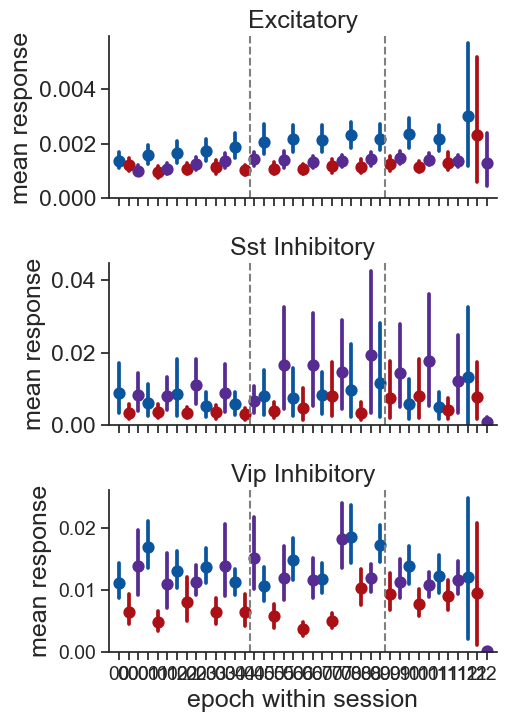

In [ ]:
# plot for all cells within each cre line
suffix = '_omission_within_session'
ppf.plot_mean_response_by_epoch(omission_epoch_mdf, metric='mean_response', horizontal=False, ymin=0, ylabel='mean response', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=12, suptitle=None, suffix=suffix, ax=None)

#### all images within session

['epoch 01 Familiar' 'epoch 01 Novel' 'epoch 01 Novel +'
 'epoch 02 Familiar' 'epoch 02 Novel' 'epoch 02 Novel +'
 'epoch 03 Familiar' 'epoch 03 Novel' 'epoch 03 Novel +'
 'epoch 04 Familiar' 'epoch 04 Novel' 'epoch 04 Novel +'
 'epoch 05 Familiar' 'epoch 05 Novel' 'epoch 05 Novel +'
 'epoch 06 Familiar' 'epoch 06 Novel' 'epoch 06 Novel +'
 'epoch 08 Familiar' 'epoch 08 Novel' 'epoch 08 Novel +'
 'epoch 09 Familiar' 'epoch 09 Novel' 'epoch 09 Novel +'
 'epoch 10 Familiar' 'epoch 10 Novel' 'epoch 10 Novel +'
 'epoch 11 Familiar' 'epoch 11 Novel' 'epoch 11 Novel +'
 'epoch 12 Familiar' 'epoch 12 Novel' 'epoch 12 Novel +'
 'epoch 13 Familiar' 'epoch 13 Novel' 'epoch 13 Novel +'
 'epoch 14 Familiar' 'epoch 14 Novel' 'epoch 14 Novel +'
 'epoch 15 Familiar' 'epoch 15 Novel' 'epoch 15 Novel +'
 'epoch 16 Familiar' 'epoch 16 Novel' 'epoch 16 Novel +'
 'epoch 17 Familiar' 'epoch 17 Novel' 'epoch 17 Novel +'
 'epoch 18 Familiar' 'epoch 18 Novel' 'epoch 18 Novel +'
 'epoch 19 Familiar' 'epoch 19 

array([<AxesSubplot:title={'center':'Excitatory'}, xlabel='epoch within session', ylabel='event magnitude'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, xlabel='epoch within session', ylabel='event magnitude'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, xlabel='epoch within session', ylabel='event magnitude'>],
      dtype=object)

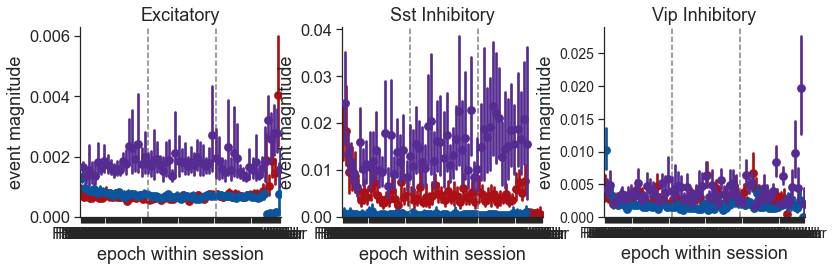

In [ ]:
# plot for all cells within each cre line
suffix = '_images_within_session'
ppf.plot_mean_response_by_epoch(image_epoch_mdf, metric='mean_response', horizontal=True, ymin=0, ylabel='event magnitude', estimator=np.mean,
                                save_dir=save_dir, folder='epochs', max_epoch=None, suptitle=None, suffix=suffix, ax=None)

## population averages for active/passive

In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']

inclusion_criteria = 'None'

passive_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.omitted==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 1248 experiments after filtering for inclusion criteria -  None


#### limit to containers in the main platform study

In [ ]:
platform_containers = platform_experiments.ophys_container_id.unique()
print(len(platform_containers))

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.ophys_container_id.isin(platform_containers)]

134


In [ ]:
passive_expts = passive_omission_mdf.copy()
# limit to passive sessions, but keep the first novel session to count against
passive_expts = passive_expts[(passive_expts.passive==True)|(passive_expts.experience_level=='Novel 1')].copy()
# add column indicating session number relative to first novel session
passive_expts = utilities.add_n_relative_to_first_novel_column(passive_expts)
# identify the familiar session prior to novel session that is passive
passive_expts = utilities.add_last_familiar_column(passive_expts)
# identify the second novel session that is passive
passive_expts = utilities.add_second_novel_column(passive_expts)

In [ ]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_expts, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive second_novel last_familiar               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                  34   
                                                   True    False        False                  34   
                                                                        True                   28   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  15   
                                                   True    False        False                  15   
                                                                        True                   14   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  17   
                                                   True    False        False                  17   
                                                                        True                   14   

                                                                                       n_ophys_session_id  \
full_genotype                                      passive second_novel last_familiar                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                          34   
                                                   True    False        False                          67   
                                                                        True                           28   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          15   
                                                   True    False        False                          30   
                                                                        True                           14   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          17   
                                                   True    False        False                          32   
                                                                        True                           14   

                                                                                       n_ophys_experiment_id  \
full_genotype                                      passive second_novel last_familiar                          
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                             62   
                                                   True    False        False                            114   
                                                                        True                              55   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                             30   
                                                   True    False        False                             50   
                                                                        True                              21   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                             42   
                                                   True    False        False                             70   
                                                                        True                              36   

                                                                                       n_ophys_container_id  \
full_genotype                                      passive second_novel last_familiar                         
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                            62   
                                                   True    False        False                            62   
                                                                        True                      

In [ ]:
# limit to closest familiar and novel passive sessions to the first novel session
passive_expts = passive_expts[(passive_expts.last_familiar==True)|(passive_expts.second_novel==True)].copy()

In [ ]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_expts, conditions_to_group, include_matched_cells=False)

,,,,n_mouse_id,n_ophys_session_id,n_ophys_experiment_id,n_ophys_container_id,n_cell_specimen_id
full_genotype,passive,second_novel,last_familiar,,,,,
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GCaMP6f)/wt,True,False,True,28,28,55,55,55
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,True,False,True,14,14,21,21,21
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,True,False,True,14,14,36,36,36


In [ ]:
print(len(passive_omission_mdf.mouse_id.unique()))
print(len(passive_omission_mdf.ophys_experiment_id.unique()))

66
854


In [ ]:
print(len(passive_omission_mdf.mouse_id.unique()), 'mice')
print(len(passive_omission_mdf.ophys_container_id.unique()), 'containers')
print(len(passive_omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(passive_omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
854 experiments
19874 cells


In [ ]:
conditions_to_group=['full_genotype', 'passive']

utilities.count_mice_expts_containers_cells(passive_omission_mdf, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False            34   
                                                   True             34   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False            15   
                                                   True             15   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False            17   
                                                   True             17   

                                                            n_ophys_session_id  \
full_genotype                                      passive                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                   157   
                                                   True                     67   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                    74   
                                                   True                     30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                    86   
                                                   True                     32   

                                                            n_ophys_experiment_id  \
full_genotype                                      passive                          
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                      277   
                                                   True                       114   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      144   
                                                   True                        50   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      199   
                                                   True                        70   

                                                            n_ophys_container_id  \
full_genotype                                      passive                         
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                      62   
                                                   True                       62   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      30   
                                                   True                       30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      42   
                                                   True                       42   

                                                            n_cell_specimen_id  
full_genotype                                      passive                      
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                 15305  
                                                   True                  10291  
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                   562  
                                                   True                    403  
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                  1429  
                                                   True                    876

In [ ]:
# # limit to mice in platform expts
# passive_omission_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_omission_mdf.mouse_id.values]

# passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.mouse_id.isin(platform_expts.mouse_id.unique())]
# print(len(passive_omission_mdf.mouse_id.unique()))

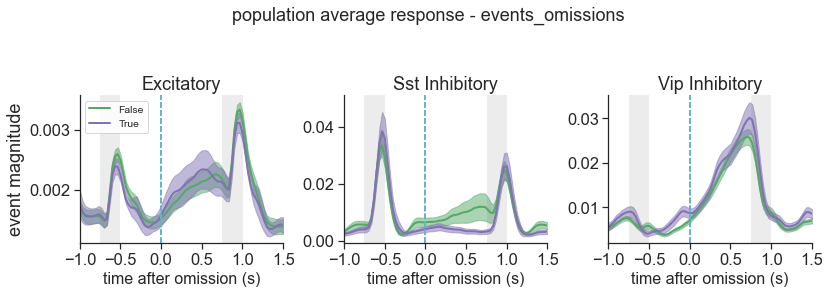

In [ ]:
df = passive_omission_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)


In [ ]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']

passive_change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, 'containers_with_all_levels', 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_change_mdf = passive_change_mdf[passive_change_mdf.is_change==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 955 experiments after filtering for inclusion criteria -  containers_with_all_levels


In [ ]:
# limit to mice in platform expts
passive_change_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_change_mdf.mouse_id.values]

passive_change_mdf = passive_change_mdf[passive_change_mdf.mouse_id.isin(experiment_table.mouse_id.unique())]
print(len(passive_change_mdf.mouse_id.unique()))

66


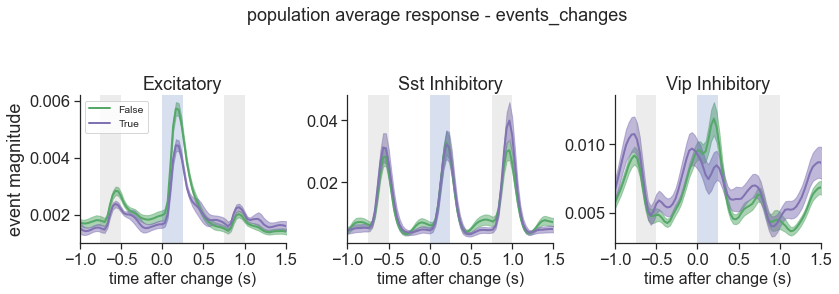

In [ ]:
df = passive_change_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

## fraction responsive cells

#### images

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='fraction\nresponsive'>],
      dtype=object)

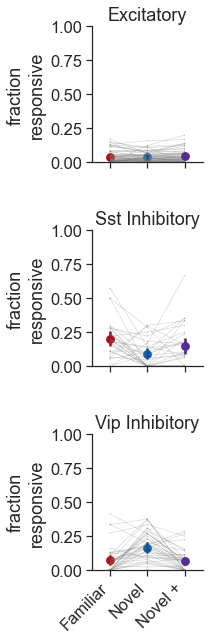

In [ ]:
ppf.plot_fraction_responsive_cells(each_image_mdf, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)

### changes

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='fraction\nresponsive'>],
      dtype=object)

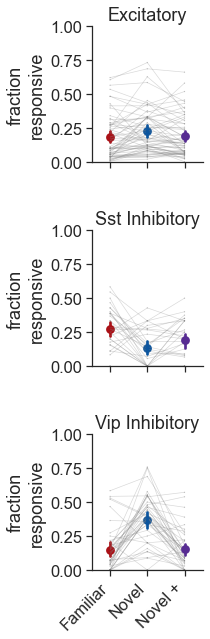

In [ ]:
ppf.plot_fraction_responsive_cells(change_mdf, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)

In [ ]:
# for project_code in change_mdf.project_code.unique(): 
#     df = change_mdf[change_mdf.project_code==project_code].copy()
#     ppf.plot_fraction_responsive_cells(df, responsiveness_threshold=0.1, ylim=(0,1),
#                                     save_dir=save_dir, folder=folder, suffix=change_suffix+'_'+project_code, 
#                                        horizontal=False, ax=None)

### omissions

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='fraction\nresponsive'>],
      dtype=object)

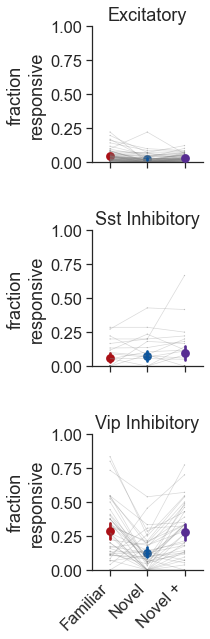

In [ ]:
ppf.plot_fraction_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix='_omissions', horizontal=False, ax=None)

In [ ]:
# for project_code in change_mdf.project_code.unique(): 
#     df = omission_mdf[omission_mdf.project_code==project_code].copy()
#     ppf.plot_fraction_responsive_cells(df, responsiveness_threshold=0.1, ylim=(0,1),
#                                     save_dir=save_dir, folder=folder, suffix=omission_suffix+'_'+project_code, 
#                                        horizontal=False, ax=None)

## metrics disributions

### get cell metrics table for changes

In [ ]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm
import visual_behavior.dimensionality_reduction.clustering.processing as processing

In [ ]:
experiments_table = platform_experiments.copy()

In [ ]:
ophys_experiment_ids = experiments_table.index.values

condition = 'changes'
stimuli = 'all_images'
session_subset = 'full_session'
    
inclusion_criteria = 'platform_experiments'

metrics_table = processing.generate_merged_table_of_model_free_metrics(data_type='events', session_subset='full_session',
                                                inclusion_criteria='platform_experiment_table', save_dir=save_dir)

original_metrics_table = metrics_table.copy()
# change_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

loading model free metrics table


In [ ]:
print(len(metrics_table.ophys_experiment_id.unique()))

370


In [ ]:
len(metrics_table.cell_specimen_id.unique())

14035

### save descriptive statistics for all metrics

In [ ]:
# conditions = ['cell_type', 'experience_level']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)

# conditions = ['cell_type', 'experience_level', 'targeted_structure']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)


# conditions = ['cell_type', 'experience_level', 'layer']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)


# conditions = ['cell_type', 'experience_level', 'targeted_structure', 'layer']
# filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
# metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)

In [ ]:
# metrics_stats = load_descriptive_stats_for_conditions(conditions, save_dir, filename)

### plotting

In [ ]:
# test stats
anova, tukey_table = ppf.test_significant_metric_averages(change_metrics_table, 'change_modulation_index')
tukey_table

NameError: name 'change_metrics_table' is not defined

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='change response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='change response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='change response'>],
      dtype=object)

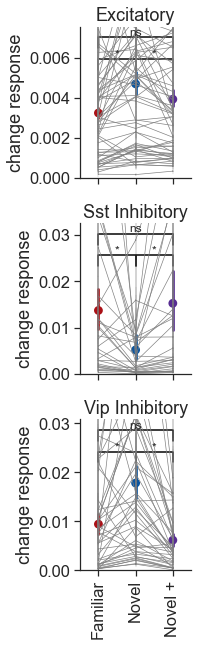

In [ ]:
metric = 'change_response'
ylabel = 'change response'
event_type = 'changes'

ppf.plot_metric_distribution_by_experience(change_metrics_table, metric, event_type, stripplot=False, pointplot=True, add_zero_line=False,
                                       show_containers=True, ylabel=ylabel, ylims=None, save_dir=save_dir, ax=None) #ylims=(-0.001, 0.025)


### change response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


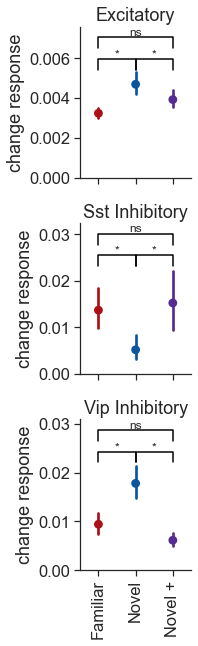

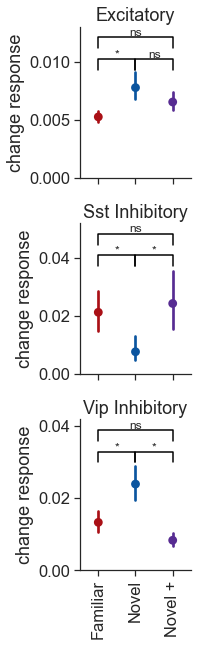

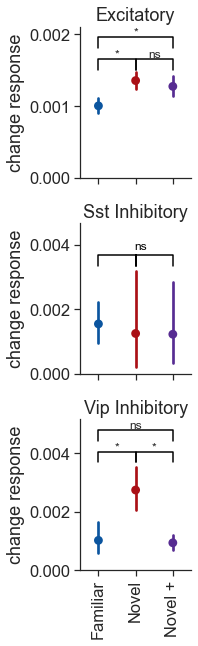

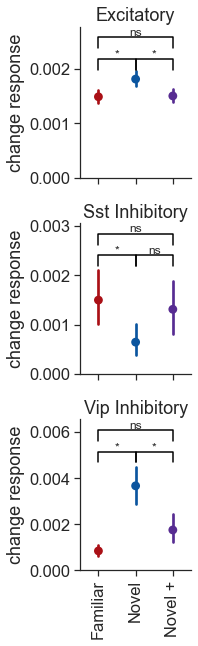

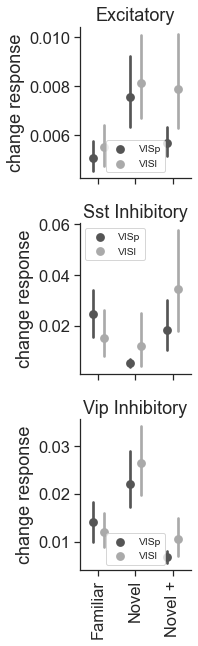

...

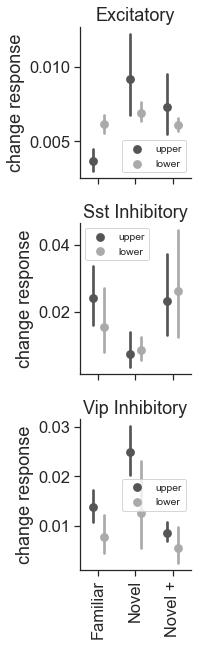

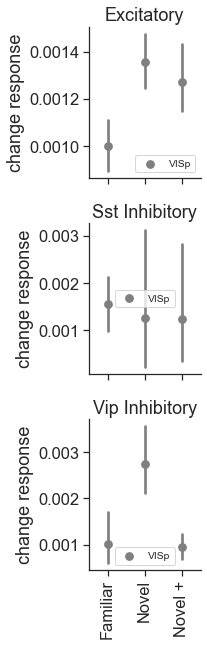

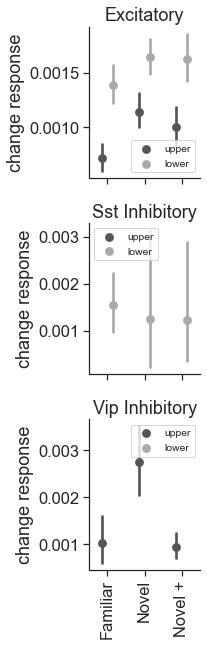

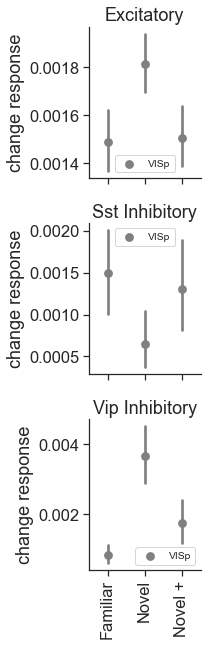

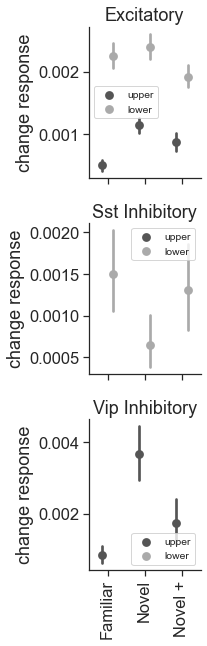

In [ ]:
# mean response across experience levels 
metric = 'change_response'
ylabel = 'change response'
ylabel = 'event magnitude'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel='change response', ylims=ylims, add_zero_line=False, save_dir=save_dir)

### pre-change response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


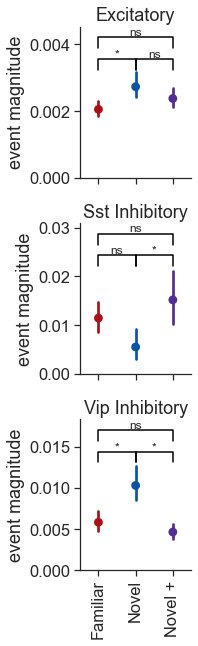

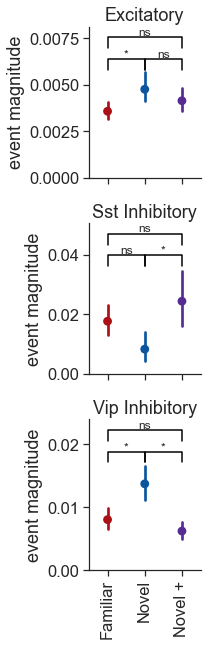

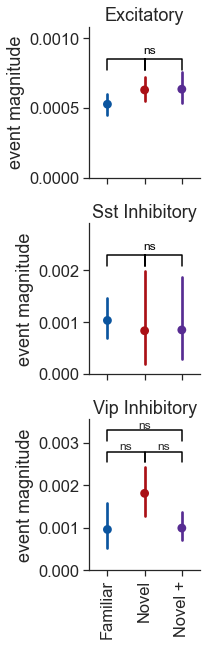

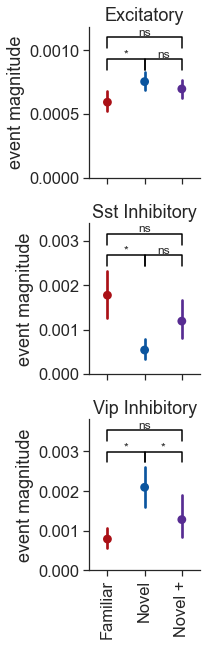

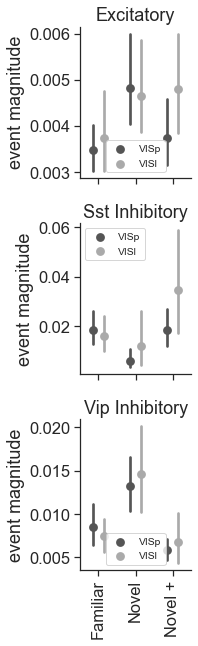

...

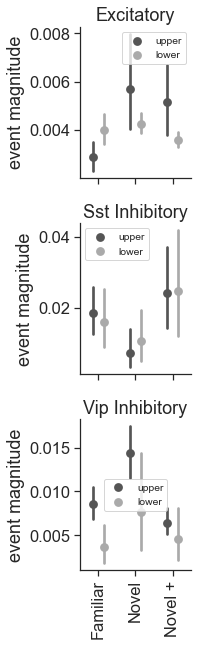

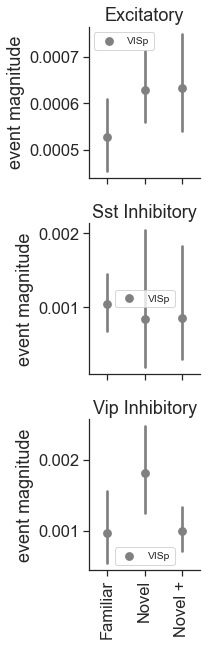

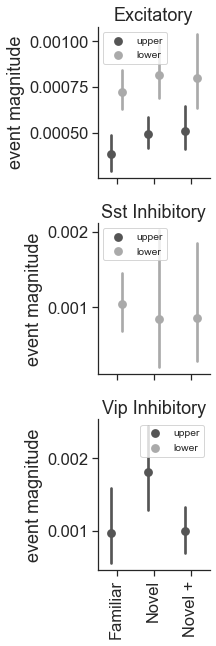

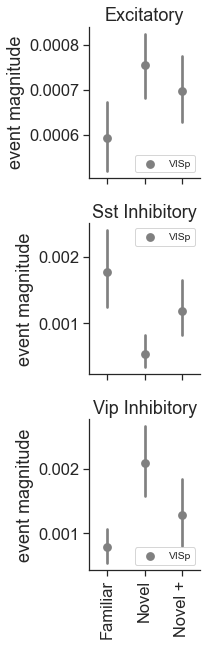

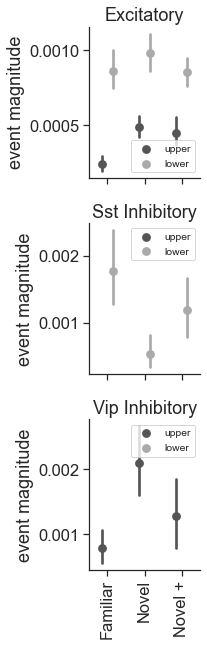

In [ ]:
# mean response across experience levels 
metric = 'pre_change_response'
ylabel = 'pre-change response'

event_type = 'pre_change'

ylims = None #(-0.001, 0.025)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### change modulation index

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


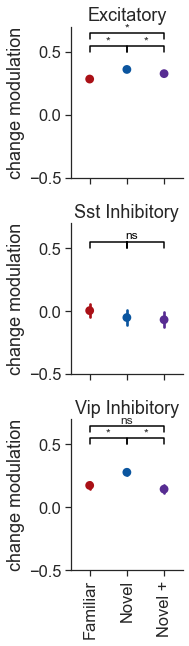

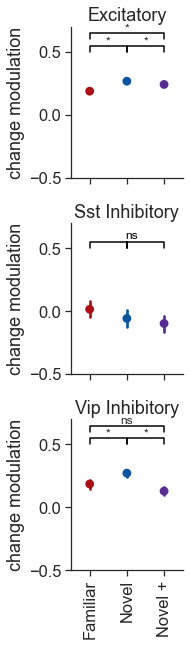

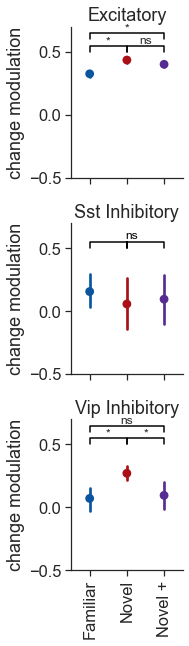

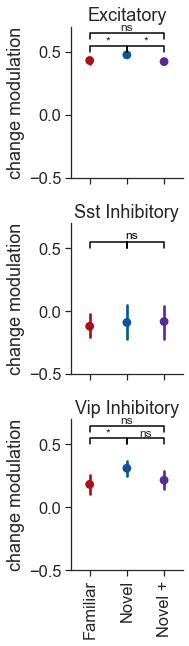

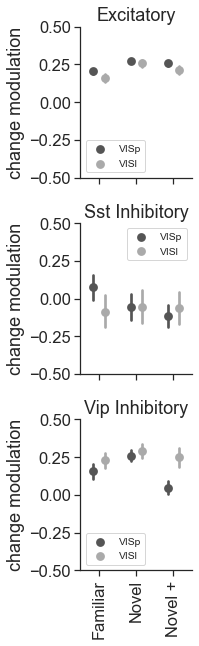

...

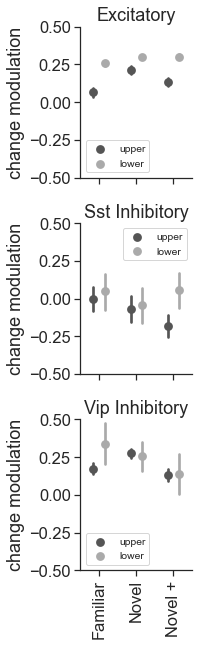

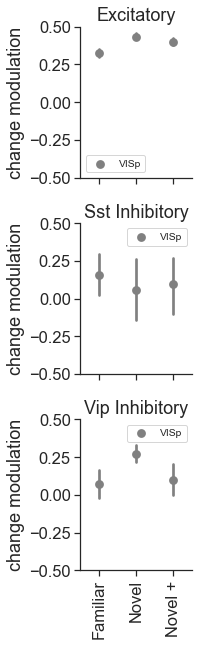

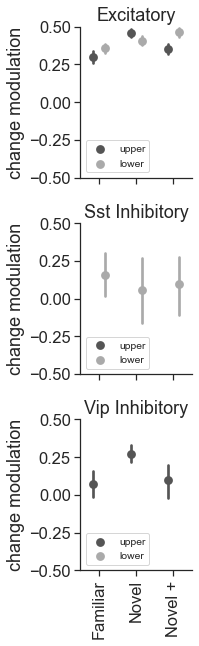

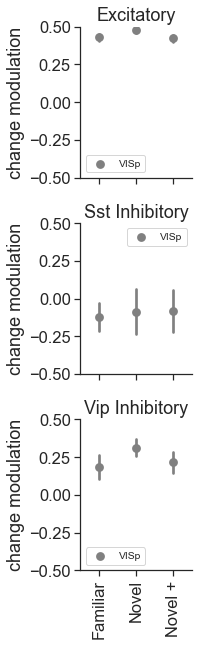

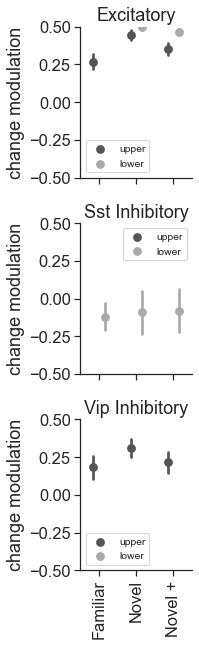

In [ ]:
metric = 'change_modulation_index'
ylabel = 'change modulation'
event_type = 'changes'

ylims = (-0.5, 0.5)


metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### reliability

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats


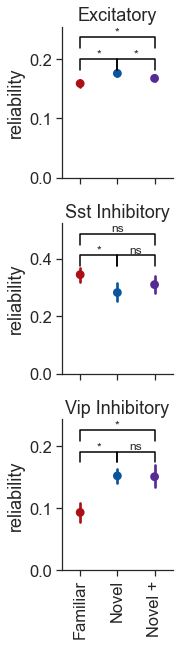

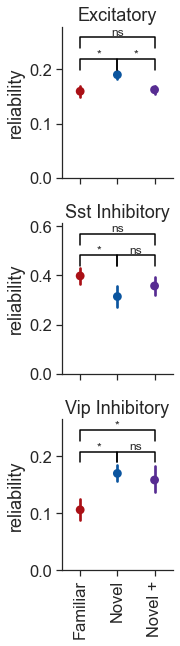

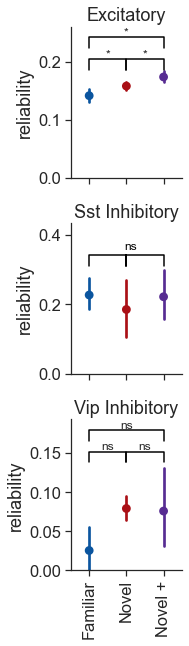

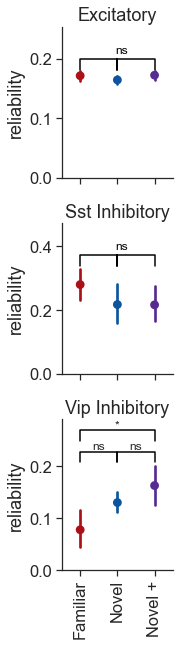

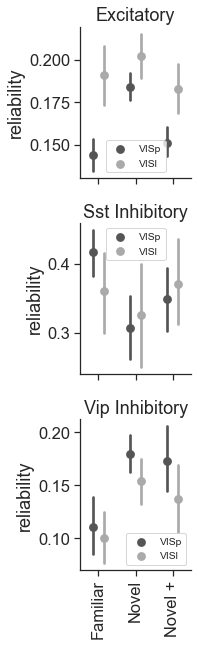

...

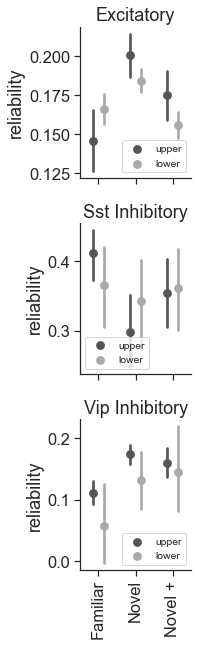

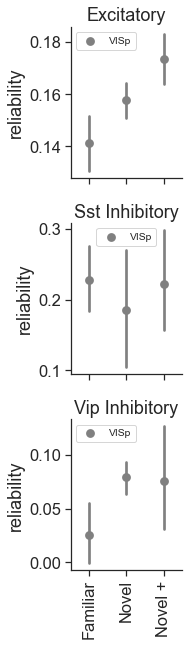

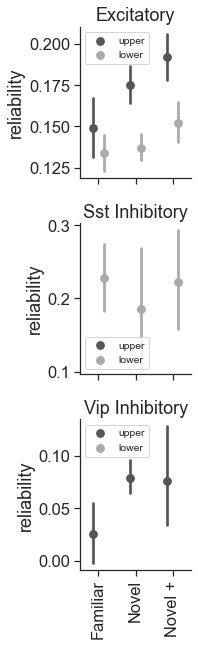

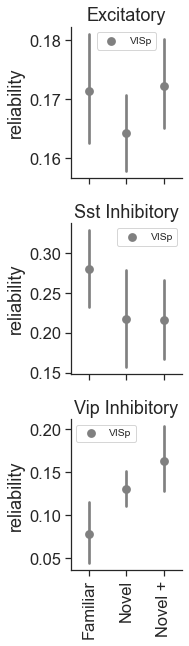

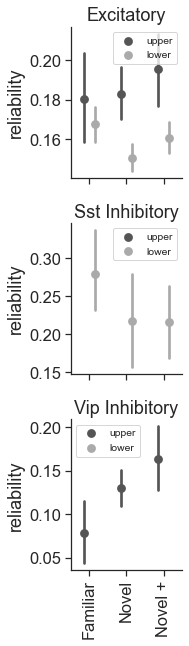

In [ ]:
metric = 'reliability'
ylabel = 'reliability'
event_type = 'changes'

ylims = None

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### lifetime sparseness

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


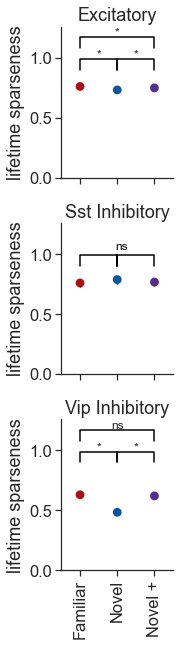

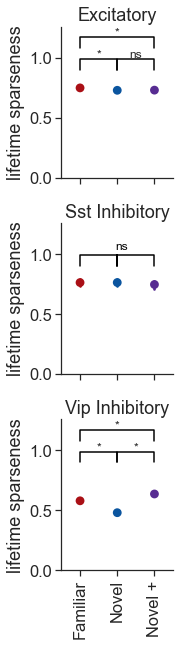

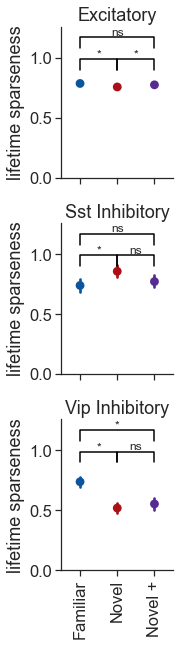

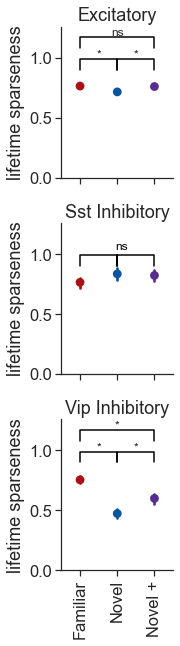

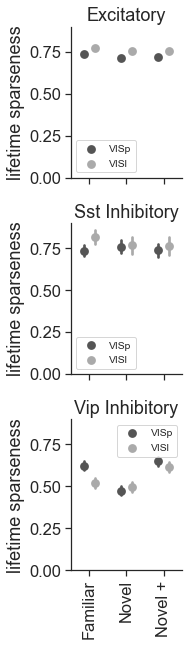

...

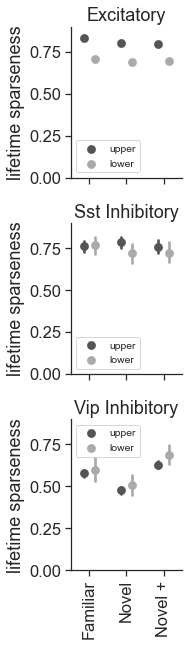

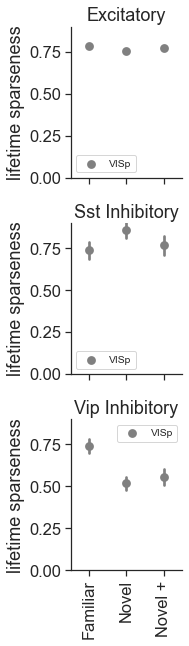

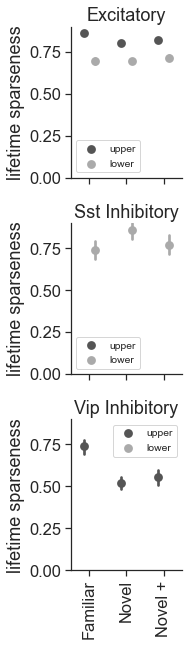

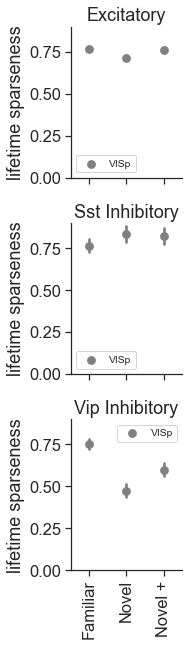

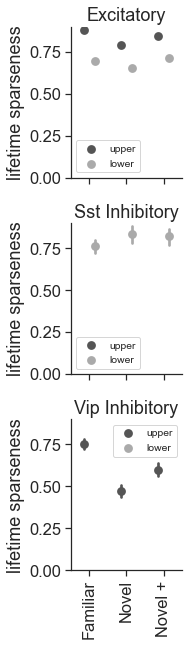

In [ ]:
metric = 'lifetime_sparseness'
ylabel = 'lifetime sparseness'
event_type = 'changes'

ylims = (-0.001, 0.9)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### experience modulation of change response

402 experiments in metric_data after merging with cells_table


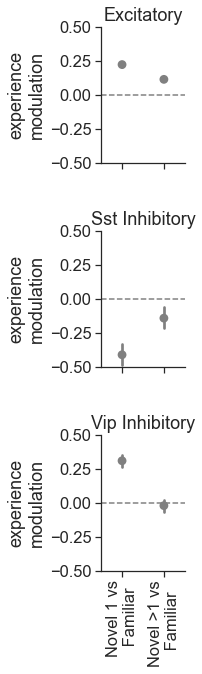

In [ ]:

metric = 'change_response'
event_type = 'changes'

metric_data = cm.compute_experience_modulation_index(change_metrics_table, metric, cells_table)
metric_data = metric_data.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(metric_data, event_type, save_dir=None)


## omissions 

In [ ]:
# ophys_experiment_ids = experiments_table.index.values

# condition = 'omissions'
# stimuli = 'all_images'
# session_subset = 'full_session'
    
# omission_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


 20%|██        | 82/402 [00:17<00:53,  5.94it/s]

problem for experiment 988542529
problem for experiment 989191384


 23%|██▎       | 92/402 [00:19<00:47,  6.52it/s]

problem for experiment 994790561


 29%|██▊       | 115/402 [00:24<00:59,  4.78it/s]

problem for experiment 877669822


 38%|███▊      | 152/402 [00:32<01:24,  2.97it/s]

problem for experiment 994082680


 51%|█████     | 205/402 [00:42<00:31,  6.20it/s]

problem for experiment 991852002


 52%|█████▏    | 209/402 [00:43<00:37,  5.09it/s]

problem for experiment 991852001


 54%|█████▍    | 218/402 [00:45<00:38,  4.79it/s]

problem for experiment 991852004


 55%|█████▍    | 221/402 [00:46<00:31,  5.72it/s]

problem for experiment 991852005


 64%|██████▍   | 258/402 [00:53<00:30,  4.76it/s]

problem for experiment 977978321


 68%|██████▊   | 272/402 [00:56<00:25,  5.07it/s]

problem for experiment 981178537


 71%|███████   | 285/402 [00:58<00:23,  4.99it/s]

problem for experiment 882551937
problem for experiment 882968566


 72%|███████▏  | 288/402 [00:59<00:15,  7.23it/s]

problem for experiment 882551947


 77%|███████▋  | 309/402 [01:03<00:21,  4.40it/s]

problem for experiment 1043831389


 82%|████████▏ | 328/402 [01:07<00:11,  6.21it/s]

problem for experiment 1051249031
problem for experiment 1051423446


 90%|█████████ | 362/402 [01:14<00:07,  5.14it/s]

problem for experiment 1078904675


100%|██████████| 402/402 [01:23<00:00,  4.84it/s]
c:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\pandas\core\generic.py:2718: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['condition', 'data_type', 'exception', 'filter_events', 'interpolate',
       'ophys_experiment_id', 'session_subset', 'stimuli', 'use_events'],
      dtype='object')]

  encoding=encoding,


there are 384 experiments in the returned cell_metrics table


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)
C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To s

removing 1 problematic experiments


In [ ]:
print(len(experiments_table.index.values))

NameError: name 'experiments_table' is not defined

In [ ]:
print(len(omission_metrics_table.ophys_experiment_id.unique()))

NameError: name 'omission_metrics_table' is not defined

### save descriptive stats

In [ ]:
conditions = ['cell_type', 'experience_level']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)

conditions = ['cell_type', 'experience_level', 'targeted_structure']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'targeted_structure', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)

NameError: name 'condition' is not defined

### mean response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


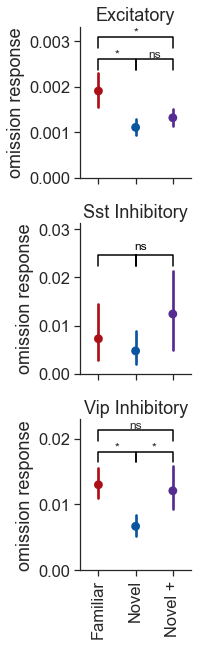

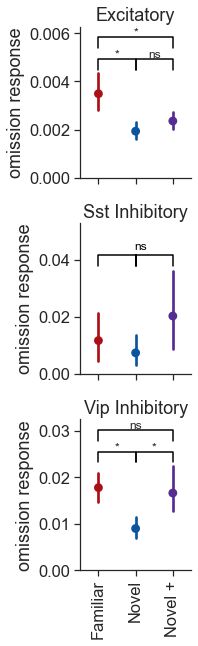

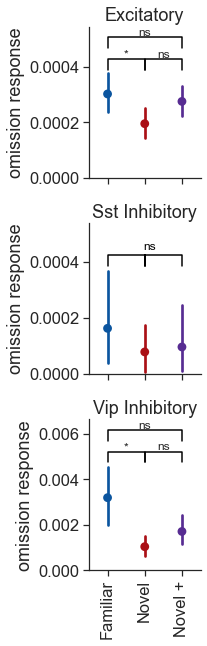

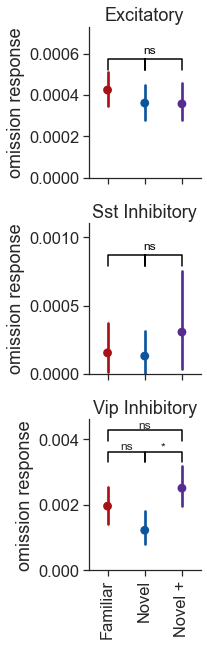

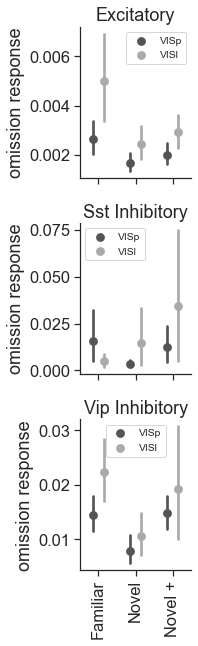

...

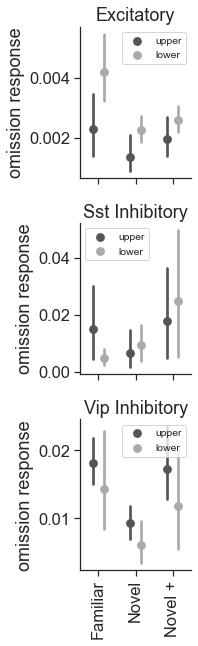

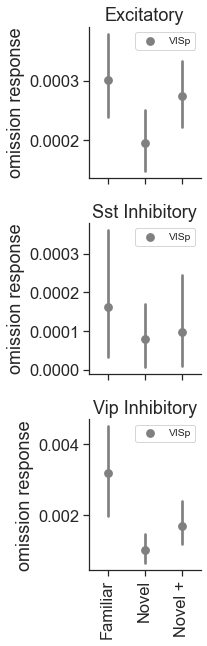

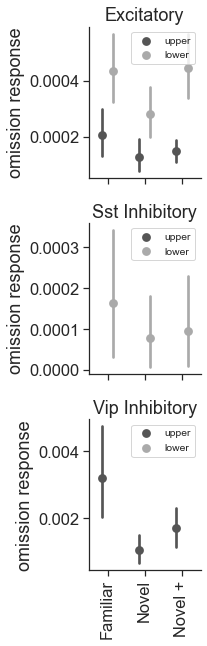

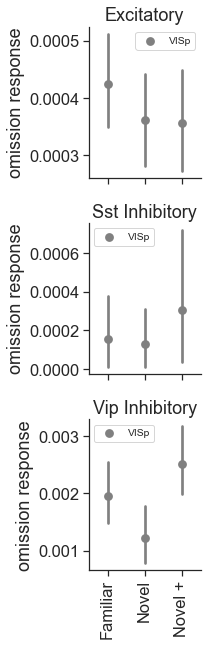

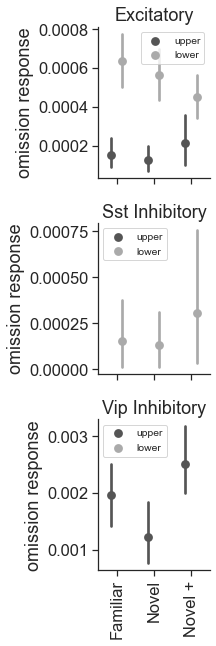

In [ ]:
metric = 'omission_response'
ylabel = 'omission response'
# ylabel = 'event magnitude'
event_type = 'omissions'

ylims = None #(-0.001, 0.025)

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel='omission response', ylims=ylims, add_zero_line=False, save_dir=save_dir)

### reliability 

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


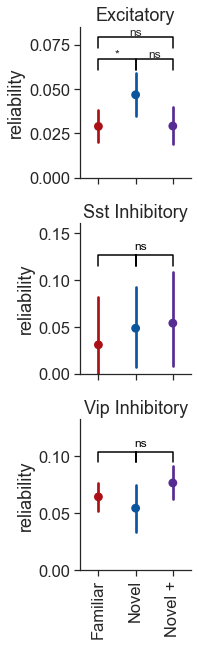

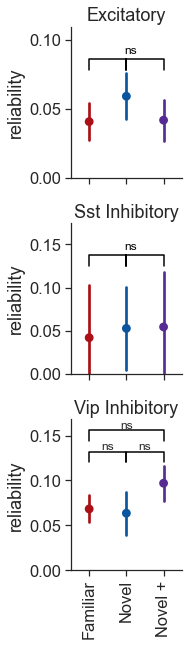

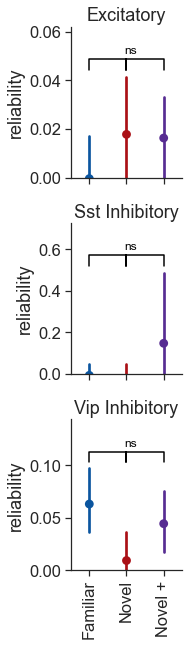

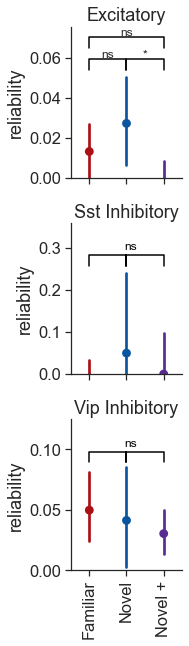

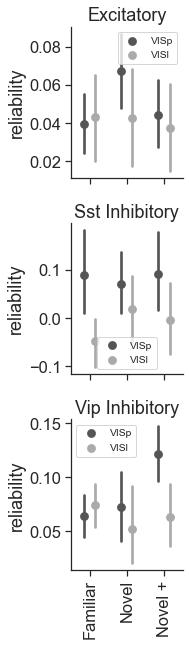

...

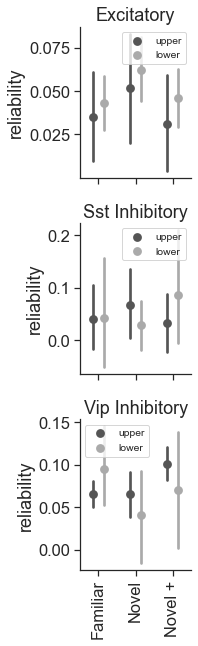

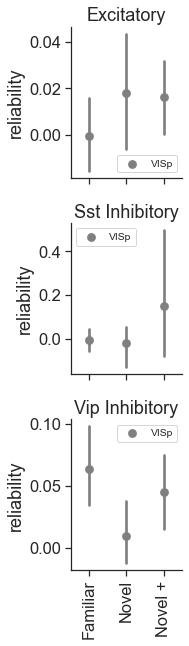

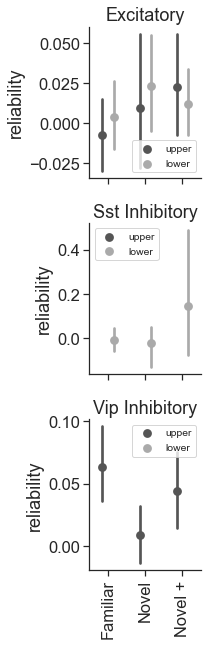

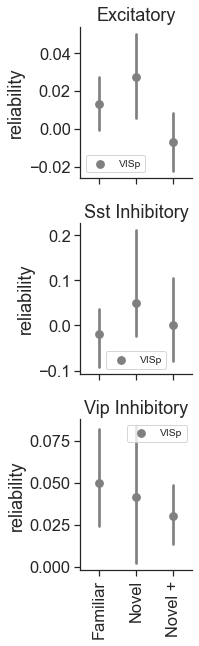

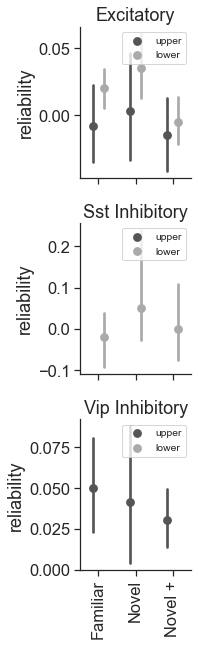

In [ ]:
metric = 'reliability'
ylabel = 'reliability'

ylims = None

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


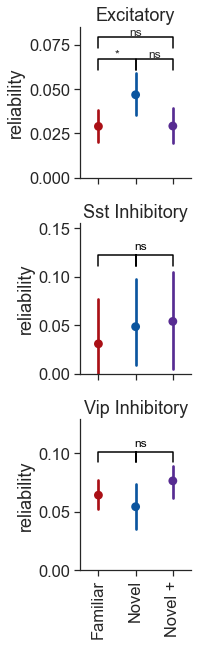

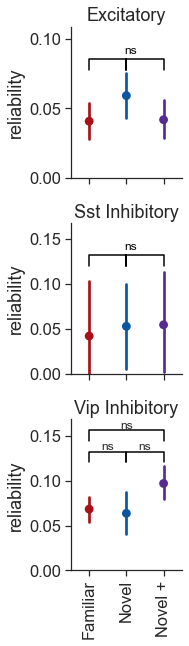

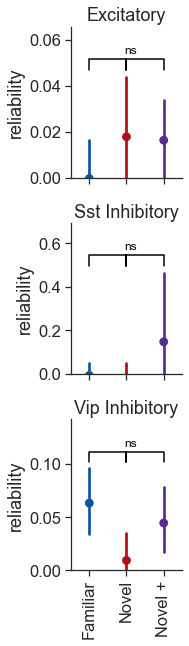

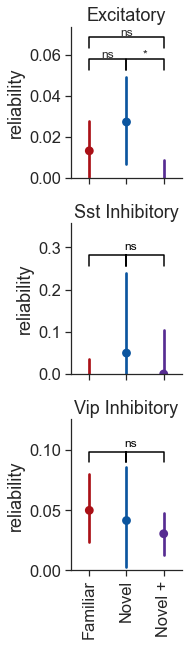

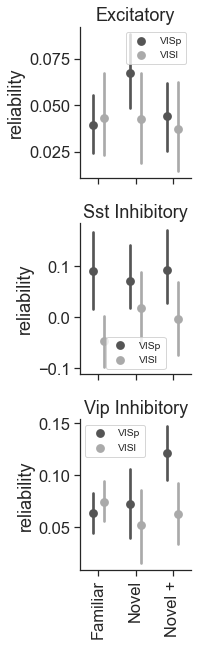

...

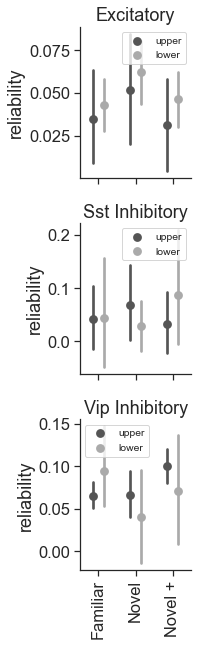

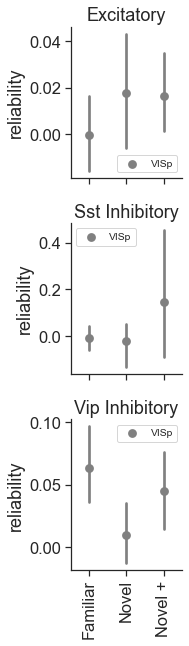

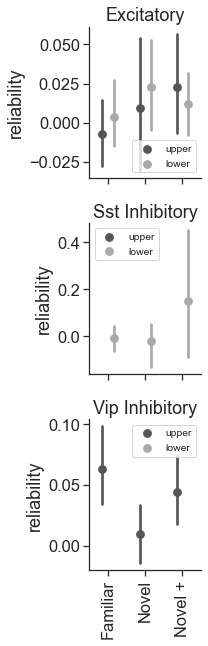

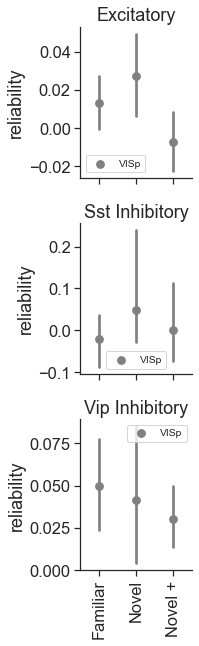

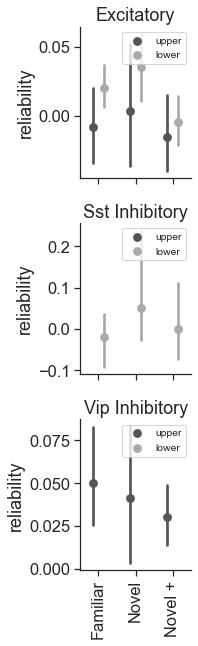

In [ ]:
metric = 'reliability'
ylabel = 'reliability'

ylims = None

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### running modulation

saving_stats
saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
saving_stats


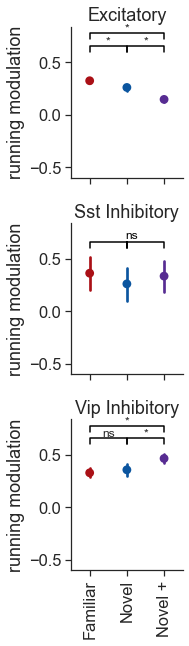

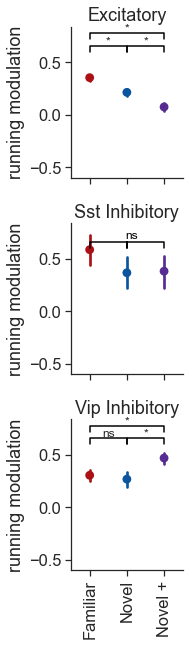

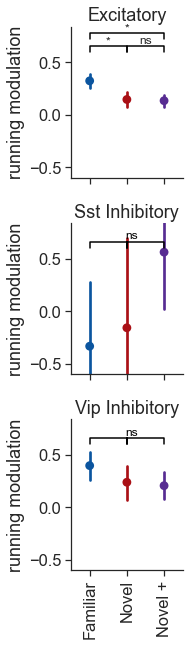

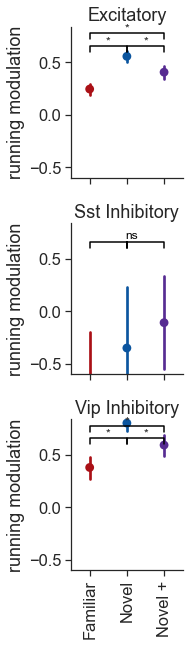

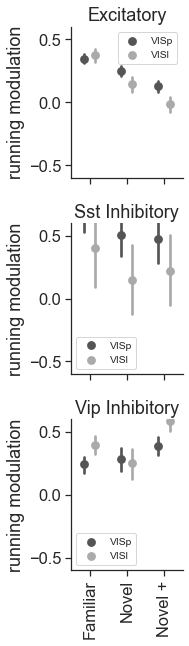

...

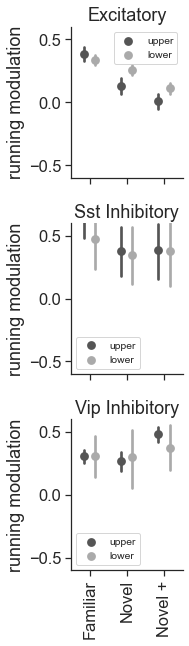

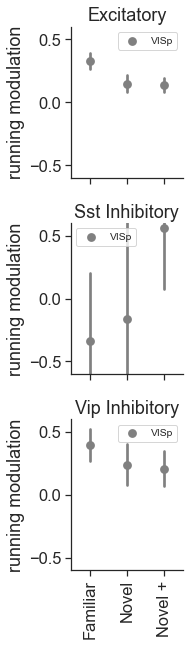

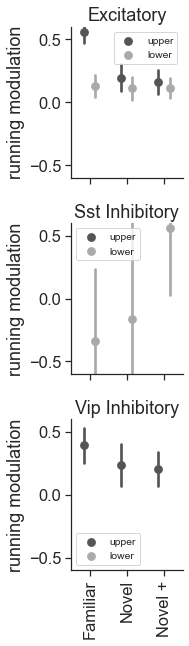

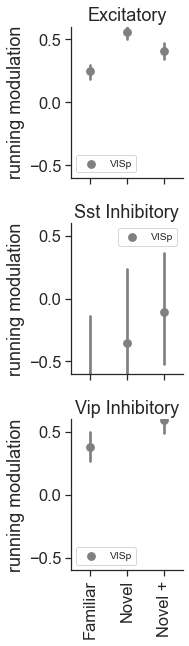

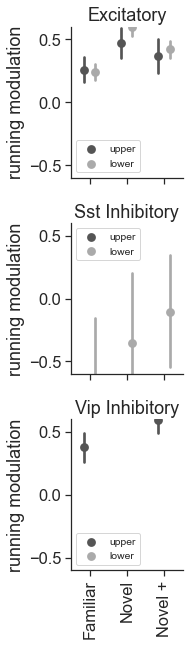

In [ ]:
metric = 'running_modulation_index'
ylabel = 'running modulation'
event_type = 'omissions'

ylims = (-0.6, 0.6)

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### omission modulation by experience

384 experiments in metric_data after merging with cells_table


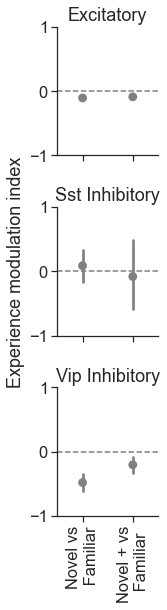

In [ ]:
metric = 'omission_response'
event_type = 'omissions'

metric_data = cm.compute_experience_modulation_index(omission_metrics_table, metric, platform_cells_table)
metric_data = metric_data.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(metric_data, event_type, save_dir=None)


# Behavior

### running speed

### changes

In [ ]:
# params for stim response df creation
event_type = 'all'
data_type = 'running_speed'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']

inclusion_criteria = 'platform_experiments' 

running_speed_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

running_speed_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

running_speed_mdf = running_speed_mdf[running_speed_mdf.is_change==True]
running_speed_mdf = running_speed_mdf.drop_duplicates(subset='behavior_session_id')
running_speed_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in running_speed_mdf.experience_level.values]



C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\original_frame_rate
mean_response_df_running_speed_all_is_change_platform_experiments.pkl
loading multi_session_df from saved file at \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\original_frame_rate\mean_response_df_running_speed_all_is_change_platform_experiments.pkl
there are 1885 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 1884 experiments after filtering for inclusion criteria -  platform_experiments


In [ ]:
running_speed_mdf = running_speed_mdf[running_speed_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(running_speed_mdf))

202


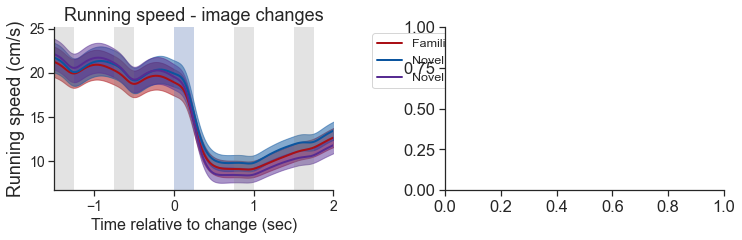

In [ ]:
df = running_speed_mdf.copy()
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
                                                        axes_column, hue_column, horizontal=True, ylabel='Running speed (cm/s)',
                                                        xlim_seconds=xlim_seconds, interval_sec=1, xlabel='Time relative to change (sec)',
                                                        palette=palette, ax=None, title='Running speed - image changes', 
                                                        suptitle=None, save_dir=save_dir, folder=folder, suffix=suffix)


saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Running speed (cm/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

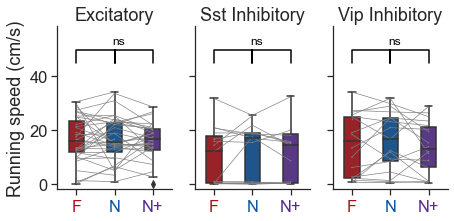

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. running speed\nafter changes (cm/s)'
ylabel = 'Running speed (cm/s)'

event_type = 'running_speed_changes'

ylims = (-2, 45)

metrics_table = running_speed_mdf.copy()

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, stripplot=False, show_containers=True, save_dir=save_dir)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:869: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  # add stats to plot if only looking at experience levels


saving_stats


<AxesSubplot:ylabel='Running speed (cm/s)'>

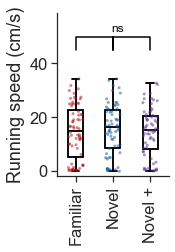

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Running speed (cm/s)'
event_type = 'changes'

ylims = (-2, 45)

metrics_table = running_speed_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [ ]:
# df = running_speed_mdf.copy()
# xlim_seconds=[-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='changes', suffix=running_speed_suffix,
#                                                                save_dir=save_dir, folder=folder, ax=None)


                                               
# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='changes', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in running_speed_mdf.project_code.unique():
    
#     df = running_speed_mdf[running_speed_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='running speed\n(cm/s)',
#                                                                   data_type='running_speed', event_type='changes',
#                                                                   suffix=running_speed_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

In [ ]:
# df = running_speed_mdf.copy()
# xlim_seconds=[-1, 1.5]

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# # xlim_seconds=[-1, 0.75]

# suffix = '_omissions_overlay_'+project_code+'_matched_to_Scientifica'

# ax = ppf.plot_population_averages_for_conditions(df, 'running_speed', 'changes',
#                                                         axes_column, hue_column, horizontal=True,
#                                                         xlim_seconds=xlim_seconds, interval_sec=0.5,
#                                                         palette=palette, ax=None, title=None, suptitle=None,
#                                                         save_dir=save_dir, folder=folder, suffix=suffix)


### omissions

In [ ]:
# params for stim response df creation
event_type = 'all'
data_type = 'running_speed'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


running_speed_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

running_speed_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

running_speed_omission_mdf = running_speed_omission_mdf[running_speed_omission_mdf.omitted==True]
running_speed_omission_mdf = running_speed_omission_mdf.drop_duplicates(subset='behavior_session_id')
running_speed_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in running_speed_omission_mdf.experience_level.values]

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\original_frame_rate
mean_response_df_running_speed_all_omitted_platform_experiments.pkl


  6%|▌         | 1/18 [00:02<00:40,  2.35s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:04<00:13,  1.03it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:07<00:10,  1.03it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:10<00:05,  1.19it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:12<00:03,  1.25it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:14<00:00,  1.27it/s]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:01<00:08,  1.96it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:01<00:04,  3.11it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:02<00:02,  3.62it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:03<00:02,  3.29it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:03<00:01,  3.45it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:04<00:00,  3.93it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:02<00:34,  2.05s/it]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:03<00:09,  1.51it/s]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:03<00:04,  2.20it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:04<00:02,  2.95it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:05<00:01,  2.91it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:06<00:00,  2.60it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:02<00:11,  1.29it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:04<00:07,  1.54it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:06<00:05,  1.50it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:07<00:03,  1.62it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:09<00:01,  1.73it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:11<00:00,  1.60it/s]


saving multi session df to pkl
there are 1885 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 1884 experiments after filtering for inclusion criteria -  platform_experiments


In [ ]:
running_speed_omission_mdf = running_speed_omission_mdf[running_speed_omission_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(running_speed_omission_mdf))

202


In [ ]:
# df = running_speed_omission_mdf.copy()
# xlim_seconds = [-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='omissions', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='omissions', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in running_speed_mdf.project_code.unique():
    
#     df = running_speed_mdf[running_speed_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='running speed\n(cm/s)',
#                                                                   data_type='running_speed', event_type='omissions',
#                                                                   suffix=running_speed_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

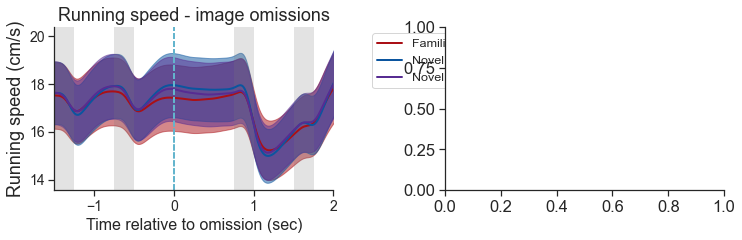

In [ ]:
df = running_speed_omission_mdf.copy()
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'running_speed', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Running speed - image omissions', 
                                                        suptitle=None, ylabel='Running speed (cm/s)', xlabel='Time relative to omission (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Running speed (cm/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

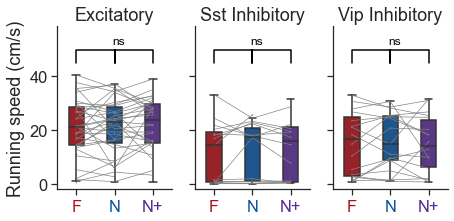

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. running speed\nafter omissions (cm/s)'
ylabel = 'Running speed (cm/s)'

event_type = 'omissions'

ylims = (-2, 45)

metrics_table = running_speed_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, stripplot=False, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:869: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  # add stats to plot if only looking at experience levels


saving_stats


<AxesSubplot:ylabel='Running speed (cm/s)'>

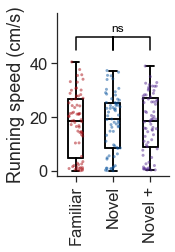

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Running speed (cm/s)'
event_type = 'omissions'
data_type = 'running_speed'

ylims = (-2, 45)

metrics_table = running_speed_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, data_type, ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)

# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

saving_stats


<AxesSubplot:ylabel='running speed (cm/s)'>

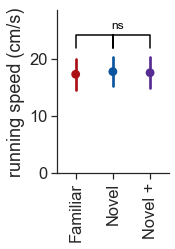

In [ ]:
# # mean response across experience levels 
# metric = 'mean_response'
# ylabel = 'running speed (cm/s)'
# event_type = 'omissions'

# ylims = (0, 22)

# metrics_table = running_speed_omission_mdf.copy()

# ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'running_speed', ylabel=ylabel, ylims=ylims, 
#                                             pointplot=True, add_zero_line=False, save_dir=save_dir)

### pupil width

In [ ]:
# params for stim response df creation
event_type = 'all'
data_type = 'pupil_width'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pupil_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pupil_mdf = pupil_mdf[pupil_mdf.is_change==True]
pupil_mdf = pupil_mdf.drop_duplicates(subset='behavior_session_id')
pupil_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in pupil_mdf.experience_level.values]

# limit to platform xpts
pupil_mdf = pupil_mdf[pupil_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(pupil_mdf))

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_pupil_width_all_is_change_platform_experiments.pkl


  6%|▌         | 1/18 [00:01<00:33,  1.98s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:03<00:11,  1.17it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:06<00:09,  1.16it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:08<00:04,  1.46it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:10<00:02,  1.49it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:01<00:08,  1.99it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:01<00:04,  2.84it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:02<00:03,  3.29it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:03<00:03,  2.61it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:04<00:01,  2.96it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:05<00:00,  3.18it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:00<00:12,  1.32it/s]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:01<00:05,  2.46it/s]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:02<00:03,  3.15it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:03<00:01,  4.07it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:04<00:01,  3.36it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:05<00:00,  3.39it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:00<00:03,  4.73it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:01<00:03,  3.47it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:02<00:02,  3.93it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:03<00:01,  4.07it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:04<00:00,  3.32it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:05<00:00,  3.51it/s]


saving multi session df to pkl
there are 1245 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 1244 experiments after filtering for inclusion criteria -  platform_experiments
201


In [ ]:
# df = pupil_mdf.copy()
# xlim_seconds = [-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type='pupil_width', event_type='changes', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='changes', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in pupil_mdf.project_code.unique():
    
#     df = pupil_mdf[pupil_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='pupil width\n(normalized)',
#                                                                   data_type=data_type, event_type='changes',
#                                                                   suffix=pupil_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

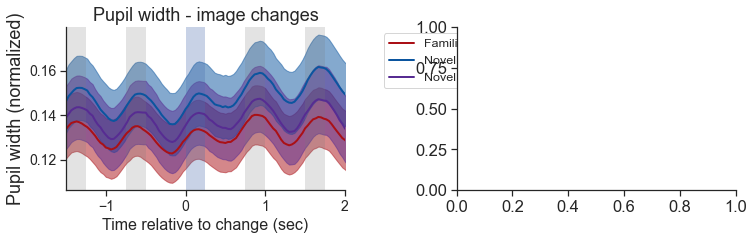

In [ ]:
df = pupil_mdf.copy()
# set baselin to 0 instead of 1
df['mean_trace'] = [mean_trace-1 for mean_trace in df.mean_trace.values]

df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'pupil_width', 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Pupil width - image changes', 
                                                        suptitle=None, ylabel='Pupil width (normalized)', 
                                                        xlabel='Time relative to change (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Pupil width (norm.)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

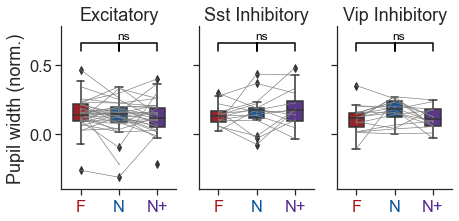

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. pupil width\nafter changes\n(normalized)'
ylabel = 'Pupil width (norm.)'

event_type = 'changes'

ylims = (-0.4, 0.6)

metrics_table = pupil_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, stripplot=False, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:869: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  # add stats to plot if only looking at experience levels


saving_stats


<AxesSubplot:ylabel='Pupil width (norm.)'>

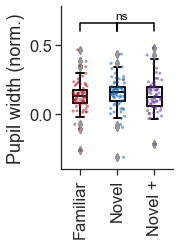

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Pupil width (norm.)'
event_type = 'changes'

ylims = (-0.4, 0.6)

metrics_table = pupil_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

### omissions

In [ ]:
# params for stim response df creation
event_type = 'all'
data_type = 'pupil_width'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pupil_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pupil_omission_mdf = pupil_omission_mdf[pupil_omission_mdf.omitted==True]
pupil_omission_mdf = pupil_omission_mdf.drop_duplicates(subset='behavior_session_id')
pupil_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in pupil_omission_mdf.experience_level.values]

# limit to platform xpts
pupil_omission_mdf = pupil_omission_mdf[pupil_omission_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(pupil_omission_mdf))

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_pupil_width_all_omitted_platform_experiments.pkl


  6%|▌         | 1/18 [00:02<00:39,  2.35s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:03<00:11,  1.23it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:05<00:08,  1.28it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:09<00:06,  1.16it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:11<00:02,  1.36it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:13<00:00,  1.34it/s]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:00<00:07,  2.17it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:01<00:04,  3.15it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:02<00:03,  3.28it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:03<00:02,  3.11it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:04<00:01,  2.79it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:05<00:00,  3.33it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:01<00:20,  1.23s/it]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:02<00:07,  1.94it/s]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:04<00:06,  1.78it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:05<00:03,  2.24it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:06<00:01,  2.22it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:07<00:00,  2.34it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:00<00:03,  3.83it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:01<00:02,  4.43it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:02<00:02,  3.61it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:03<00:01,  3.62it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:03<00:00,  3.73it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:04<00:00,  4.01it/s]


saving multi session df to pkl
there are 1245 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 1244 experiments after filtering for inclusion criteria -  platform_experiments
201


In [ ]:
# df = pupil_omission_mdf.copy()
# xlim_seconds = [-1, 1.5]

# ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='omissions', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='omissions', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in pupil_mdf.project_code.unique():
    
#     df = pupil_mdf[pupil_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='pupil width\n(normalized)',
#                                                                   data_type=data_type, event_type='omissions',
#                                                                   suffix=pupil_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

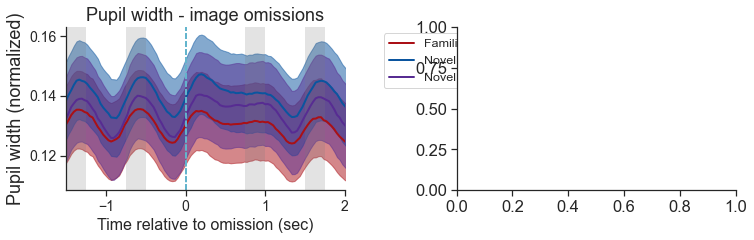

In [ ]:
df = pupil_omission_mdf.copy()
# set baseline to zero instead of 1
df['mean_trace'] = [mean_trace-1 for mean_trace in df.mean_trace.values]
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'pupil_width', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Pupil width - image omissions', 
                                                        suptitle=None, ylabel='Pupil width (normalized)', xlabel='Time relative to omission (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Pupil width (norm.)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

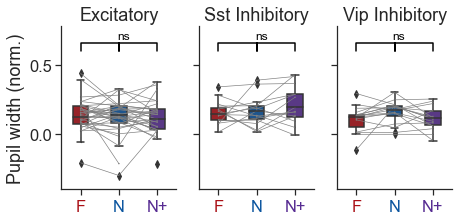

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'avg. pupil width\nafter omissions\n(normalized)'
ylabel = 'Pupil width (norm.)'

event_type = 'omissions'

ylims = (-0.4, 0.6)

metrics_table = pupil_omission_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, stripplot=False, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:869: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  # add stats to plot if only looking at experience levels


saving_stats


<AxesSubplot:ylabel='Pupil width (norm.)'>

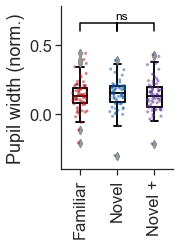

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Pupil width (norm.)'
event_type = 'omissions'

ylims = (-0.4, 0.6)

metrics_table = pupil_omission_mdf.copy()
# set baseline to 0 instead of 1
metrics_table['mean_response'] = metrics_table.mean_response - 1

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width',
                                                        ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

### lick rate

In [ ]:
# params for stim response df creation
event_type = 'all'
data_type = 'lick_rate'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

lick_rate_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

lick_rate_mdf = lick_rate_mdf[lick_rate_mdf.is_change==True]
lick_rate_mdf = lick_rate_mdf.drop_duplicates(subset='behavior_session_id')
lick_rate_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in lick_rate_mdf.experience_level.values]

# limit to platform xpts
lick_rate_mdf = lick_rate_mdf[lick_rate_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(lick_rate_mdf))

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_lick_rate_all_is_change_platform_experiments.pkl


  6%|▌         | 1/18 [00:02<00:47,  2.82s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:03<00:11,  1.20it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:06<00:09,  1.17it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:09<00:05,  1.31it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:11<00:03,  1.25it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:13<00:00,  1.34it/s]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:00<00:06,  2.52it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:01<00:03,  4.24it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:02<00:02,  4.03it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:02<00:02,  3.49it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:03<00:01,  4.27it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:03<00:00,  4.65it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:00<00:10,  1.59it/s]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:01<00:03,  4.01it/s]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 44%|████▍     | 8/18 [00:02<00:02,  3.36it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:04<00:02,  2.47it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:04<00:01,  2.93it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:05<00:00,  3.31it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:00<00:03,  4.88it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:01<00:03,  3.10it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:02<00:02,  3.14it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:03<00:01,  3.20it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:04<00:00,  3.83it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:05<00:00,  3.52it/s]


saving multi session df to pkl
there are 1062 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 1061 experiments after filtering for inclusion criteria -  platform_experiments
202


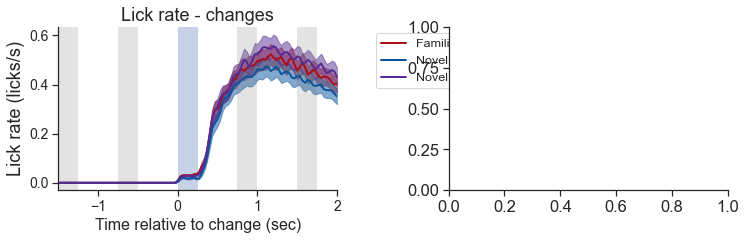

In [ ]:
df = lick_rate_mdf.copy()
# put in units of licks / sec
df['mean_trace'] = [mean_trace*10 for mean_trace in df.mean_trace.values]
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'lick_rate', 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Lick rate - changes', 
                                                        suptitle=None, ylabel='Lick rate (licks/s)',  xlabel='Time relative to change (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Lick rate (licks/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

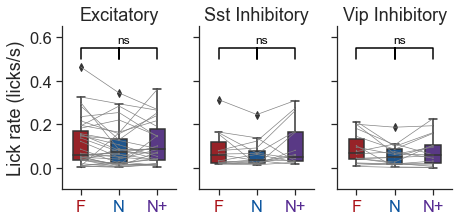

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
# ylabel = 'avg. lick rate\nafter changes'
ylabel = 'Lick rate (licks/s)'
event_type = 'changes'

ylims = (-0.1, 0.5)

metrics_table = lick_rate_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'lick_rate', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, stripplot=False, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:869: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  # add stats to plot if only looking at experience levels


saving_stats


<AxesSubplot:ylabel='Lick rate (licks/s)'>

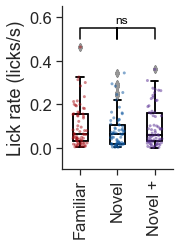

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Lick rate (licks/s)'
event_type = 'changes'

ylims = (-0.1, 0.5)

metrics_table = lick_rate_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width',
                                                        ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)

In [ ]:
# params for stim response df creation
event_type = 'all'
data_type = 'lick_rate'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

lick_rate_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

lick_rate_omission_mdf = lick_rate_omission_mdf[lick_rate_omission_mdf.omitted==True]
lick_rate_omission_mdf = lick_rate_omission_mdf.drop_duplicates(subset='behavior_session_id')
lick_rate_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in lick_rate_omission_mdf.experience_level.values]

# limit to platform xpts
lick_rate_omission_mdf = lick_rate_omission_mdf[lick_rate_omission_mdf.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
print(len(lick_rate_omission_mdf))

C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
mean_response_df_lick_rate_all_omitted_platform_experiments.pkl


  6%|▌         | 1/18 [00:01<00:28,  1.65s/it]

no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_1_images_G


 22%|██▏       | 4/18 [00:02<00:09,  1.53it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_B_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:05<00:09,  1.19it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_B
no multi_session_df for VisualBehaviorMultiscope OPHYS_3_images_G
no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_A


 61%|██████    | 11/18 [00:08<00:05,  1.27it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_4_images_H
no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:10<00:02,  1.46it/s]

no multi_session_df for VisualBehaviorMultiscope OPHYS_5_images_H_passive
no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_A


100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


no multi_session_df for VisualBehaviorMultiscope OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_A


 11%|█         | 2/18 [00:00<00:06,  2.44it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_1_images_G
no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_A_passive


 28%|██▊       | 5/18 [00:01<00:04,  3.05it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_2_images_G_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_A


 44%|████▍     | 8/18 [00:02<00:02,  3.39it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_3_images_G


 56%|█████▌    | 10/18 [00:03<00:03,  2.31it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_4_images_H


 72%|███████▏  | 13/18 [00:04<00:01,  2.61it/s]

no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_B_passive
no multi_session_df for VisualBehaviorTask1B OPHYS_5_images_H_passive


100%|██████████| 18/18 [00:05<00:00,  3.13it/s]


no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_B
no multi_session_df for VisualBehaviorTask1B OPHYS_6_images_H


  6%|▌         | 1/18 [00:00<00:15,  1.12it/s]

no multi_session_df for VisualBehavior OPHYS_1_images_B
no multi_session_df for VisualBehavior OPHYS_1_images_G


 22%|██▏       | 4/18 [00:01<00:05,  2.59it/s]

no multi_session_df for VisualBehavior OPHYS_2_images_B_passive
no multi_session_df for VisualBehavior OPHYS_2_images_G_passive


 39%|███▉      | 7/18 [00:02<00:04,  2.66it/s]

no multi_session_df for VisualBehavior OPHYS_3_images_B
no multi_session_df for VisualBehavior OPHYS_3_images_G
no multi_session_df for VisualBehavior OPHYS_4_images_A


 61%|██████    | 11/18 [00:03<00:01,  3.54it/s]

no multi_session_df for VisualBehavior OPHYS_4_images_H
no multi_session_df for VisualBehavior OPHYS_5_images_A_passive


 78%|███████▊  | 14/18 [00:04<00:00,  4.04it/s]

no multi_session_df for VisualBehavior OPHYS_5_images_H_passive
no multi_session_df for VisualBehavior OPHYS_6_images_A


100%|██████████| 18/18 [00:04<00:00,  3.76it/s]


no multi_session_df for VisualBehavior OPHYS_6_images_H


  0%|          | 0/18 [00:00<?, ?it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_1_images_B


 17%|█▋        | 3/18 [00:01<00:05,  2.82it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_2_images_B_passive


 33%|███▎      | 6/18 [00:02<00:05,  2.11it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_3_images_B


 50%|█████     | 9/18 [00:03<00:03,  2.34it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_4_images_B


 67%|██████▋   | 12/18 [00:04<00:02,  2.74it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_A_passive
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_5_images_B_passive


 83%|████████▎ | 15/18 [00:05<00:00,  3.00it/s]

no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_A
no multi_session_df for VisualBehaviorMultiscope4areasx2d OPHYS_6_images_B


100%|██████████| 18/18 [00:06<00:00,  2.81it/s]


saving multi session df to pkl
there are 1062 experiments in the full multi_session_df


C:\Users\marinag\Documents\Code\AllenSDK\allensdk\api\cloud_cache\cloud_cache.py:521: OutdatedManifestWarning: You are loading visual-behavior-ophys_project_manifest_v1.0.1.json. A more up to date version of the dataset -- visual-behavior-ophys_project_manifest_v1.1.0.json -- exists online. To see the changes between the two versions of the dataset, run
VisualBehaviorOphysProjectCache.compare_manifests('visual-behavior-ophys_project_manifest_v1.0.1.json', 'visual-behavior-ophys_project_manifest_v1.1.0.json')
To load another version of the dataset, run
VisualBehaviorOphysProjectCache.load_manifest('visual-behavior-ophys_project_manifest_v1.1.0.json')
  warnings.warn(msg, OutdatedManifestWarning)


removing 1 problematic experiments
there are 1061 experiments after filtering for inclusion criteria -  platform_experiments
202


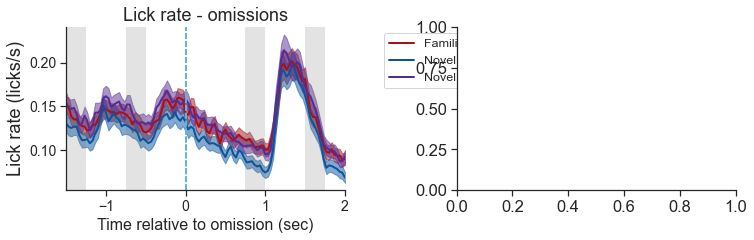

In [ ]:
df = lick_rate_omission_mdf.copy()
# put in units of licks / sec
df['mean_trace'] = [mean_trace*10 for mean_trace in df.mean_trace.values]
df['expts'] = 'all'

axes_column = 'expts'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_overlay'

ax = ppf.plot_population_averages_for_conditions(df, 'lick_rate', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title='Lick rate - omissions', 
                                                        suptitle=None, ylabel='Lick rate (licks/s)',  xlabel='Time relative to omission (sec)',
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='Lick rate (licks/s)'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}>], dtype=object)

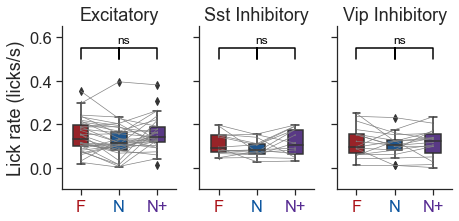

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Lick rate (licks/s)'
event_type = 'omissions'

ylims = (-0.1, 0.5)

metrics_table = lick_rate_omission_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience(metrics_table, metric, event_type, 'lick_rate', ylabel=ylabel, ylims=ylims, 
                                            horiz=True, stripplot=False, show_containers=True, save_dir=save_dir)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:869: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  # add stats to plot if only looking at experience levels


saving_stats


<AxesSubplot:ylabel='Lick rate (licks/s)'>

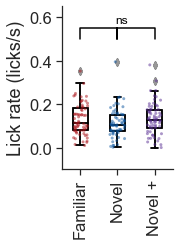

In [ ]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'Lick rate (licks/s)'
event_type = 'omissions'

ylims = (-0.1, 0.5)

metrics_table = lick_rate_omission_mdf.copy()
# put in units of licks / sec
metrics_table['mean_response'] = metrics_table.mean_response * 10


ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, 'pupil_width',
                                                        ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)


# ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
#                                             add_zero_line=False, save_dir=save_dir)